# Table of contents
1. [Data Loading and Exploratory Analysis](#1)
    1. [Describe the data](#1.1)
    2. [Distribution of the Variables](#1.2)
2. [Testing Normality and Association using Statistical Tests](#2)
    1. [Variables Associated with Outcome1/Outcome2](#2.1)
    2. [Not Normally Distributed Variables](#2.2)
    3. [EDA and Correlations Between Variables and Outcomes](#2.3)
3. [Training a Machine Learning Model](#3)
    1. [Data Preparation](#3.1)
    2. [Results](#3.2)
4. [Variables to Detect Differences between Cases of Outcome1 and Outcome2](#4)
5. [Discussion](#5)
6. [Future Direction](#6)

In [72]:
# import necessary packages

%matplotlib inline
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')
import IPython.display

# significance testing
from statsmodels.graphics.gofplots import qqplot
import scipy.stats as stats
from scipy.stats import shapiro
from scipy.stats import chi2_contingency
from scipy.stats import boxcox
from scipy.stats.mstats import winsorize
from scipy.stats import levene

# Machine learning
from sklearn.model_selection import StratifiedShuffleSplit
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import statistics

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import recall_score, precision_score, roc_auc_score

import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

pd.options.display.max_columns = None

np.random.seed(1)  # random seed 

# 1 - Data Loading and Exploratory Analysis <a name="1"></a>

In [73]:
df = pd.read_csv("analysis_test_ready (2) (1).txt", sep="\t")
df.head()

,Subject_ID2,variable1,variable2,variable4,outcome1,variable6,variable7,variable8,variable9,variable10,variable11,variable12,variable13,variable14,variable15,variable16,variable17,variable18,variable19,variable20,variable21,variable22,variable23,variable24,variable25,variable26,variable27,variable28,variable29,variable30,variable31,variable32,variable33,variable34,variable35,variable36,variable37,variable38,variable39,variable40,variable41,outcome2,variable43,variable44,variable45,variable46,variable47,variable48,variable49,variable50,variable51,variable52,variable53,variable54,variable55,variable56,variable57,variable58,variable59,variable60,variable61,variable62,variable63,variable64,variable65,variable66,variable67,variable68,variable69,variable70,variable71,variable72,variable73,variable74,variable75,variable76,variable77,variable78,variable79,variable80,variable81,variable82,variable83,variable84,variable85,variable86,variable87,variable88,variable89,variable90,variable91,variable92,variable93,variable94,variable95,variable96,variable97,variable98,variable99,variable100,variable101,variable102,variable103,variable104,variable105,variable106,variable107,variable108,variable109,variable110,variable111,variable112,variable113,variable114,variable115,variable116,variable117,variable118,variable119,variable120,variable121,variable122,variable123,variable124,variable125,variable126,variable127,variable128,variable129,variable130,variable131,variable132,variable133,variable134,variable135,variable136,variable137,variable138
0,SUBJ_1,56.608219,Male,1243,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0,0,0,-0.520309,0.041657,-0.748574,-0.686991,0.105298,-0.846719,0.780449,-0.320726,-0.173394,-1.395136,0.627909,0.502229,-0.333279,-0.947558,-1.354324,-1.018281,-0.972713,-1.005049,-0.131260,0.769737,0.409787,-0.637600,-0.764415,0.623086,-0.242304,-0.375514,0.205700,-0.388312,-0.193562,0.796687,0.230069,0.053569,1.169782,0.337474,1.218323,1.005049,-0.681978,-0.738118,0.375514,-0.105298,-1.784348,-0.021816,-0.561632,1.374444,0.929079,-1.131341,0.367015,-1.616378,0.570943,-0.947558,-0.841056,0.324905,-0.414105,0.813137,-0.642468,-0.291630,-0.197605,-0.775082,0.642468,-0.743336,-1.269918,-0.991990,-0.875450,-0.085377,-1.243707,-0.524856,-0.796687,-0.608703,-0.966367,-0.732919,-0.422763,0.743336,0.105298,0.193562,-1.711302,0.250481,-0.796687,-1.201827,-0.117271,0.149285,0.137263,0.177422,-1.052170,-1.161956,0.193562,-0.025783,-1.354324,-0.991990,-1.306285,0.109287,-0.418430,0.258675
1,SUBJ_2,42.928767,Male,972,1.0,1.0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1.0,0.0,0,0,0,0.813137,-1.484568,1.508881,-0.727741,2.169256,1.868382,-0.904923,1.059094,2.823730,-0.209753,0.345883,0.991990,2.655828,-0.009916,0.511248,2.169256,2.026422,3.159154,-1.521380,1.449665,0.780449,1.728711,-1.534121,-0.991990,-1.052170,-0.009916,0.637600,0.887147,1.169782,0.515773,1.547115,0.802146,-0.479857,0.113278,-1.868382,2.823730,2.378037,-0.414105,1.996440,2.378037,2.451139,-0.785839,0.440175,0.738118,1.278851,0.193562,0.637600,2.261405,-1.868382,2.823730,1.824755,-1.344467,0.748574,2.823730,1.261084,1.784348,1.325134,1.804184,0.457722,-1.315651,-0.759113,1.601902,1.252348,1.354324,0.185486,1.116424,-0.283363,-0.001983,1.226696,1.484568,-0.448932,1.728711,1.784348,1.846129,1.534121,-0.001983,0.329089,2.451139,2.823730,0.193562,1.784348,2.129319,2.451139,-0.279237,-1.765191,1.694397,0.141268,2.655828,1.573918,-1.868382,2.092516,1.066069
2,SUBJ_3,45.810959,Male,703,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0.0,0.0,0,1,0,-0.556994,1.066069,0.966367,0.453323,0.667040,1.484568,0.392593,0.743336,0.732919,2.261405,1.587755,-0.053569,1.616378,-0.133261,2.451139,1.728711,0.991990,1.646390,1.218323,1.891600,0.193562,0.681978,1.746661,-1.334738,-0.435810,1.018281,-0.618278,0.238222,1.374444,0.197605,0.852409,0.692021,0.157311,-0.371261,0.063502,1.804184,1.661969,0.515773,-0.

We are predicting 2 outcomes (outcome1 and outcome2) using the predictors variable1:variable138 (some numbers like variable3 are missing) for a total of 90 predictors (variables)

## 1.1 Describe the data <a name="1.1"></a>

In [74]:
df.describe()

,variable1,variable4,outcome1,variable6,variable7,variable8,variable9,variable10,variable11,variable12,variable13,variable14,variable15,variable16,variable17,variable18,variable19,variable20,variable21,variable22,variable23,variable24,variable25,variable26,variable27,variable28,variable29,variable30,variable31,variable32,variable33,variable34,variable35,variable36,variable37,variable38,variable39,variable40,variable41,outcome2,variable43,variable44,variable45,variable46,variable47,variable48,variable49,variable50,variable51,variable52,variable53,variable54,variable55,variable56,variable57,variable58,variable59,variable60,variable61,variable62,variable63,variable64,variable65,variable66,variable67,variable68,variable69,variable70,variable71,variable72,variable73,variable74,variable75,variable76,variable77,variable78,variable79,variable80,variable81,variable82,variable83,variable84,variable85,variable86,variable87,variable88,variable89,variable90,variable91,variable92,variable93,variable94,variable95,variable96,variable97,variable98,variable99,variable100,variable101,variable102,variable103,variable104,variable105,variable106,variable107,variable108,variable109,variable110,variable111,variable112,variable113,variable114,variable115,variable116,variable117,variable118,variable119,variable120,variable121,variable122,variable123,variable124,variable125,variable126,variable127,variable128,variable129,variable130,variable131,variable132,variable133,variable134,variable135,variable136,variable137,variable138
count,493.000000,493.000000,484.000000,483.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.0,493.0,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.00000,493.000000,492.000000,492.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000,493.000000
mean,62.060324,621.872211,0.528926,0.457557,0.474645,0.365112,0.413793,0.014199,0.030426,0.0,0.0,0.040568,0.006085,0.016227,0.014199,0.042596,0.002028,0.018256,0.026369,0.077079,0.166329,0.036511,0.008114,0.008114,0.042596,0.064909,0.154158,0.081136,0.204868,0.095335,0.344828,0.030426,0.002028,0.290061,0.227181,0.014199,0.117647,0.03854,0.387424,0.150407,0.540650,0.107505,0.328600,0.417850,0.133553,0.156136,0.134252,0.113002,0.183679,0.155740,0.183743,0.069910,0.186586,0.144460,0.073310,0.128795,0.214234,0.178826,0.060359,0.128551,0.203386,0.146931,0.095790,0.224248,0.212600,0.195949,0.177500,0.209571,0.205383,0.135983,0.173615,0.233759,0.097358,0.027584,0.088601,0.097574,0.334298,0.140637,0.194744,0.034253,0.112278,0.222397,0.072246,0.079632,0.075354,0.214476,0.120075,0.042398,0.147750,0.124729,0.207288,0.116759,0.218664,0.180815,0.130849,0.227707,0.204077,0.147674,0.111120,0.199075,0.228128,0.148175,0.182151,0.171942,0.089821,0.122749,0.036581,0.079349,0.139271,0.190

We see that variable12 and variable13 columns are all zeros, meaning we can safely remove these columns as these will not provide any additional information. 

Now let's see if we have any missing entries.

In [75]:
df.isna().sum()[df.isna().sum() > 0].sort_values()

outcome2       1
variable43     1
outcome1       9
variable6     10
dtype: int64

We have missing values in our outcomes columns. Since we cannot impute outcome values, we check if the missing entries in variable6 and variable43 also are with the rows with missing outcome values.

In [76]:
df[df.outcome2.isna() | df.outcome1.isna()][["variable6", "variable43", "outcome1", "outcome2"]]

,variable6,variable43,outcome1,outcome2
28,NaN,1.0,NaN,0.0
46,NaN,1.0,NaN,0.0
148,NaN,0.0,NaN,0.0
198,NaN,0.0,NaN,0.0
240,NaN,1.0,NaN,0.0
242,NaN,1.0,NaN,0.0
312,1.0,NaN,1.0,NaN
366,NaN,1.0,NaN,0.0
388,NaN,1.0,NaN,0.0
409,NaN,0.0,NaN,0.0


No subject appears to have both outcome1 and outcome2 missing. This means we can use each row to train our machine learnign model on predicting outcome1, outcome2, or both. We note that all the rows with no outcome1 entries have no variable6 entries either. In addition, the row with the missing outcome2 value also has the missing variable43 value missing as well. 


Since there is only one missing variable43 entry, we can impute this entry using the median of the variable43 column. However, we need to check if there is an association with the missing variable6 and outcome2 since there are 10 missing values from variable6 in total. 

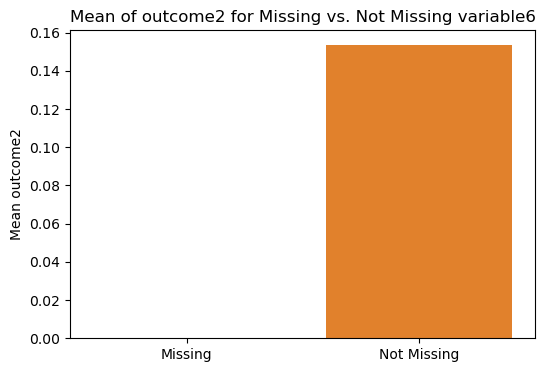

In [77]:
fig, ax = plt.subplots(figsize=(6, 4))
ax = sns.barplot(x=["Missing", "Not Missing"], 
            y=[df[df["variable6"].isna()].outcome2.mean(), df[~df["variable6"].isna()].outcome2.mean()])
ax.set_title("Mean of outcome2 for Missing vs. Not Missing variable6")
ax.set_ylabel("Mean outcome2")
plt.show()

It appears that all the rows with missing variable6 values have outcome2 values of 0, while the other rows without missing variable6 values have a mean of outcome1 values with a mix of ones and zeros. This indicates there could be an association between outcome2 and the missing values of variable6. We now look at the distribution of values in variable6 to decide which value to impute with.

In [78]:
# Distribution of values in variable6
df.variable6.value_counts()

variable6
0.0    262
1.0    221
Name: count, dtype: int64

We note that variable6 is a categorical variable with values of 0 and 1. The distribution of values appears to be more skewed toward values of zero, so we impute the rows with missing variable6 values with zero (the mode). 

In [79]:
df['variable43'].value_counts()

variable43
1.0    266
0.0    226
Name: count, dtype: int64

We also note that variable43 is a categorical variable with values of 0 and 1. This distribution is also skewed toward values of one, meaning the median of this distribution also equals the mode of the distribution.

In summary, we impute the variable6 column with the mode of the distribution and the variable43 column with the median/mode of the distribution. We also remove columns variable12, variable13, and Subject_ID2.

In [80]:
df['variable6'] = df['variable6'].fillna(value=df.mode(dropna=True)['variable6'][0])
df['variable43'] = df['variable43'].fillna(df['variable43'].median(skipna=True))

df.isna().sum()[df.isna().sum() > 0]

outcome1    9
outcome2    1
dtype: int64

Now that all of the columns besides the outcome columns have their NaN values removed, we must check for categorical and continuous variables and ensure their values remain consistent. Variable2 contains genders, which should be encoded to numbers instead for training the machine learning model.

In [81]:
df.variable2.value_counts()

variable2
Male      299
Female    194
Name: count, dtype: int64

In [82]:
df['variable2'].replace({'Female':0, 'Male':1}, inplace=True)
df.variable2.value_counts()

variable2
1    299
0    194
Name: count, dtype: int64

In [83]:
df = df.drop(['variable12', 'variable13', "Subject_ID2"], axis=1)
df.head()

,variable1,variable2,variable4,outcome1,variable6,variable7,variable8,variable9,variable10,variable11,variable14,variable15,variable16,variable17,variable18,variable19,variable20,variable21,variable22,variable23,variable24,variable25,variable26,variable27,variable28,variable29,variable30,variable31,variable32,variable33,variable34,variable35,variable36,variable37,variable38,variable39,variable40,variable41,outcome2,variable43,variable44,variable45,variable46,variable47,variable48,variable49,variable50,variable51,variable52,variable53,variable54,variable55,variable56,variable57,variable58,variable59,variable60,variable61,variable62,variable63,variable64,variable65,variable66,variable67,variable68,variable69,variable70,variable71,variable72,variable73,variable74,variable75,variable76,variable77,variable78,variable79,variable80,variable81,variable82,variable83,variable84,variable85,variable86,variable87,variable88,variable89,variable90,variable91,variable92,variable93,variable94,variable95,variable96,variable97,variable98,variable99,variable100,variable101,variable102,variable103,variable104,variable105,variable106,variable107,variable108,variable109,variable110,variable111,variable112,variable113,variable114,variable115,variable116,variable117,variable118,variable119,variable120,variable121,variable122,variable123,variable124,variable125,variable126,variable127,variable128,variable129,variable130,variable131,variable132,variable133,variable134,variable135,variable136,variable137,variable138
0,56.608219,1,1243,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0,0,0,-0.520309,0.041657,-0.748574,-0.686991,0.105298,-0.846719,0.780449,-0.320726,-0.173394,-1.395136,0.627909,0.502229,-0.333279,-0.947558,-1.354324,-1.018281,-0.972713,-1.005049,-0.131260,0.769737,0.409787,-0.637600,-0.764415,0.623086,-0.242304,-0.375514,0.205700,-0.388312,-0.193562,0.796687,0.230069,0.053569,1.169782,0.337474,1.218323,1.005049,-0.681978,-0.738118,0.375514,-0.105298,-1.784348,-0.021816,-0.561632,1.374444,0.929079,-1.131341,0.367015,-1.616378,0.570943,-0.947558,-0.841056,0.324905,-0.414105,0.813137,-0.642468,-0.291630,-0.197605,-0.775082,0.642468,-0.743336,-1.269918,-0.991990,-0.875450,-0.085377,-1.243707,-0.524856,-0.796687,-0.608703,-0.966367,-0.732919,-0.422763,0.743336,0.105298,0.193562,-1.711302,0.250481,-0.796687,-1.201827,-0.117271,0.149285,0.137263,0.177422,-1.052170,-1.161956,0.193562,-0.025783,-1.354324,-0.991990,-1.306285,0.109287,-0.418430,0.258675
1,42.928767,1,972,1.0,1.0,1,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1.0,0.0,0,0,0,0.813137,-1.484568,1.508881,-0.727741,2.169256,1.868382,-0.904923,1.059094,2.823730,-0.209753,0.345883,0.991990,2.655828,-0.009916,0.511248,2.169256,2.026422,3.159154,-1.521380,1.449665,0.780449,1.728711,-1.534121,-0.991990,-1.052170,-0.009916,0.637600,0.887147,1.169782,0.515773,1.547115,0.802146,-0.479857,0.113278,-1.868382,2.823730,2.378037,-0.414105,1.996440,2.378037,2.451139,-0.785839,0.440175,0.738118,1.278851,0.193562,0.637600,2.261405,-1.868382,2.823730,1.824755,-1.344467,0.748574,2.823730,1.261084,1.784348,1.325134,1.804184,0.457722,-1.315651,-0.759113,1.601902,1.252348,1.354324,0.185486,1.116424,-0.283363,-0.001983,1.226696,1.484568,-0.448932,1.728711,1.784348,1.846129,1.534121,-0.001983,0.329089,2.451139,2.823730,0.193562,1.784348,2.129319,2.451139,-0.279237,-1.765191,1.694397,0.141268,2.655828,1.573918,-1.868382,2.092516,1.066069
2,45.810959,1,703,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0.0,0.0,0,1,0,-0.556994,1.066069,0.966367,0.453323,0.667040,1.484568,0.392593,0.743336,0.732919,2.261405,1.587755,-0.053569,1.616378,-0.133261,2.451139,1.728711,0.991990,1.646390,1.218323,1.891600,0.193562,0.681978,1.746661,-1.334738,-0.435810,1.018281,-0.618278,0.238222,1.374444,0.197605,0.852409,0.692021,0.157311,-0.371261,0.063502,1.804184,1.661969,0.515773,-0.732919,1.765191,1.405710,0.852409,0.161328,2.315792,1.496614,0.129260,0.8242

## 1.2 Distribution of the Variables <a name="1.2"></a>

Distribution of Variables (Numerical and Categorical)


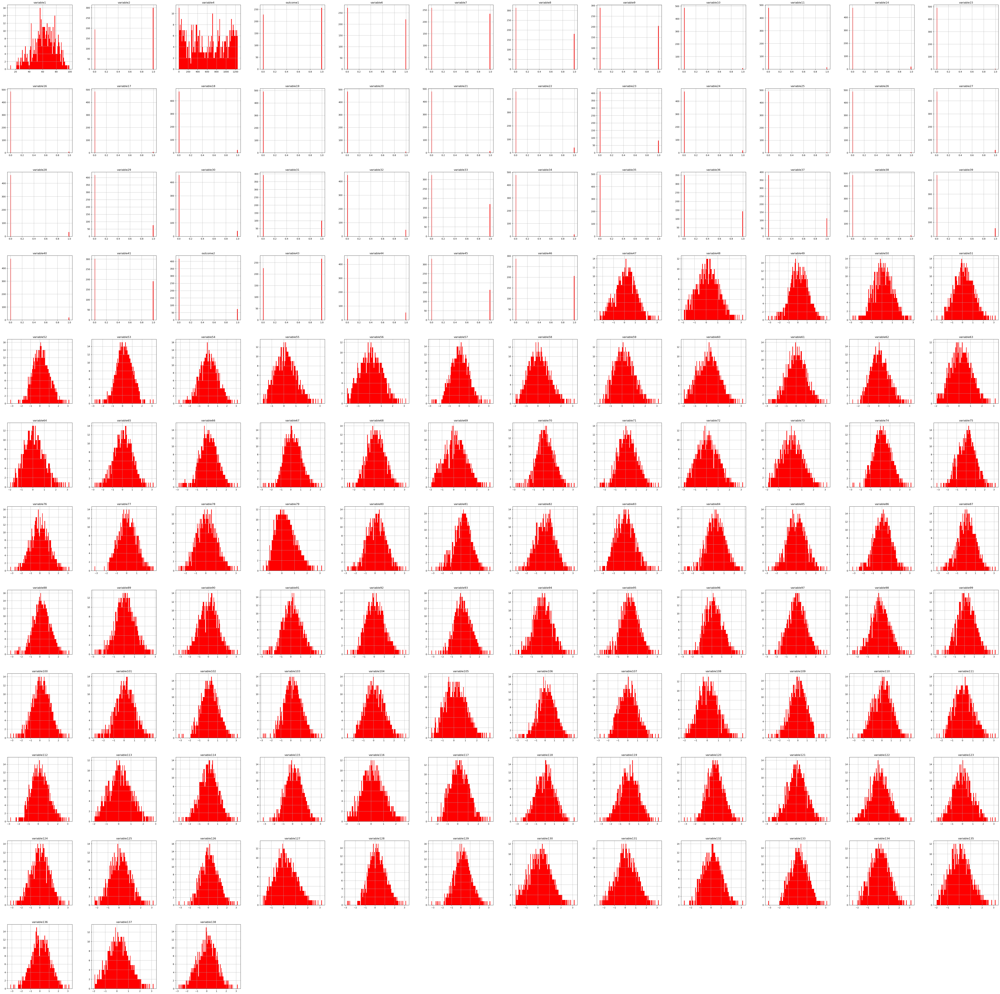

In [84]:
print("Distribution of Variables (Numerical and Categorical)")
df.hist(bins=100,figsize=(80, 80),color='red');

Distribution of Variables (Only Numerical)


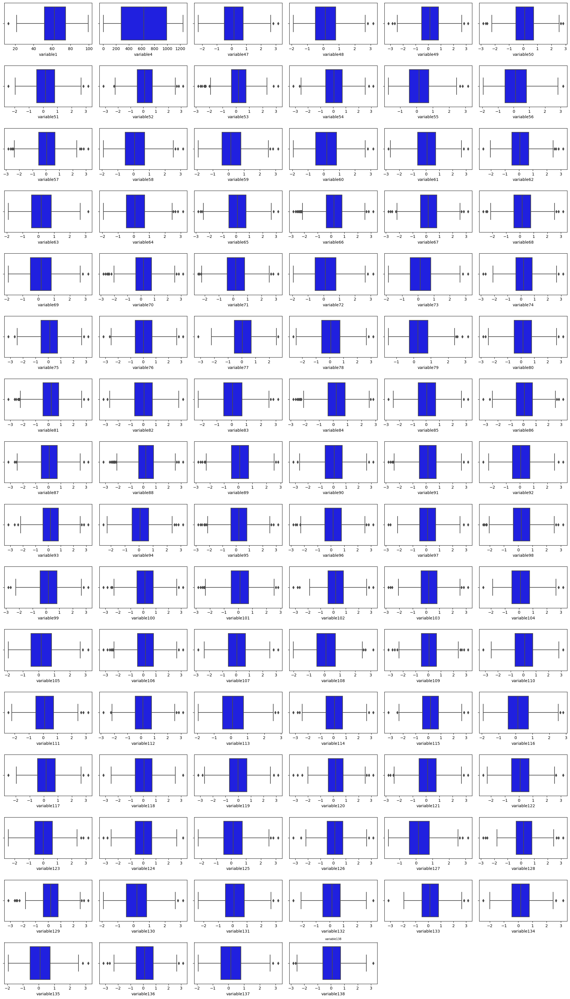

In [85]:
numerical_variables = ["variable1", "variable4"] + [f"variable{x}" for x in range(47, 139)]

fig, ax = plt.subplots(16, 6, figsize=(20, 35))
fig.delaxes(ax[15,4])
fig.delaxes(ax[15,5])

for c in range(len(numerical_variables)):
    col = c % 6
    row = int((c - col) / 6)
    
    sns.boxplot(x=df[numerical_variables[c]], color='blue', ax=ax[row, col])
    plt.title(numerical_variables[c], fontsize=7)
    
plt.tight_layout()
print("Distribution of Variables (Only Numerical)")
plt.show()

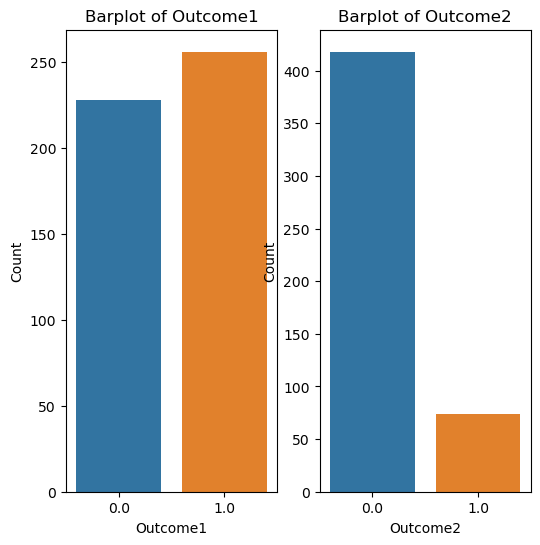

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(6,6))

sns.countplot(x='outcome1', data=df, ax=ax[0])  # Create the barplot
ax[0].set_title('Barplot of Outcome1')  # Set the title
ax[0].set_xlabel('Outcome1')  # Set the x-axis label
ax[0].set_ylabel('Count')  # Set the y-axis label

sns.countplot(x='outcome2', data=df, ax=ax[1])  # Create the barplot
ax[1].set_title('Barplot of Outcome2')  # Set the title
ax[1].set_xlabel('Outcome2')  # Set the x-axis label
ax[1].set_ylabel('Count')  # Set the y-axis label

plt.show()  # Show the plot

There appears to be class imbalance for the outcome2 variable, where there is a lot more 0 values than 1 values. This is likely to be a problem and will need to be accounted for when fitting our machine learning model. 

# 2 - Testing Normality and Association using Statistical Tests <a name="2"></a>

We now examine each variable in detail, aiming to answer these questions:
1) Is the data normally distributed (only for continuous variables)?
2) Is there an association between this variable and outcome1 and outcome2?

In [87]:
# Creating dataframes to work with for each outcome
df_outcome1 = df[~df["outcome1"].isna()]
df_outcome2 = df[~df["outcome2"].isna()]

To analyze associations between the numerical variables and the outcomes, we employ Point Bi-serial Correlation.

Assumptions of Point Bi-serial Correlation for continous variables
1) No outliers for continuous variable
2) Continous variable should be approximately normally distributed
3) Continuous variable should have equal variance for each class of dichotomous variable

To handle outliers, we check for outliers and winsorize using values between 0.01 and 0.99 quartiles. Winsorization is used rather than trimming since we do not appear to have any extreme outliers given the boxplots of each of the variables earlier. 

We check for normal distributions using the Shapiro-Wilks normality test. If the distribution is not normal, we first try winsorization then perform log, inverse, and Box-Cox transformations on the data and choose the one with the highest test statistic (highest p-value). 

We check for equal variance in the continous variables for each class of outcome1 and outcome2 using the Levene Test of Equal Variance.

Point Bi-serial correlation is used to test for association between continuous variables and outcomes.

We perform Chi square correlation test for the categorical variables, which are binary, to check for association with the outcomes.

In [88]:
def inverse(x):
    return 1/x

transformations = {
    "winsorize": winsorize,
    "log": np.log1p,
    "inverse": inverse,
    "boxcox": boxcox
}

transforms_keys = [i for i in transformations.keys()]

def transform_variable(data):
    pvals = []
    for k in transforms_keys:
        if k == "boxcox":
            minimum = min(data)
            arr = np.array(data) - minimum + 1
            stat, p = shapiro(transformations.get(k)(arr)[0])
            pvals.append(p)
        elif (k == "log") :
            minimum = min(data)
            arr = np.array(data) - minimum + 1
            stat, p = shapiro(transformations.get(k)(arr))
            pvals.append(p)
        elif k == "winsorize":
            stat, p = shapiro(transformations.get(k)(data))
            pvals.append(p)
        else:
            stat, p = shapiro(transformations.get(k)(data))
            pvals.append(p)
    m = max(pvals)
    index = pvals.index(m)
    return transforms_keys[index], m


def normality_test_continuous(variable):
    print(f"====================== Normality Test for {variable} ================================")
    data = df[variable]
    assumptions_met = True
    fig, ax = plt.subplots(2, 2, figsize=(8, 8))
    stat, p = shapiro(data)
    print("Shapiro-Wilks Normality Test p-value: ", "{:.4f}".format(p))
    
    if p < 0.05:
        data = winsorize(df[variable], limits=[0.01, 0.01])
        transform_f, pval = transform_variable(data)
        print(f"{transform_f} transform p-value: ", "{:.4f}".format(pval))
        if (pval >= 0.05):
            print("-- Normal distribution asssumption met")
        else:
            print("-- Normal distribution assumption NOT met")
            assumptions_met = False
    else:
        data = df[variable]
        print("-- Normal distribution asssumption met")
        
    outcome1_data = data[df_outcome1.index]
    outcome2_data = data[df_outcome2.index]
    stat, pval = levene(outcome1_data, outcome2_data)
    
    print("Levene Equal Variance p-value: ", "{:.4f}".format(pval))
    
    if pval >= 0.05:
        print("-- Equal variance asssumption met")
    else:
        print("-- Equal variance assumption NOT met")
        assumptions_met = False
    
    _, outcome1_pvalue = stats.pointbiserialr(df_outcome1.outcome1, data[df_outcome1.index])
    print("Point-biserial correlation p-value (outcome1): ", "{:.4f}".format(outcome1_pvalue))
    _, outcome2_pvalue = stats.pointbiserialr(df_outcome2.outcome2, data[df_outcome2.index])
    print("Point-biserial correlation p-value (outcome2): ", "{:.4f}".format(outcome2_pvalue))

    sns.histplot(data=df, x=variable, kde=True, ax=ax[0,0]);
    qqplot(df[variable], line='s', ax=ax[0,1]);
    sns.boxplot(data=df_outcome1, x="outcome1", y=variable, ax=ax[1,0])
    sns.boxplot(data=df_outcome2, x="outcome2", y=variable, ax=ax[1,1])

    ax[0,0].set_title("Histogram")
    ax[0,1].set_title("QQ plot")
    ax[1,0].set_title("Outcome1 Types")
    ax[1,1].set_title("Outcome2 Types")
    plt.tight_layout()
    plt.show()
    return p, outcome1_pvalue, outcome2_pvalue, assumptions_met

def normality_test_categorical(variable):
    print(f"====================== Normality Test for {variable} ================================")
    fig, ax = plt.subplots(2, 2, figsize=(8, 8))
    fig.delaxes(ax[0,1])
    
    outcome1_cross_tab = pd.crosstab(index=df_outcome1[variable],columns=df_outcome1['outcome1'])
    chi_sq_result1 = chi2_contingency(outcome1_cross_tab,)
    outcome1_pvalue = chi_sq_result1[1]
    degrees = chi_sq_result1[2]
    print(f"Chi-square Correlation Test p-value (outcome1 df={degrees}): ", "{:.4f}".format(outcome1_pvalue))
    
    outcome2_cross_tab = pd.crosstab(index=df_outcome2[variable],columns=df_outcome2['outcome2'])
    chi_sq_result2 = chi2_contingency(outcome2_cross_tab,)
    outcome2_pvalue = chi_sq_result2[1]
    degrees = chi_sq_result2[2]
    print(f"Chi-square Correlation Test p-value (outcome2 df={degrees}): ", "{:.4f}".format(outcome2_pvalue))

    sns.countplot(data=df, x=variable, ax=ax[0,0]);
    sns.countplot(data=df_outcome1, x=variable, hue="outcome1", ax=ax[1,0])
    sns.countplot(data=df_outcome2, x=variable, hue="outcome2", ax=ax[1,1])

    ax[0,0].set_title("Distribution of Values")
    ax[1,0].set_title("Distribution by Outcome1")
    ax[1,1].set_title("Distribution by Outcome2")
    plt.tight_layout()
    plt.show()
    
    return outcome1_pvalue, outcome2_pvalue, True

In [89]:
# List of categorical variables
categorical_variables = df[df.columns.difference(numerical_variables)].columns.tolist()
categorical_variables.remove("outcome1")
categorical_variables.remove("outcome2")

In [90]:
def main():
    
    d_numerical = {
        "Variable" : [],
        "Normality" : [],
        "Association with Outcome1" : [],
        "Association with Outcome2" : [],
        "Assumptions met" : []
    }
    
    for col in numerical_variables:
        p, outcome1_pvalue, outcome2_pvalue, assumptions_met = normality_test_continuous(col)
        d_numerical.get("Variable").append(col)
        d_numerical.get("Normality").append(p)
        d_numerical.get("Association with Outcome1").append(outcome1_pvalue)
        d_numerical.get("Association with Outcome2").append(outcome2_pvalue)
        d_numerical.get("Assumptions met").append(assumptions_met)
        
    d_categorical = {
        "Variable" : [],
        "Association with Outcome1" : [],
        "Association with Outcome2" : [],
        "Assumptions met" : []
    }
    
    for col in categorical_variables:
        outcome1_pvalue, outcome2_pvalue, assumptions_met = normality_test_categorical(col)
        d_categorical.get("Variable").append(col)
        d_categorical.get("Association with Outcome1").append(outcome1_pvalue)
        d_categorical.get("Association with Outcome2").append(outcome2_pvalue)
        d_categorical.get("Assumptions met").append(assumptions_met)
        
        
    return d_numerical, d_categorical

====================== Normality Test for variable1 ================================
Shapiro-Wilks Normality Test p-value:  0.0003
boxcox transform p-value:  0.0001
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9631
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0003
Point-biserial correlation p-value (outcome2):  0.0000


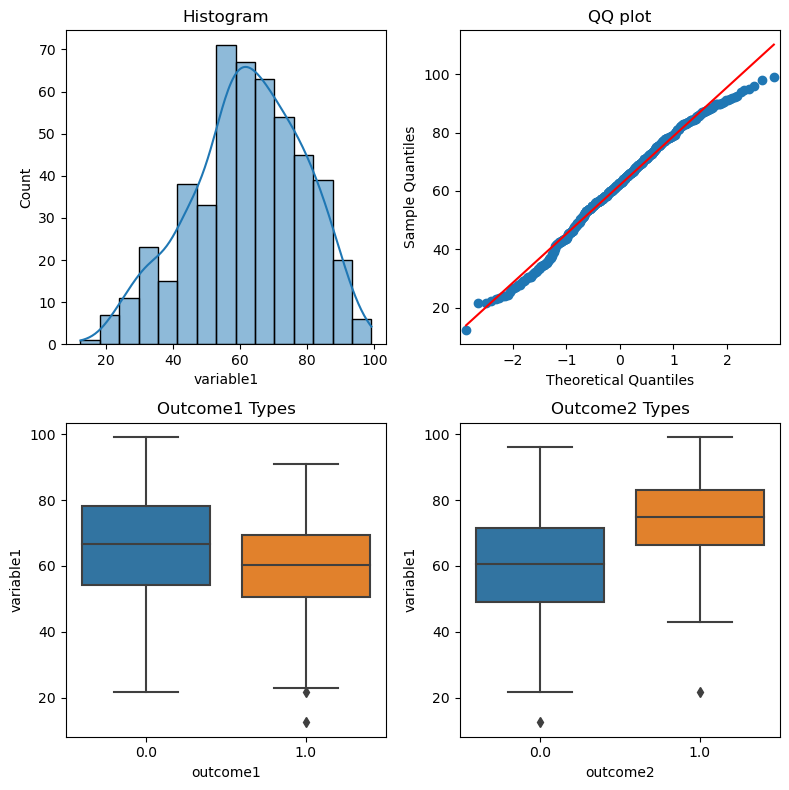

====================== Normality Test for variable4 ================================
Shapiro-Wilks Normality Test p-value:  0.0000
boxcox transform p-value:  0.0000
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9654
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3206
Point-biserial correlation p-value (outcome2):  0.1614


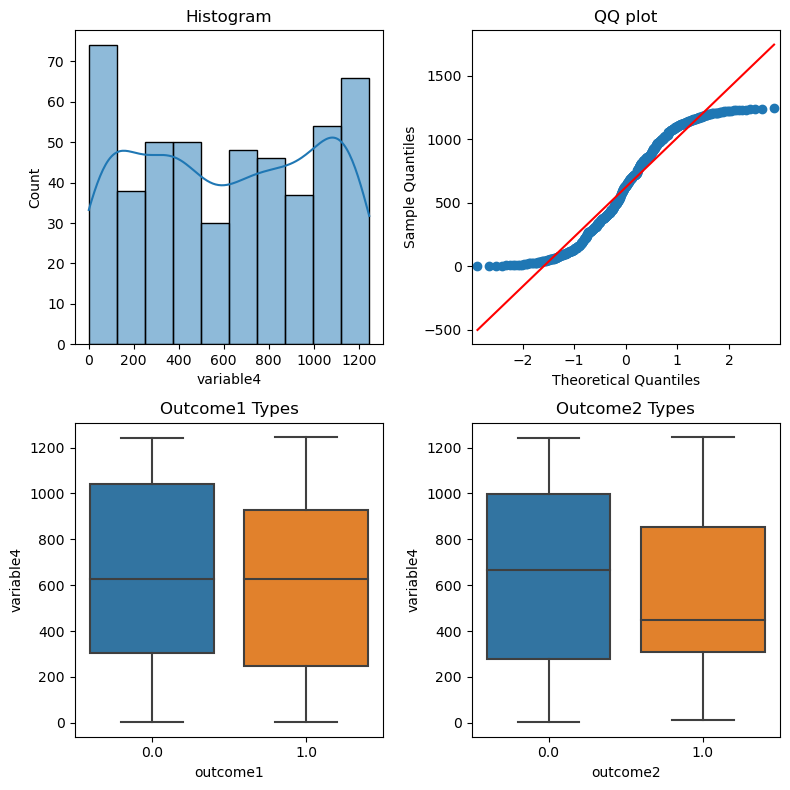

====================== Normality Test for variable47 ================================
Shapiro-Wilks Normality Test p-value:  0.3500
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8747
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0016
Point-biserial correlation p-value (outcome2):  0.0114


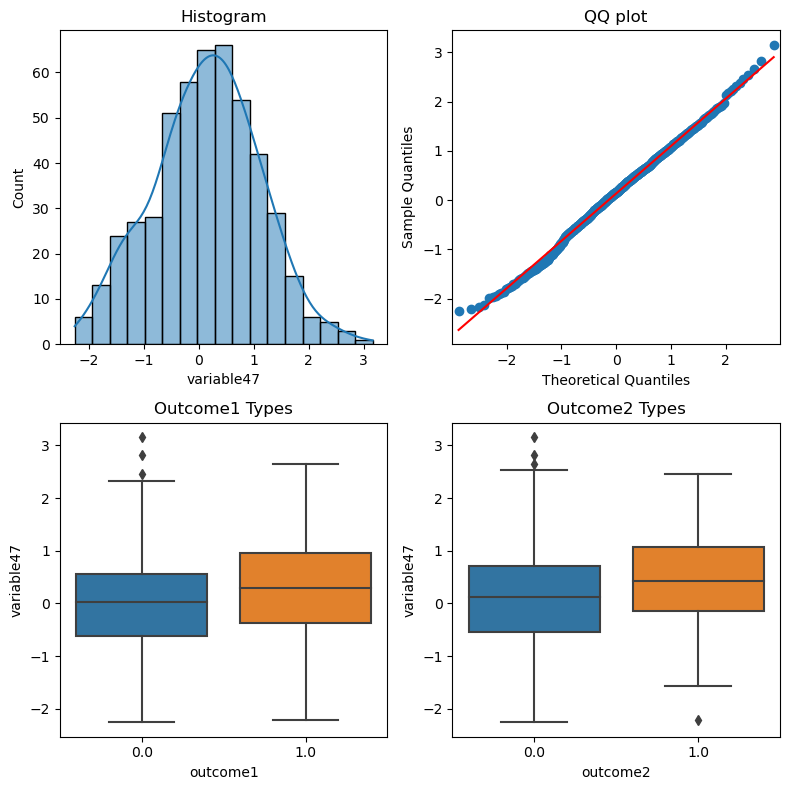

====================== Normality Test for variable48 ================================
Shapiro-Wilks Normality Test p-value:  0.0646
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8781
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9330
Point-biserial correlation p-value (outcome2):  0.0657


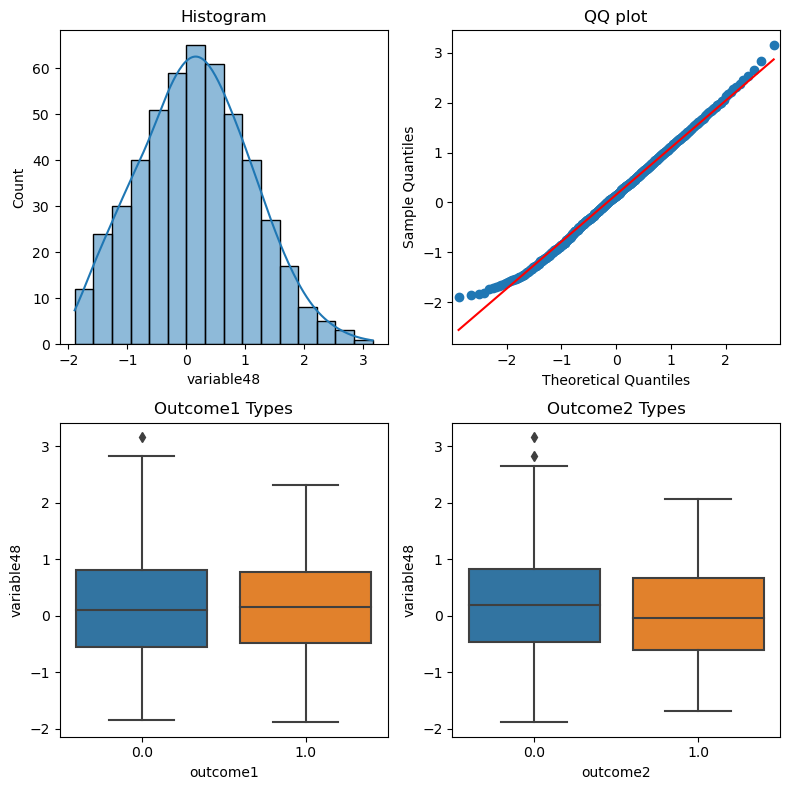

====================== Normality Test for variable49 ================================
Shapiro-Wilks Normality Test p-value:  0.9243
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9781
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


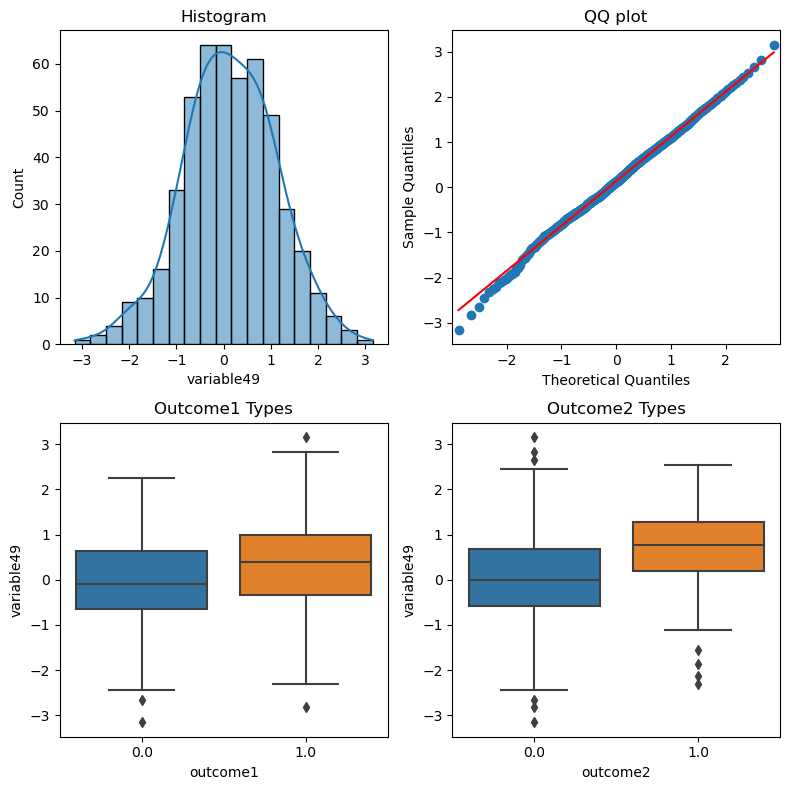

====================== Normality Test for variable50 ================================
Shapiro-Wilks Normality Test p-value:  0.9923
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8905
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0564
Point-biserial correlation p-value (outcome2):  0.0178


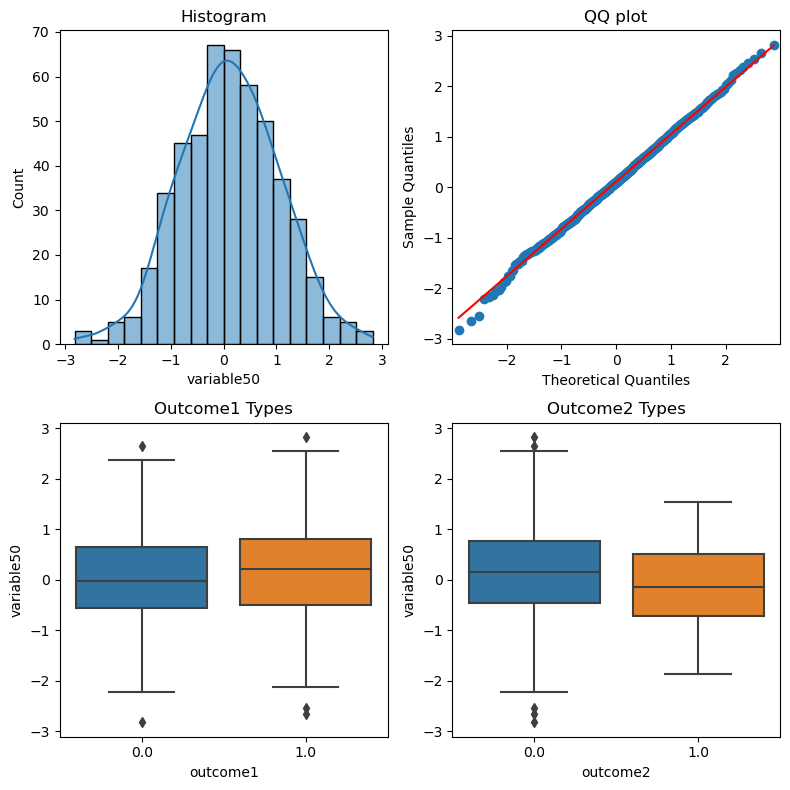

====================== Normality Test for variable51 ================================
Shapiro-Wilks Normality Test p-value:  0.6811
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8640
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0001
Point-biserial correlation p-value (outcome2):  0.0386


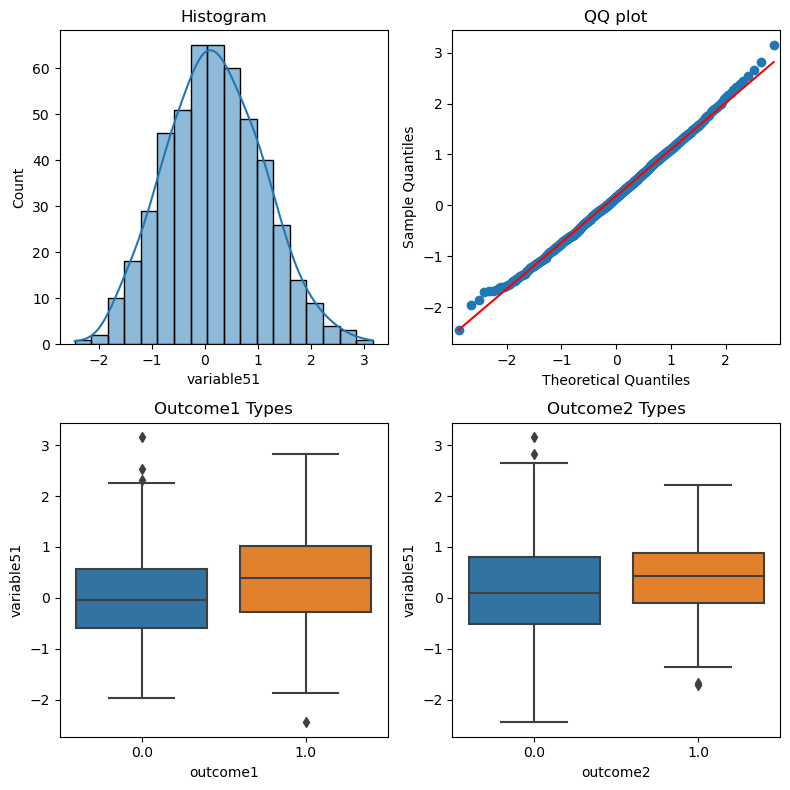

====================== Normality Test for variable52 ================================
Shapiro-Wilks Normality Test p-value:  0.5149
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.7961
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0019
Point-biserial correlation p-value (outcome2):  0.0000


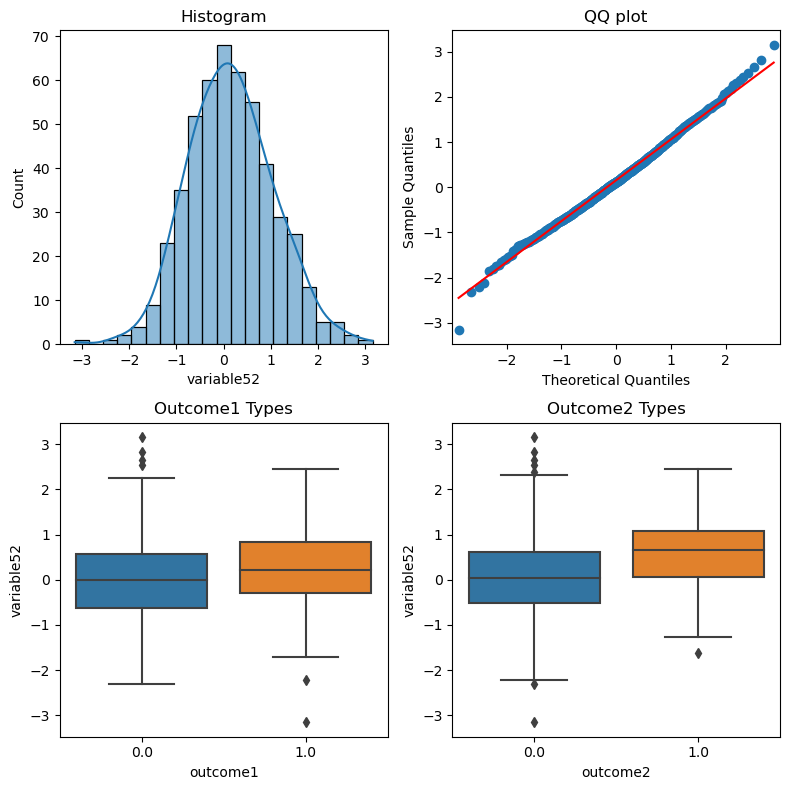

====================== Normality Test for variable53 ================================
Shapiro-Wilks Normality Test p-value:  0.0142
boxcox transform p-value:  0.3241
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9263
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0017


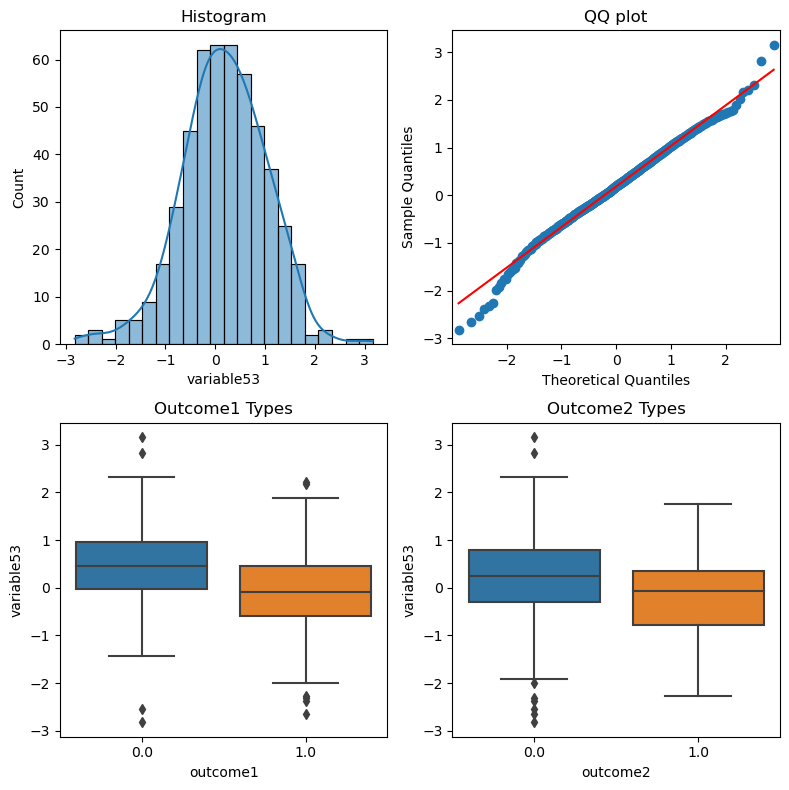

====================== Normality Test for variable54 ================================
Shapiro-Wilks Normality Test p-value:  0.9999
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9691
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0458
Point-biserial correlation p-value (outcome2):  0.0352


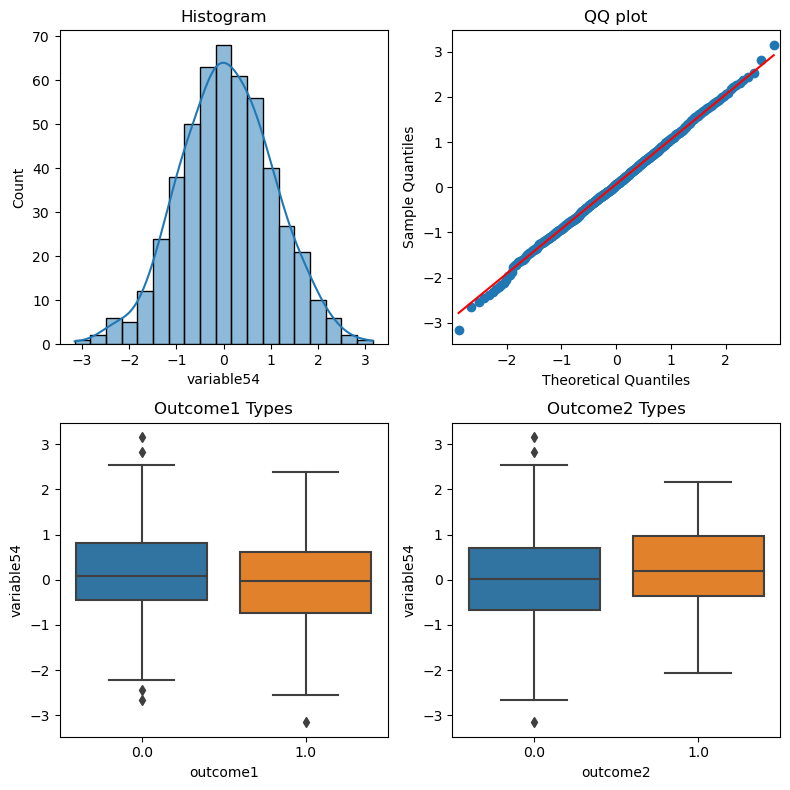

====================== Normality Test for variable55 ================================
Shapiro-Wilks Normality Test p-value:  0.0050
boxcox transform p-value:  0.0405
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9132
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


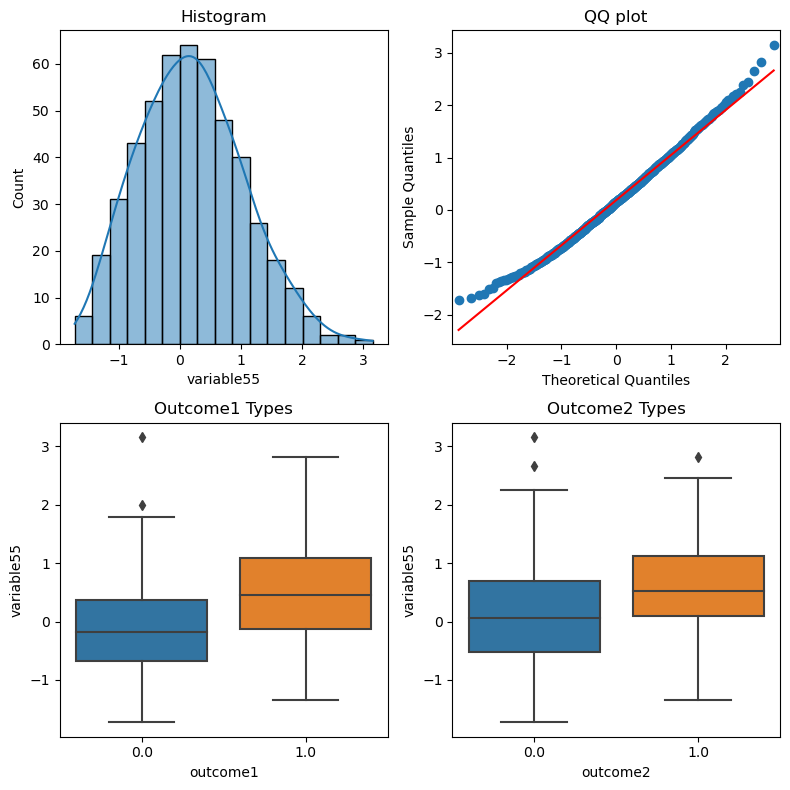

====================== Normality Test for variable56 ================================
Shapiro-Wilks Normality Test p-value:  0.0481
boxcox transform p-value:  0.0221
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9222
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0221
Point-biserial correlation p-value (outcome2):  0.1259


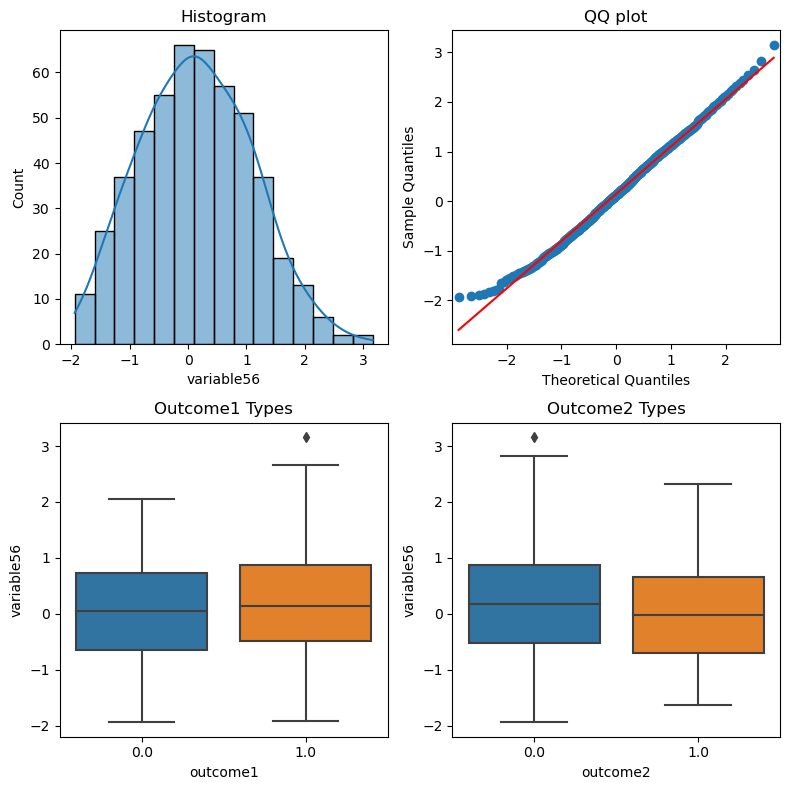

====================== Normality Test for variable57 ================================
Shapiro-Wilks Normality Test p-value:  0.5862
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9287
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0044


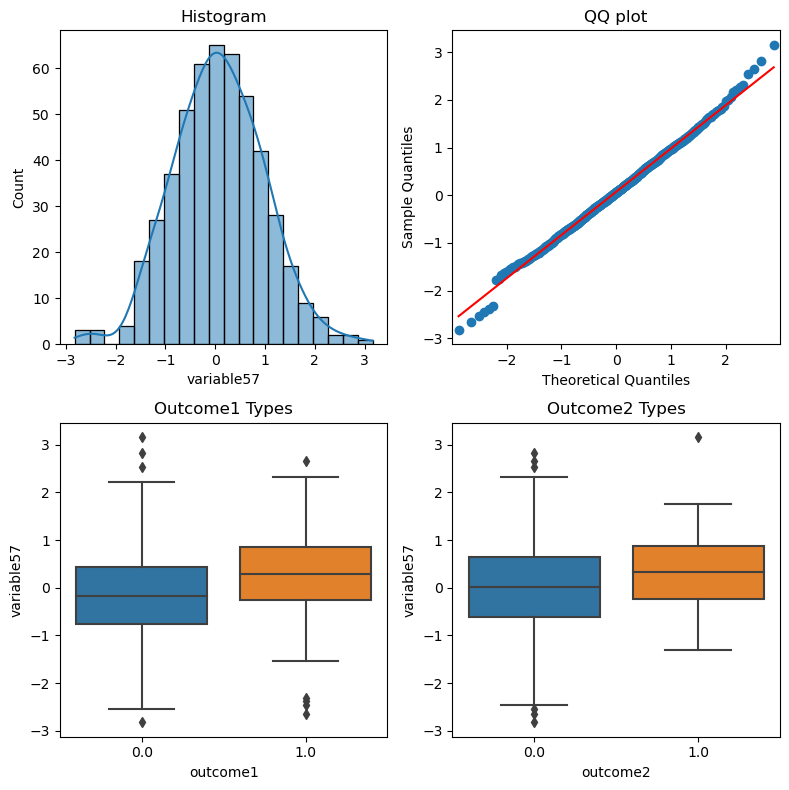

====================== Normality Test for variable58 ================================
Shapiro-Wilks Normality Test p-value:  0.0183
boxcox transform p-value:  0.2402
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.6764
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


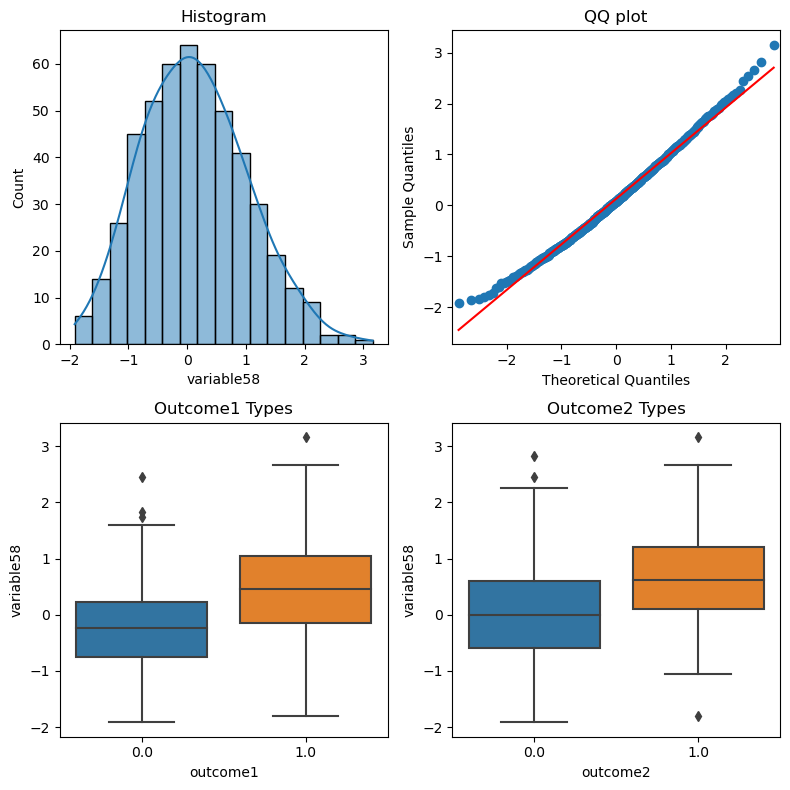

====================== Normality Test for variable59 ================================
Shapiro-Wilks Normality Test p-value:  0.0102
boxcox transform p-value:  0.0627
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8937
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


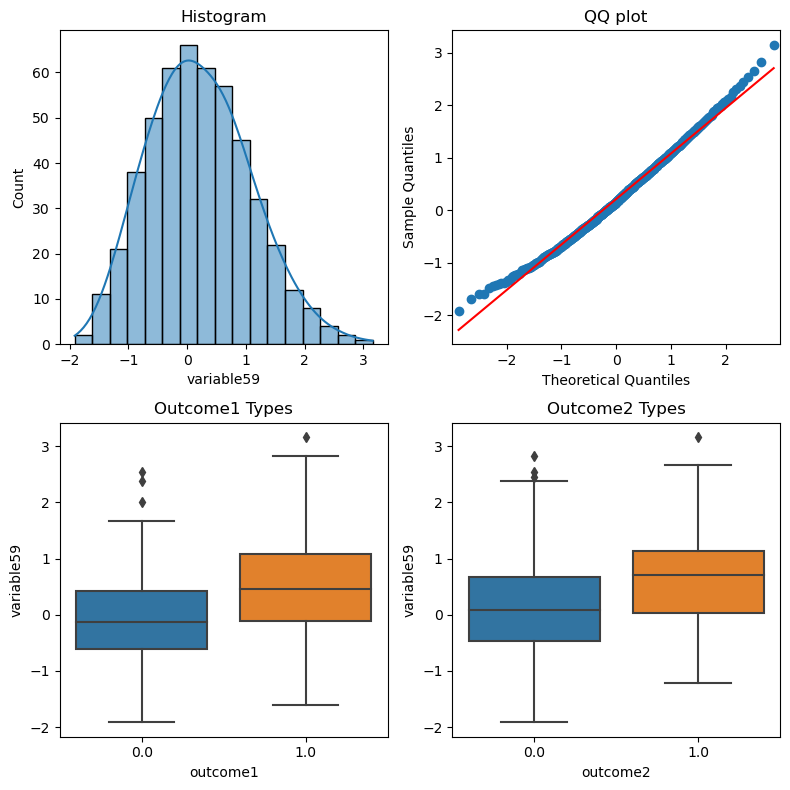

====================== Normality Test for variable60 ================================
Shapiro-Wilks Normality Test p-value:  0.1474
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9186
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0388
Point-biserial correlation p-value (outcome2):  0.1922


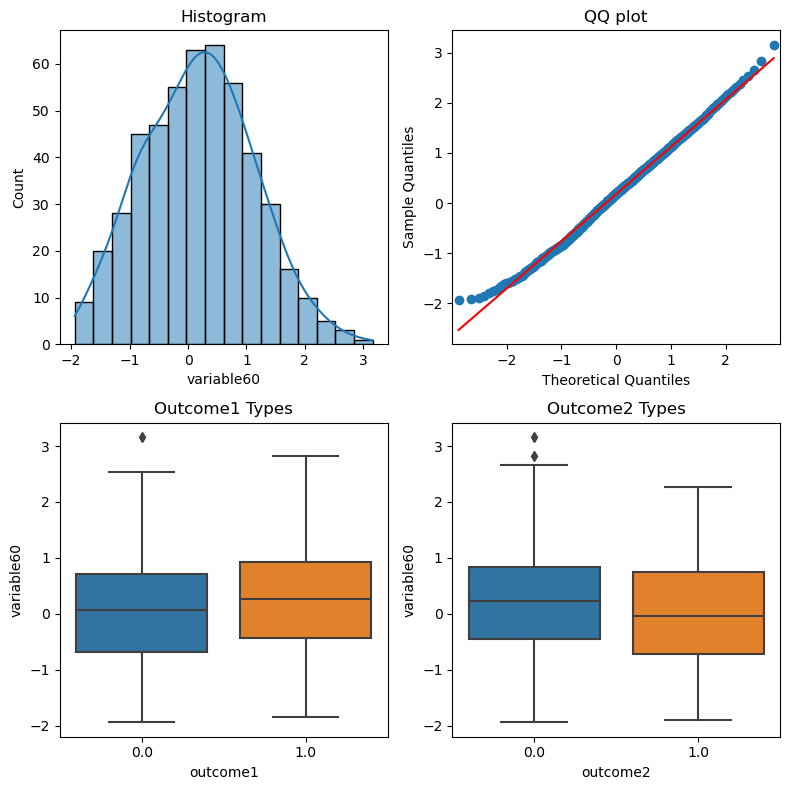

====================== Normality Test for variable61 ================================
Shapiro-Wilks Normality Test p-value:  0.9999
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9778
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0033
Point-biserial correlation p-value (outcome2):  0.2483


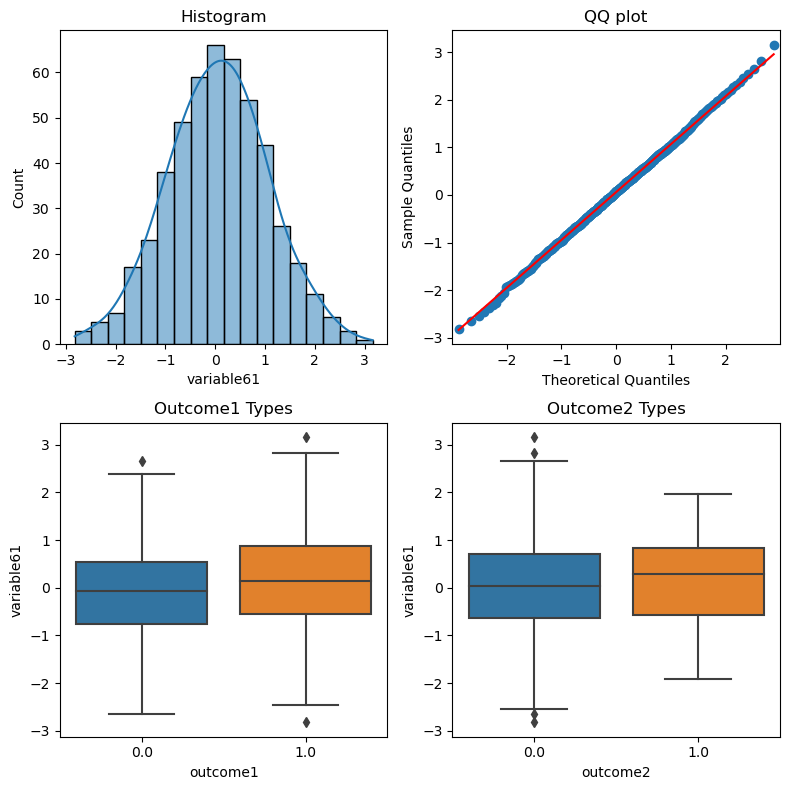

====================== Normality Test for variable62 ================================
Shapiro-Wilks Normality Test p-value:  0.0581
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8938
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


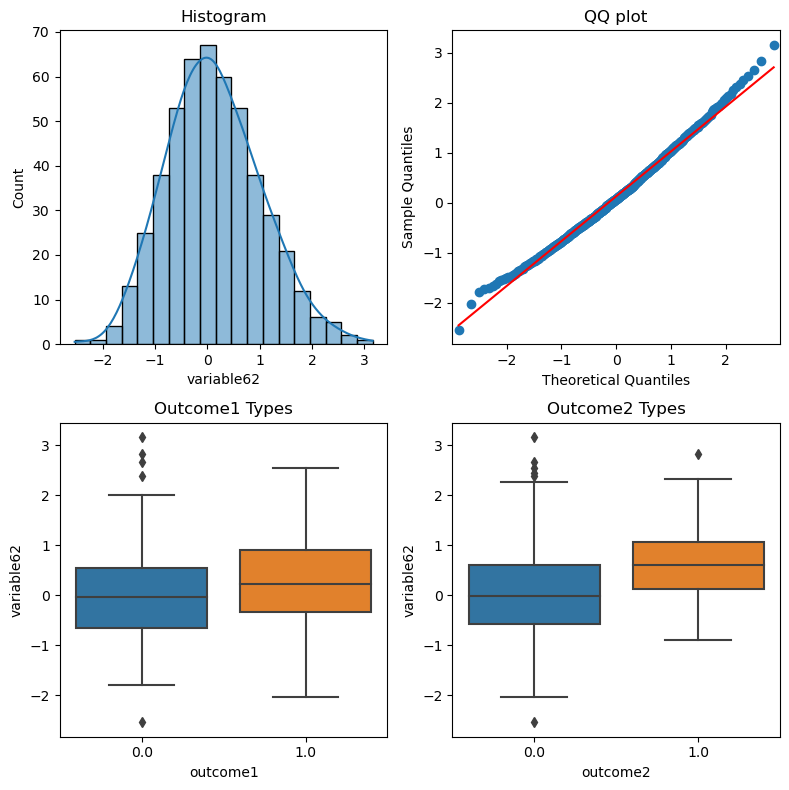

====================== Normality Test for variable63 ================================
Shapiro-Wilks Normality Test p-value:  0.3661
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9888
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0013
Point-biserial correlation p-value (outcome2):  0.1391


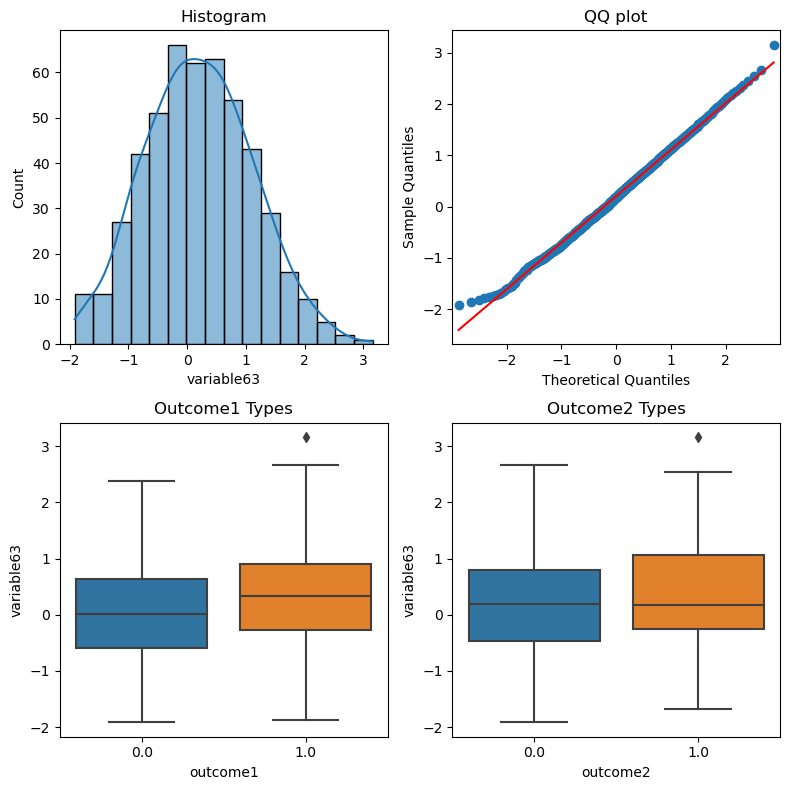

====================== Normality Test for variable64 ================================
Shapiro-Wilks Normality Test p-value:  0.0041
boxcox transform p-value:  0.1515
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9175
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


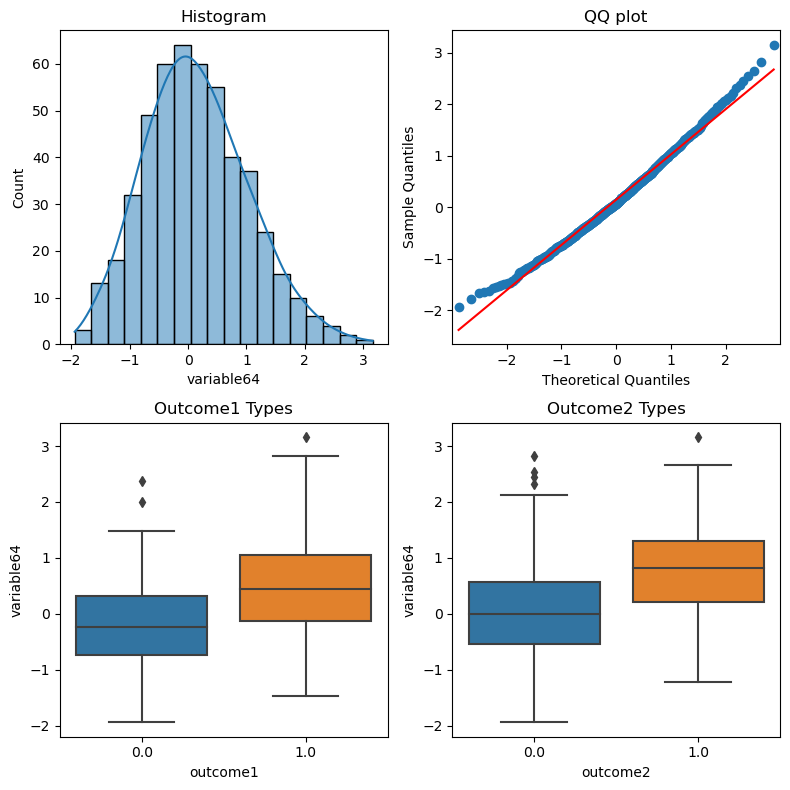

====================== Normality Test for variable65 ================================
Shapiro-Wilks Normality Test p-value:  0.9917
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9273
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0433


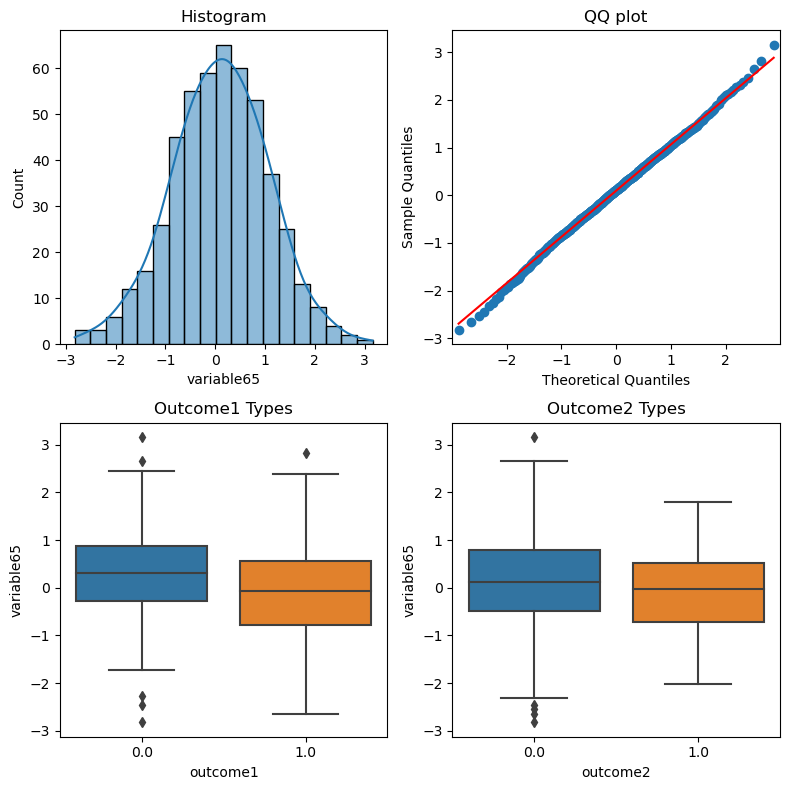

====================== Normality Test for variable66 ================================
Shapiro-Wilks Normality Test p-value:  0.0629
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9555
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.2077
Point-biserial correlation p-value (outcome2):  0.2468


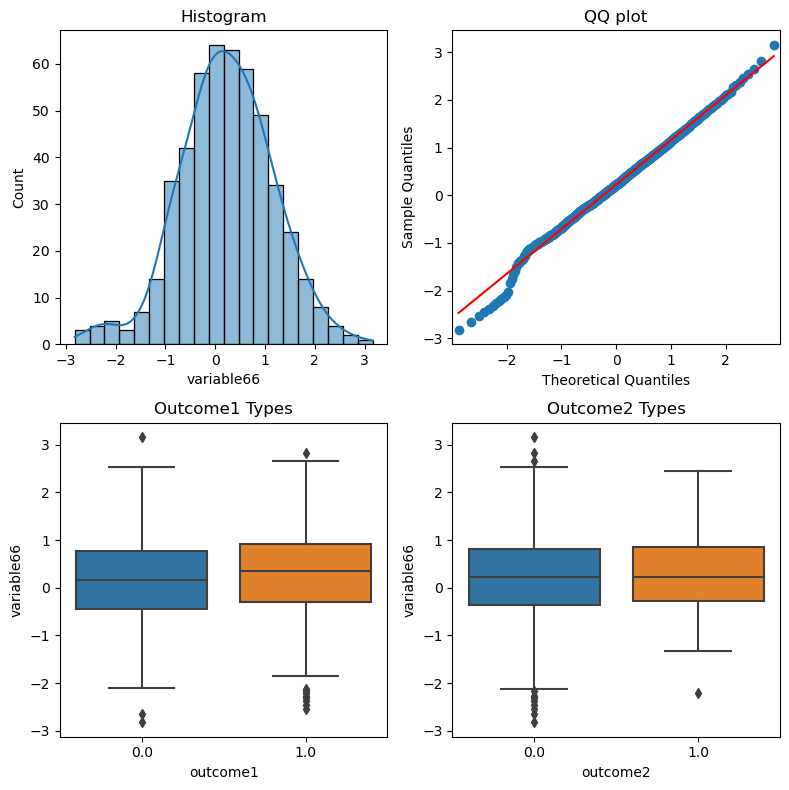

====================== Normality Test for variable67 ================================
Shapiro-Wilks Normality Test p-value:  0.1876
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9954
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0133
Point-biserial correlation p-value (outcome2):  0.0000


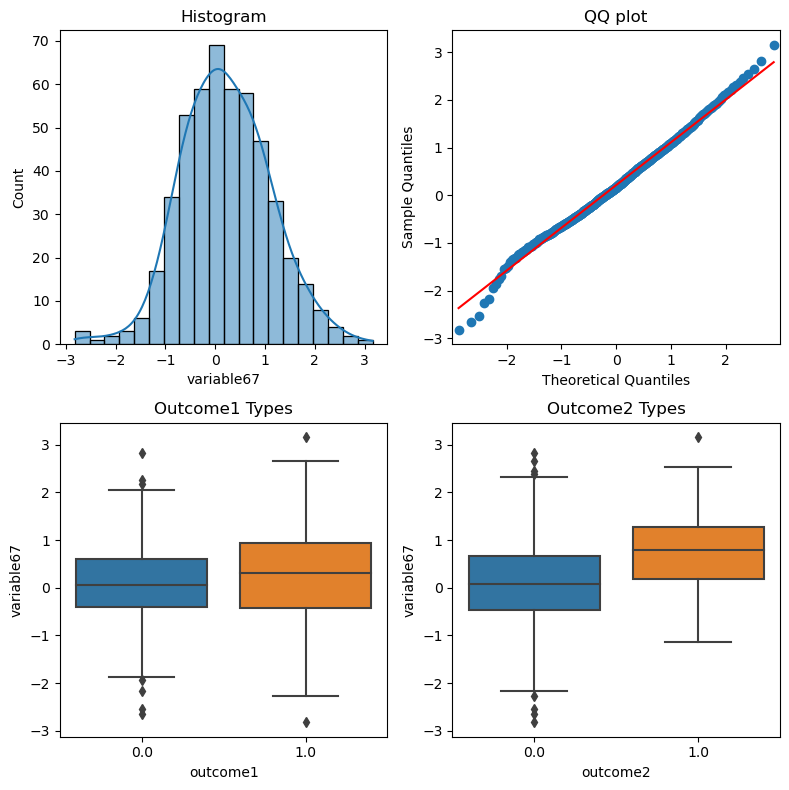

====================== Normality Test for variable68 ================================
Shapiro-Wilks Normality Test p-value:  0.9970
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9798
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0017
Point-biserial correlation p-value (outcome2):  0.0013


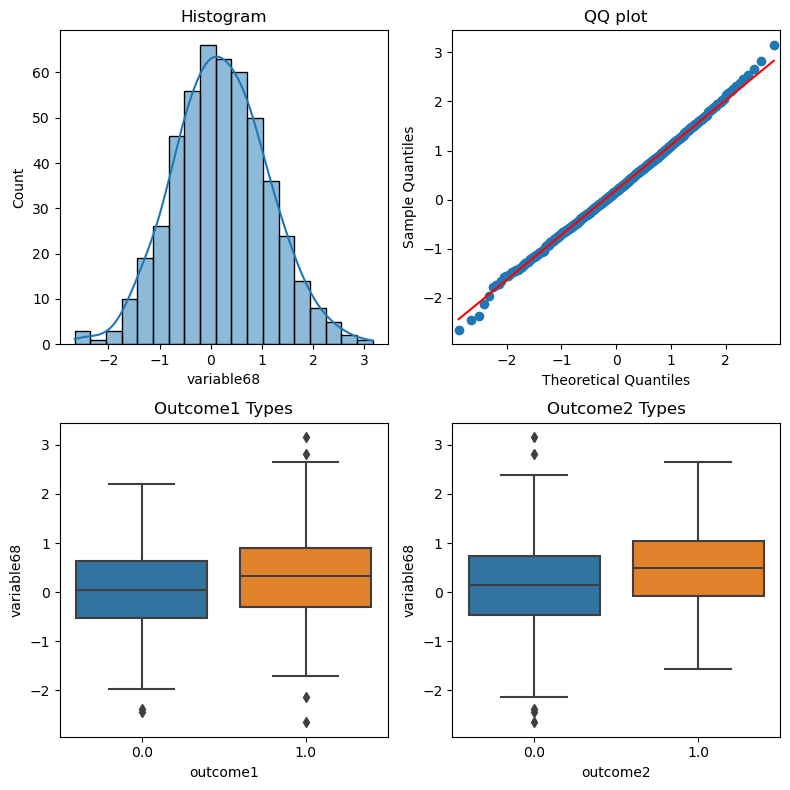

====================== Normality Test for variable69 ================================
Shapiro-Wilks Normality Test p-value:  0.0706
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8955
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.4554
Point-biserial correlation p-value (outcome2):  0.0122


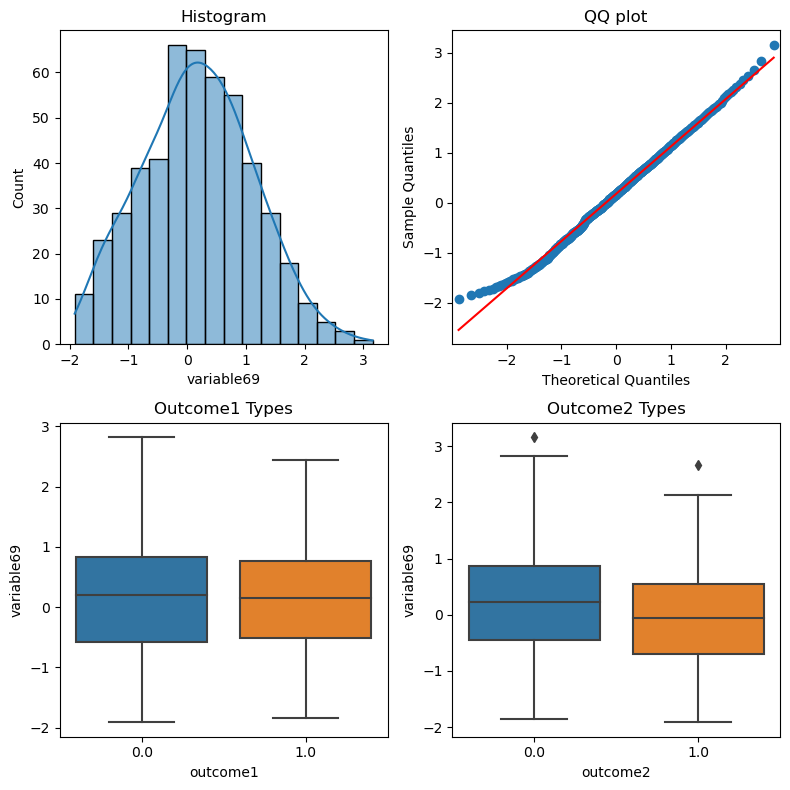

====================== Normality Test for variable70 ================================
Shapiro-Wilks Normality Test p-value:  0.2948
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8166
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.6120
Point-biserial correlation p-value (outcome2):  0.0029


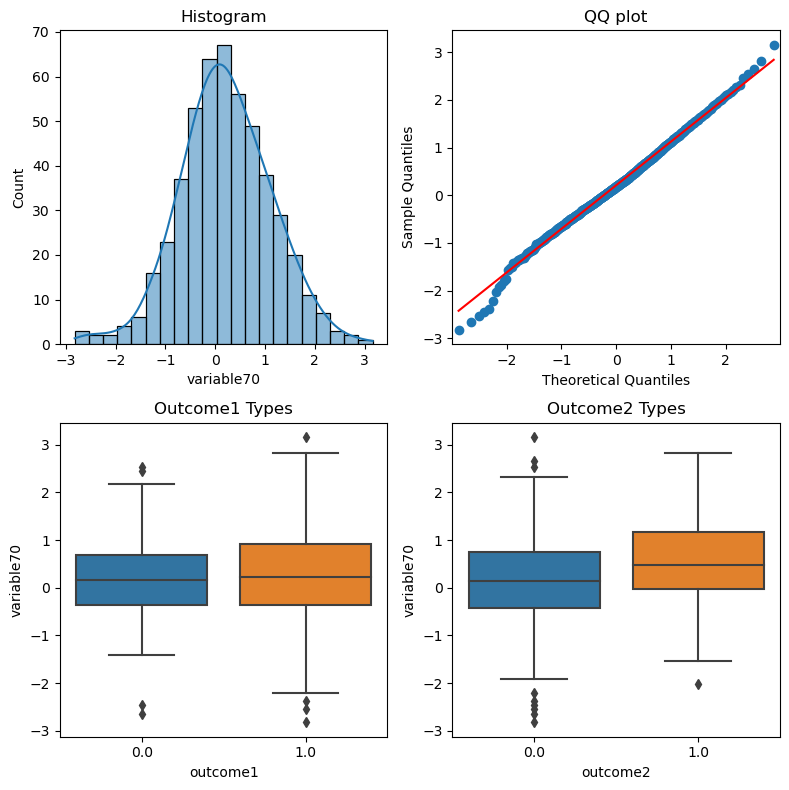

====================== Normality Test for variable71 ================================
Shapiro-Wilks Normality Test p-value:  0.6367
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9836
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0006
Point-biserial correlation p-value (outcome2):  0.0028


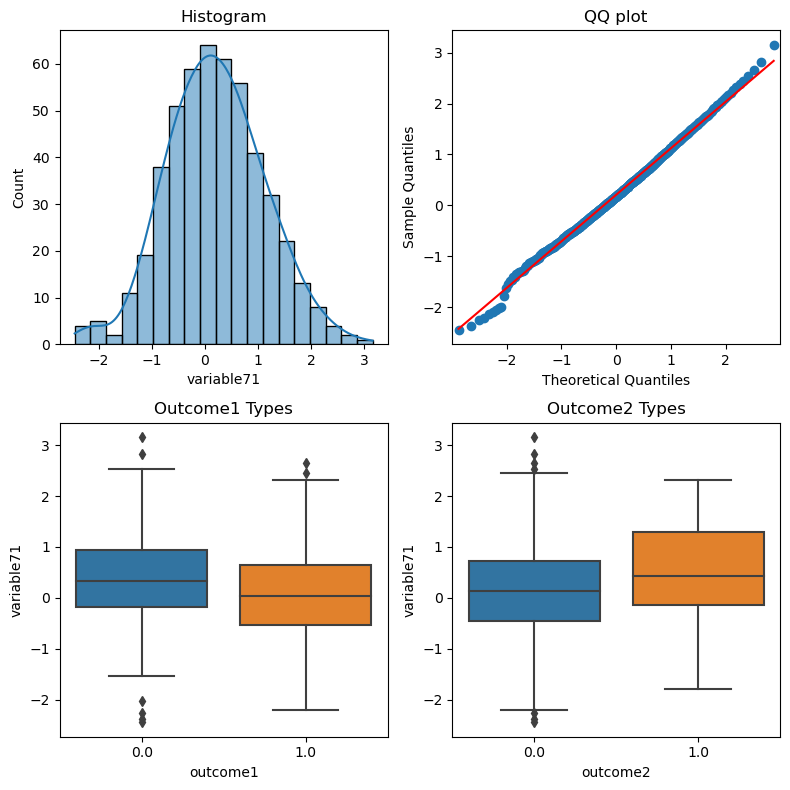

====================== Normality Test for variable72 ================================
Shapiro-Wilks Normality Test p-value:  0.0143
boxcox transform p-value:  0.0242
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8820
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.3286


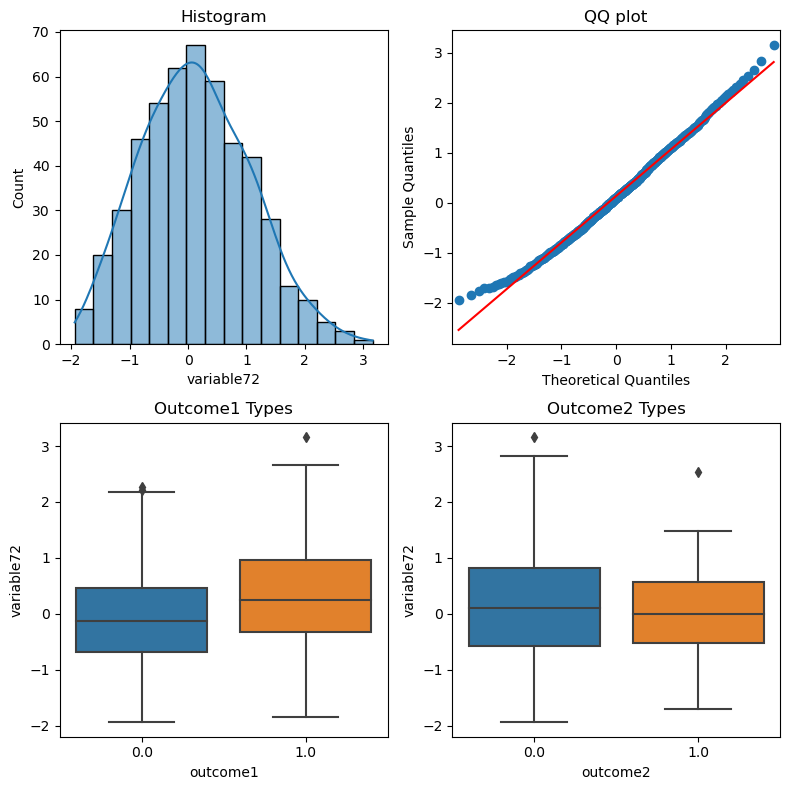

====================== Normality Test for variable73 ================================
Shapiro-Wilks Normality Test p-value:  0.0564
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9019
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0115
Point-biserial correlation p-value (outcome2):  0.7137


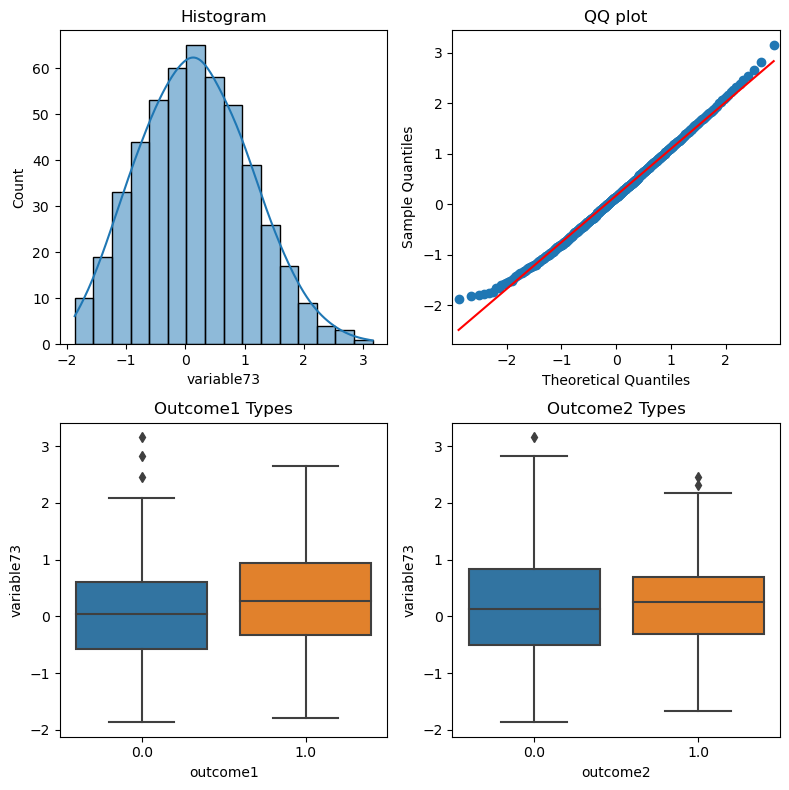

====================== Normality Test for variable74 ================================
Shapiro-Wilks Normality Test p-value:  0.6819
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8405
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0459
Point-biserial correlation p-value (outcome2):  0.0009


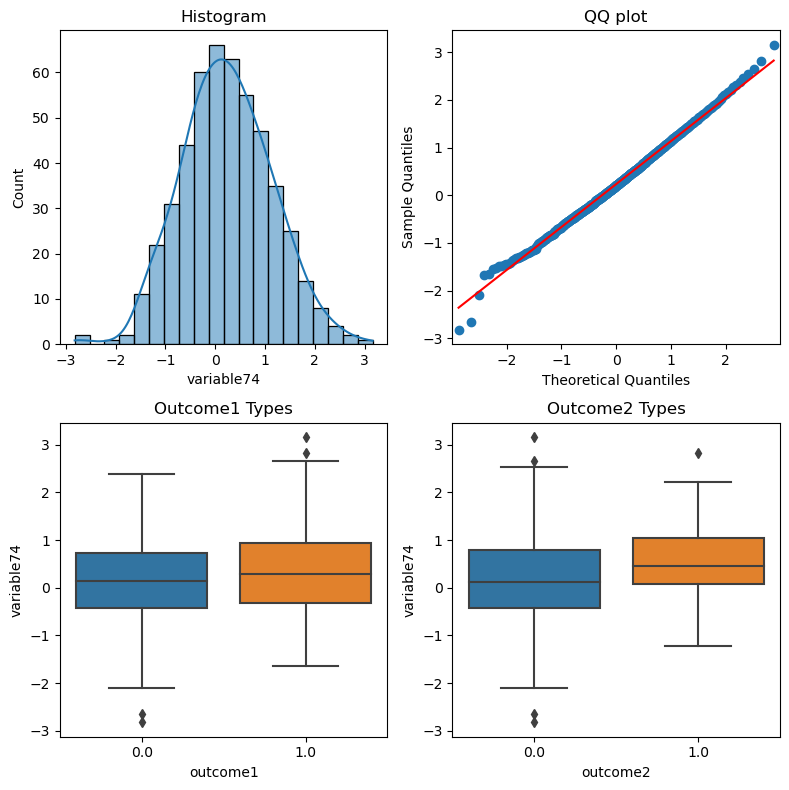

====================== Normality Test for variable75 ================================
Shapiro-Wilks Normality Test p-value:  0.9996
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9843
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9366
Point-biserial correlation p-value (outcome2):  0.0701


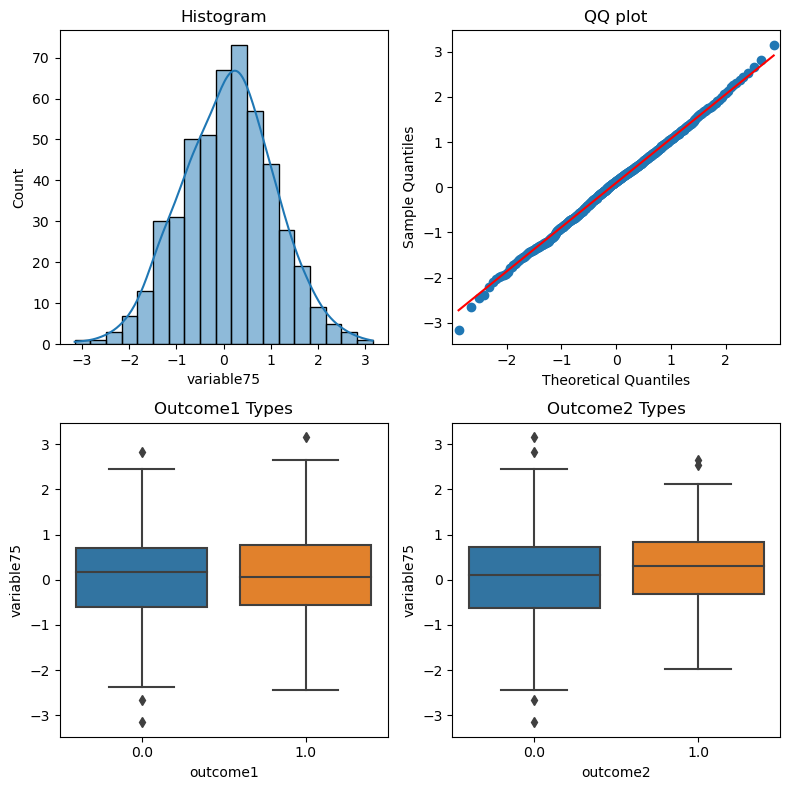

====================== Normality Test for variable76 ================================
Shapiro-Wilks Normality Test p-value:  1.0000
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9870
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.8754


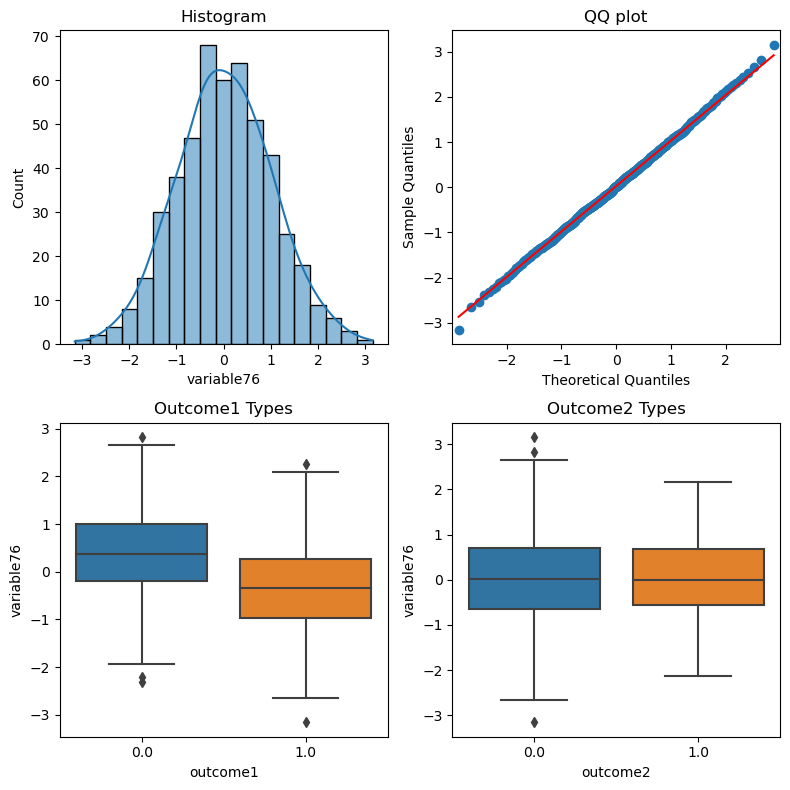

====================== Normality Test for variable77 ================================
Shapiro-Wilks Normality Test p-value:  0.5949
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8554
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1012


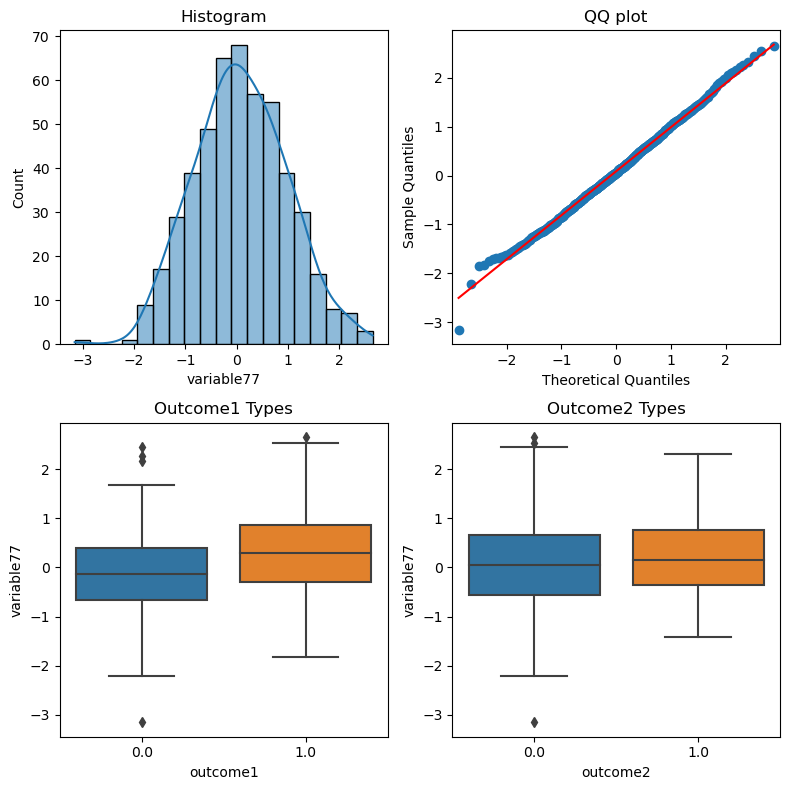

====================== Normality Test for variable78 ================================
Shapiro-Wilks Normality Test p-value:  0.9937
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9265
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.1068
Point-biserial correlation p-value (outcome2):  0.0000


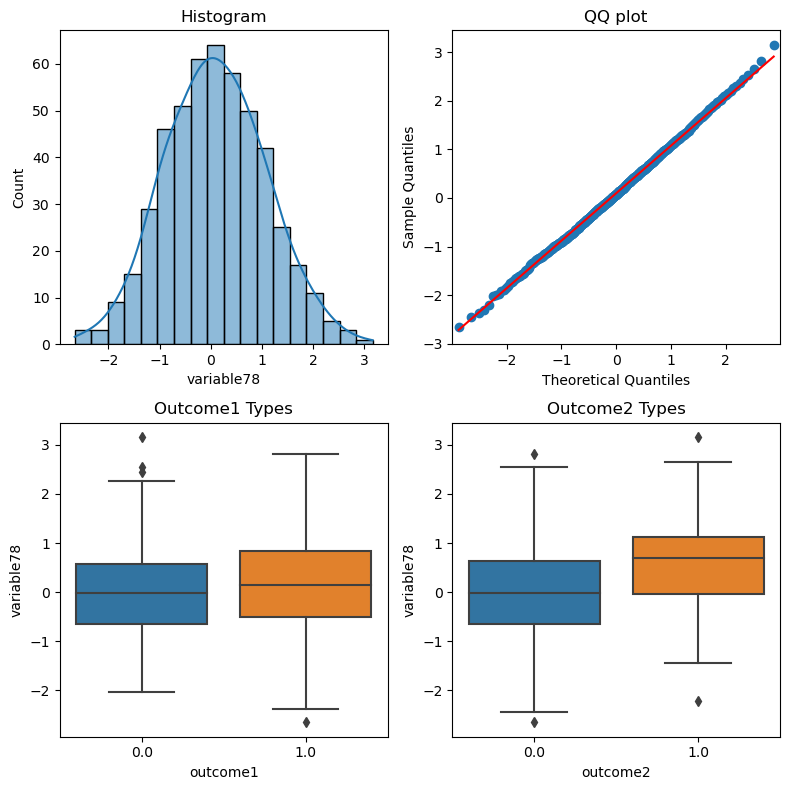

====================== Normality Test for variable79 ================================
Shapiro-Wilks Normality Test p-value:  0.0000
boxcox transform p-value:  0.0475
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8978
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.6466
Point-biserial correlation p-value (outcome2):  0.1013


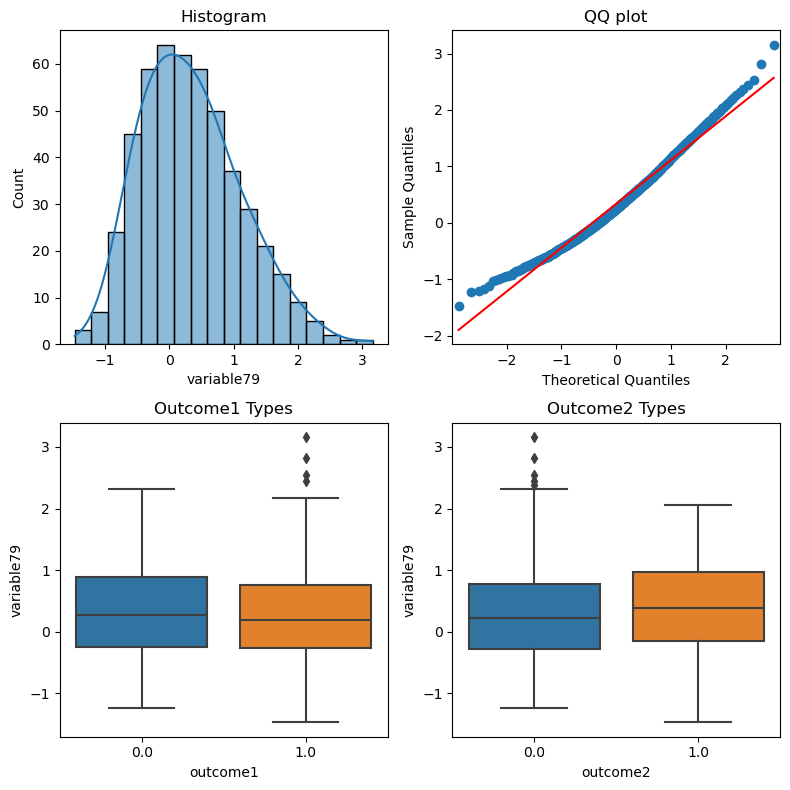

====================== Normality Test for variable80 ================================
Shapiro-Wilks Normality Test p-value:  0.9966
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8082
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.1225
Point-biserial correlation p-value (outcome2):  0.0000


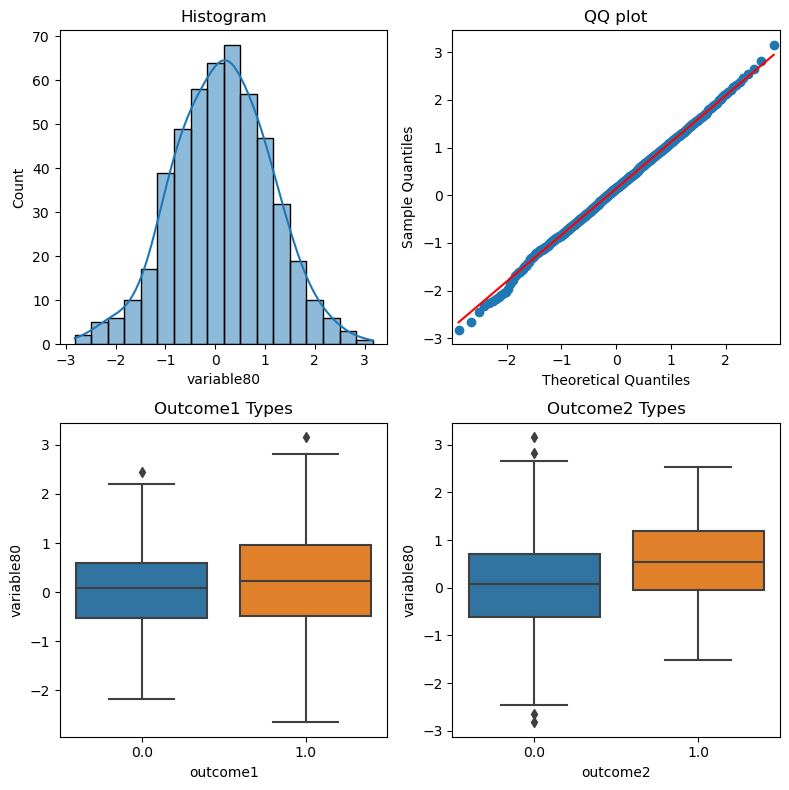

====================== Normality Test for variable81 ================================
Shapiro-Wilks Normality Test p-value:  0.1633
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8106
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0209


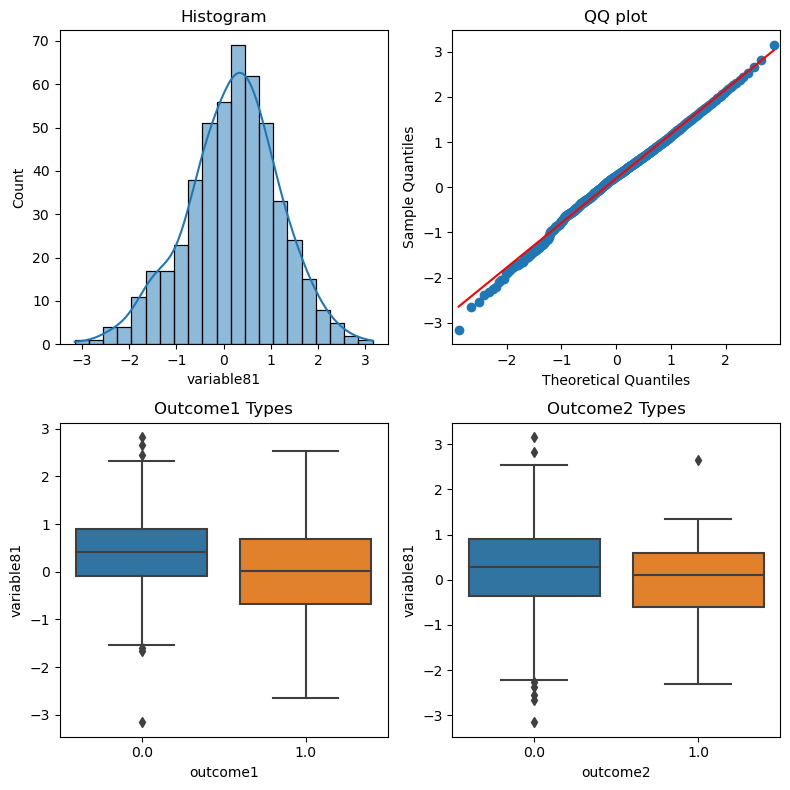

====================== Normality Test for variable82 ================================
Shapiro-Wilks Normality Test p-value:  0.9999
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9775
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0098
Point-biserial correlation p-value (outcome2):  0.0144


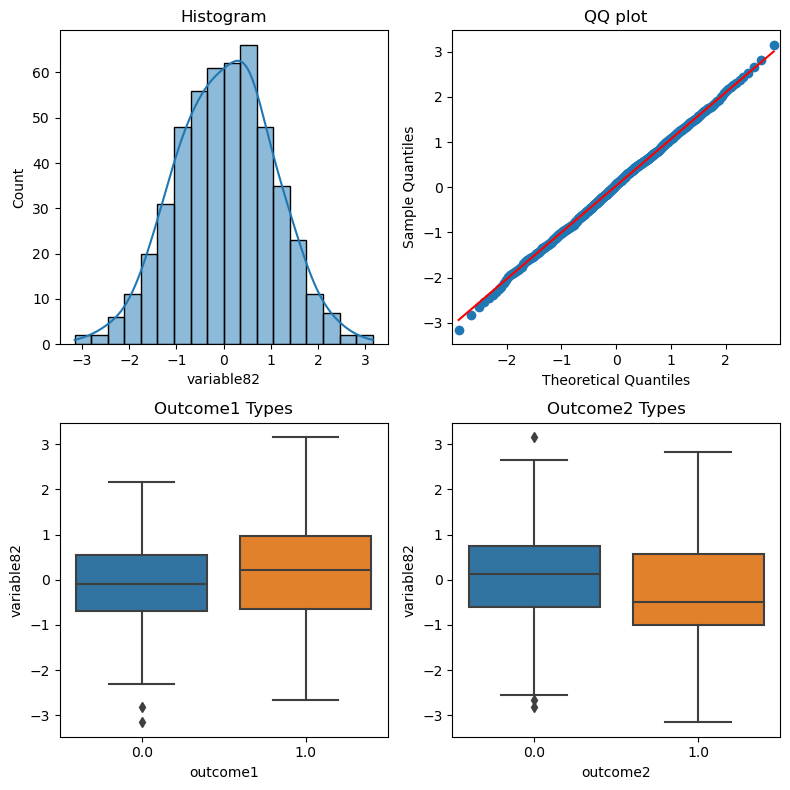

====================== Normality Test for variable83 ================================
Shapiro-Wilks Normality Test p-value:  0.1317
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9362
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


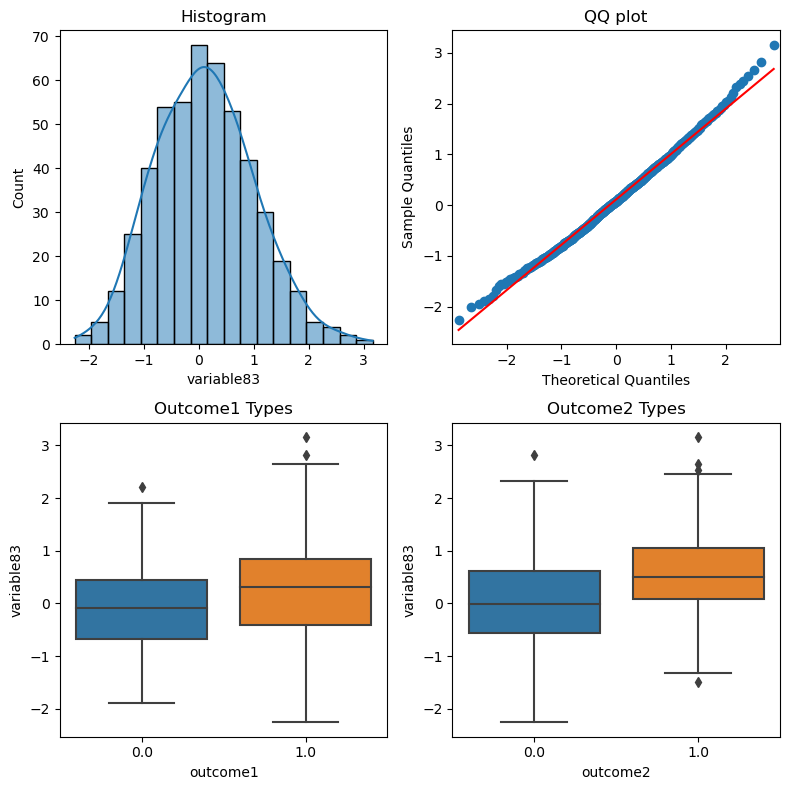

====================== Normality Test for variable84 ================================
Shapiro-Wilks Normality Test p-value:  0.2309
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8436
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0212
Point-biserial correlation p-value (outcome2):  0.0036


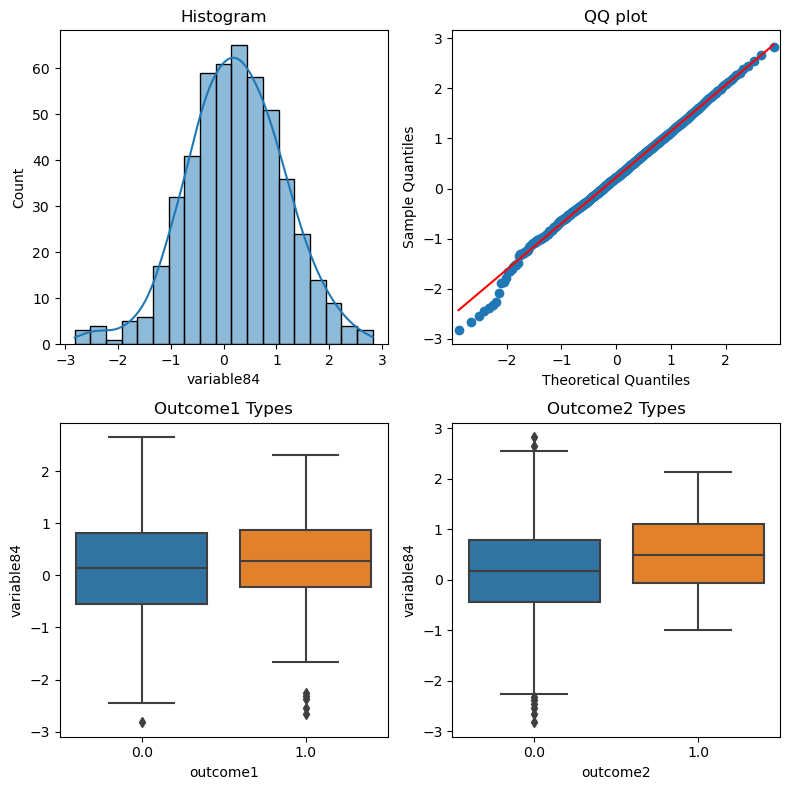

====================== Normality Test for variable85 ================================
Shapiro-Wilks Normality Test p-value:  0.9988
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9970
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.2266
Point-biserial correlation p-value (outcome2):  0.3949


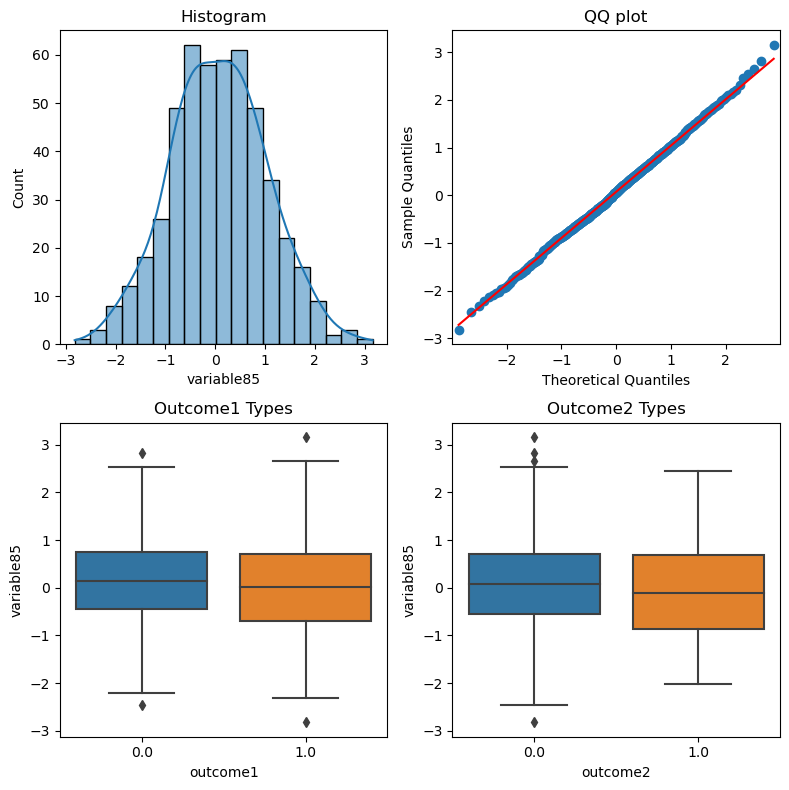

====================== Normality Test for variable86 ================================
Shapiro-Wilks Normality Test p-value:  0.9095
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8455
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0005
Point-biserial correlation p-value (outcome2):  0.0000


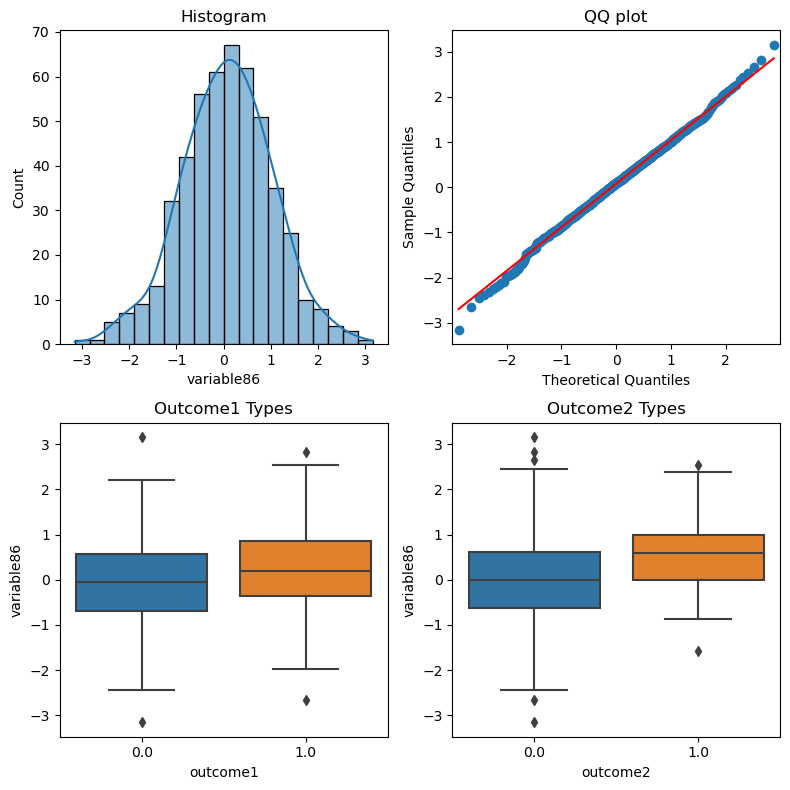

====================== Normality Test for variable87 ================================
Shapiro-Wilks Normality Test p-value:  0.8144
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9371
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.2041
Point-biserial correlation p-value (outcome2):  0.0518


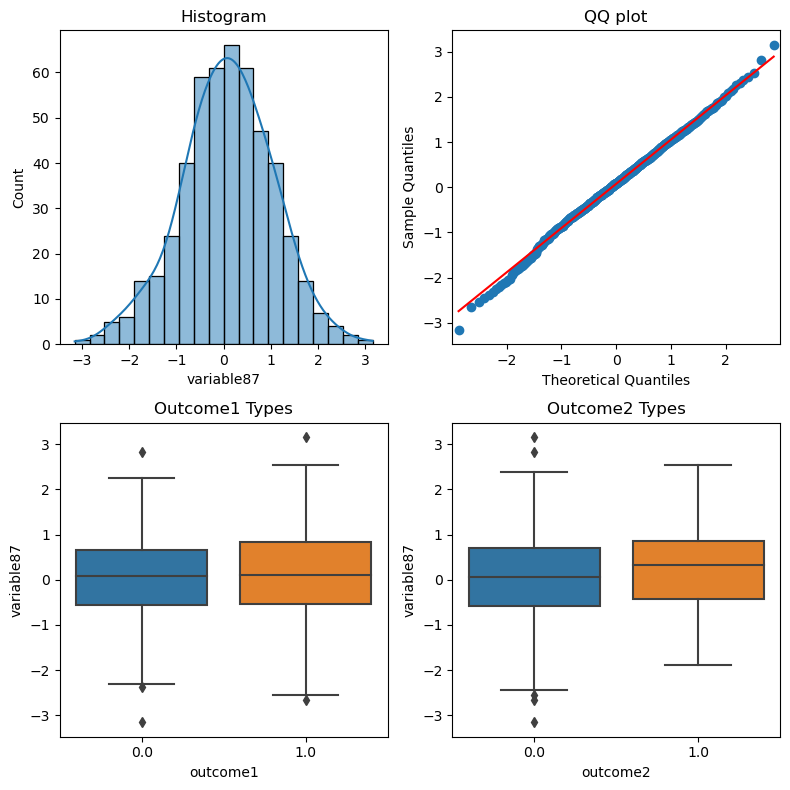

====================== Normality Test for variable88 ================================
Shapiro-Wilks Normality Test p-value:  0.1933
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9881
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.7808
Point-biserial correlation p-value (outcome2):  0.0681


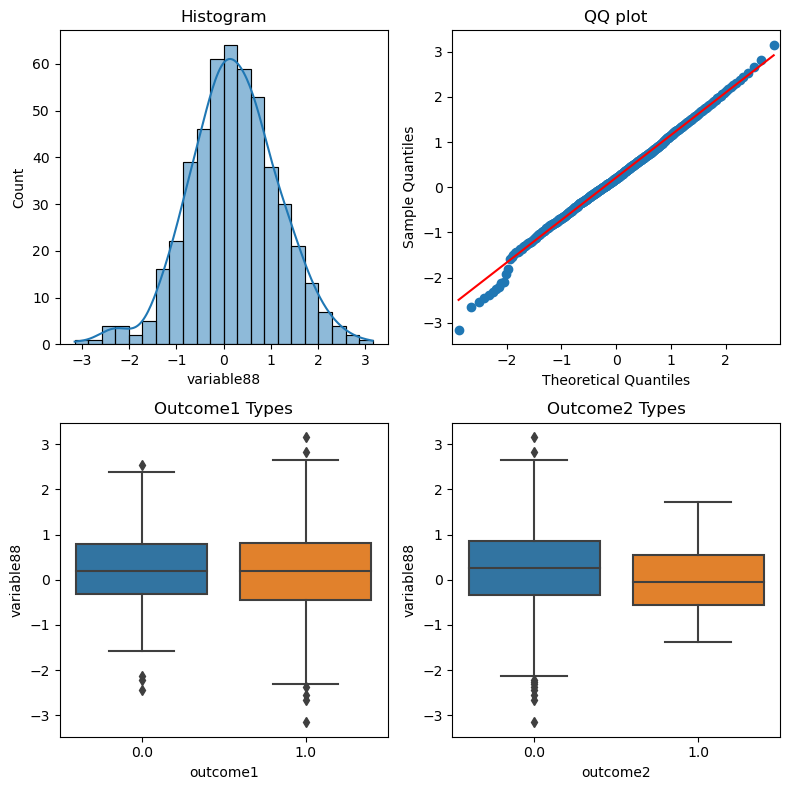

====================== Normality Test for variable89 ================================
Shapiro-Wilks Normality Test p-value:  0.7719
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9474
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0024
Point-biserial correlation p-value (outcome2):  0.0000


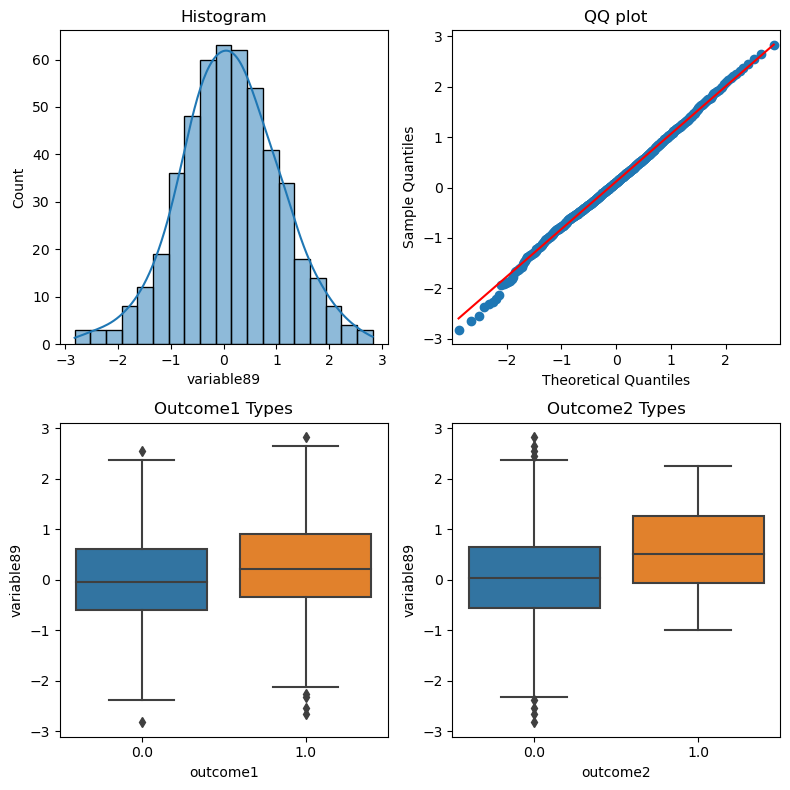

====================== Normality Test for variable90 ================================
Shapiro-Wilks Normality Test p-value:  0.9998
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9007
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.6545
Point-biserial correlation p-value (outcome2):  0.0055


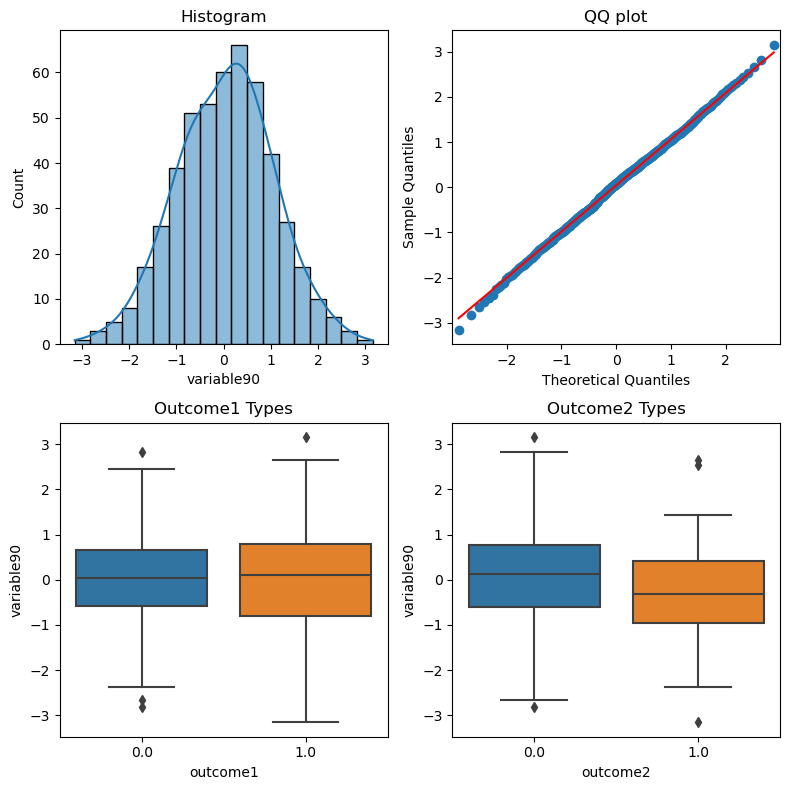

====================== Normality Test for variable91 ================================
Shapiro-Wilks Normality Test p-value:  0.6040
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9338
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0003


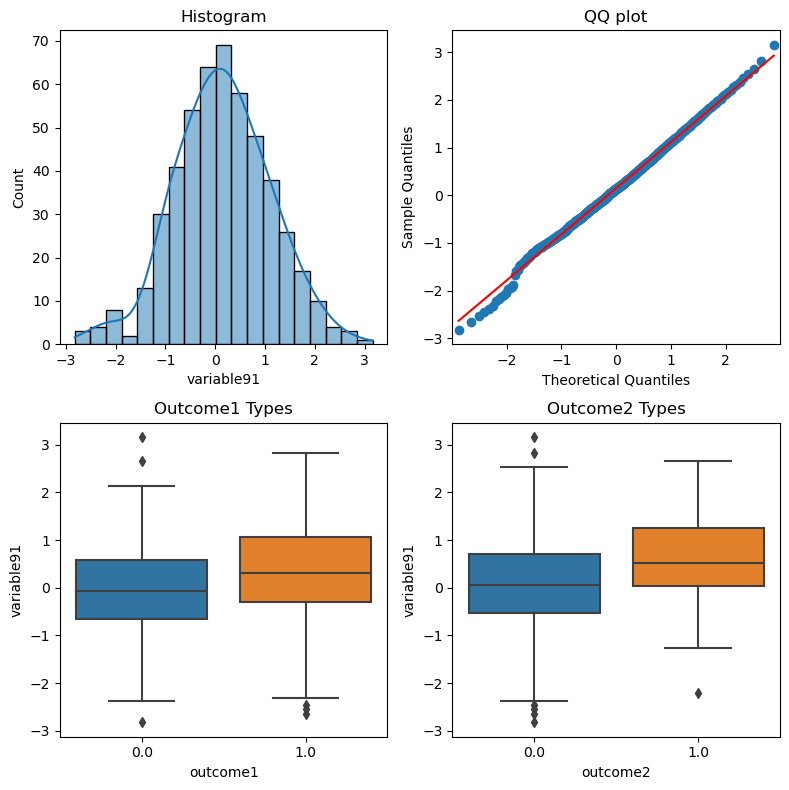

====================== Normality Test for variable92 ================================
Shapiro-Wilks Normality Test p-value:  0.3645
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8780
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0125
Point-biserial correlation p-value (outcome2):  0.1716


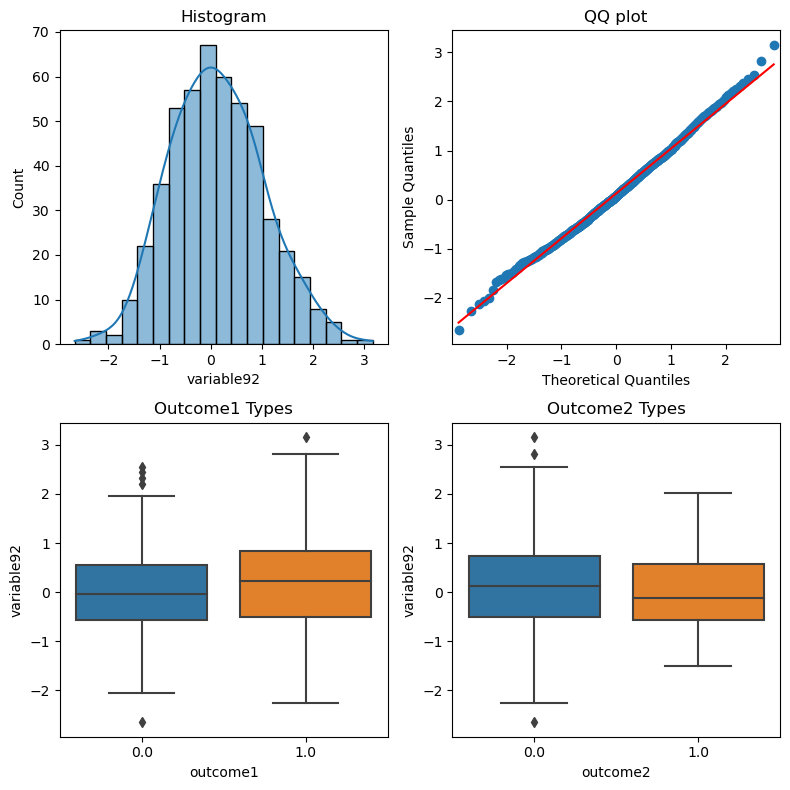

====================== Normality Test for variable93 ================================
Shapiro-Wilks Normality Test p-value:  0.7296
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9953
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.7916
Point-biserial correlation p-value (outcome2):  0.0022


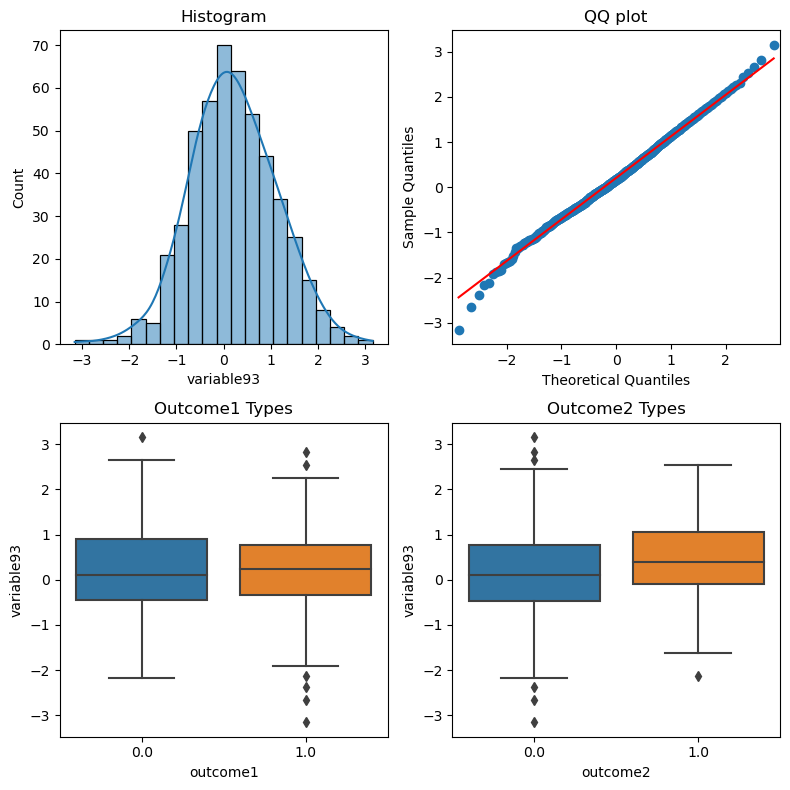

====================== Normality Test for variable94 ================================
Shapiro-Wilks Normality Test p-value:  0.9658
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9179
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0033


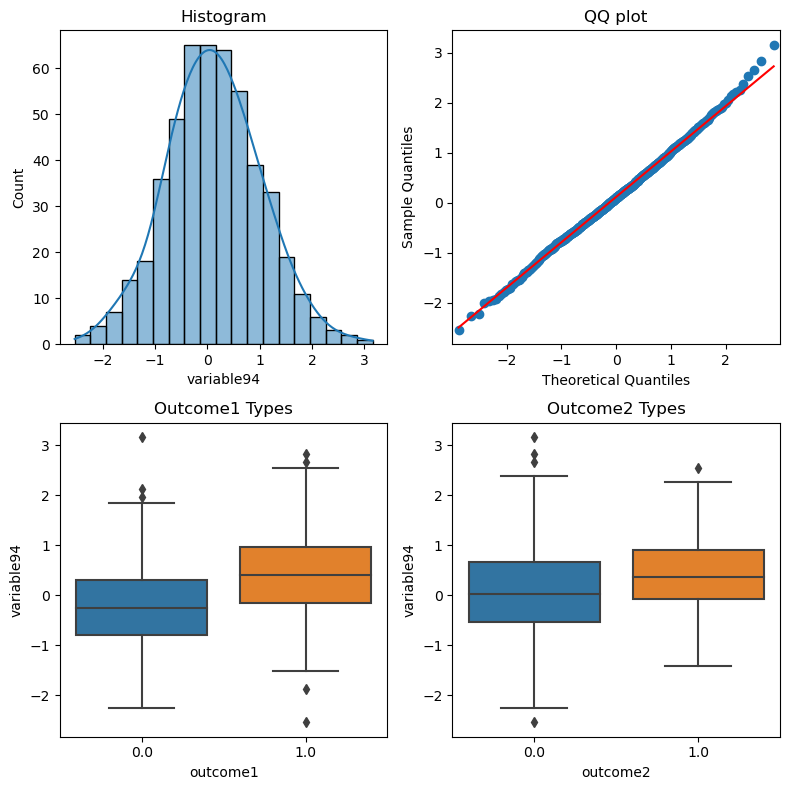

====================== Normality Test for variable95 ================================
Shapiro-Wilks Normality Test p-value:  0.2549
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9524
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.7218
Point-biserial correlation p-value (outcome2):  0.9744


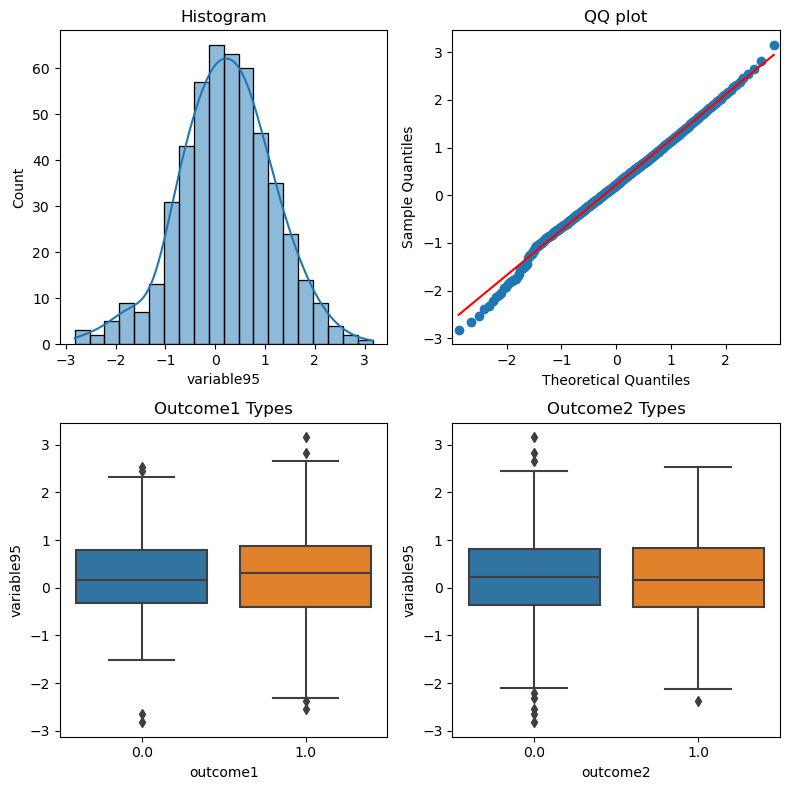

====================== Normality Test for variable96 ================================
Shapiro-Wilks Normality Test p-value:  0.5488
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9288
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0002


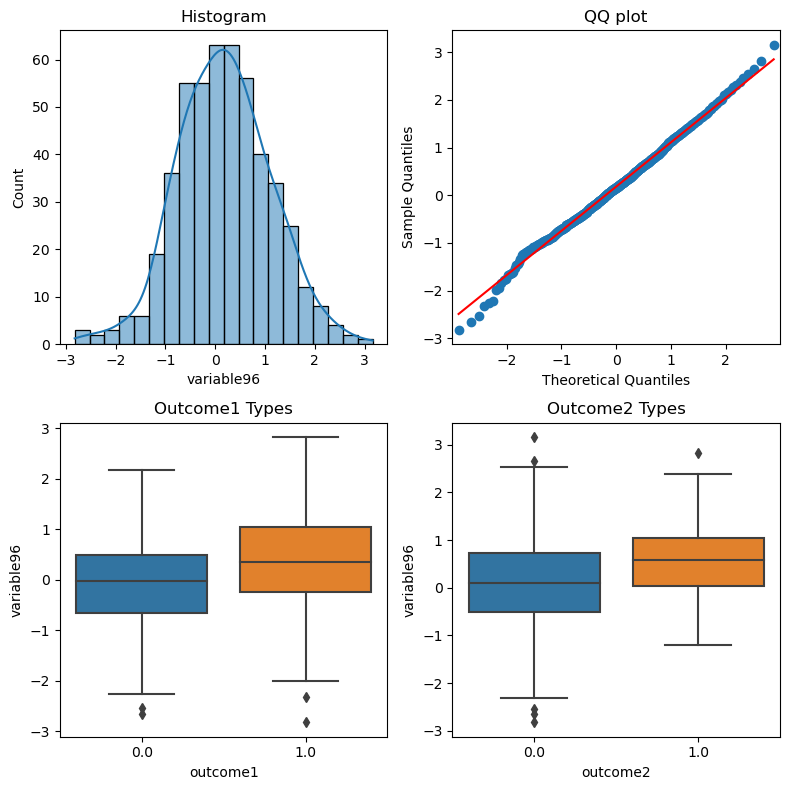

====================== Normality Test for variable97 ================================
Shapiro-Wilks Normality Test p-value:  0.9964
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9488
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9126
Point-biserial correlation p-value (outcome2):  0.0000


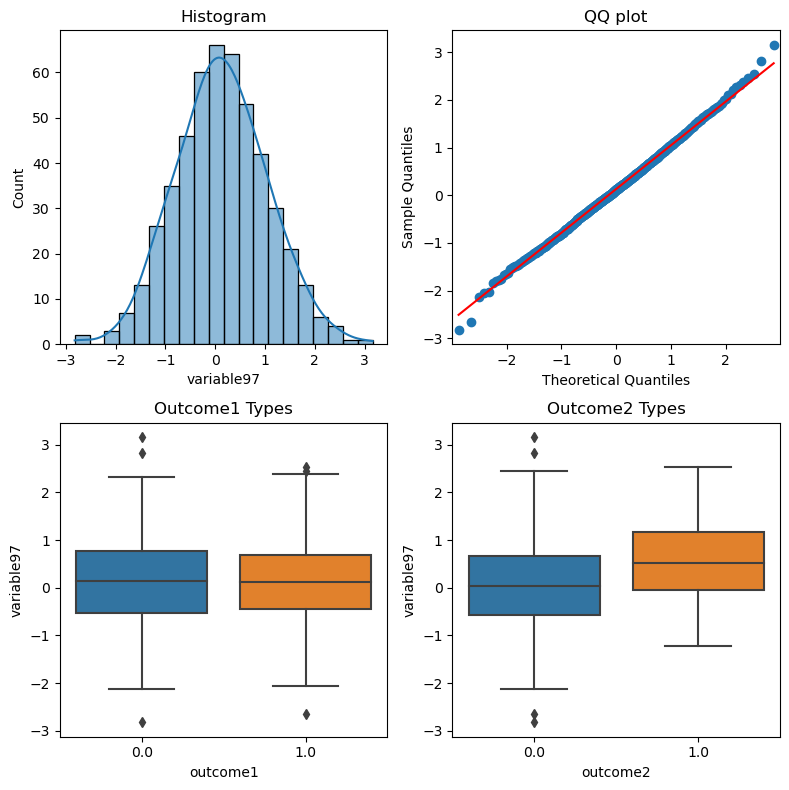

====================== Normality Test for variable98 ================================
Shapiro-Wilks Normality Test p-value:  0.9567
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9987
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.9041


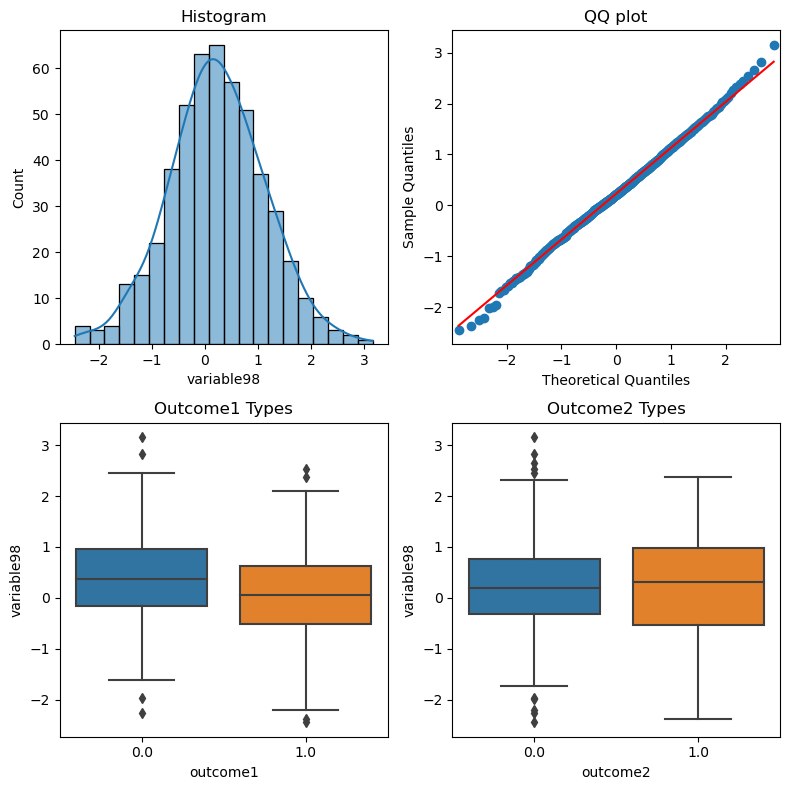

====================== Normality Test for variable99 ================================
Shapiro-Wilks Normality Test p-value:  0.9988
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8422
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.6385
Point-biserial correlation p-value (outcome2):  0.0000


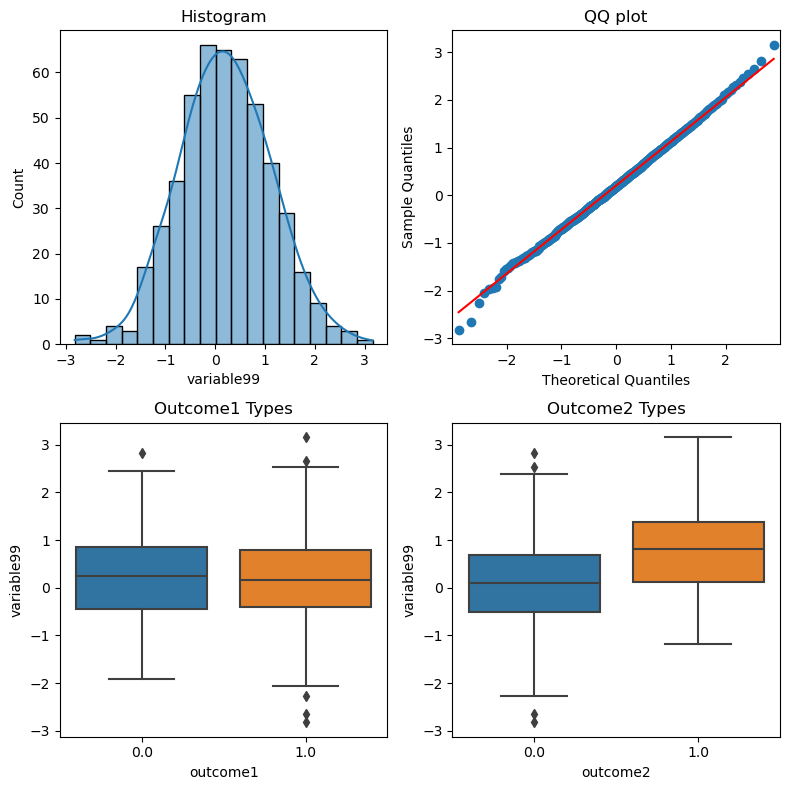

====================== Normality Test for variable100 ================================
Shapiro-Wilks Normality Test p-value:  0.9891
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8938
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0003


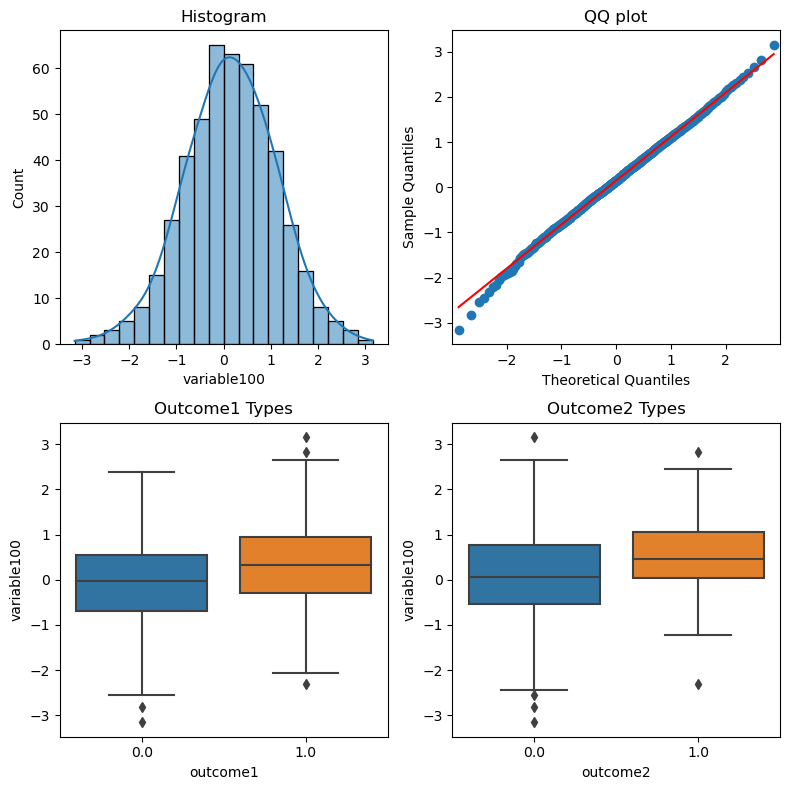

====================== Normality Test for variable101 ================================
Shapiro-Wilks Normality Test p-value:  0.4141
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9395
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0008
Point-biserial correlation p-value (outcome2):  0.0941


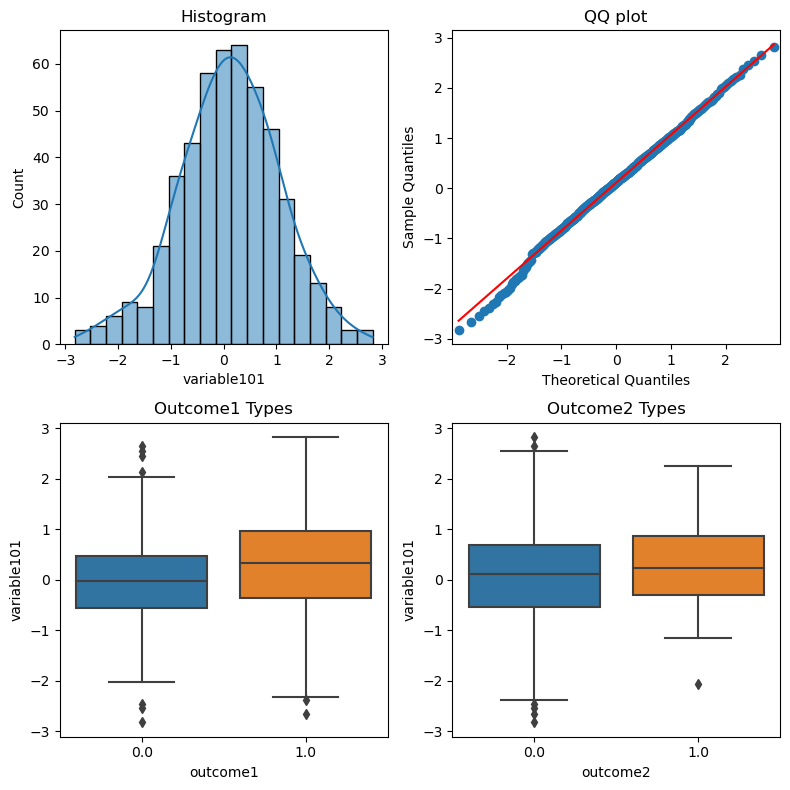

====================== Normality Test for variable102 ================================
Shapiro-Wilks Normality Test p-value:  0.7505
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8266
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.7009
Point-biserial correlation p-value (outcome2):  0.0119


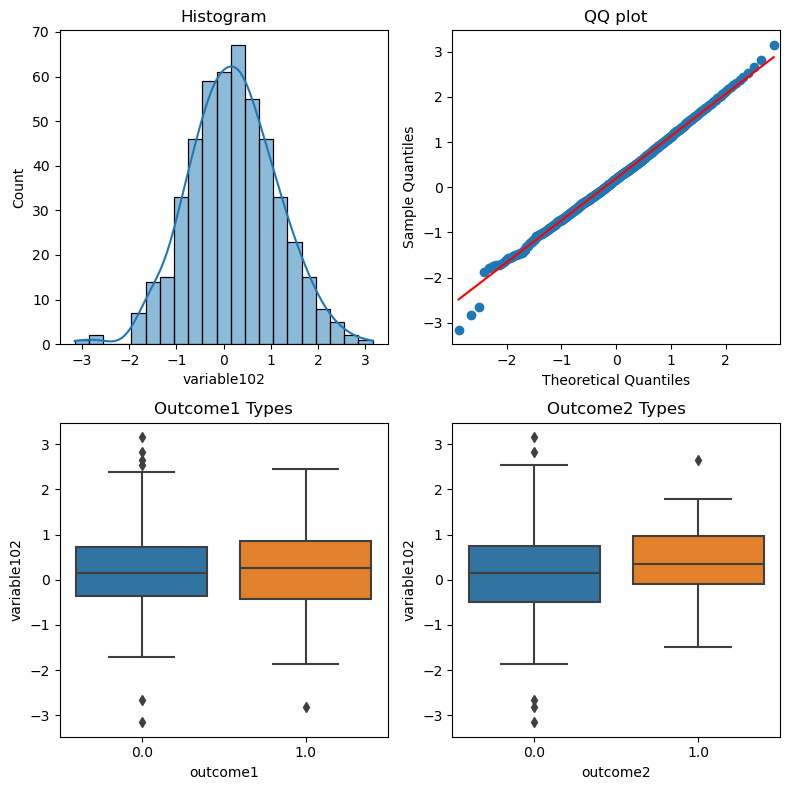

====================== Normality Test for variable103 ================================
Shapiro-Wilks Normality Test p-value:  0.8605
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9099
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.9118


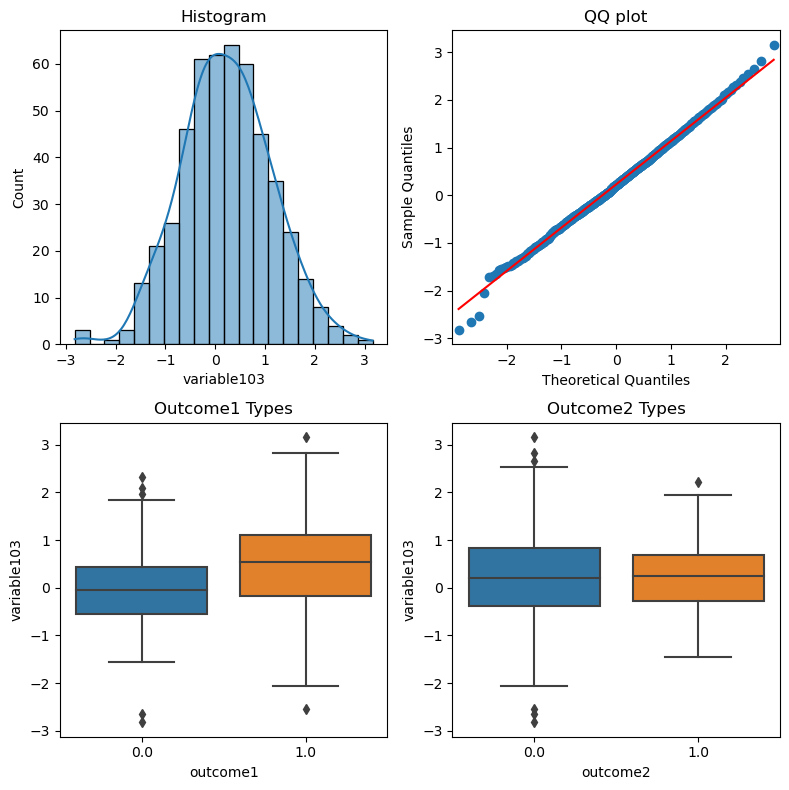

====================== Normality Test for variable104 ================================
Shapiro-Wilks Normality Test p-value:  0.1532
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9117
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0013


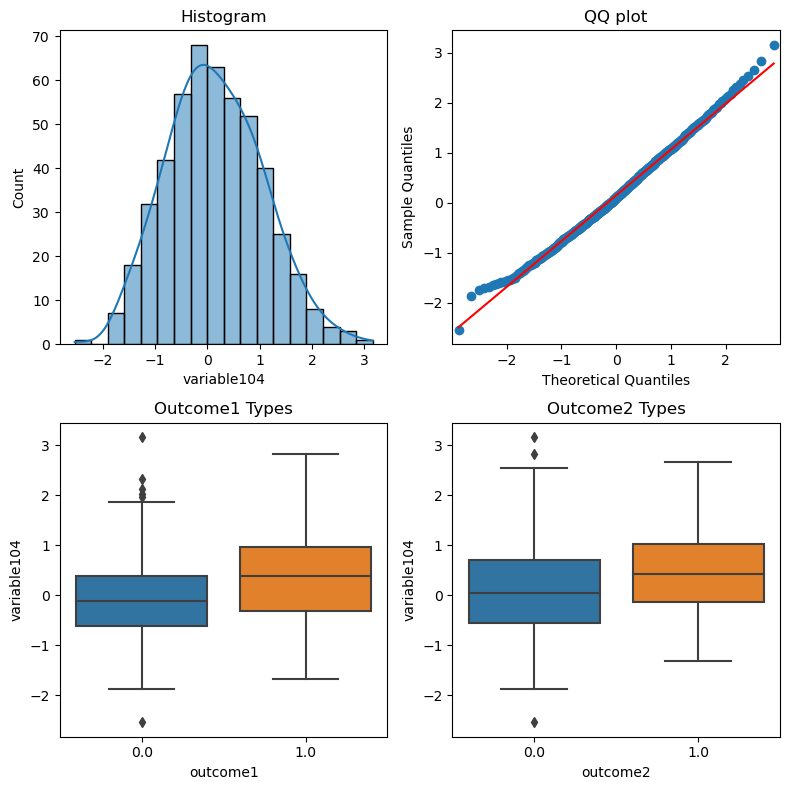

====================== Normality Test for variable105 ================================
Shapiro-Wilks Normality Test p-value:  0.0638
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8663
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0002
Point-biserial correlation p-value (outcome2):  0.0000


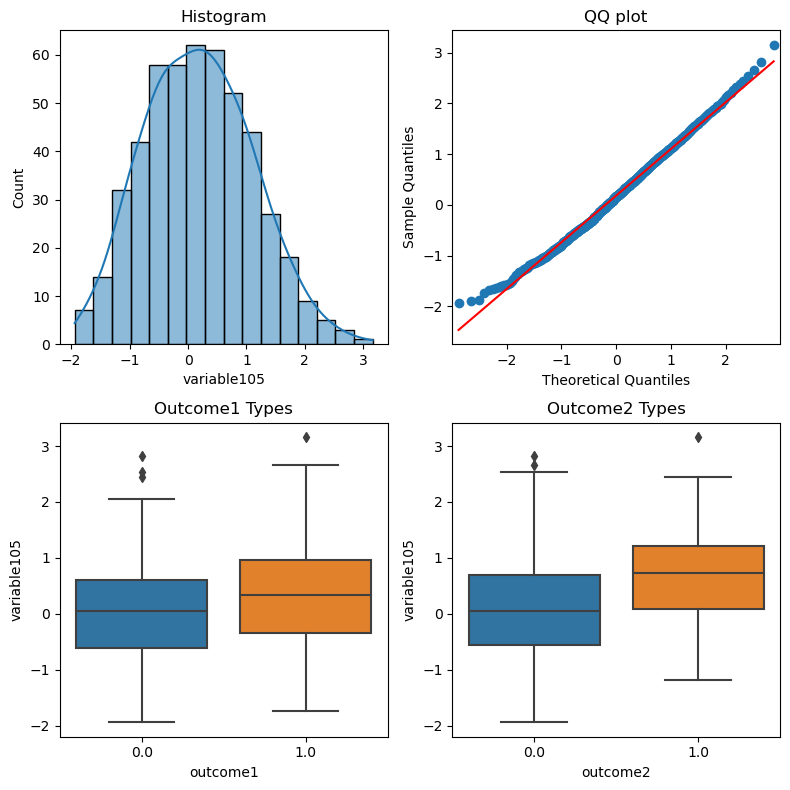

====================== Normality Test for variable106 ================================
Shapiro-Wilks Normality Test p-value:  0.6488
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9799
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3746
Point-biserial correlation p-value (outcome2):  0.0153


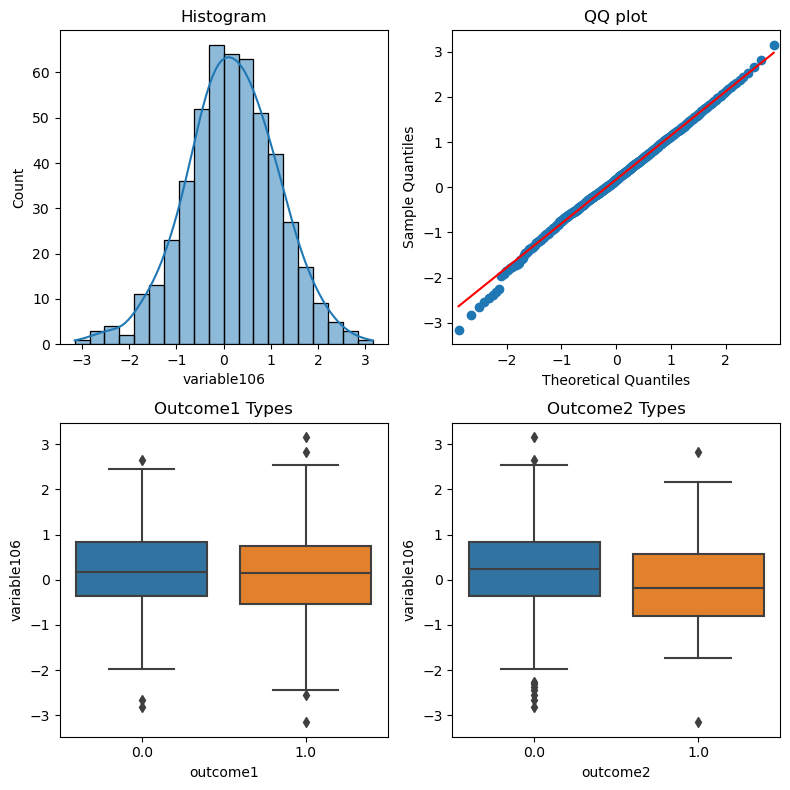

====================== Normality Test for variable107 ================================
Shapiro-Wilks Normality Test p-value:  0.4950
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9316
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3983
Point-biserial correlation p-value (outcome2):  0.0003


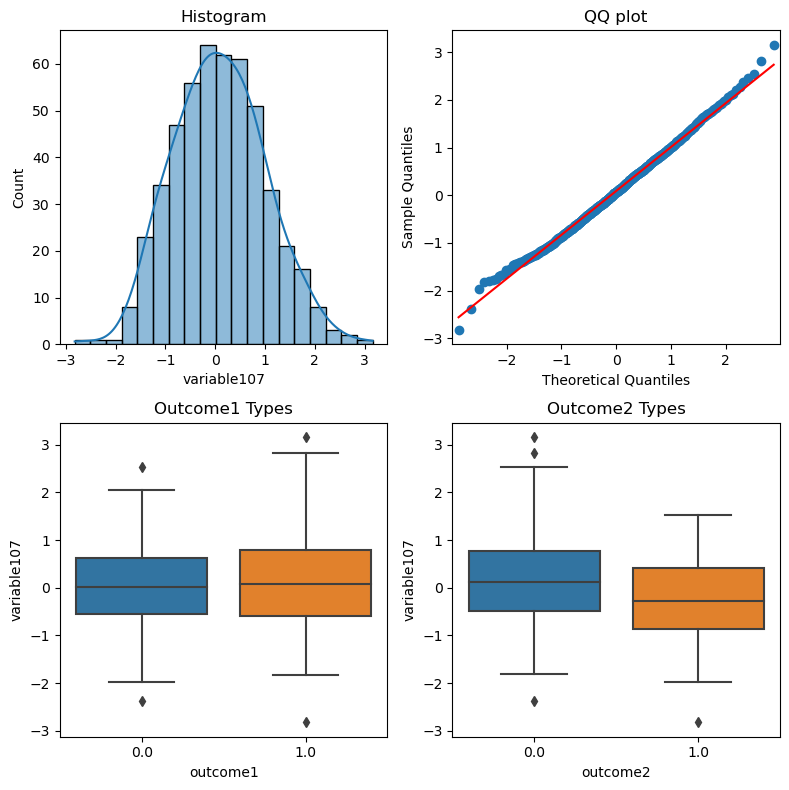

====================== Normality Test for variable108 ================================
Shapiro-Wilks Normality Test p-value:  0.2447
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8770
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1141


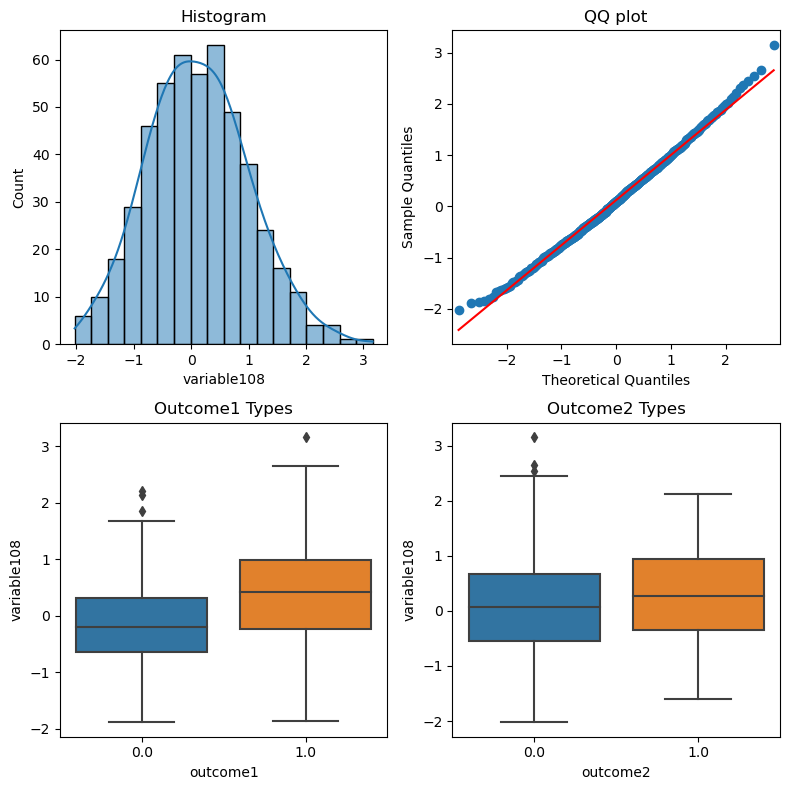

====================== Normality Test for variable109 ================================
Shapiro-Wilks Normality Test p-value:  0.2346
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9576
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1898


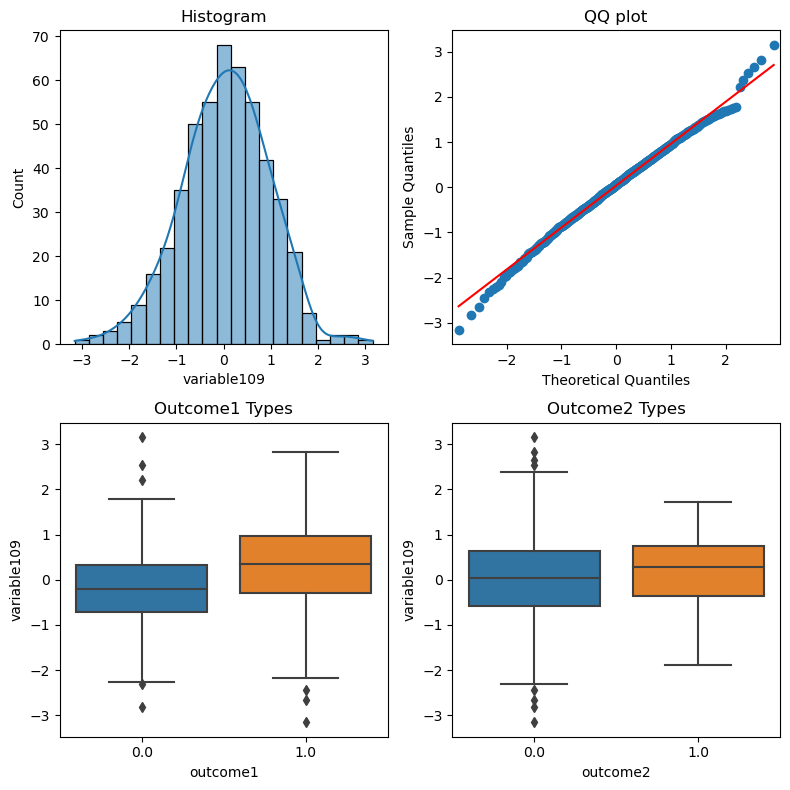

====================== Normality Test for variable110 ================================
Shapiro-Wilks Normality Test p-value:  0.9719
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9902
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.5618
Point-biserial correlation p-value (outcome2):  0.0183


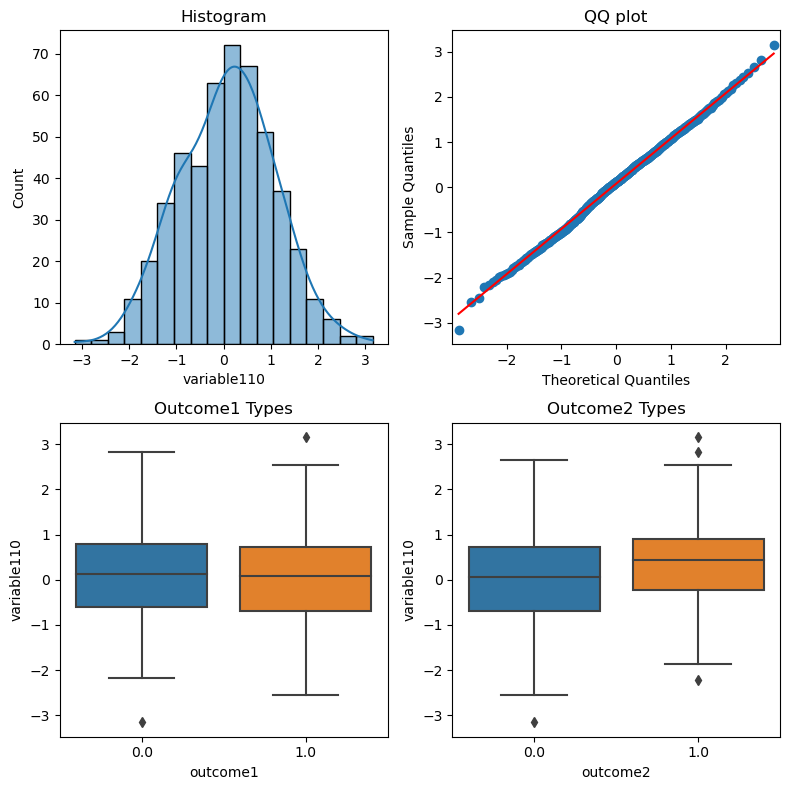

====================== Normality Test for variable111 ================================
Shapiro-Wilks Normality Test p-value:  0.0915
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8840
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0009
Point-biserial correlation p-value (outcome2):  0.0090


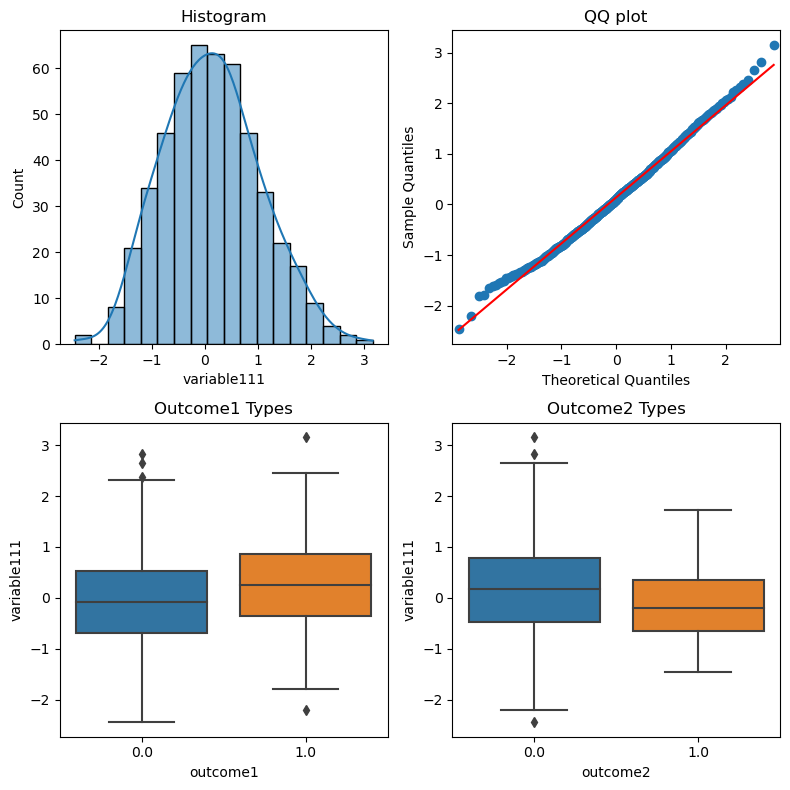

====================== Normality Test for variable112 ================================
Shapiro-Wilks Normality Test p-value:  0.6904
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8334
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0015
Point-biserial correlation p-value (outcome2):  0.0000


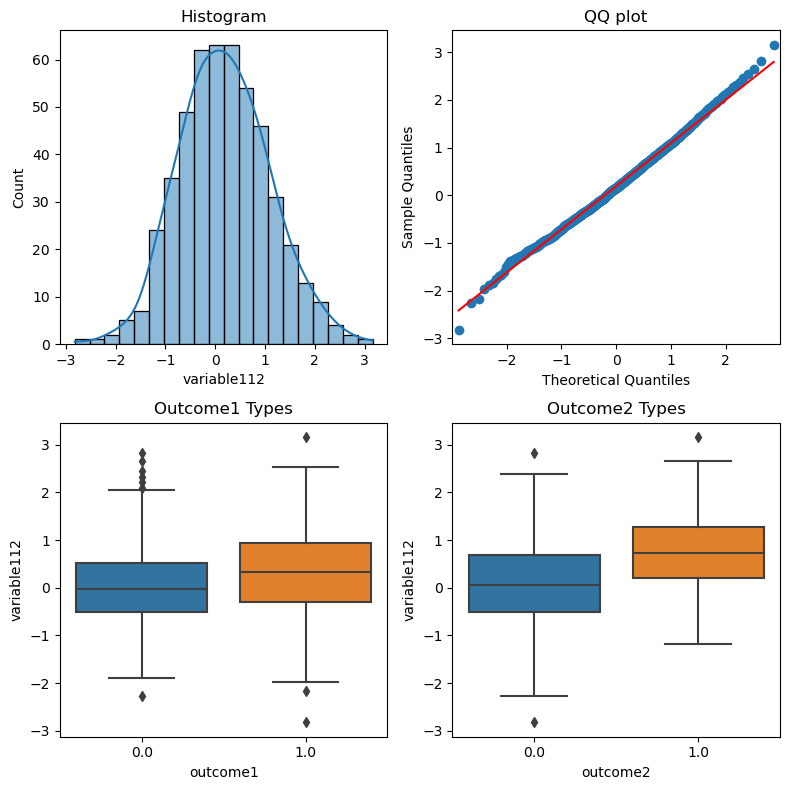

====================== Normality Test for variable113 ================================
Shapiro-Wilks Normality Test p-value:  0.0878
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8782
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1422


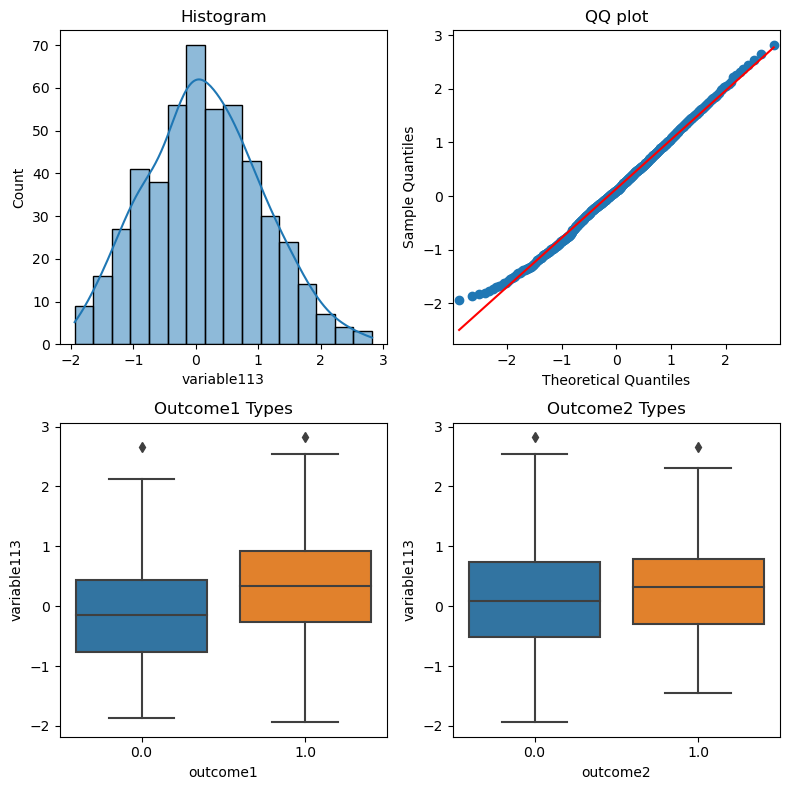

====================== Normality Test for variable114 ================================
Shapiro-Wilks Normality Test p-value:  0.9998
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9115
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.1248
Point-biserial correlation p-value (outcome2):  0.0003


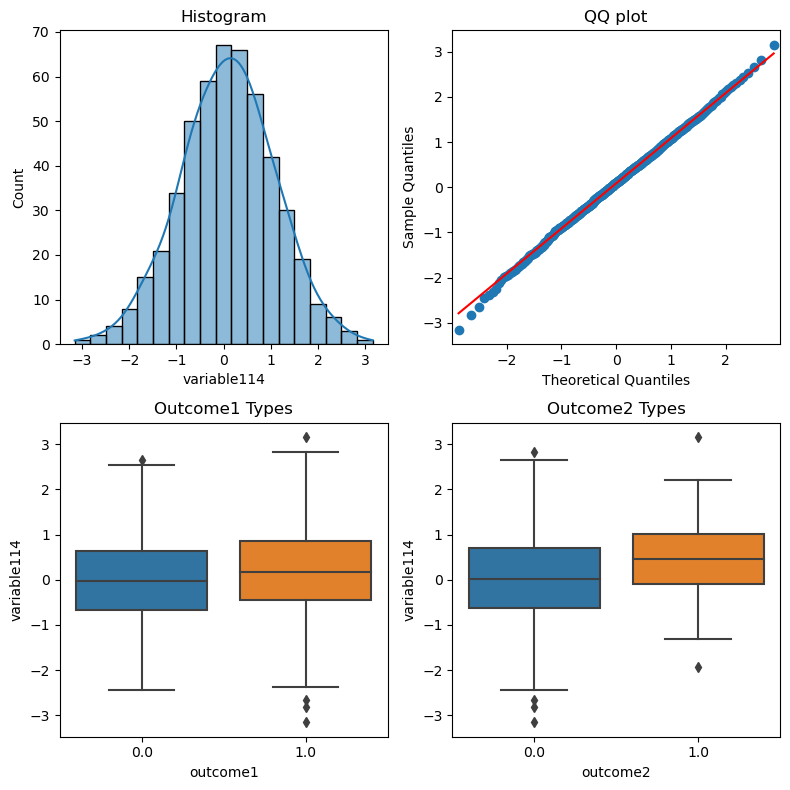

====================== Normality Test for variable115 ================================
Shapiro-Wilks Normality Test p-value:  0.9992
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8515
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0844
Point-biserial correlation p-value (outcome2):  0.0011


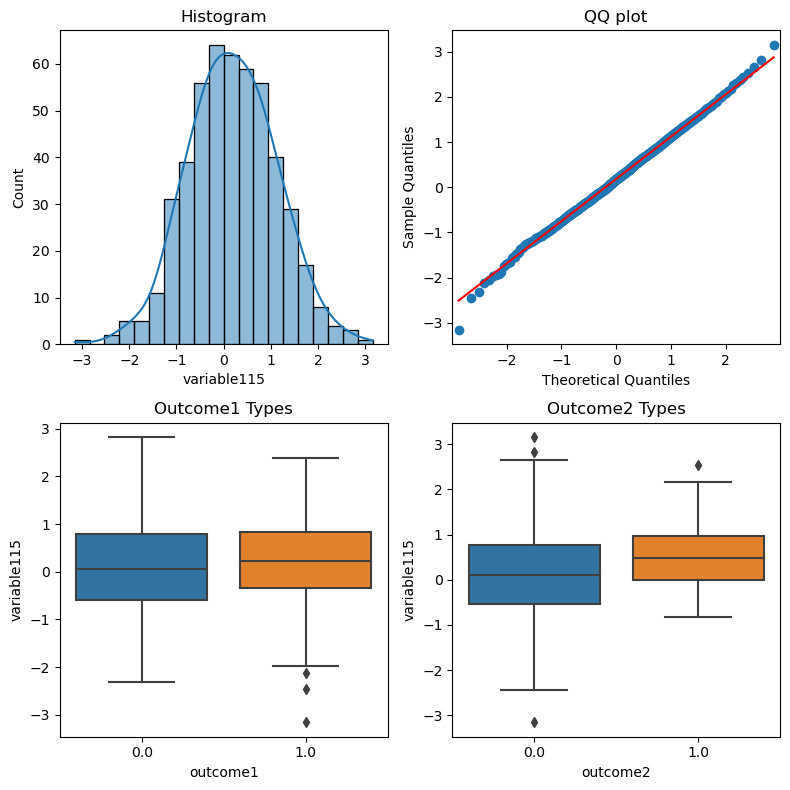

====================== Normality Test for variable116 ================================
Shapiro-Wilks Normality Test p-value:  0.2460
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8851
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


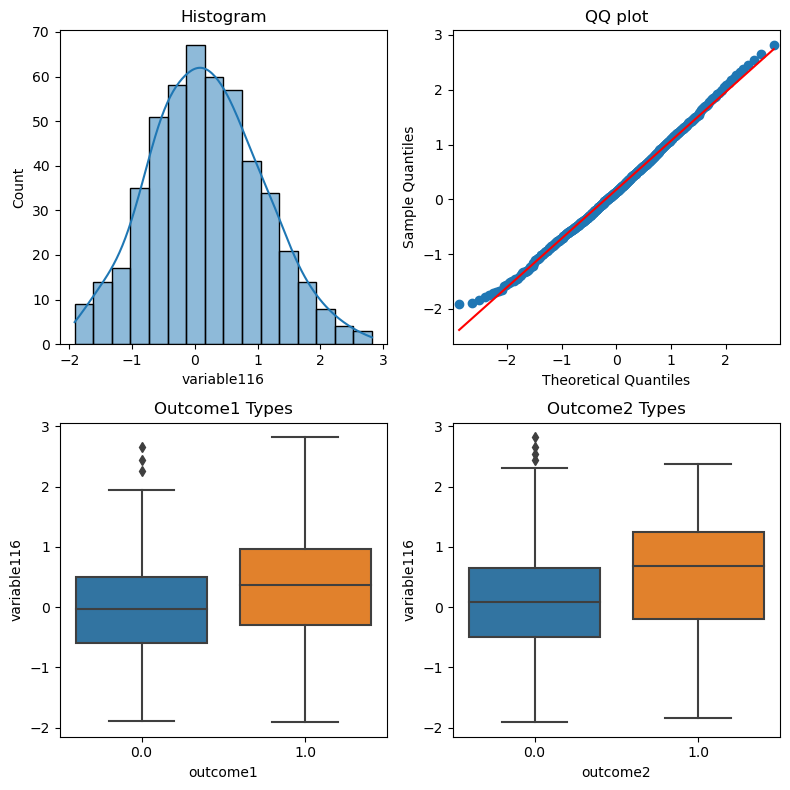

====================== Normality Test for variable117 ================================
Shapiro-Wilks Normality Test p-value:  0.3629
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8699
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0036
Point-biserial correlation p-value (outcome2):  0.0015


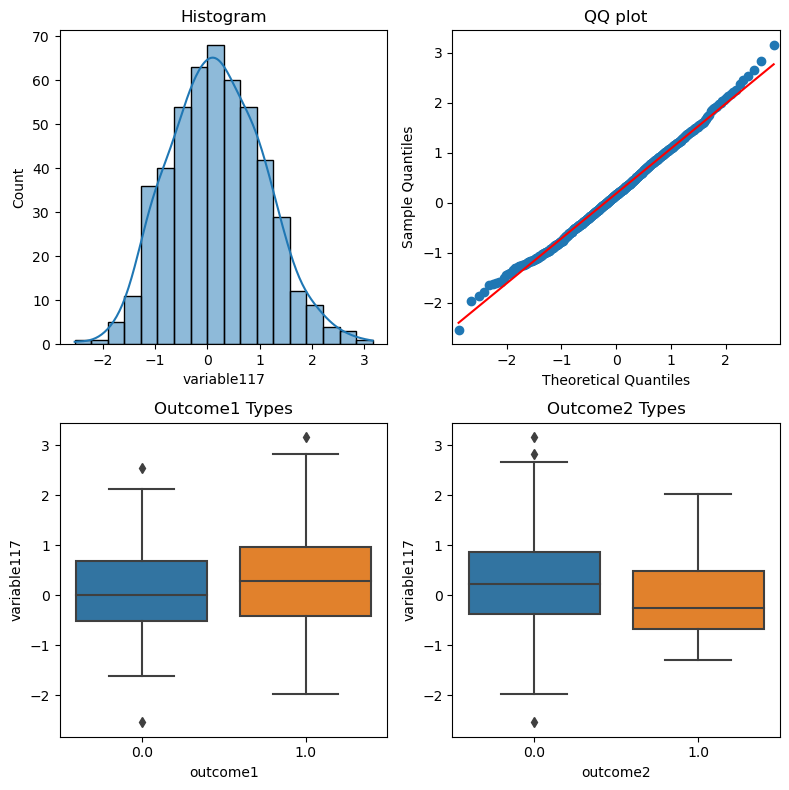

====================== Normality Test for variable118 ================================
Shapiro-Wilks Normality Test p-value:  1.0000
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9191
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.2012
Point-biserial correlation p-value (outcome2):  0.2225


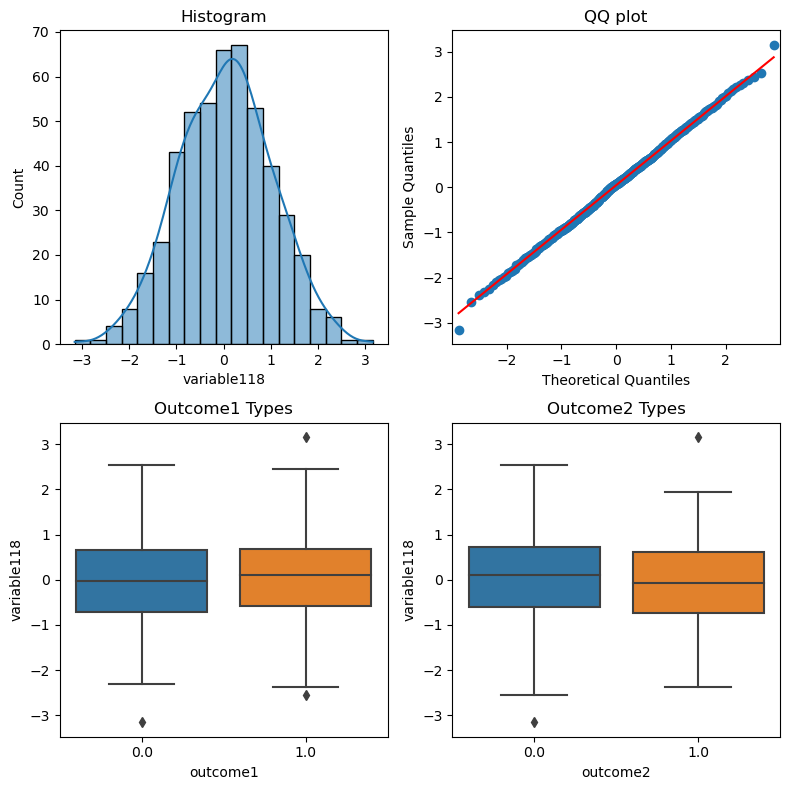

====================== Normality Test for variable119 ================================
Shapiro-Wilks Normality Test p-value:  1.0000
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8996
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1757


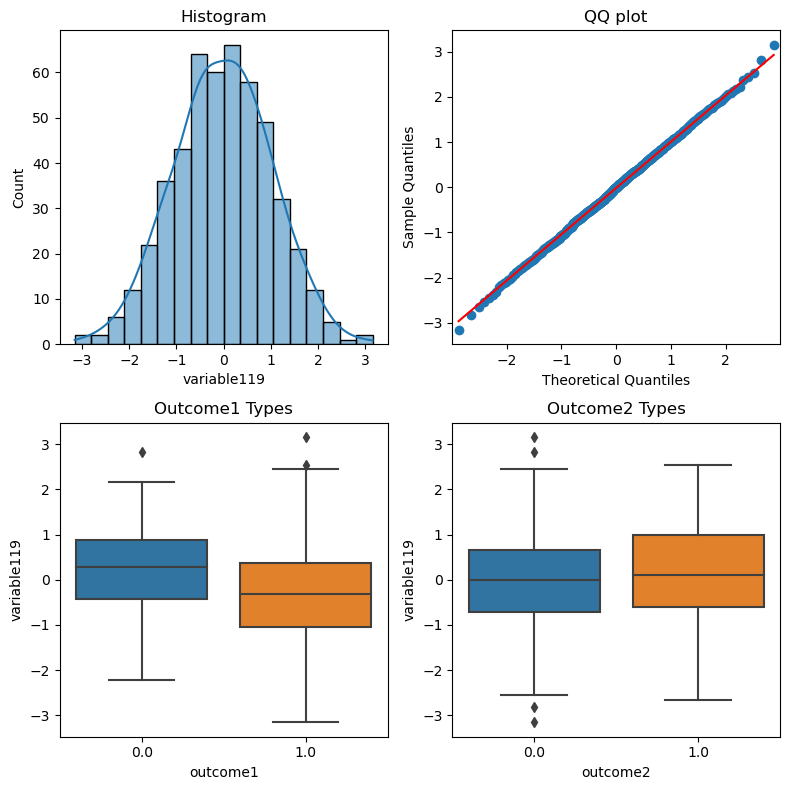

====================== Normality Test for variable120 ================================
Shapiro-Wilks Normality Test p-value:  0.5484
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8557
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.4393
Point-biserial correlation p-value (outcome2):  0.8609


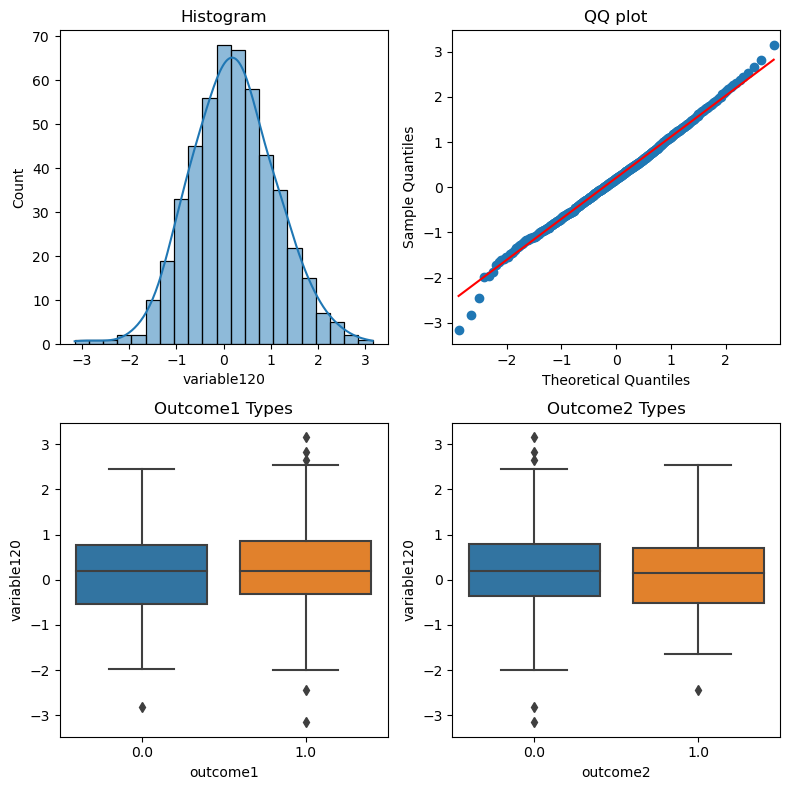

====================== Normality Test for variable121 ================================
Shapiro-Wilks Normality Test p-value:  0.9964
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9961
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0012
Point-biserial correlation p-value (outcome2):  0.9722


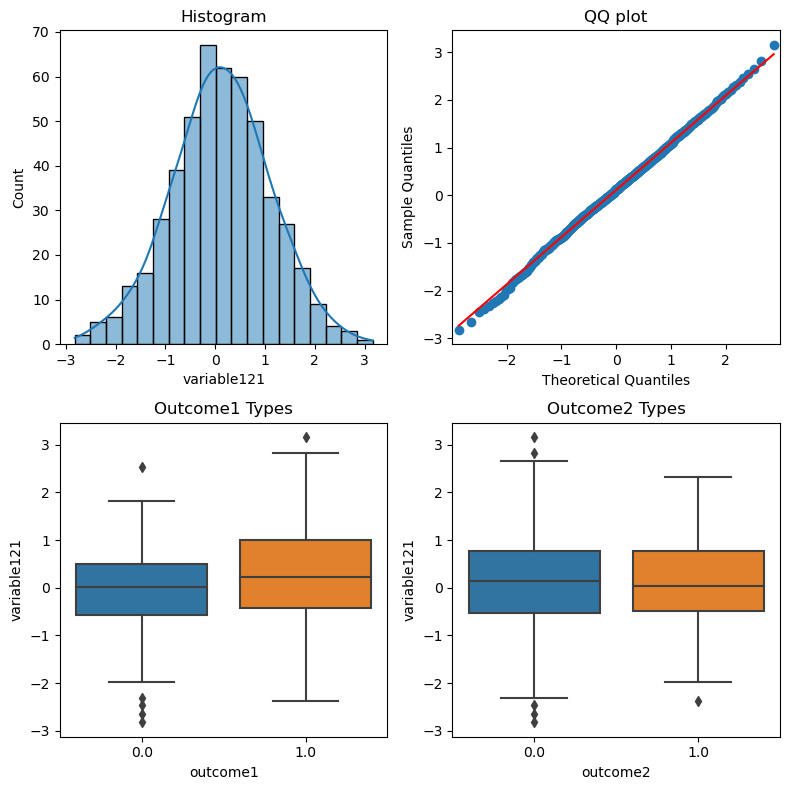

====================== Normality Test for variable122 ================================
Shapiro-Wilks Normality Test p-value:  0.9867
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9026
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0278
Point-biserial correlation p-value (outcome2):  0.0020


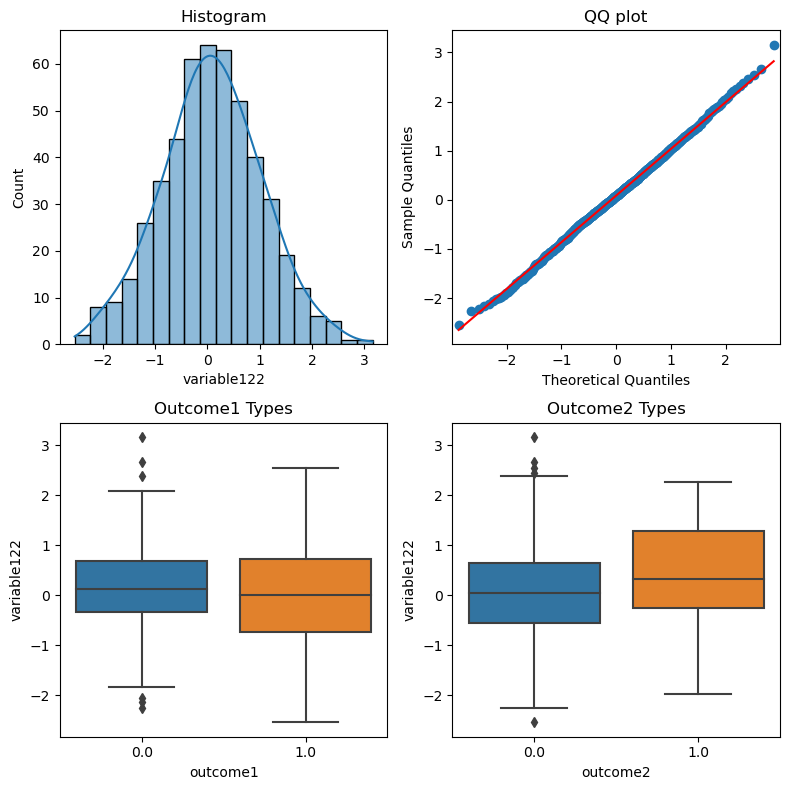

====================== Normality Test for variable123 ================================
Shapiro-Wilks Normality Test p-value:  0.5884
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9721
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.7193
Point-biserial correlation p-value (outcome2):  0.0000


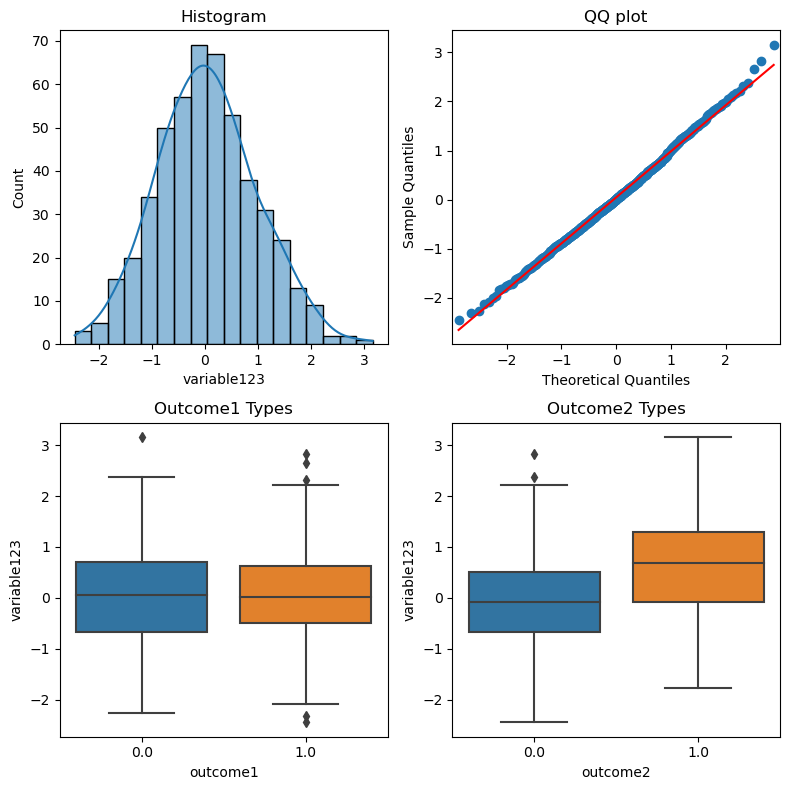

====================== Normality Test for variable124 ================================
Shapiro-Wilks Normality Test p-value:  1.0000
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9520
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.1887
Point-biserial correlation p-value (outcome2):  0.0000


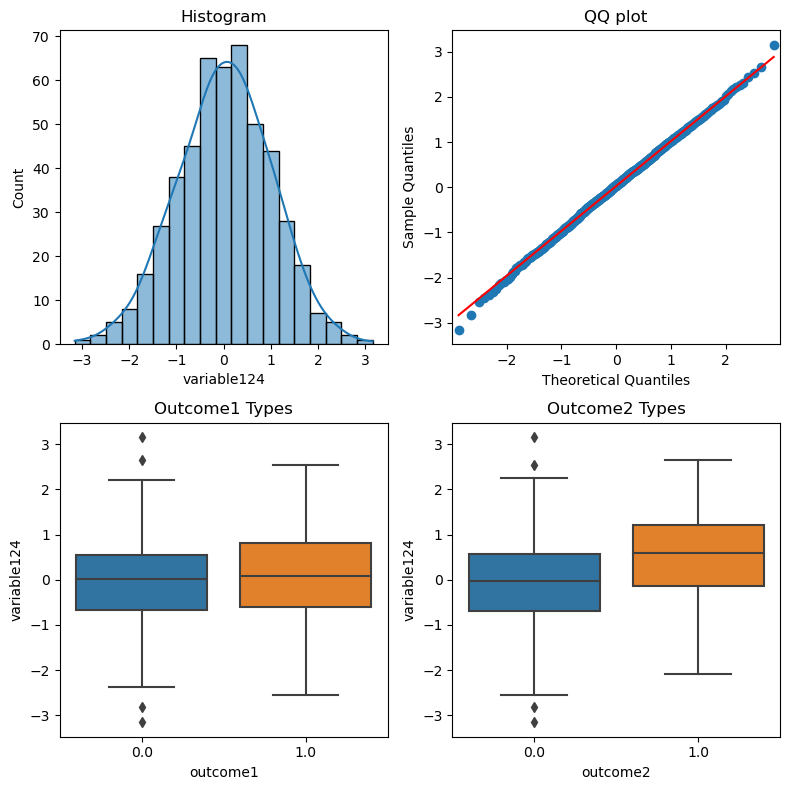

====================== Normality Test for variable125 ================================
Shapiro-Wilks Normality Test p-value:  0.8472
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9470
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.1982


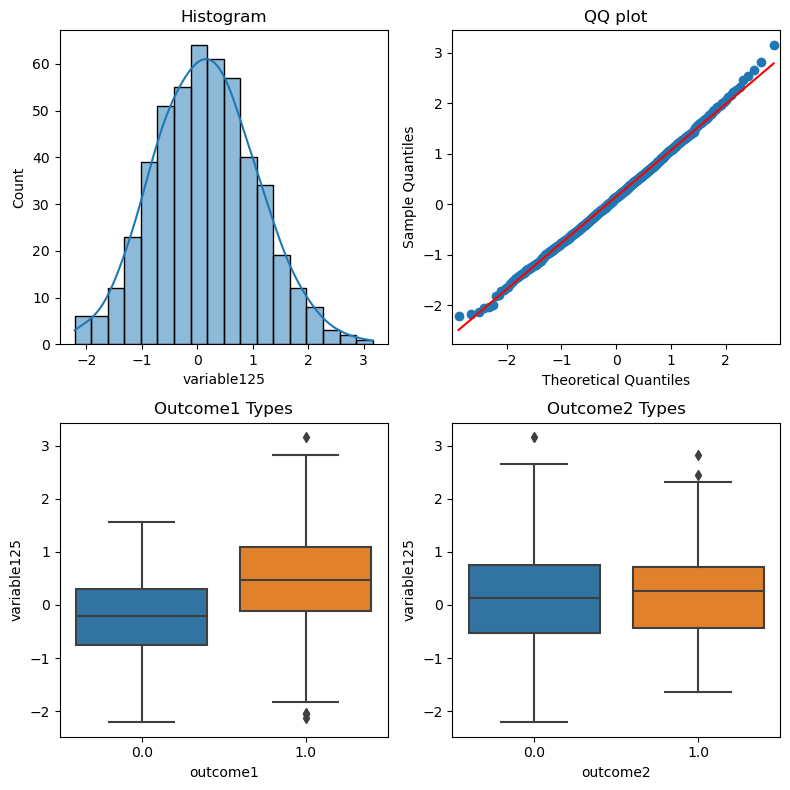

====================== Normality Test for variable126 ================================
Shapiro-Wilks Normality Test p-value:  0.9337
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8573
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.1182
Point-biserial correlation p-value (outcome2):  0.0047


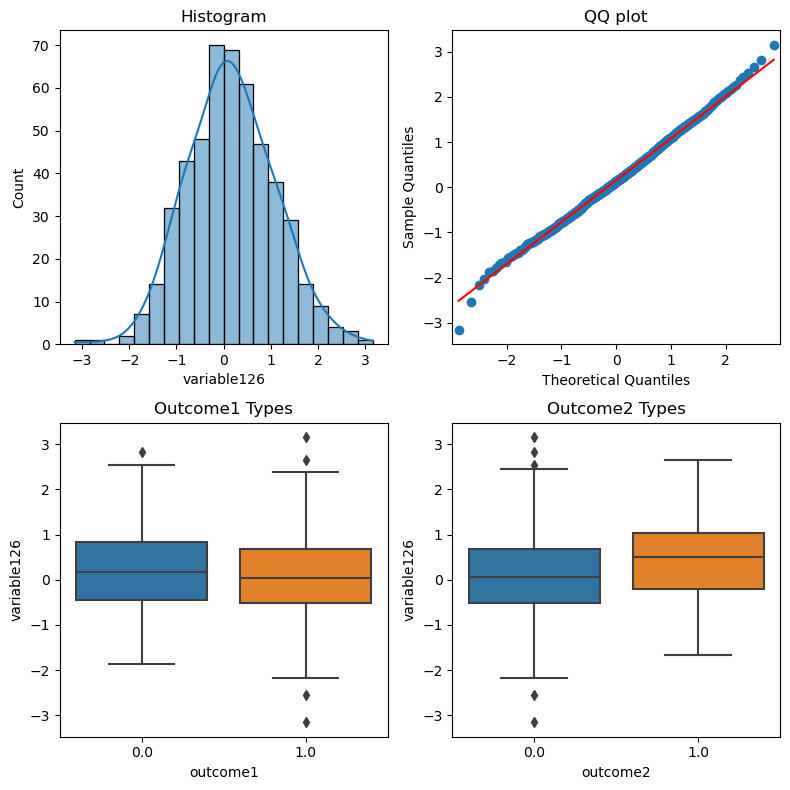

====================== Normality Test for variable127 ================================
Shapiro-Wilks Normality Test p-value:  0.0037
boxcox transform p-value:  0.0366
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8877
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


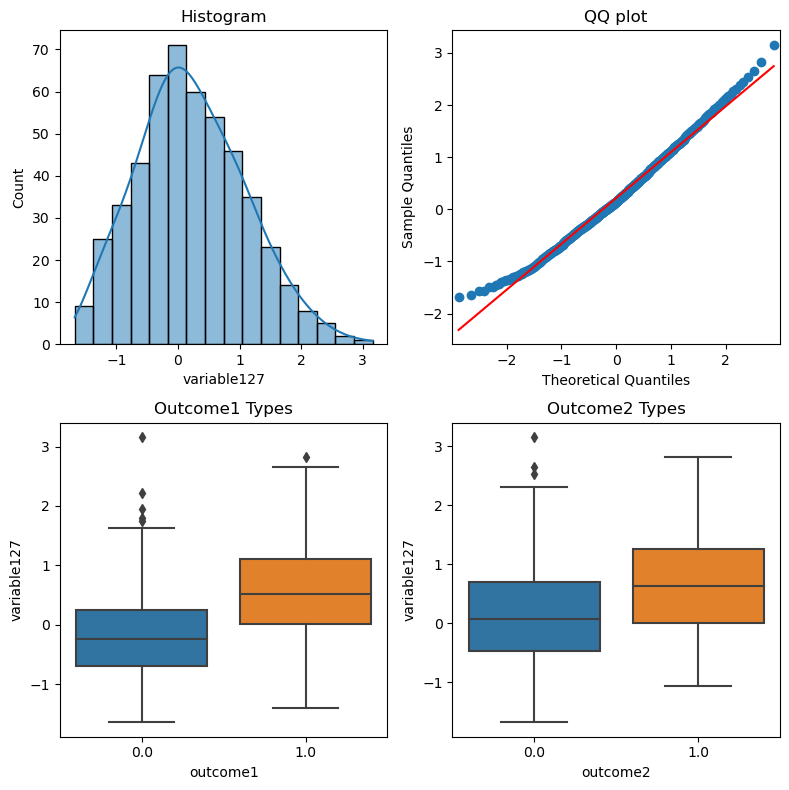

====================== Normality Test for variable128 ================================
Shapiro-Wilks Normality Test p-value:  0.3180
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9992
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3195
Point-biserial correlation p-value (outcome2):  0.0078


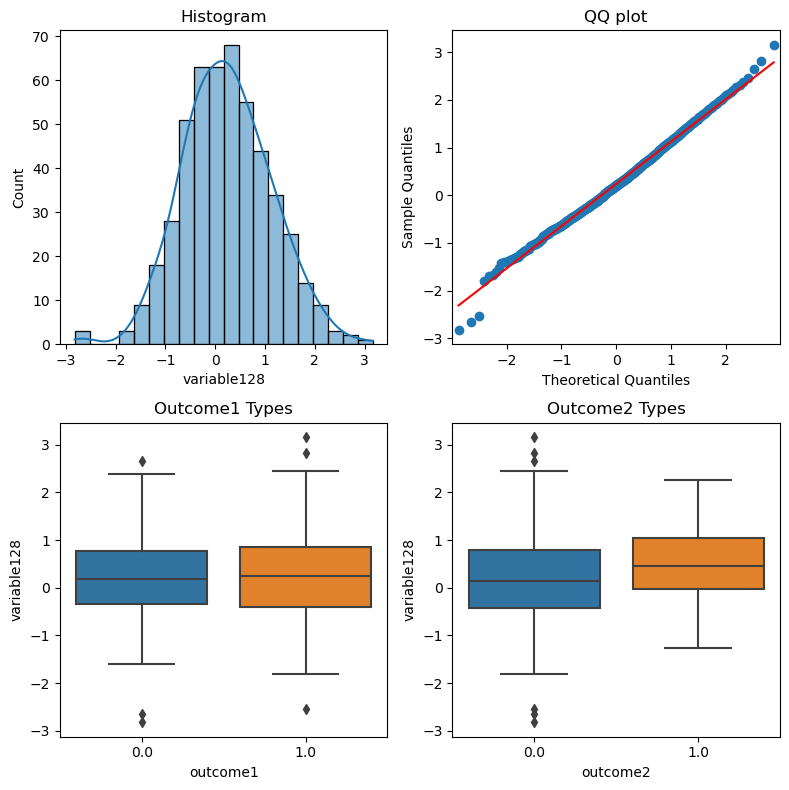

====================== Normality Test for variable129 ================================
Shapiro-Wilks Normality Test p-value:  0.6125
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9656
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0322
Point-biserial correlation p-value (outcome2):  0.0386


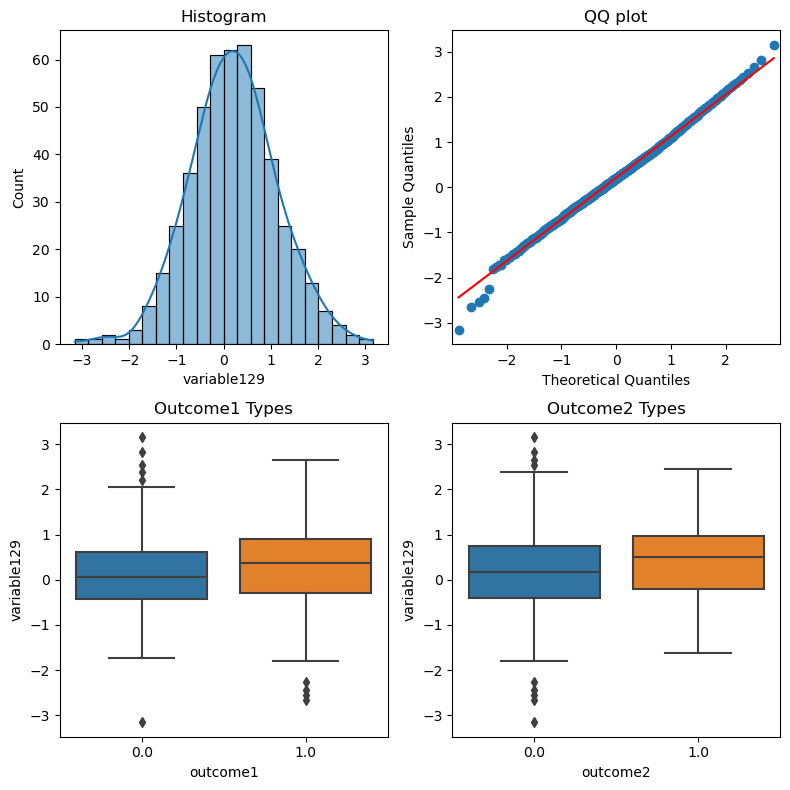

====================== Normality Test for variable130 ================================
Shapiro-Wilks Normality Test p-value:  0.2269
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9227
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.7858


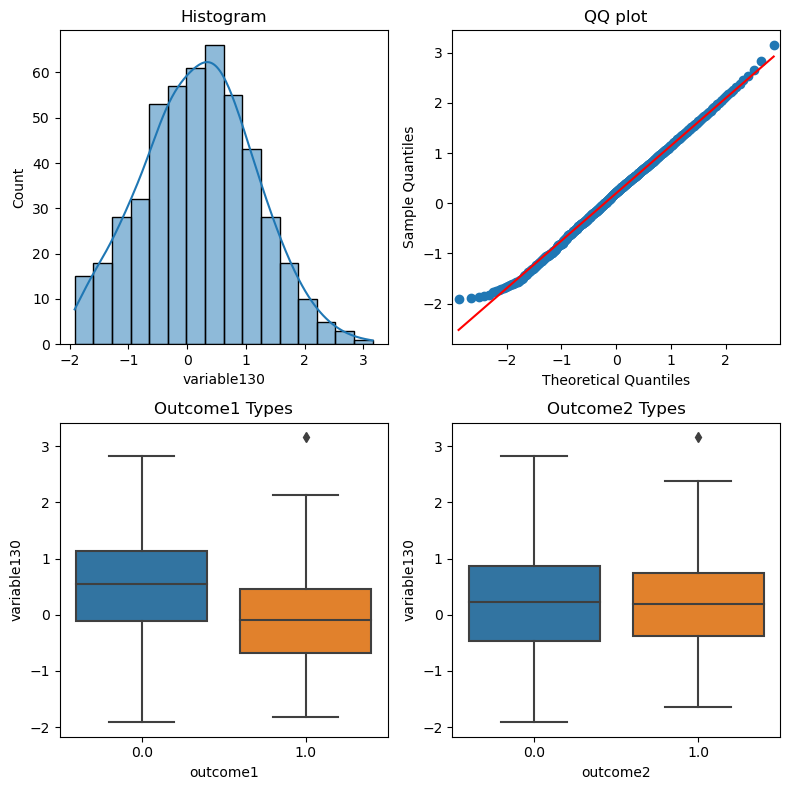

====================== Normality Test for variable131 ================================
Shapiro-Wilks Normality Test p-value:  0.8529
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8742
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9905
Point-biserial correlation p-value (outcome2):  0.8149


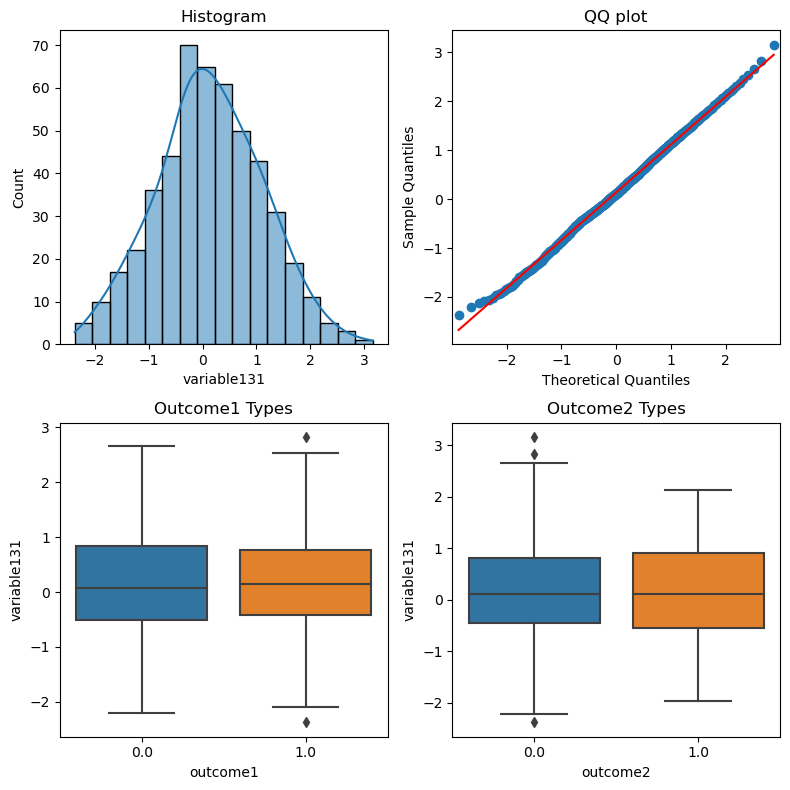

====================== Normality Test for variable132 ================================
Shapiro-Wilks Normality Test p-value:  0.8752
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9775
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.4617


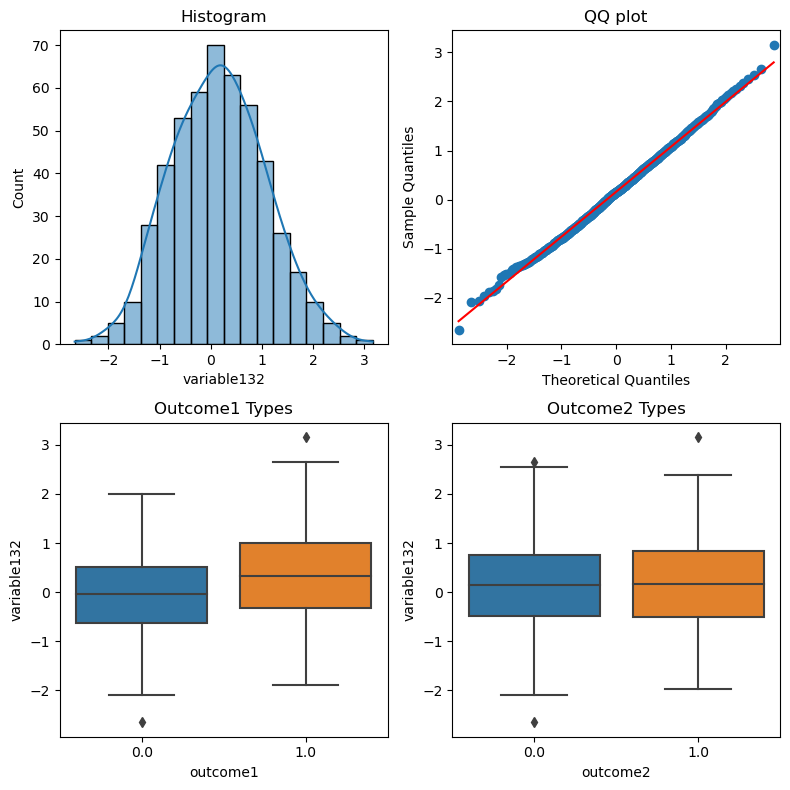

====================== Normality Test for variable133 ================================
Shapiro-Wilks Normality Test p-value:  0.5499
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9734
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9367
Point-biserial correlation p-value (outcome2):  0.3117


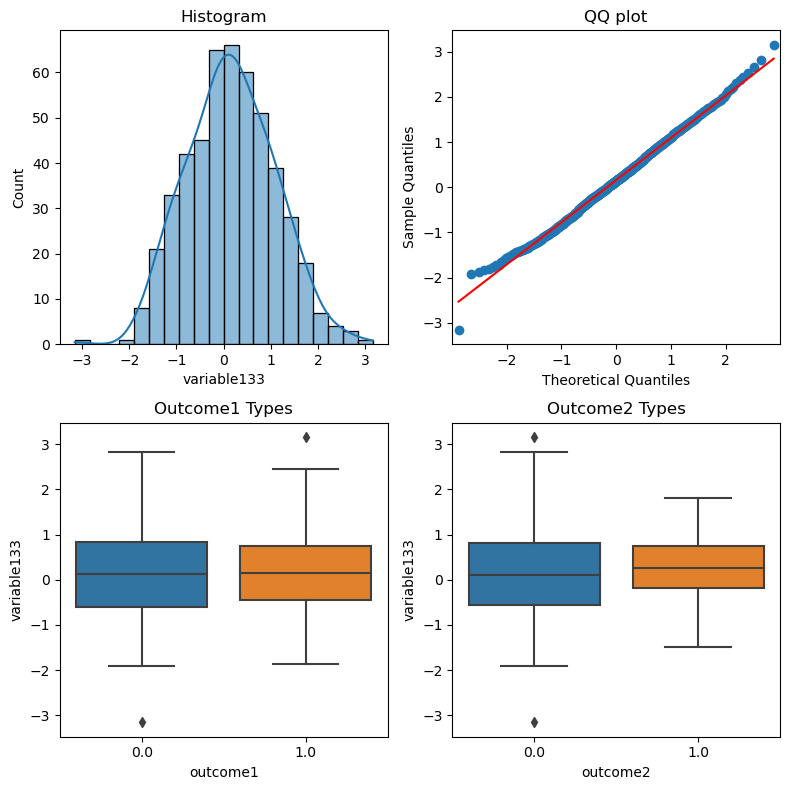

====================== Normality Test for variable134 ================================
Shapiro-Wilks Normality Test p-value:  0.9746
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9434
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0619
Point-biserial correlation p-value (outcome2):  0.0516


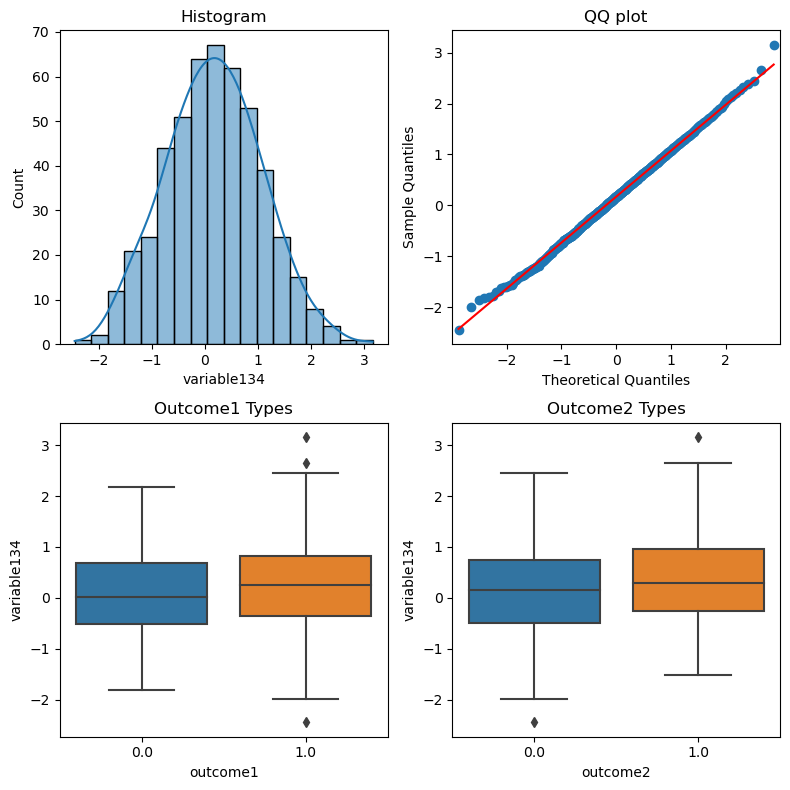

====================== Normality Test for variable135 ================================
Shapiro-Wilks Normality Test p-value:  0.0367
boxcox transform p-value:  0.0525
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8128
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0783
Point-biserial correlation p-value (outcome2):  0.5776


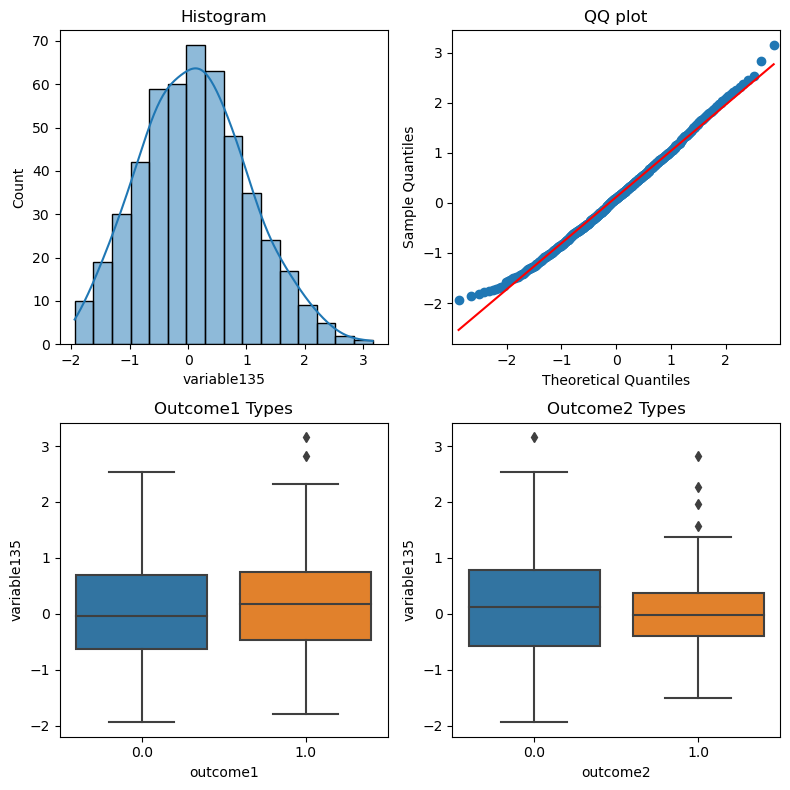

====================== Normality Test for variable136 ================================
Shapiro-Wilks Normality Test p-value:  1.0000
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9641
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.5194


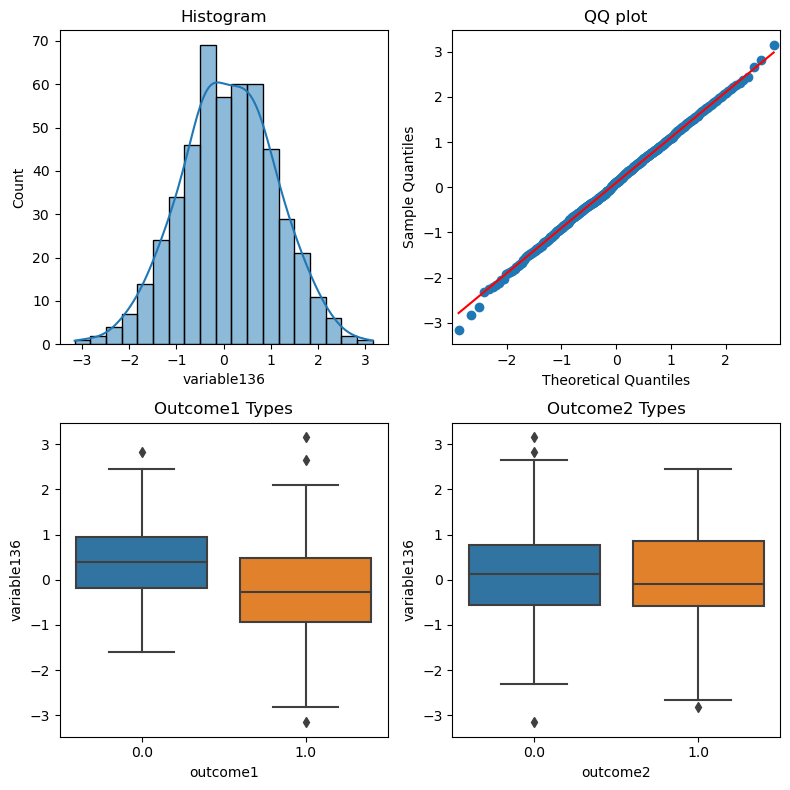

====================== Normality Test for variable137 ================================
Shapiro-Wilks Normality Test p-value:  0.1996
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9241
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.9367
Point-biserial correlation p-value (outcome2):  0.6952


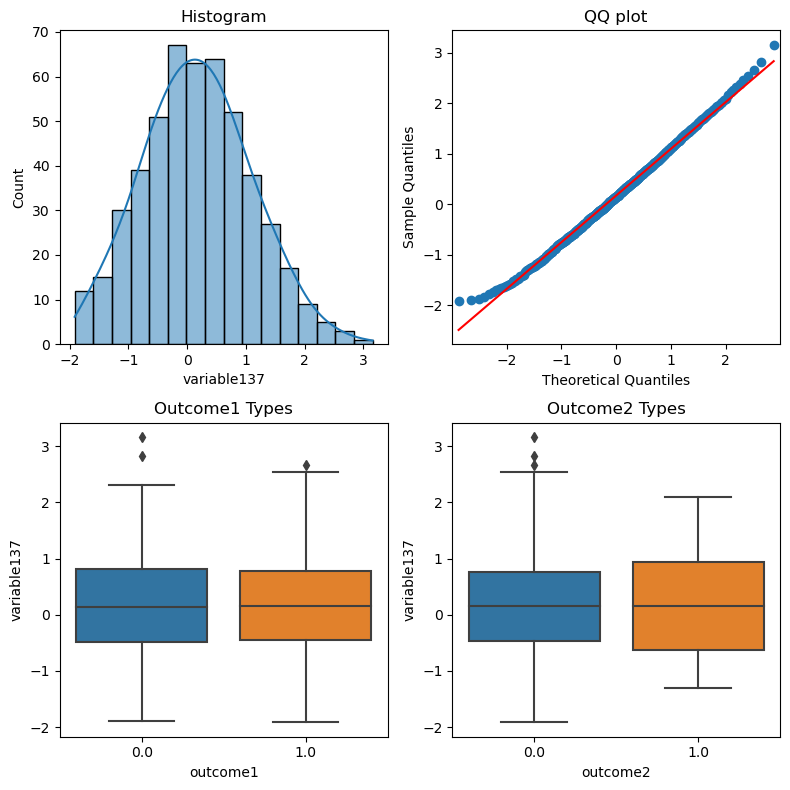

====================== Normality Test for variable138 ================================
Shapiro-Wilks Normality Test p-value:  0.8101
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8125
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.4565


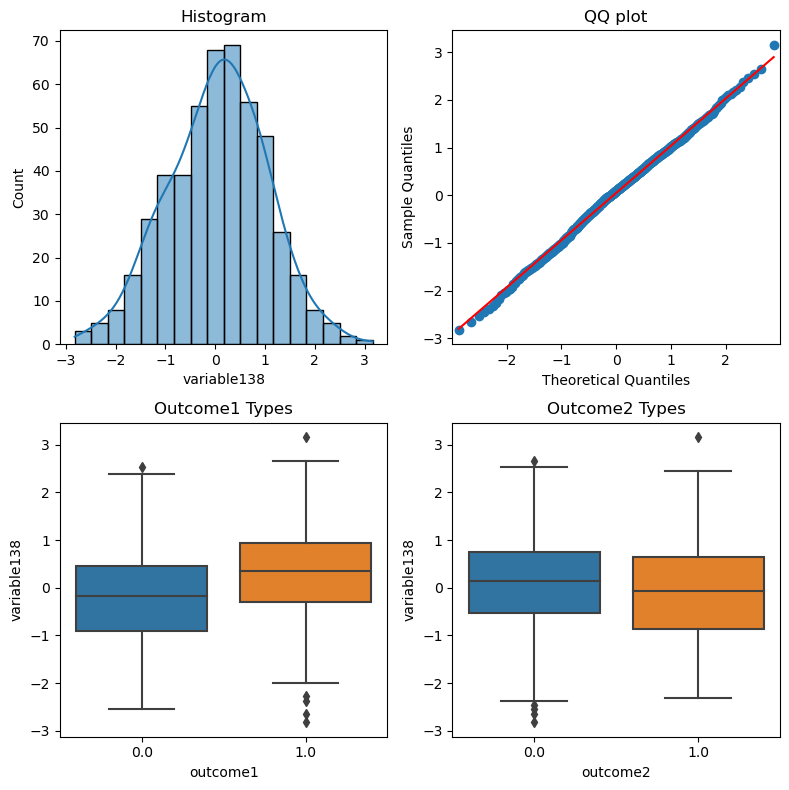

====================== Normality Test for variable10 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0329
Chi-square Correlation Test p-value (outcome2 df=1):  0.5560


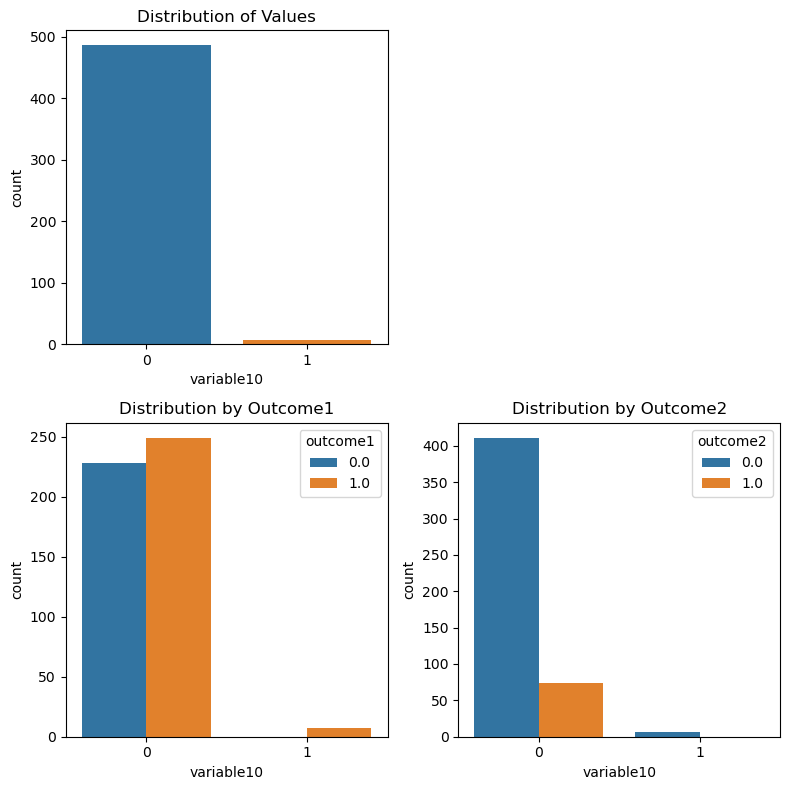

====================== Normality Test for variable11 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.1775
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


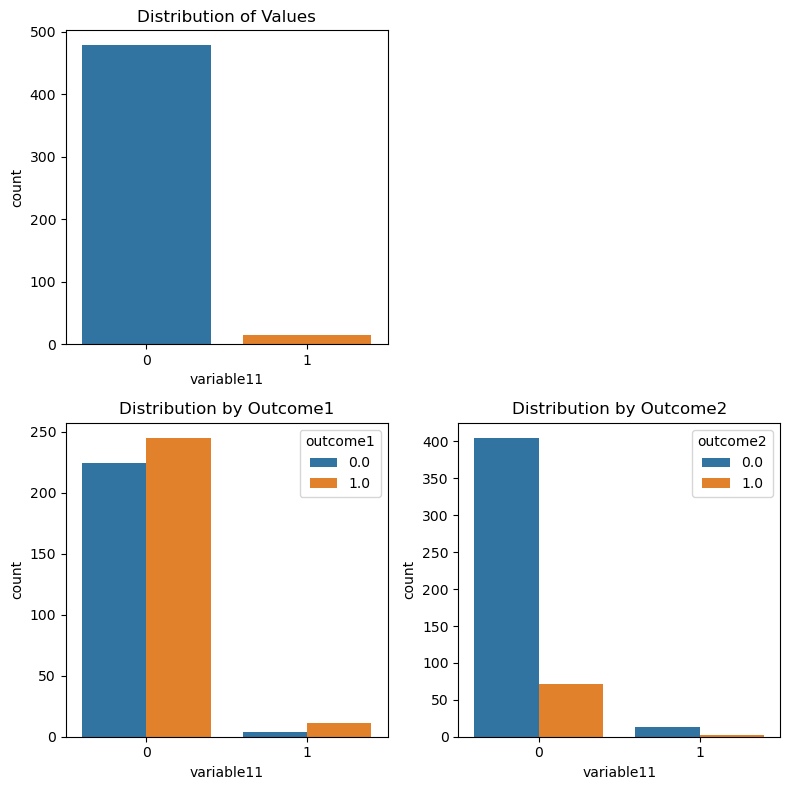

====================== Normality Test for variable14 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.6733
Chi-square Correlation Test p-value (outcome2 df=1):  0.3355


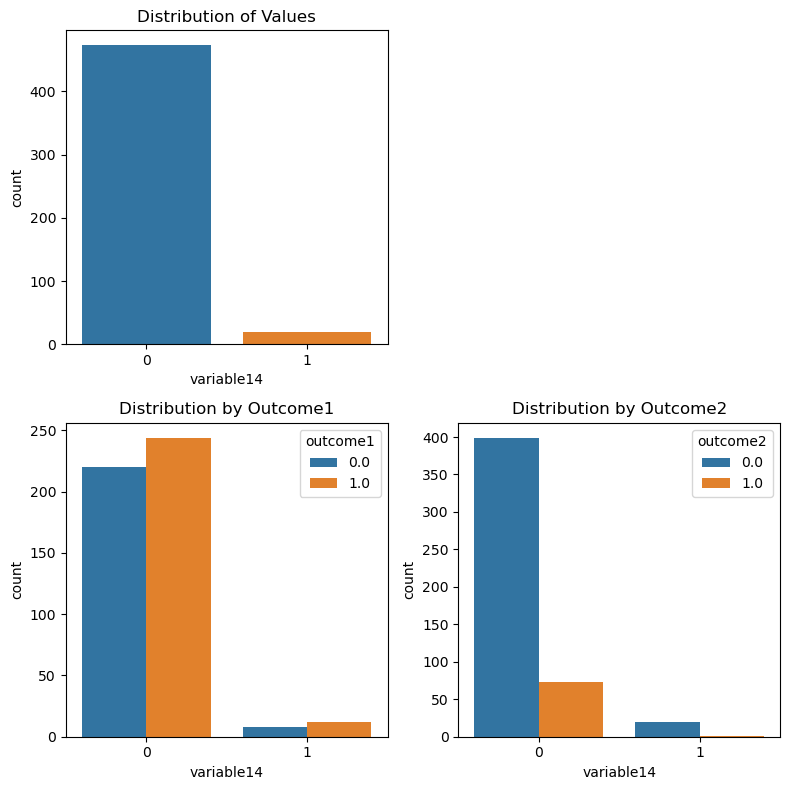

====================== Normality Test for variable15 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  1.0000
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


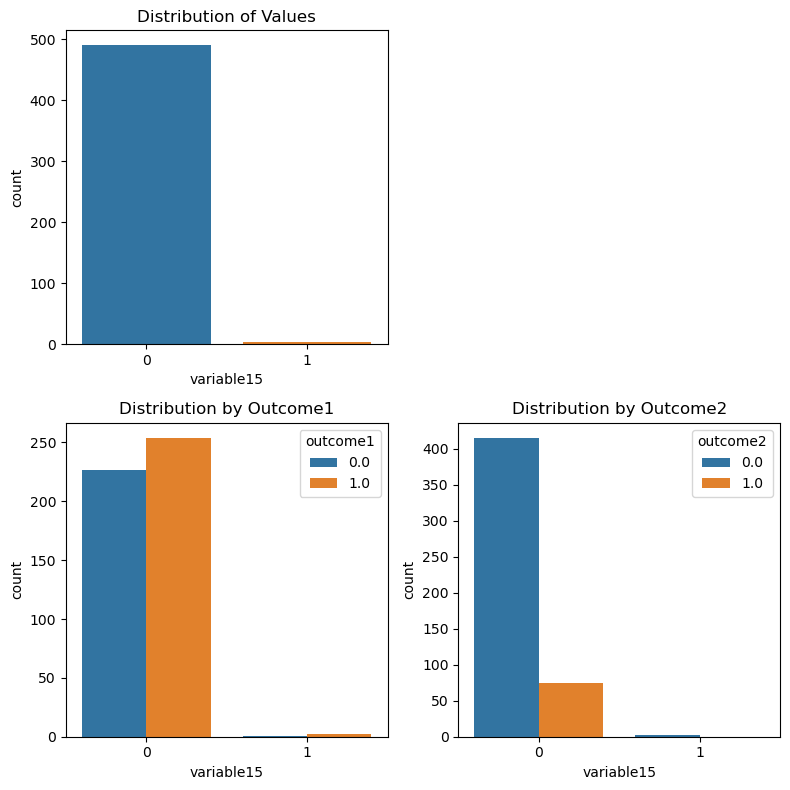

====================== Normality Test for variable16 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0196
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


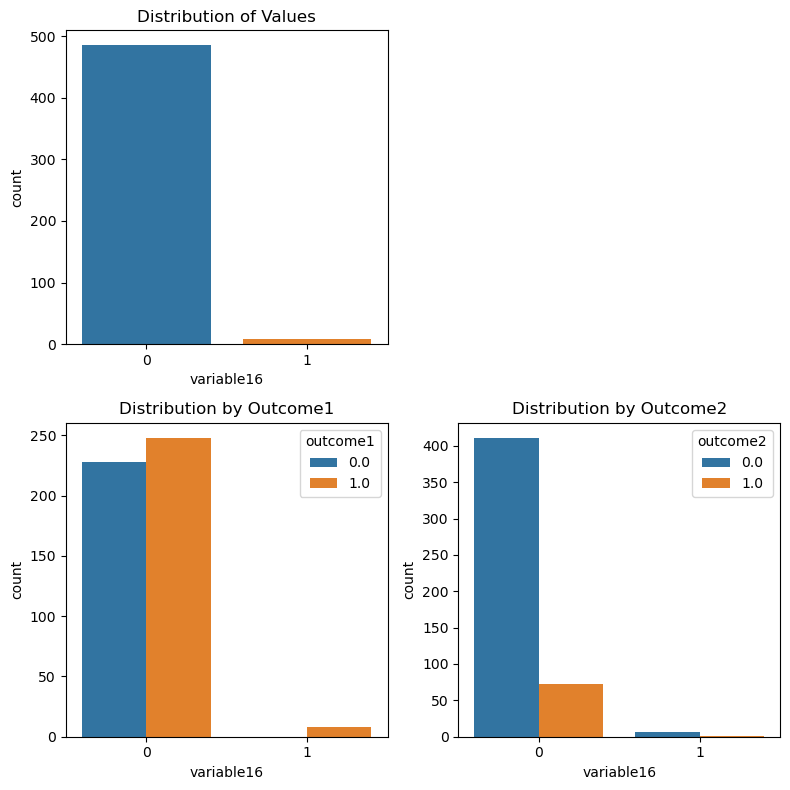

====================== Normality Test for variable17 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  1.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0092


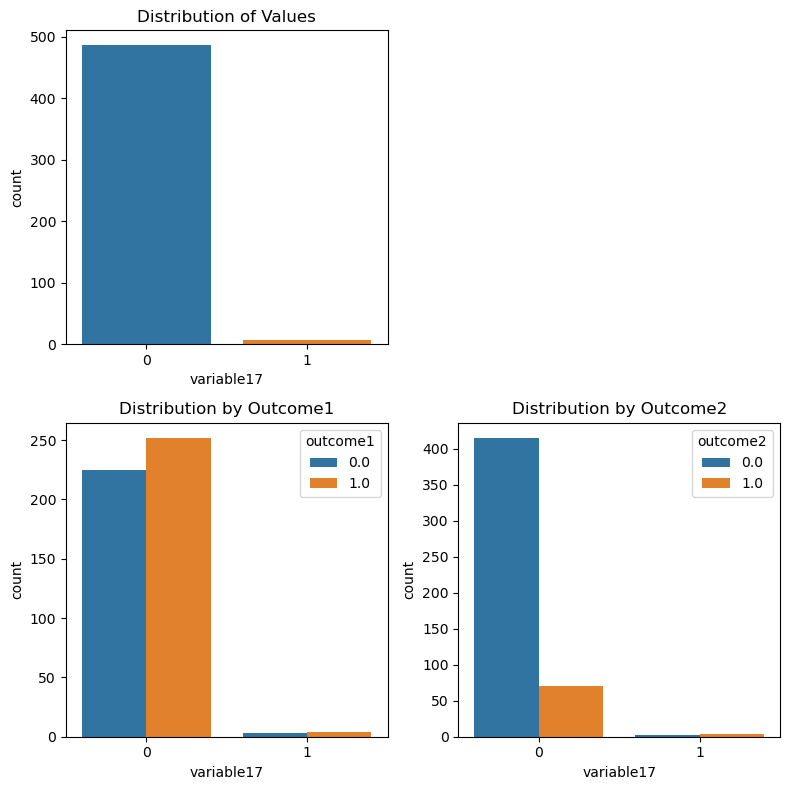

====================== Normality Test for variable18 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  1.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0371


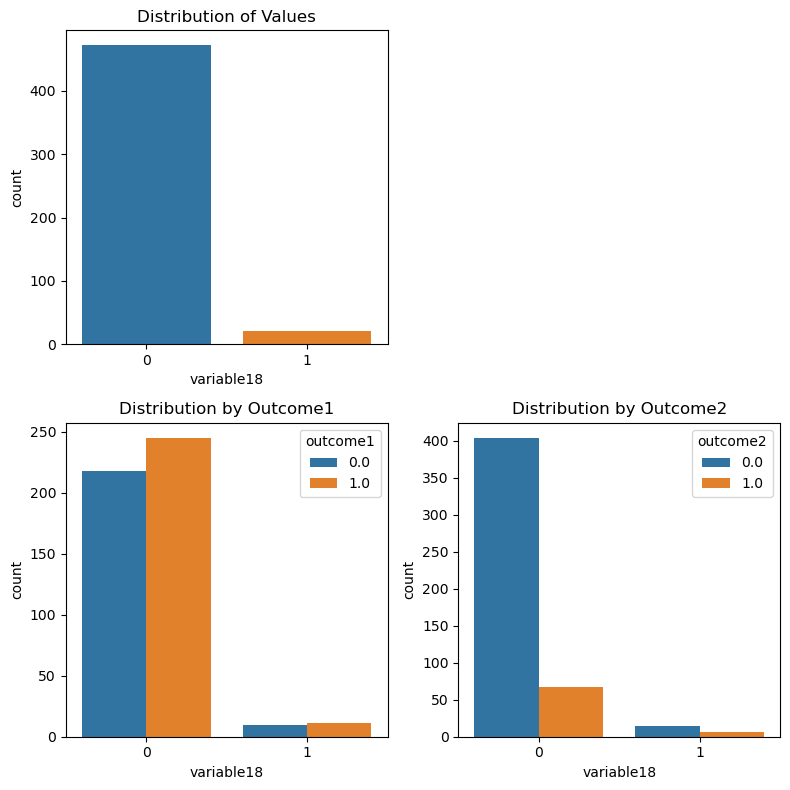

====================== Normality Test for variable19 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.9537
Chi-square Correlation Test p-value (outcome2 df=1):  0.3276


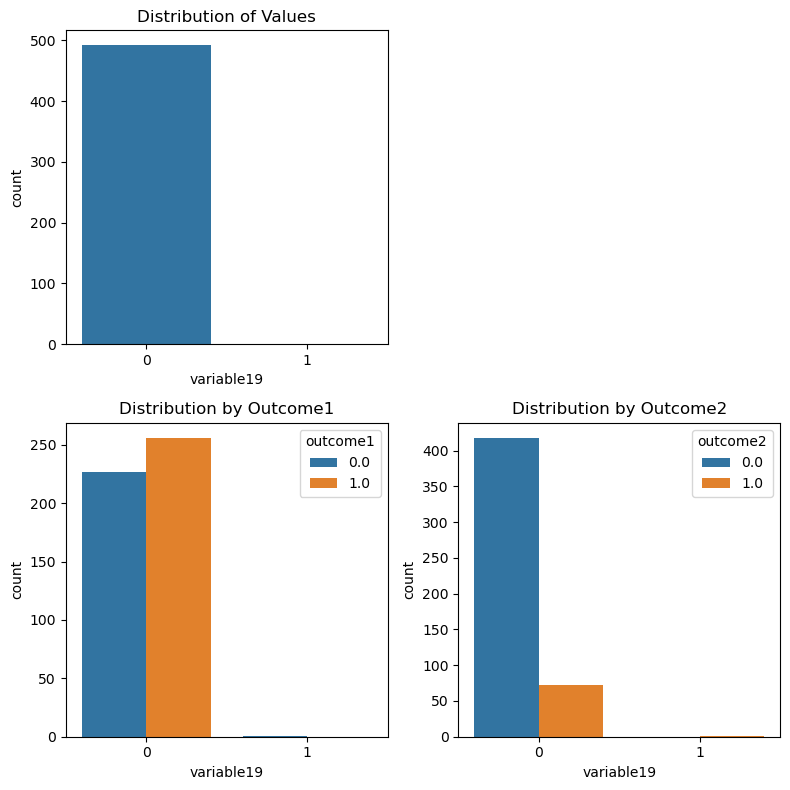

====================== Normality Test for variable2 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.1158
Chi-square Correlation Test p-value (outcome2 df=1):  0.1428


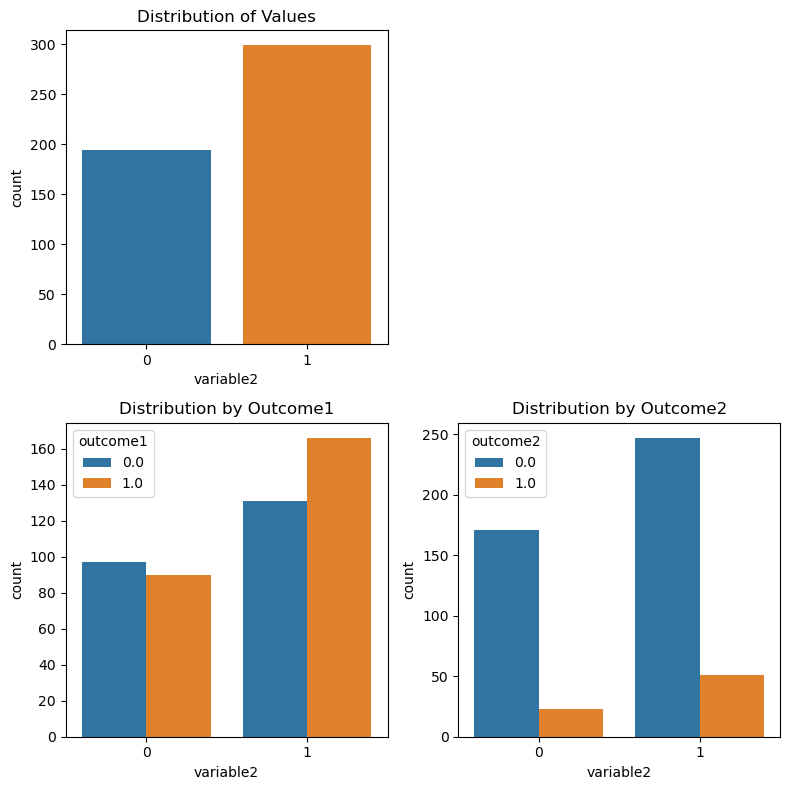

====================== Normality Test for variable20 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0648
Chi-square Correlation Test p-value (outcome2 df=1):  0.4217


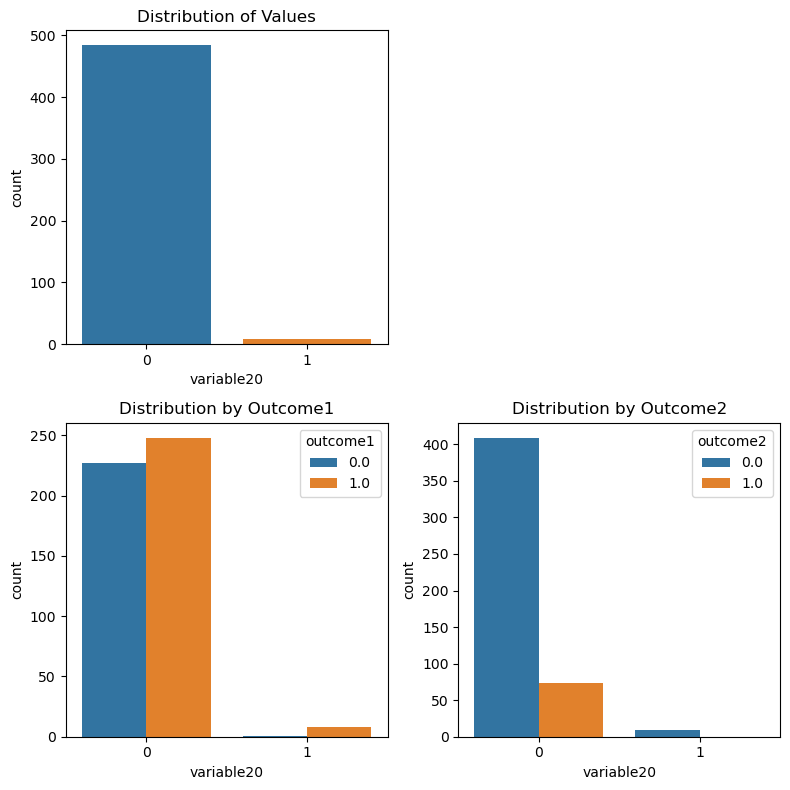

====================== Normality Test for variable21 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.1394
Chi-square Correlation Test p-value (outcome2 df=1):  0.6684


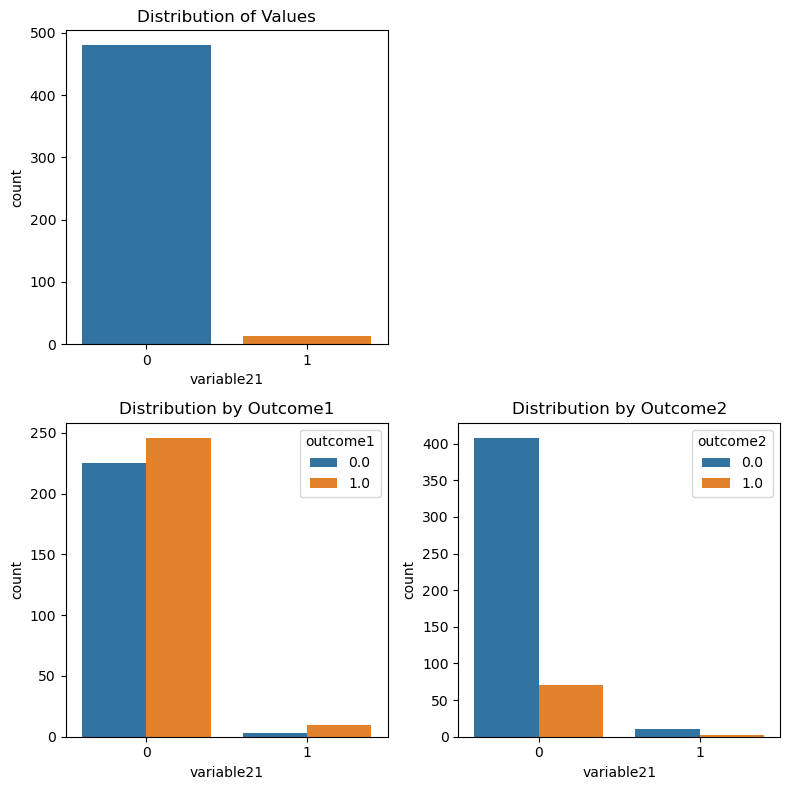

====================== Normality Test for variable22 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0176
Chi-square Correlation Test p-value (outcome2 df=1):  0.1884


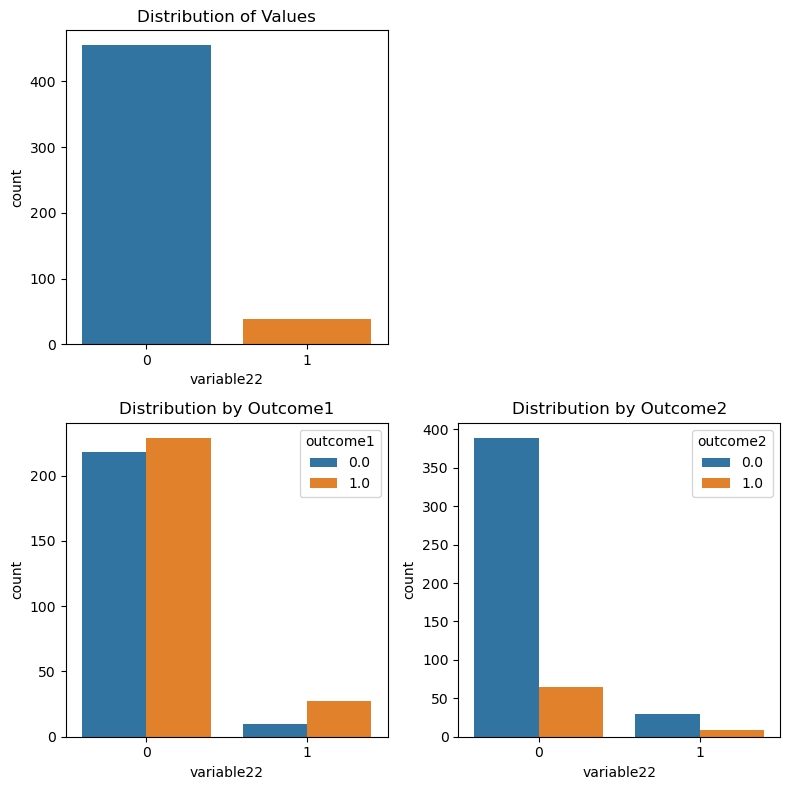

====================== Normality Test for variable23 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0006
Chi-square Correlation Test p-value (outcome2 df=1):  0.9550


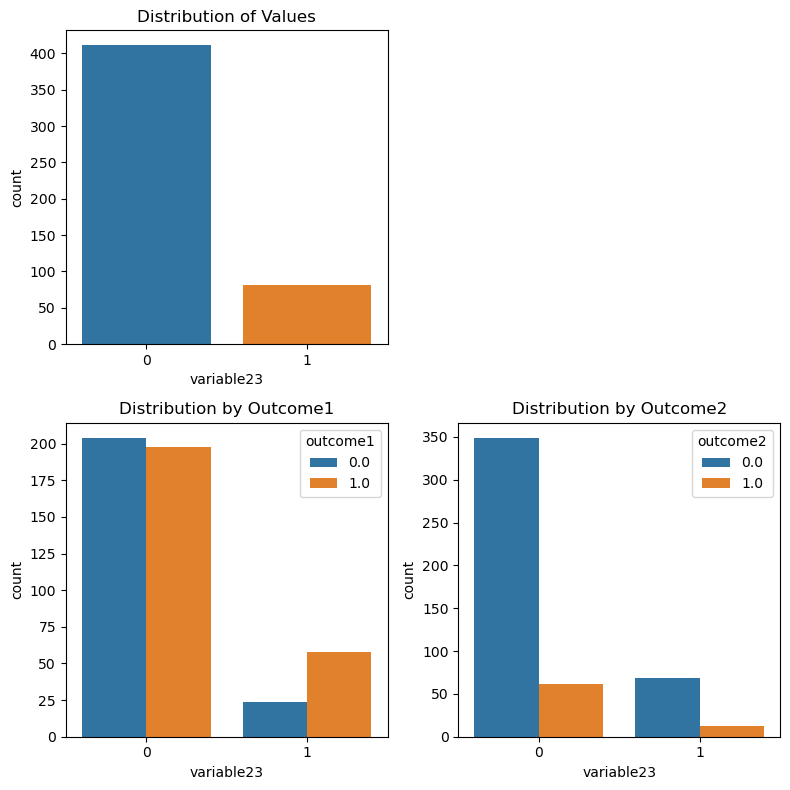

====================== Normality Test for variable24 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0555
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


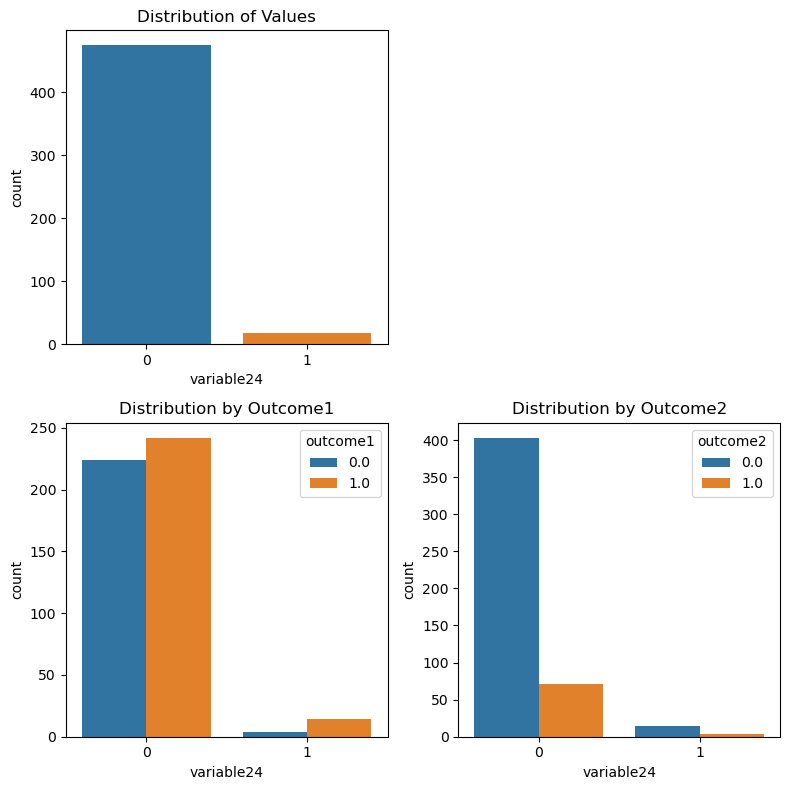

====================== Normality Test for variable25 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.1638
Chi-square Correlation Test p-value (outcome2 df=1):  0.2071


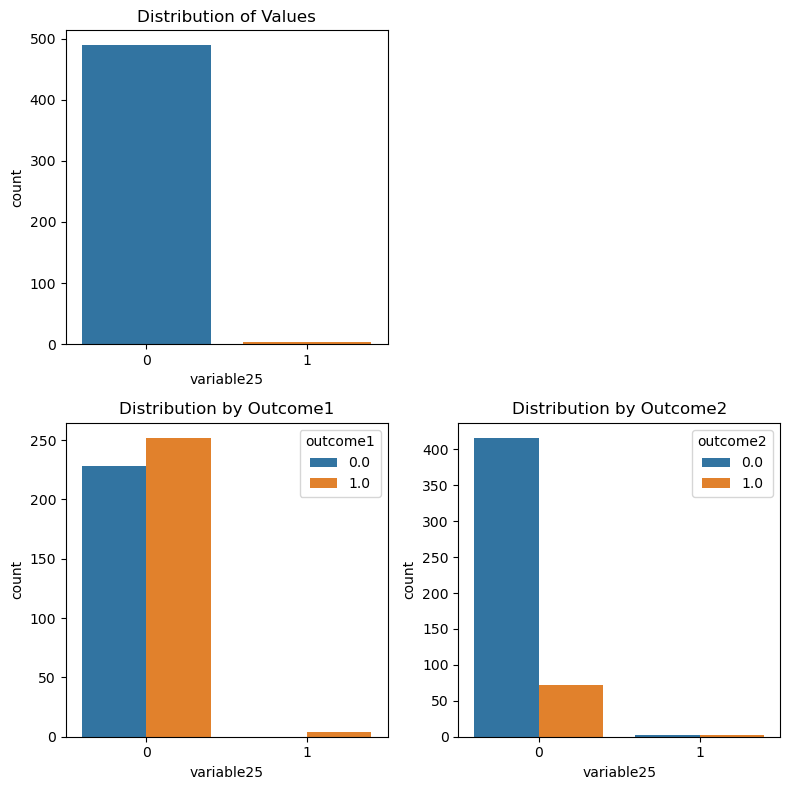

====================== Normality Test for variable26 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.6991
Chi-square Correlation Test p-value (outcome2 df=1):  0.0077


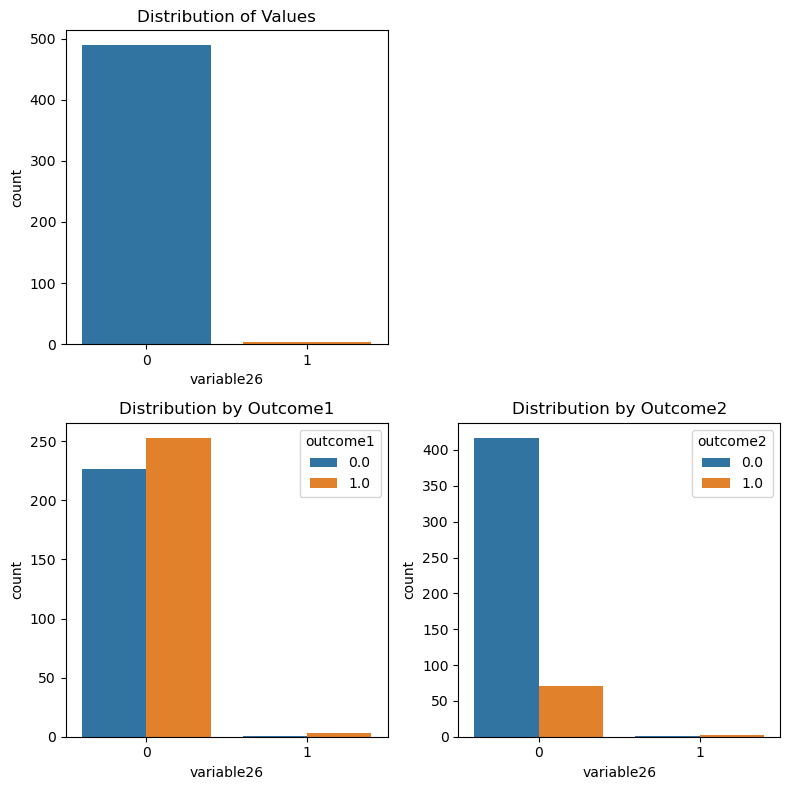

====================== Normality Test for variable27 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0043
Chi-square Correlation Test p-value (outcome2 df=1):  0.6812


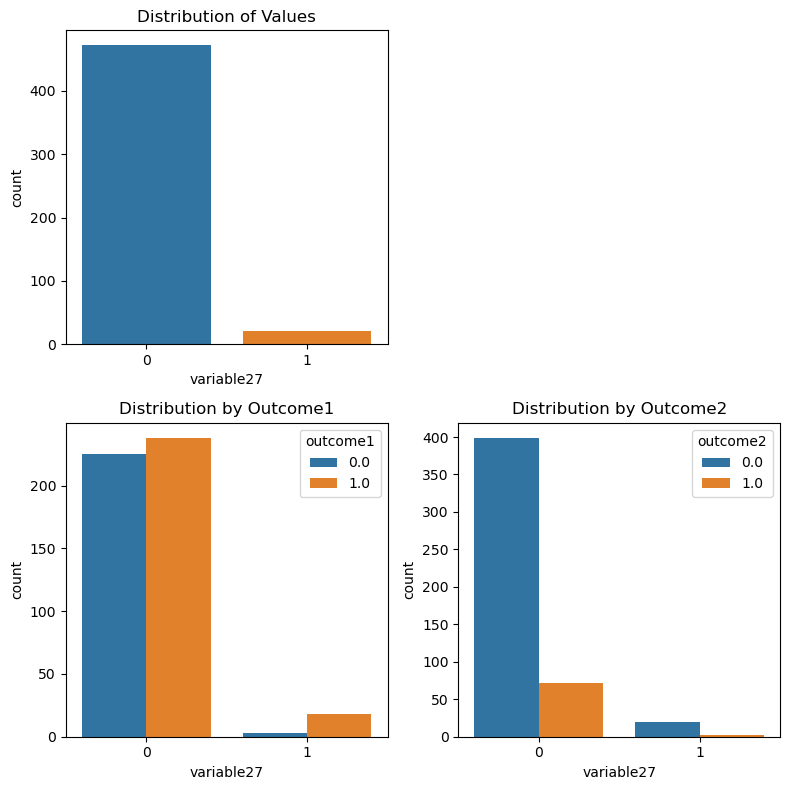

====================== Normality Test for variable28 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.7253


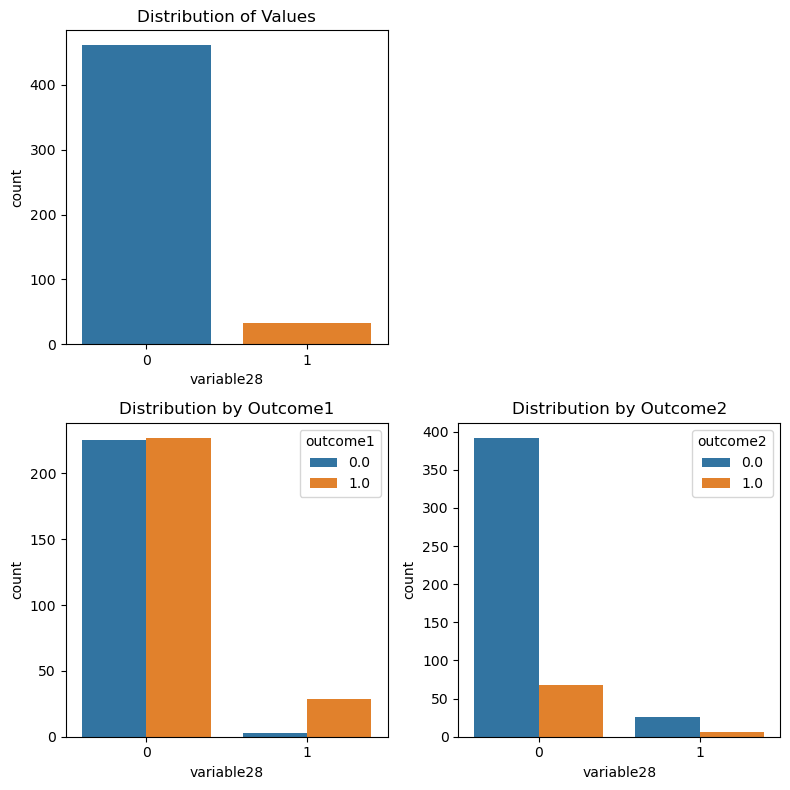

====================== Normality Test for variable29 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0113


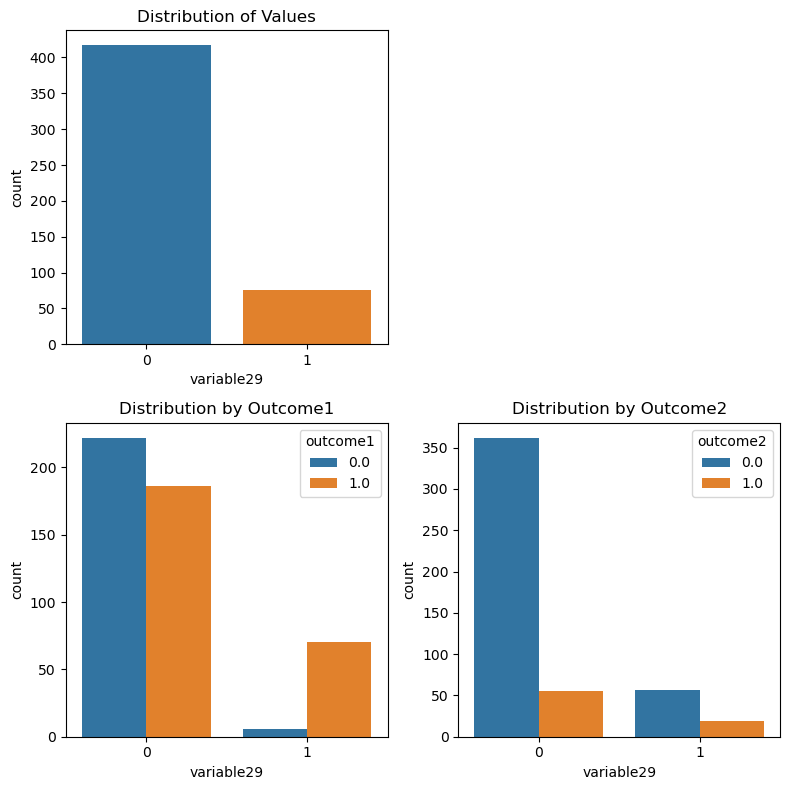

====================== Normality Test for variable30 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


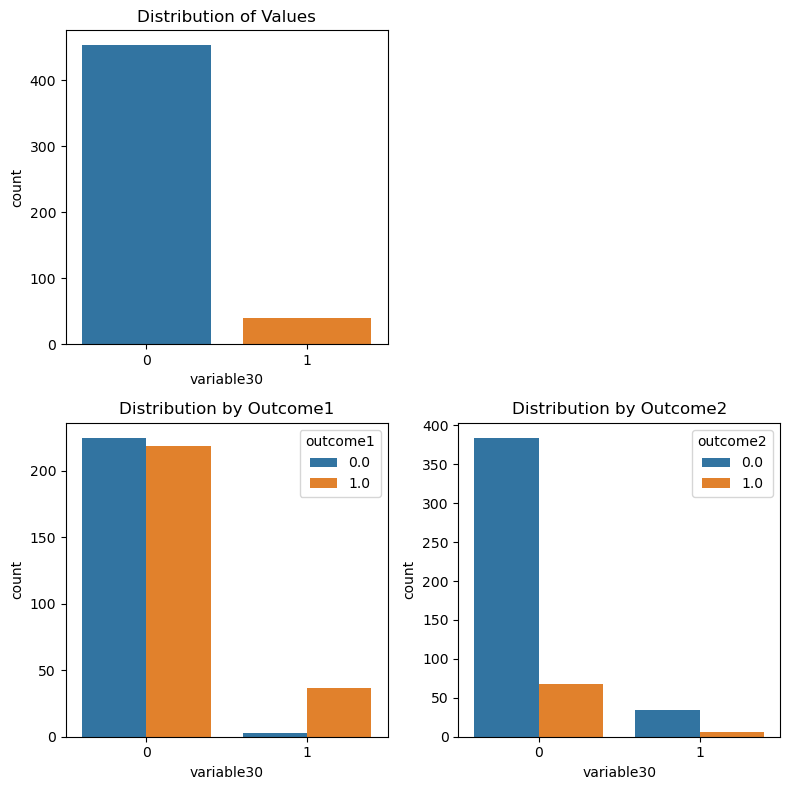

====================== Normality Test for variable31 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.6292


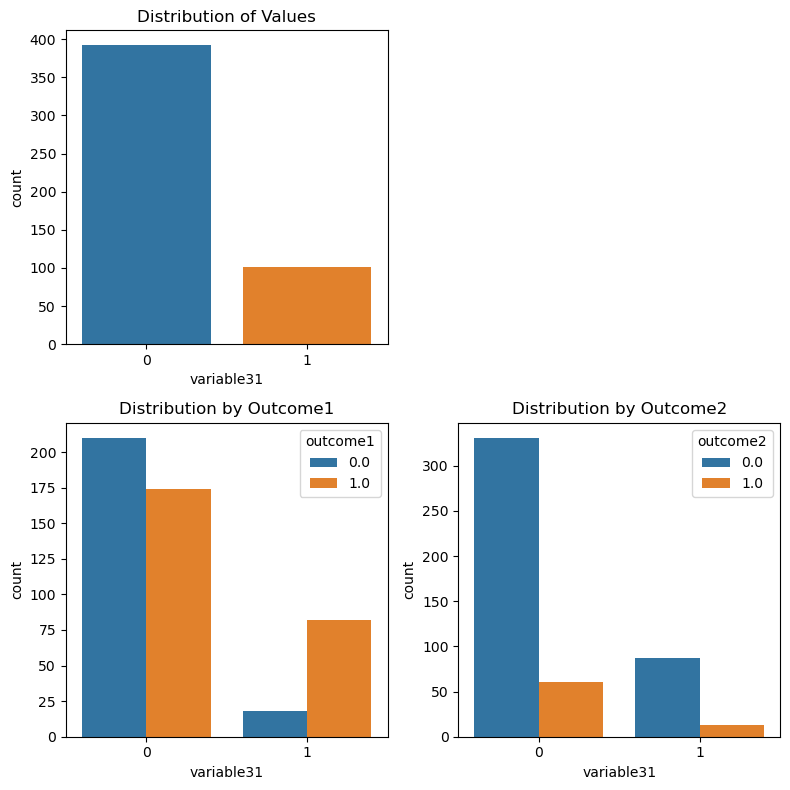

====================== Normality Test for variable32 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.5008


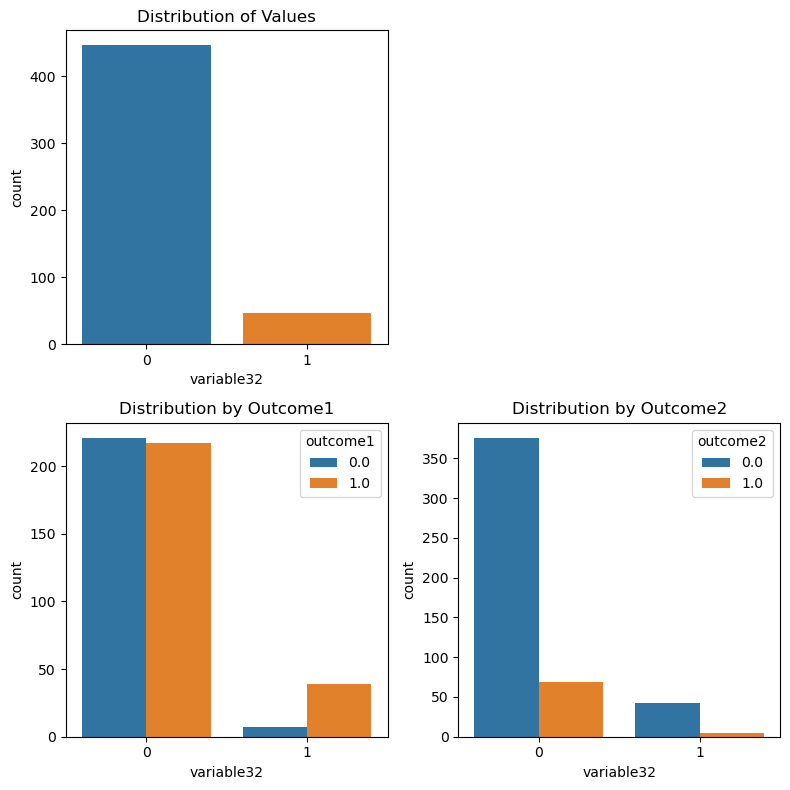

====================== Normality Test for variable33 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0013


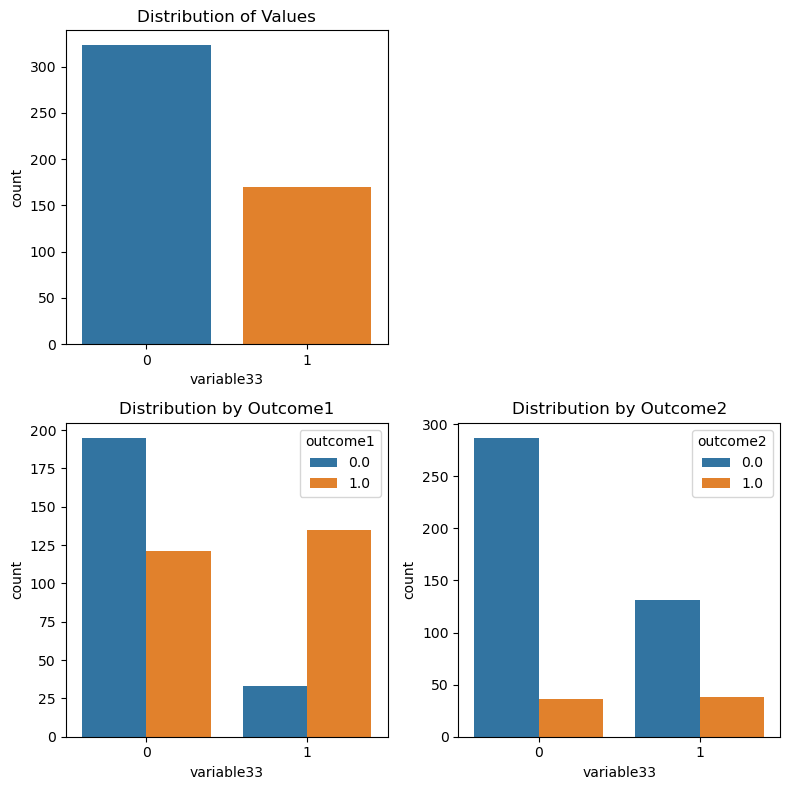

====================== Normality Test for variable34 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0034
Chi-square Correlation Test p-value (outcome2 df=1):  0.8580


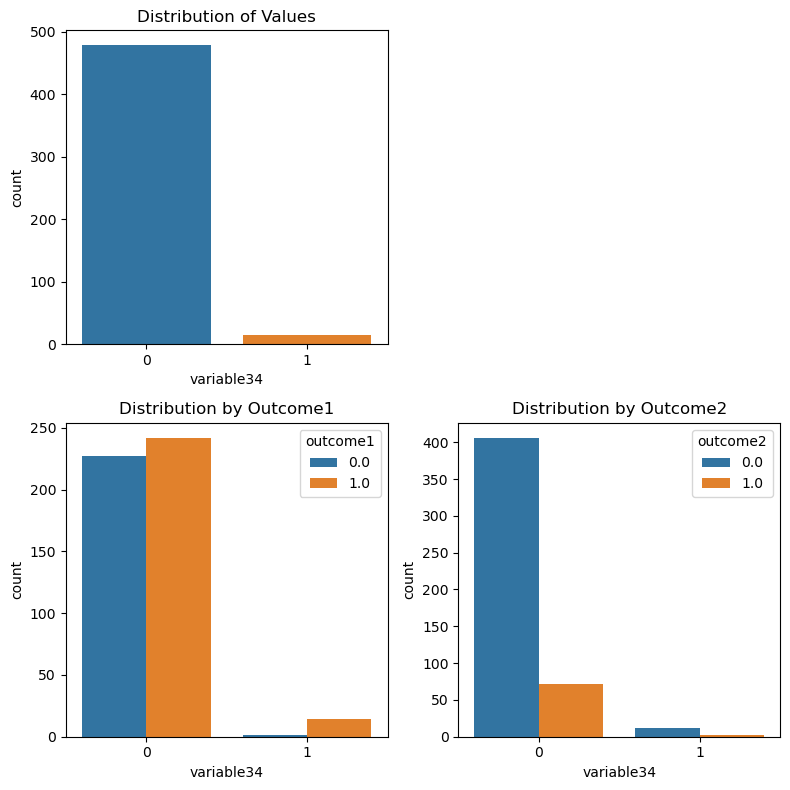

====================== Normality Test for variable35 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  1.0000
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


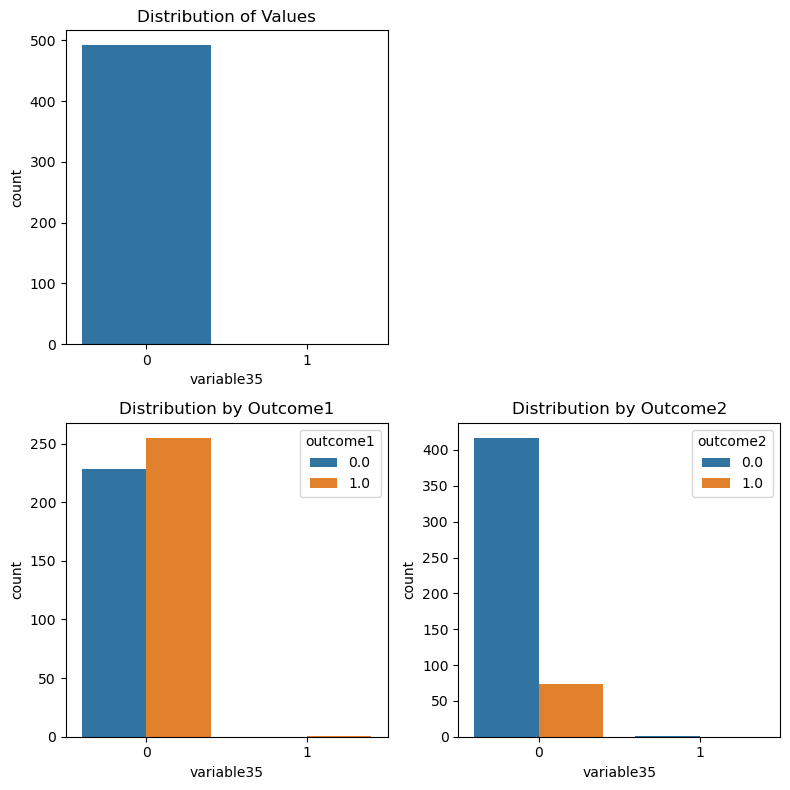

====================== Normality Test for variable36 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.4034


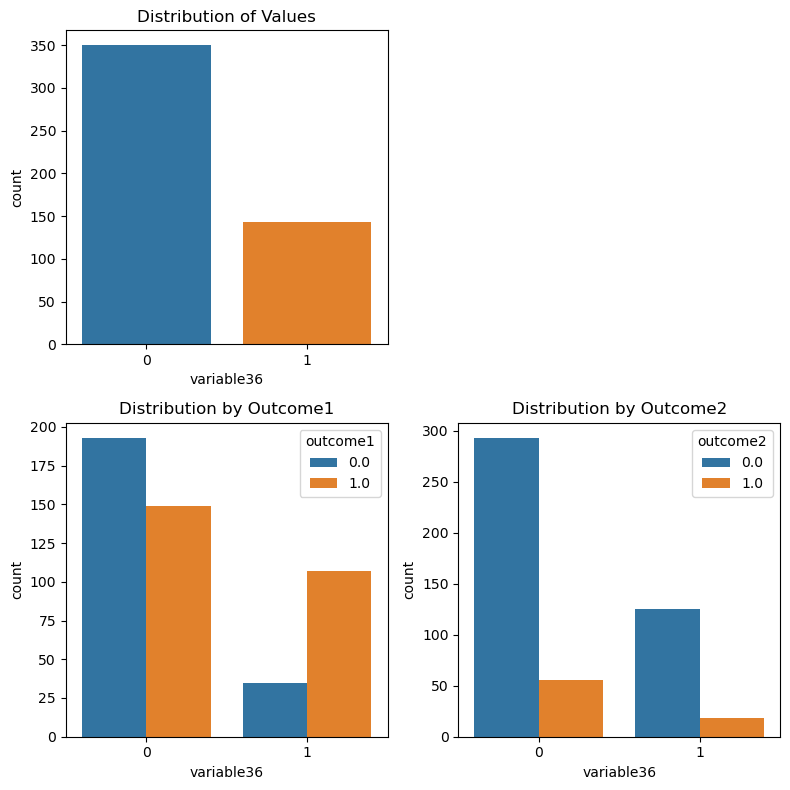

====================== Normality Test for variable37 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.2056


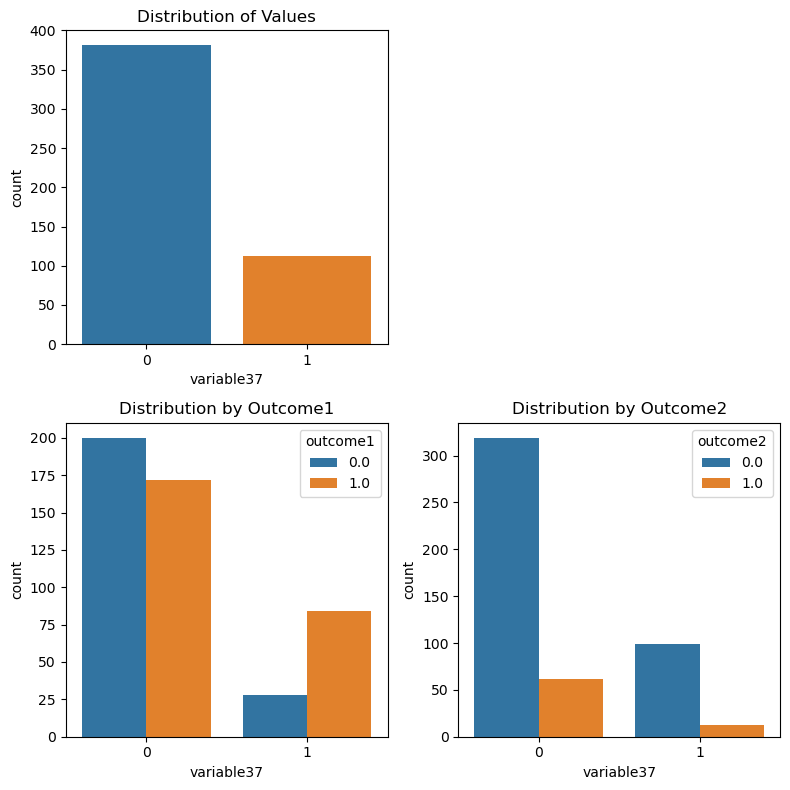

====================== Normality Test for variable38 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.1704
Chi-square Correlation Test p-value (outcome2 df=1):  0.5560


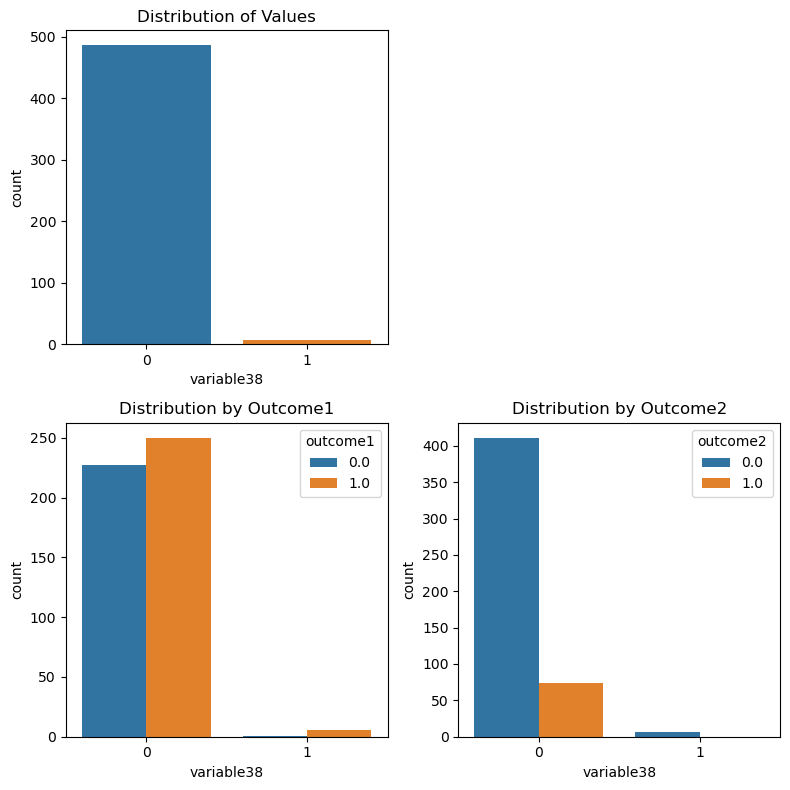

====================== Normality Test for variable39 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0080


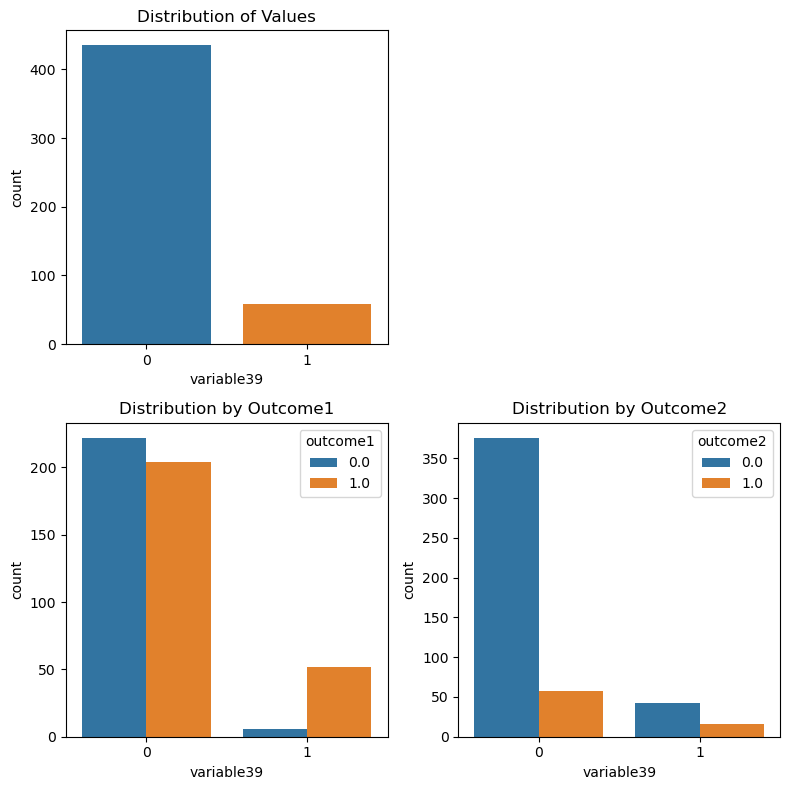

====================== Normality Test for variable40 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0005
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


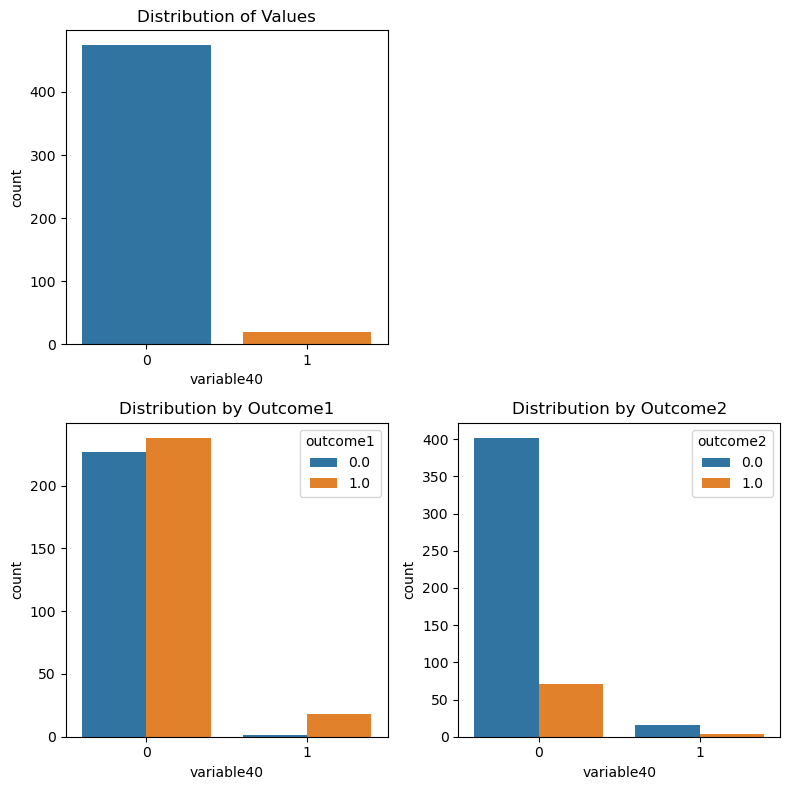

====================== Normality Test for variable41 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.9530


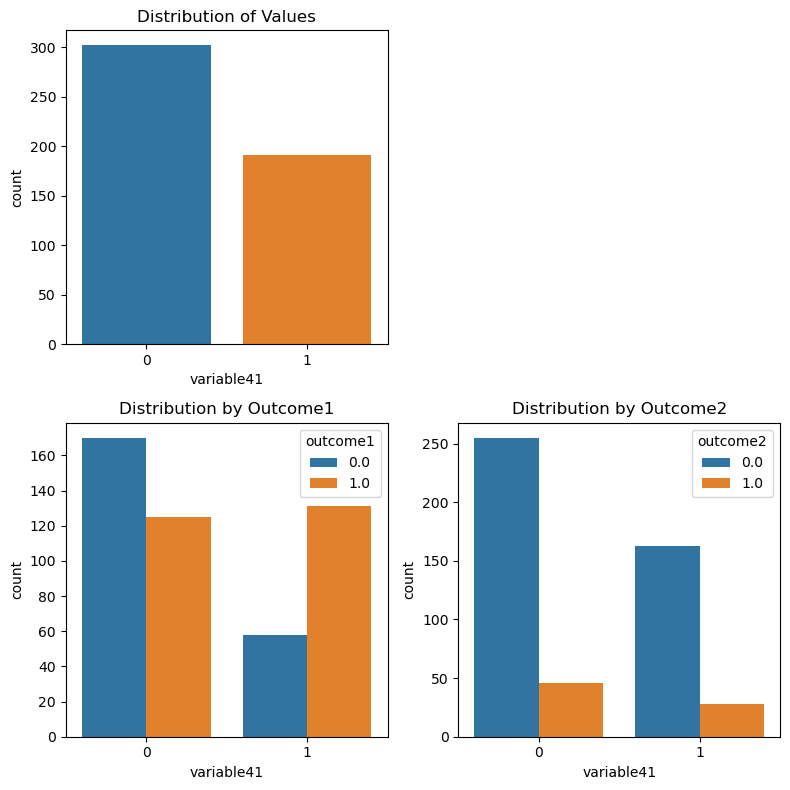

====================== Normality Test for variable43 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0000


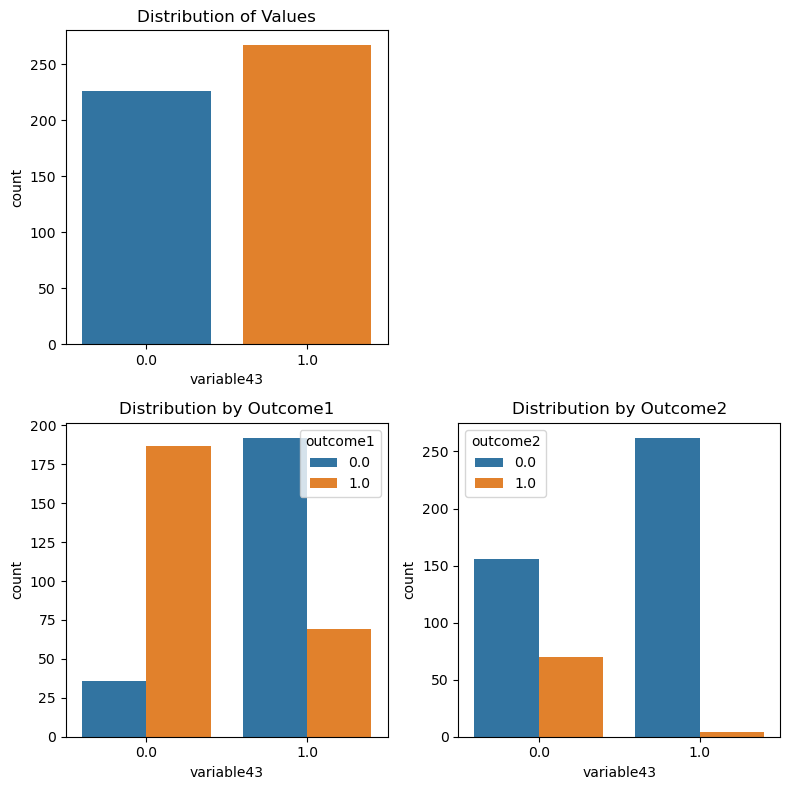

====================== Normality Test for variable44 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.5573
Chi-square Correlation Test p-value (outcome2 df=1):  1.0000


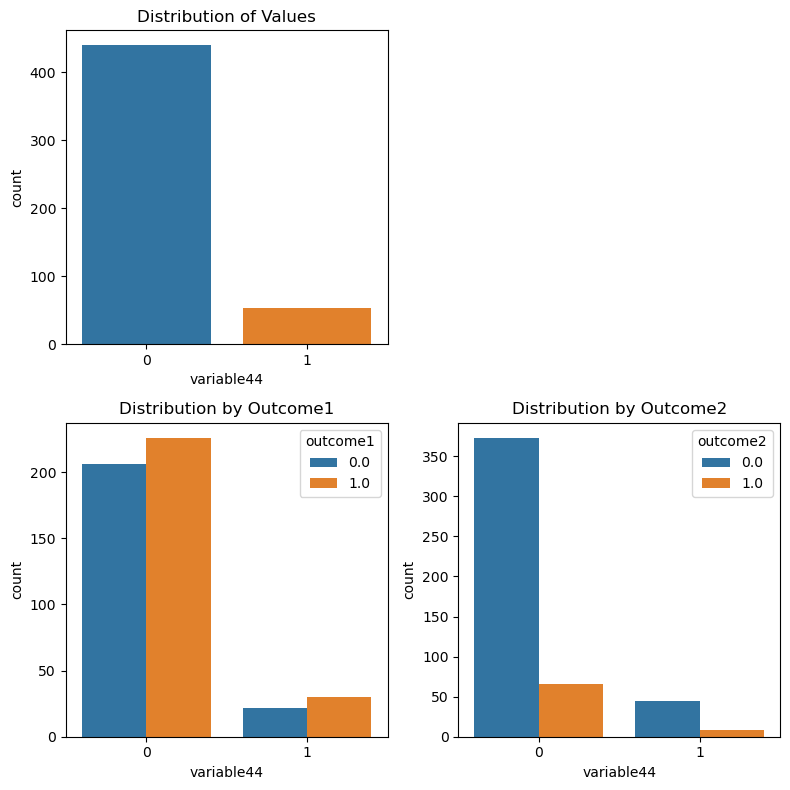

====================== Normality Test for variable45 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0021
Chi-square Correlation Test p-value (outcome2 df=1):  0.0015


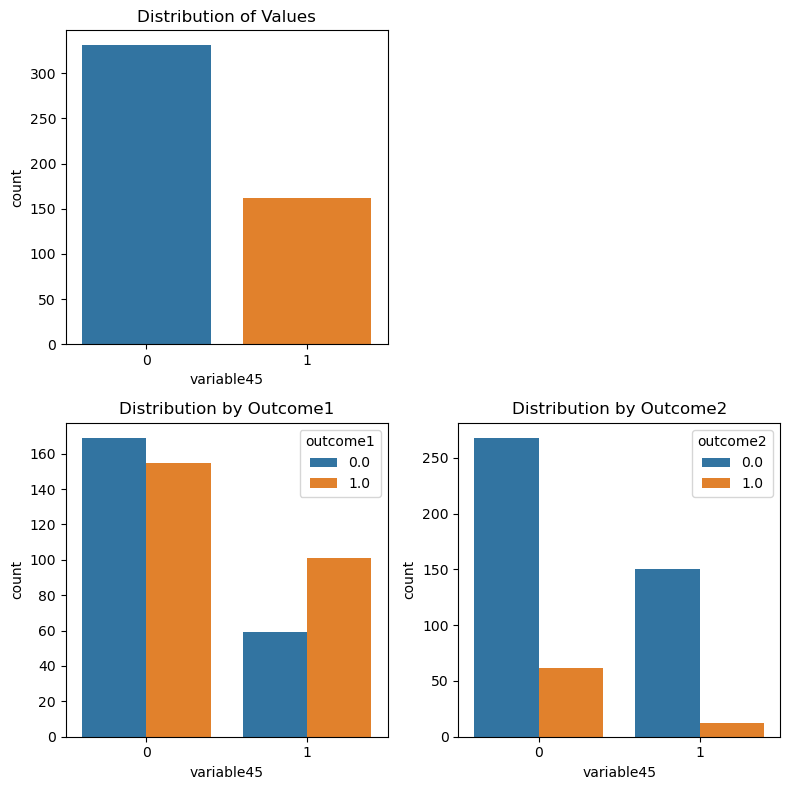

====================== Normality Test for variable46 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0001


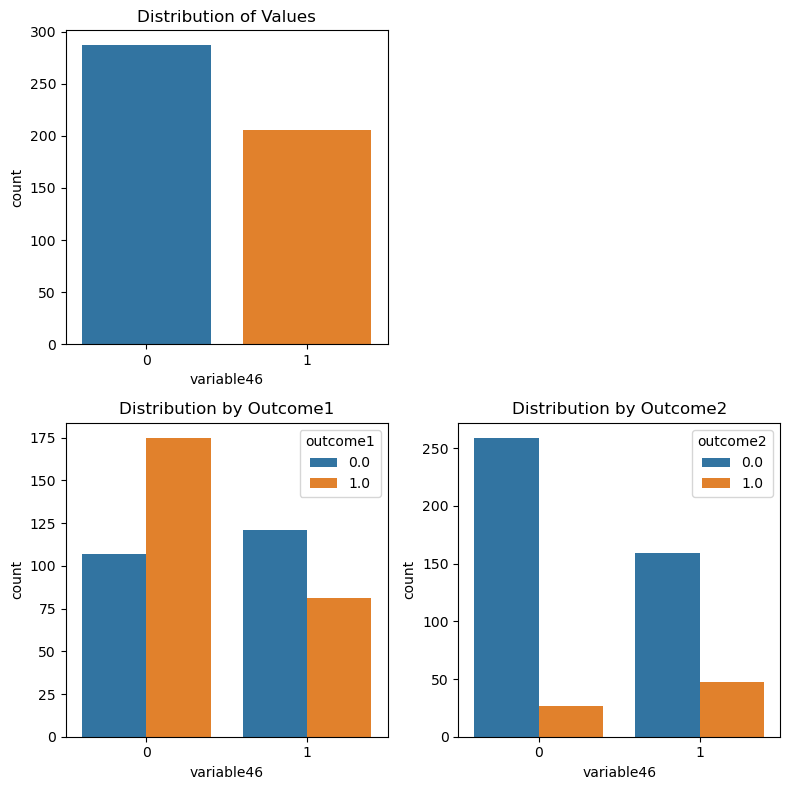

====================== Normality Test for variable6 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0170


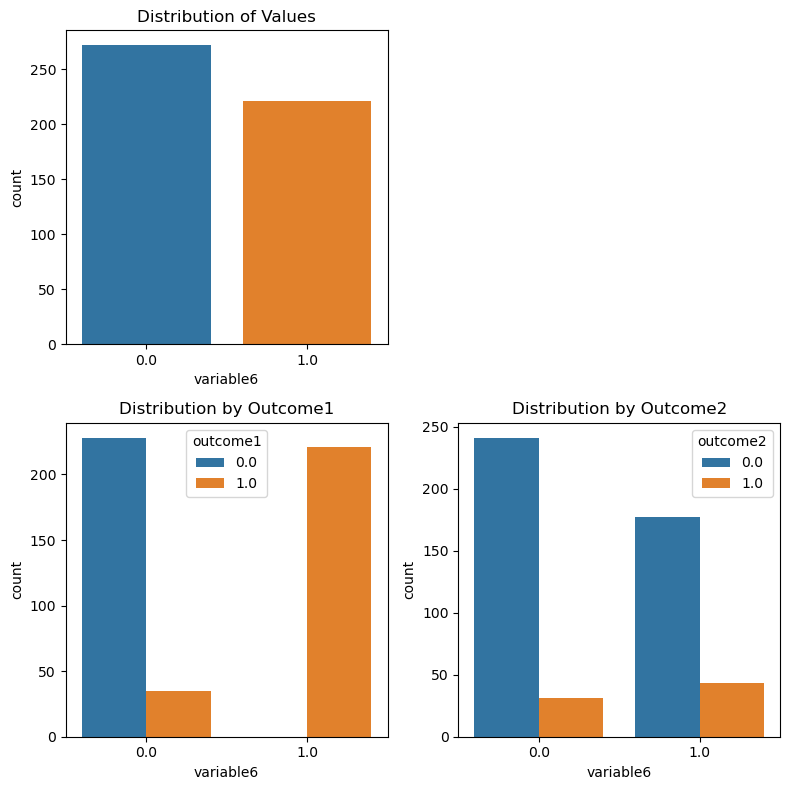

====================== Normality Test for variable7 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.4311
Chi-square Correlation Test p-value (outcome2 df=1):  0.8906


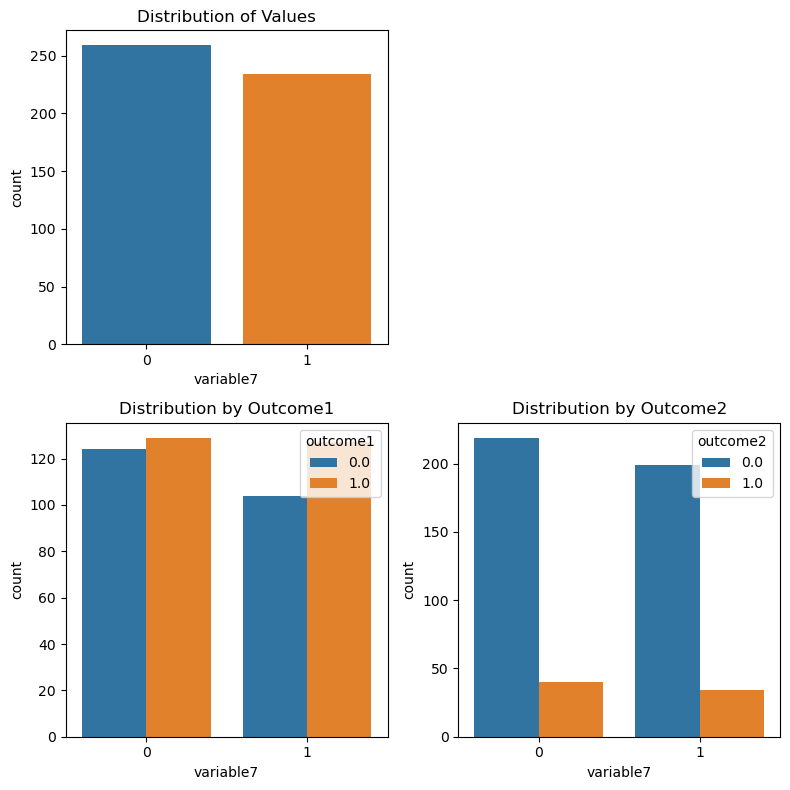

====================== Normality Test for variable8 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.7092


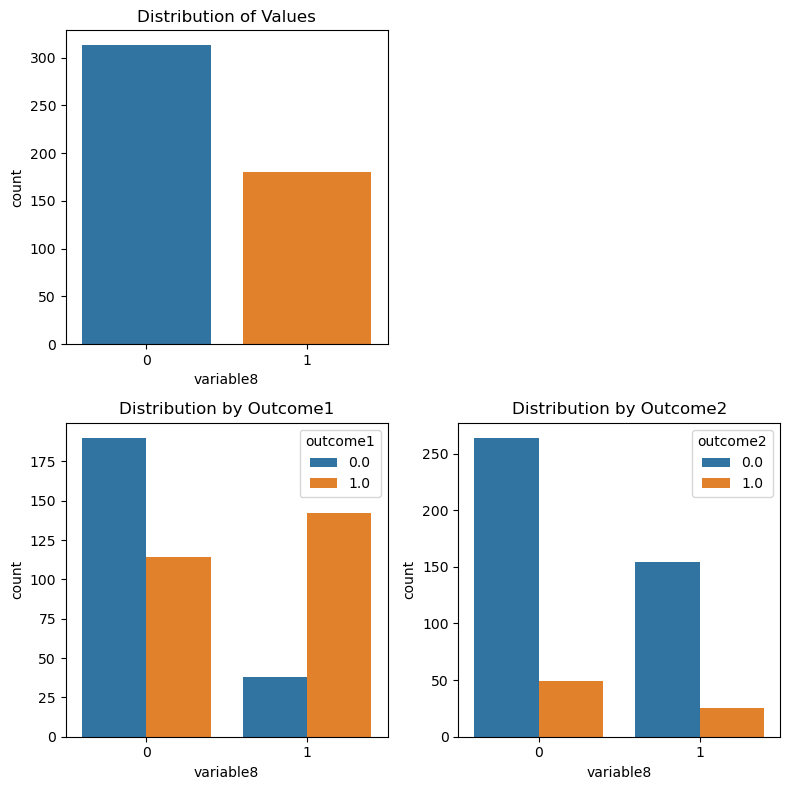

====================== Normality Test for variable9 ================================
Chi-square Correlation Test p-value (outcome1 df=1):  0.0000
Chi-square Correlation Test p-value (outcome2 df=1):  0.0009


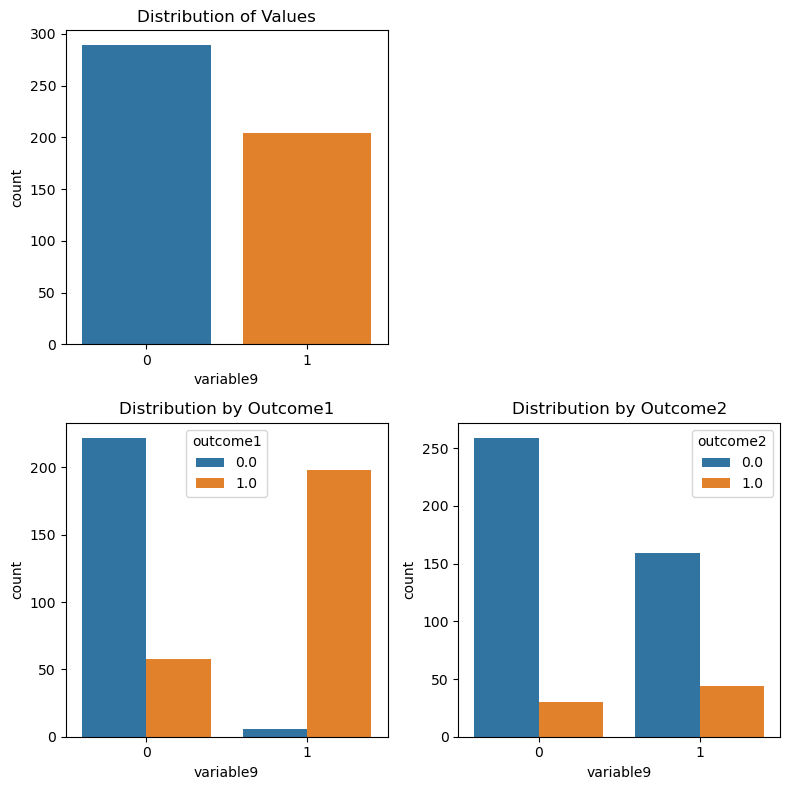

In [91]:
# Descriptive analytics for the predictors
d_numerical, d_categorical = main()

We employ four types of graphs for the numerical variables and three types of graphs for the cateogorical variables. For each numerical variable, we look at the distribution of values using a histogram and QQ plot to determine whether the distribution is approximately normal. We compare the different values of each variable with the classes of outcomes 1 and 2 using box plots. 

### 2.1 Variables Associated with Outcome1/Outcome2 <a name="2.1"></a>

In [92]:
df_numerical = pd.DataFrame.from_dict(d_numerical)
df_categorical = pd.DataFrame.from_dict(d_categorical)

In [93]:
combined_pvalues = pd.concat([df_numerical, df_categorical], axis=0).reset_index(drop=True).sort_values("Variable")

In [94]:
# Show p-values for all variables
print(combined_pvalues.to_markdown())

|     | Variable    |     Normality |   Association with Outcome1 |   Association with Outcome2 | Assumptions met   |
|----:|:------------|--------------:|----------------------------:|----------------------------:|:------------------|
|   0 | variable1   |   0.000291129 |                 0.000329062 |                 2.23211e-11 | False             |
|  94 | variable10  | nan           |                 0.0328624   |                 0.556032    | True              |
|  55 | variable100 |   0.989086    |                 2.33213e-05 |                 0.000342116 | True              |
|  56 | variable101 |   0.414143    |                 0.000826406 |                 0.0941296   | True              |
|  57 | variable102 |   0.750517    |                 0.700898    |                 0.0119266   | True              |
|  58 | variable103 |   0.860472    |                 1.75532e-09 |                 0.91185     | True              |
|  59 | variable104 |   0.153229    |                 2.

Here, the association columns are the p-values for the null hypothesis that there is no association with variable X and outcome1 and outcome2 after meeting assumptions for normality and equal variance. 

Now let's see which variables are associated with Outcome 1 and/or Outcome 2 assuming the assumptions are met.

In [95]:
# all variables that are associated with outcome1
combined_pvalues[combined_pvalues["Association with Outcome1"] < 0.05]

,Variable,Normality,Association with Outcome1,Association with Outcome2,Assumptions met
0,variable1,0.000291,3.290616e-04,2.232109e-11,False
94,variable10,NaN,3.286237e-02,5.560320e-01,True
55,variable100,0.989086,2.332129e-05,3.421158e-04,True
56,variable101,0.414143,8.264064e-04,9.412961e-02,True
58,variable103,0.860472,1.755318e-09,9.118499e-01,True
...,...,...,...,...,...
46,variable91,0.604018,3.415345e-05,3.087281e-04,True
47,variable92,0.364528,1.252754e-02,1.716435e-01,True
49,variable94,0.965775,7.813113e-15,3.300511e-03,True
51,variable96,0.548798,1.354241e-08,1.759394e-04,True


In [96]:
# list of the variables that are associated with outcome1 and all the assumptions for Point Bi-serial Correlation met
associated_outcome1 = combined_pvalues[(combined_pvalues["Association with Outcome1"] < 0.05) & (combined_pvalues["Assumptions met"])]
print(*associated_outcome1["Variable"])

variable10 variable100 variable101 variable103 variable104 variable105 variable108 variable109 variable111 variable112 variable113 variable116 variable117 variable119 variable121 variable122 variable125 variable129 variable130 variable132 variable136 variable138 variable16 variable22 variable23 variable27 variable28 variable29 variable30 variable31 variable32 variable33 variable34 variable36 variable37 variable39 variable40 variable41 variable43 variable45 variable46 variable47 variable49 variable51 variable52 variable53 variable54 variable57 variable58 variable59 variable6 variable60 variable61 variable62 variable63 variable64 variable65 variable67 variable68 variable71 variable73 variable74 variable76 variable77 variable8 variable81 variable82 variable83 variable84 variable86 variable89 variable9 variable91 variable92 variable94 variable96 variable98


We have a total of 82 variables that were found to have an association with outcome1. Out of these, 77 were found to have met the assumptions of the correlation test, meaning these variables are associated with outcome1. The other 5 can be associated, but we cannot make that conclusion since at least one of the assumptions was not met.

In [97]:
# list of the variables that are associated with outcome2 and assumptions met
associated_outcome2 = combined_pvalues[(combined_pvalues["Association with Outcome2"] < 0.05) & (combined_pvalues["Assumptions met"])]
print(*associated_outcome2["Variable"])

variable100 variable102 variable104 variable105 variable106 variable107 variable110 variable111 variable112 variable114 variable115 variable116 variable117 variable122 variable123 variable124 variable126 variable128 variable129 variable17 variable18 variable26 variable29 variable33 variable39 variable43 variable45 variable46 variable47 variable49 variable50 variable51 variable52 variable53 variable54 variable57 variable58 variable59 variable6 variable62 variable64 variable65 variable67 variable68 variable69 variable70 variable71 variable74 variable78 variable80 variable81 variable82 variable83 variable84 variable86 variable89 variable9 variable90 variable91 variable93 variable94 variable96 variable97 variable99


Similarly, we have a total of 64 variables that are associated with outcome2 and the assumptions for the test were met. 

Now we look at how many variables are associated with BOTH outcomes.

In [98]:
associated_outcome1_outcome2 = combined_pvalues[(combined_pvalues["Association with Outcome1"] < 0.05) & (combined_pvalues["Association with Outcome2"] < 0.05) & (combined_pvalues["Assumptions met"])]
print(f"Num of variables: {len(associated_outcome1_outcome2)}")
print(*associated_outcome1_outcome2["Variable"])

Num of variables: 42
variable100 variable104 variable105 variable111 variable112 variable116 variable117 variable122 variable129 variable29 variable33 variable39 variable43 variable45 variable46 variable47 variable49 variable51 variable52 variable53 variable54 variable57 variable58 variable59 variable6 variable62 variable64 variable65 variable67 variable68 variable71 variable74 variable81 variable82 variable83 variable84 variable86 variable89 variable9 variable91 variable94 variable96


There are a total of 42 variables that are associated with both outcomes. 

In [99]:
not_associated = combined_pvalues[((combined_pvalues["Association with Outcome1"] > 0.05) & (combined_pvalues["Association with Outcome2"] > 0.05)) | (combined_pvalues["Assumptions met"])]
print(f"Num of variables: {len(not_associated)}")
print(*not_associated["Variable"])

Num of variables: 128
variable10 variable100 variable101 variable102 variable103 variable104 variable105 variable106 variable107 variable108 variable109 variable11 variable110 variable111 variable112 variable113 variable114 variable115 variable116 variable117 variable118 variable119 variable120 variable121 variable122 variable123 variable124 variable125 variable126 variable128 variable129 variable130 variable131 variable132 variable133 variable134 variable135 variable136 variable137 variable138 variable14 variable15 variable16 variable17 variable18 variable19 variable2 variable20 variable21 variable22 variable23 variable24 variable25 variable26 variable27 variable28 variable29 variable30 variable31 variable32 variable33 variable34 variable35 variable36 variable37 variable38 variable39 variable4 variable40 variable41 variable43 variable44 variable45 variable46 variable47 variable48 variable49 variable50 variable51 variable52 variable53 variable54 variable57 variable58 variable59 variabl

There are 128 variables not associated with either outcome and/or does not meet the assumptions needed to test the hypothesis.

Now let's check which variables exhibit a normal distribution.

### 2.2 Not Normally Distributed Variables <a name="2.2"></a>

In [100]:
# list of the variables that are not normally distributed without the transformation.
print("Variables Not Normally Distributed")
combined_pvalues[combined_pvalues["Normality"] < 0.05].reset_index(drop=True)

Variables Not Normally Distributed


,Variable,Normality,Association with Outcome1,Association with Outcome2,Assumptions met
0,variable1,2.911293e-04,3.290616e-04,2.232109e-11,False
1,variable127,3.734346e-03,1.706317e-23,1.743465e-06,False
2,variable135,3.665758e-02,7.834083e-02,5.776127e-01,True
3,variable4,3.941296e-14,3.206025e-01,1.614405e-01,False
4,variable53,1.415412e-02,2.910946e-11,1.663202e-03,True
5,variable55,4.969889e-03,3.047287e-17,3.144916e-06,False
6,variable56,4.813520e-02,2.210982e-02,1.258591e-01,False
7,variable58,1.828136e-02,1.105069e-18,1.617208e-07,True
8,variable59,1.017854e-02,9.490919e-14,1.334899e-05,True
9,variable64,4.116879e-03,1.742002e-18,1.758424e-10,True


The variables 1, 4, 53, 55, 56, 58, 59, 64, 72, 79, 127, and 135 are not normally distributed among the continuous variables in the dataset. 

====================== Normality Test for variable1 ================================
Shapiro-Wilks Normality Test p-value:  0.0003
boxcox transform p-value:  0.0001
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9631
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0003
Point-biserial correlation p-value (outcome2):  0.0000


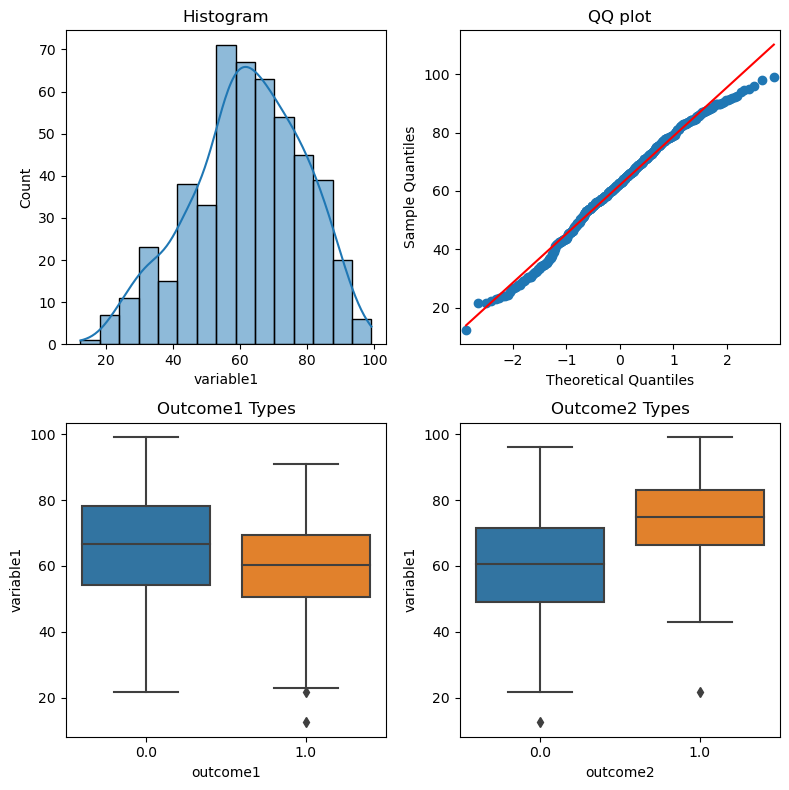

====================== Normality Test for variable4 ================================
Shapiro-Wilks Normality Test p-value:  0.0000
boxcox transform p-value:  0.0000
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9654
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3206
Point-biserial correlation p-value (outcome2):  0.1614


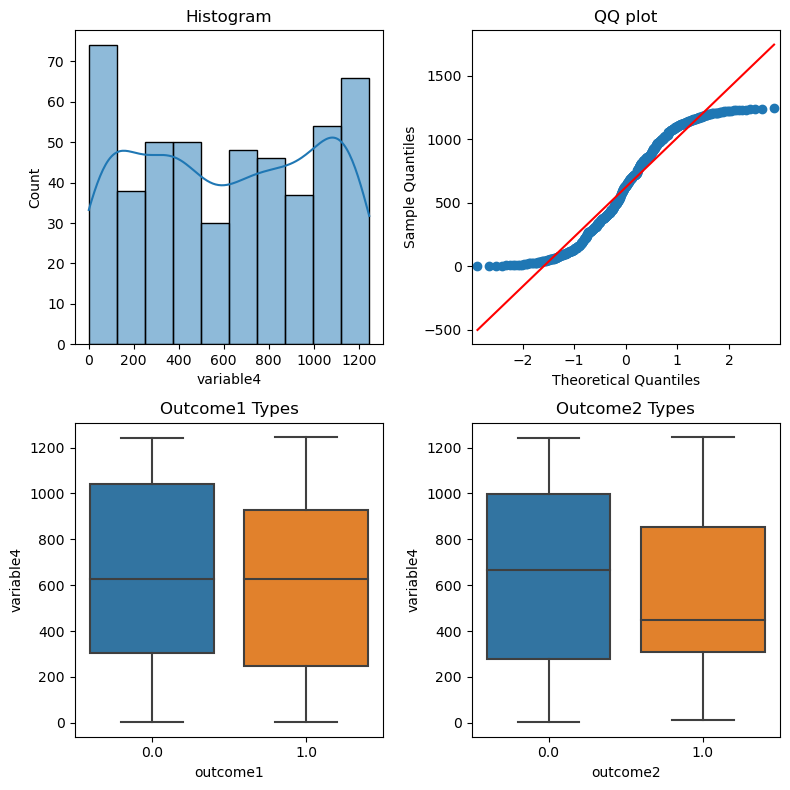

====================== Normality Test for variable53 ================================
Shapiro-Wilks Normality Test p-value:  0.0142
boxcox transform p-value:  0.3241
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9263
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0017


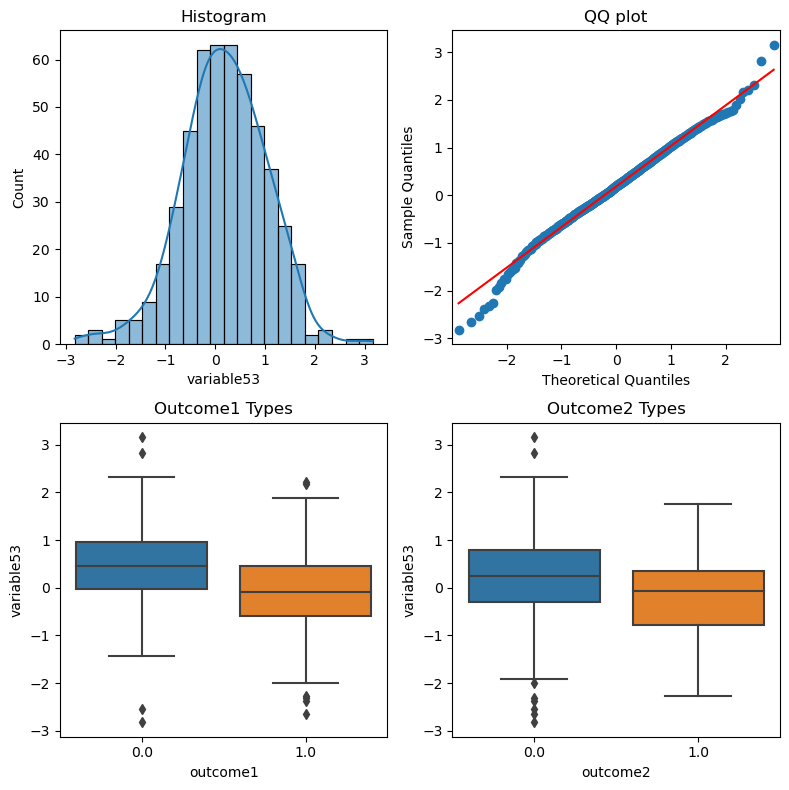

====================== Normality Test for variable55 ================================
Shapiro-Wilks Normality Test p-value:  0.0050
boxcox transform p-value:  0.0405
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9132
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


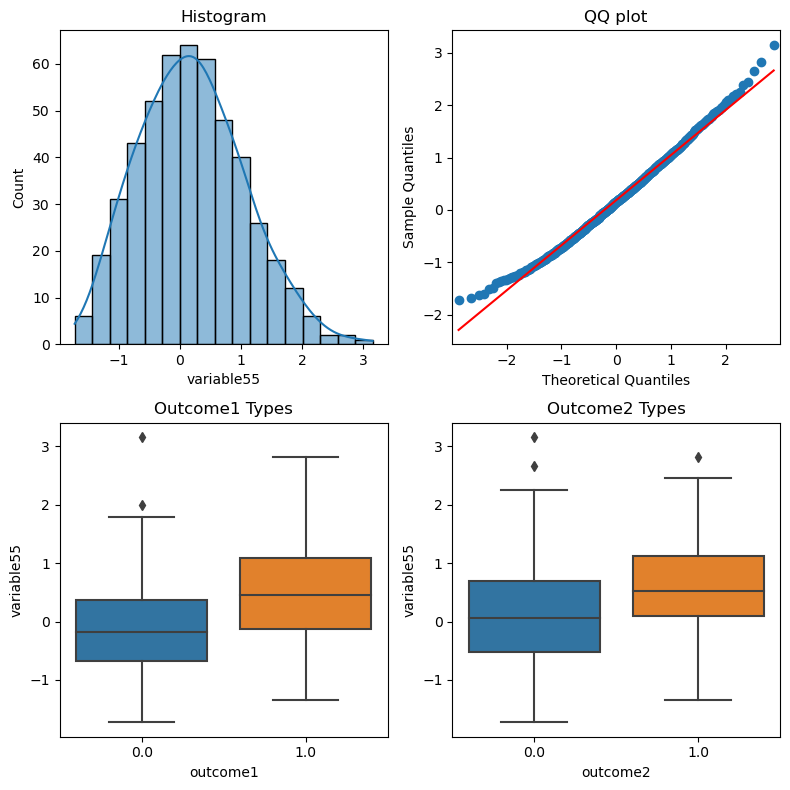

====================== Normality Test for variable56 ================================
Shapiro-Wilks Normality Test p-value:  0.0481
boxcox transform p-value:  0.0221
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9222
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0221
Point-biserial correlation p-value (outcome2):  0.1259


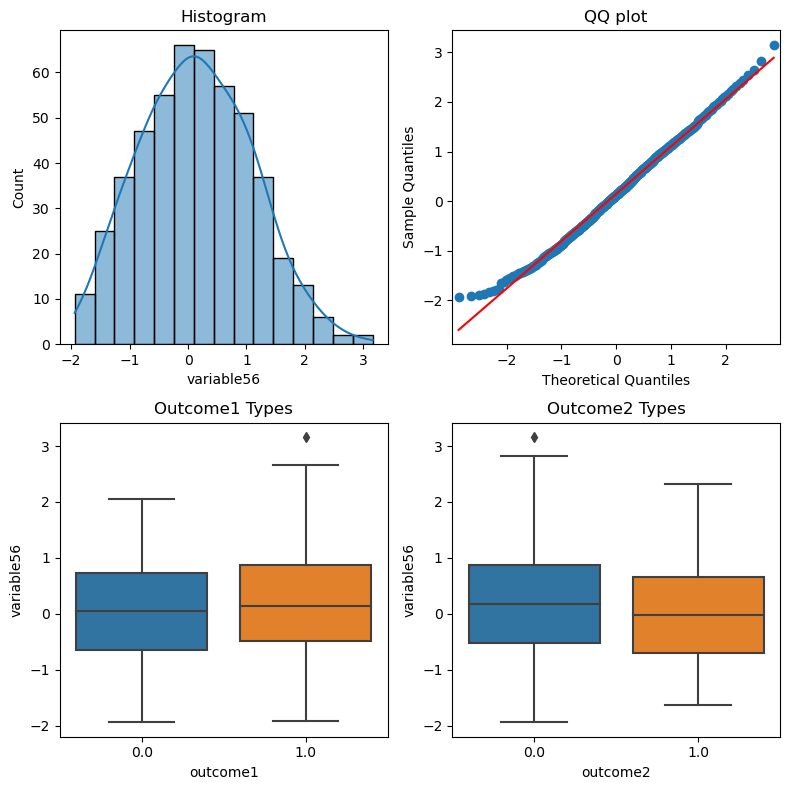

====================== Normality Test for variable58 ================================
Shapiro-Wilks Normality Test p-value:  0.0183
boxcox transform p-value:  0.2402
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.6764
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


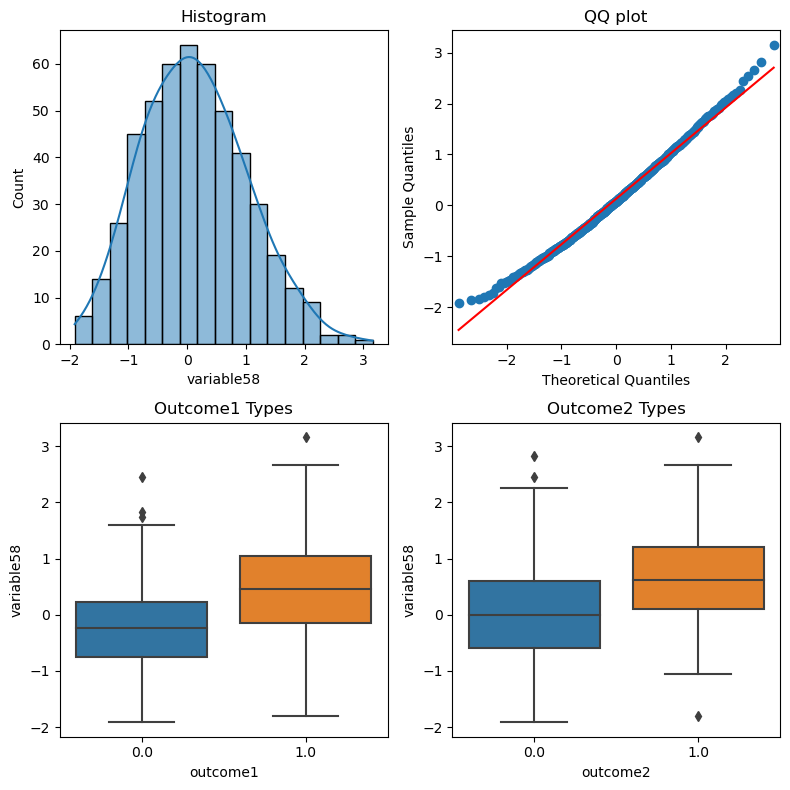

====================== Normality Test for variable59 ================================
Shapiro-Wilks Normality Test p-value:  0.0102
boxcox transform p-value:  0.0627
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8937
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


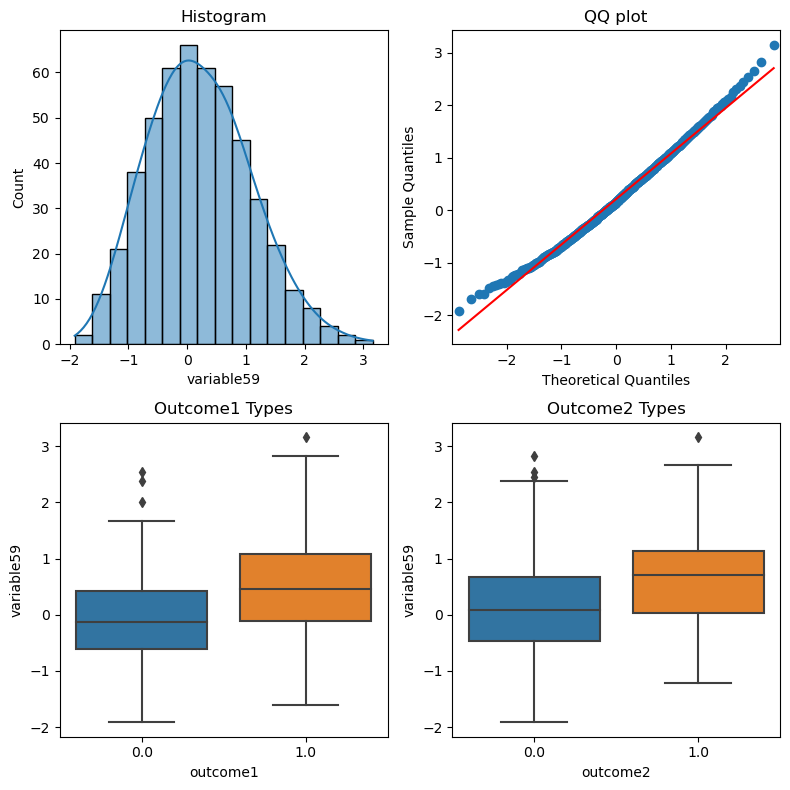

====================== Normality Test for variable64 ================================
Shapiro-Wilks Normality Test p-value:  0.0041
boxcox transform p-value:  0.1515
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.9175
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


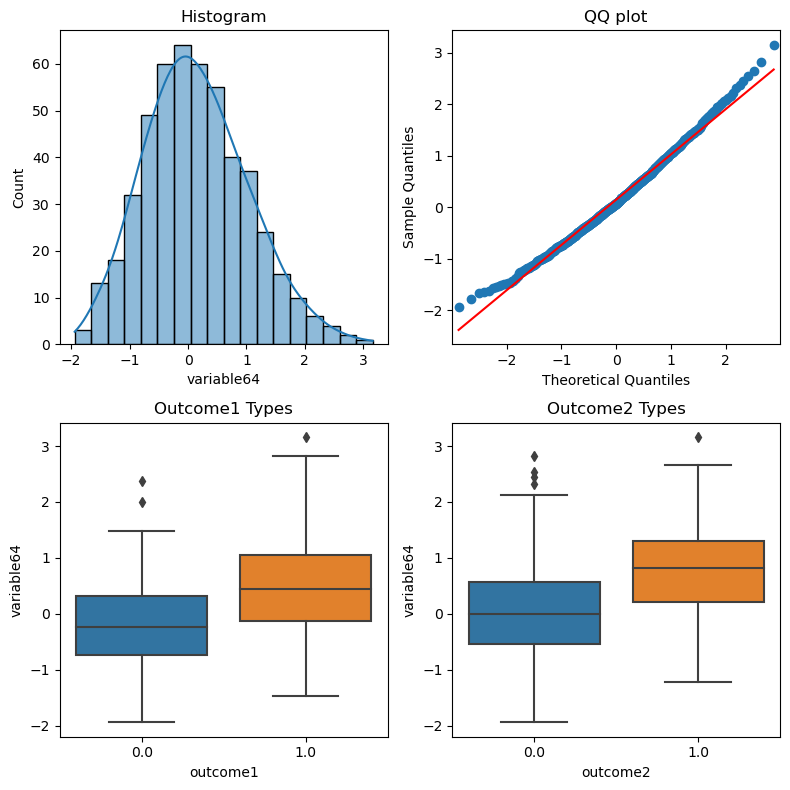

====================== Normality Test for variable72 ================================
Shapiro-Wilks Normality Test p-value:  0.0143
boxcox transform p-value:  0.0242
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8820
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.3286


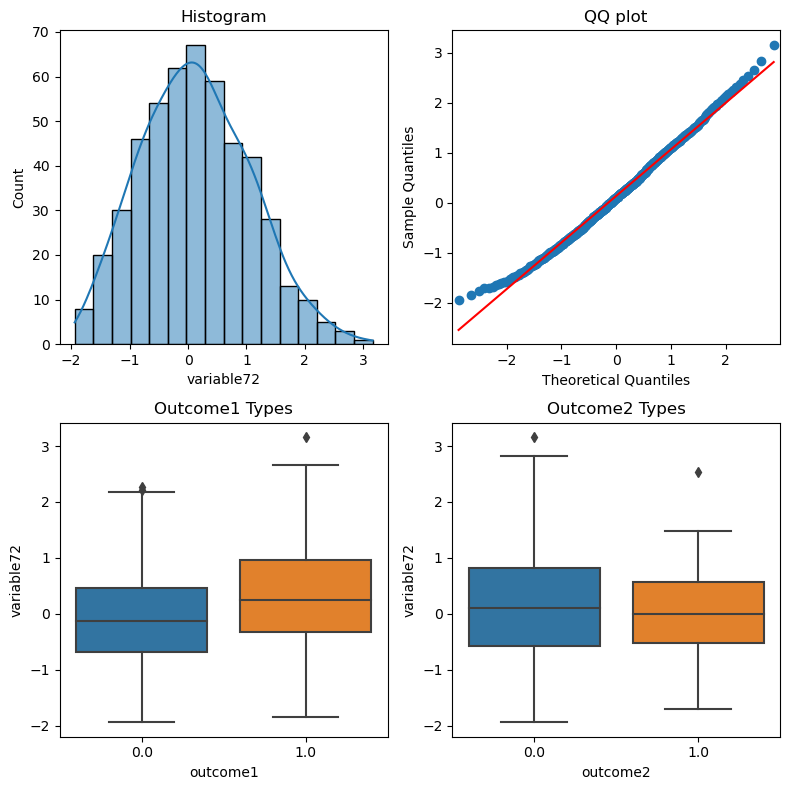

====================== Normality Test for variable79 ================================
Shapiro-Wilks Normality Test p-value:  0.0000
boxcox transform p-value:  0.0475
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8978
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.6466
Point-biserial correlation p-value (outcome2):  0.1013


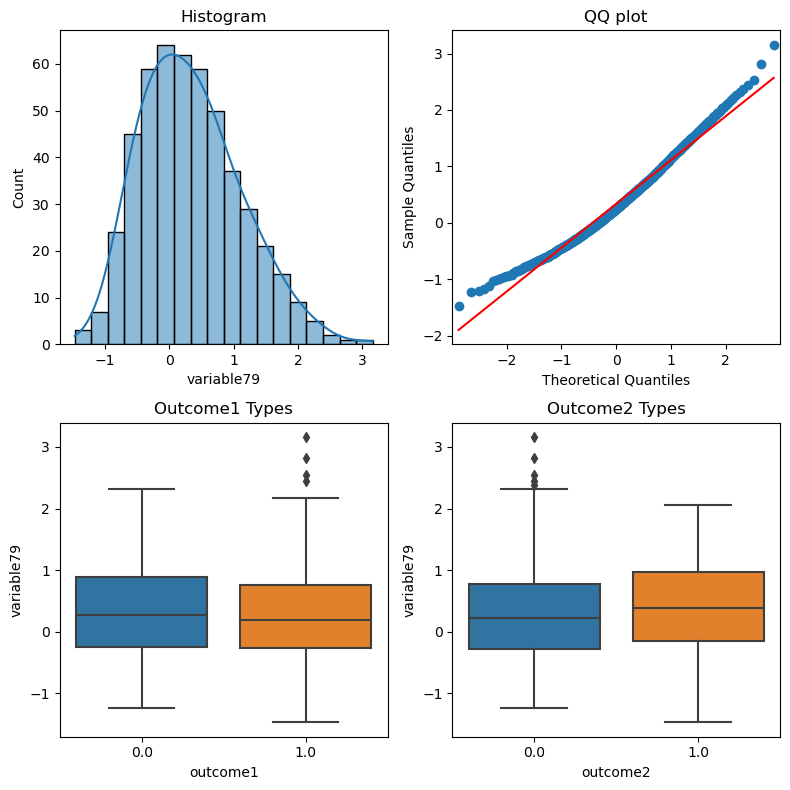

====================== Normality Test for variable127 ================================
Shapiro-Wilks Normality Test p-value:  0.0037
boxcox transform p-value:  0.0366
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.8877
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0000
Point-biserial correlation p-value (outcome2):  0.0000


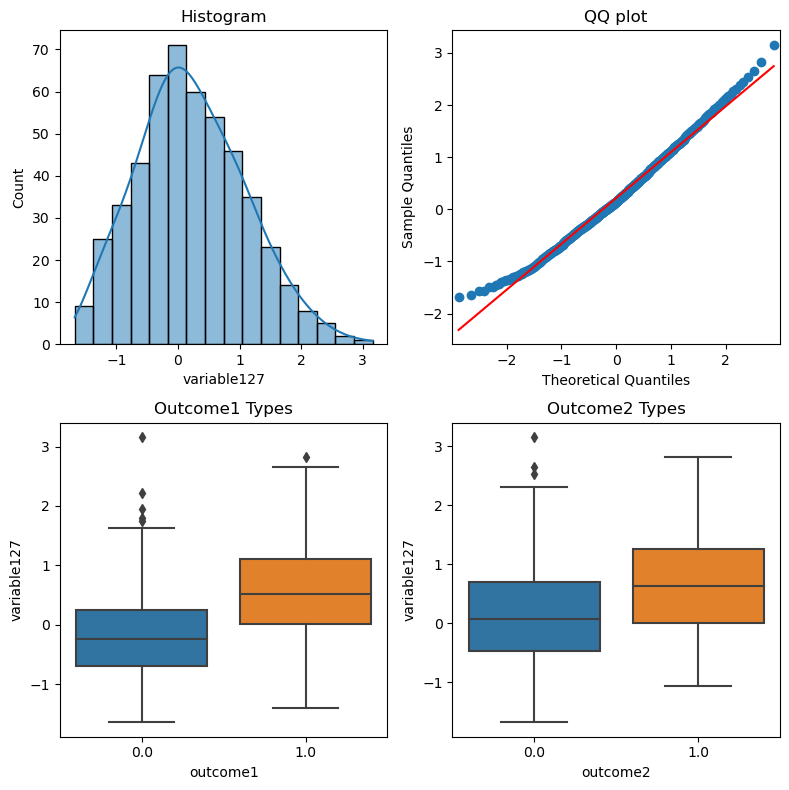

====================== Normality Test for variable135 ================================
Shapiro-Wilks Normality Test p-value:  0.0367
boxcox transform p-value:  0.0525
-- Normal distribution asssumption met
Levene Equal Variance p-value:  0.8128
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0783
Point-biserial correlation p-value (outcome2):  0.5776


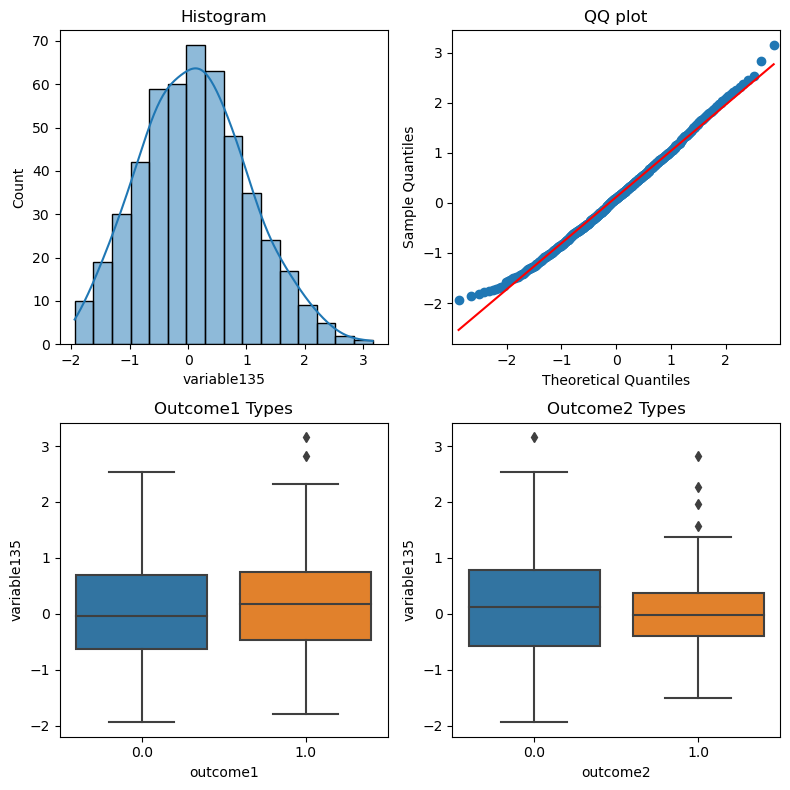

In [101]:
# Analyzing which variables became normal after transformation
l = [1, 4, 53, 55, 56, 58, 59, 64, 72, 79, 127, 135]
variables = ["variable" + str(i) for i in l]

for v in variables:
    normality_test_continuous(v)

It appears that winsorization and Box-Cox transform was enough to transform variables 53, 58, 59, 64, and 135 into normal distributions. Besides variable1 and variable4, the rest of the non-normally distributed variables appear to be right skewed, which the winsorization and Box-Cox transformations were able to fix some of them.

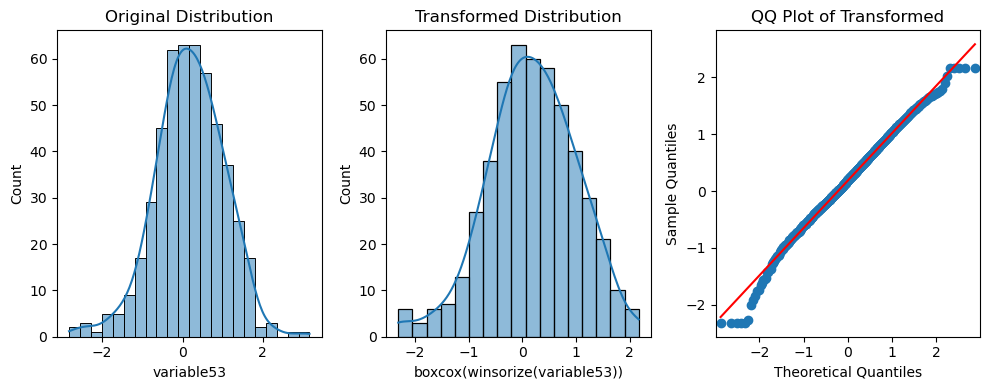

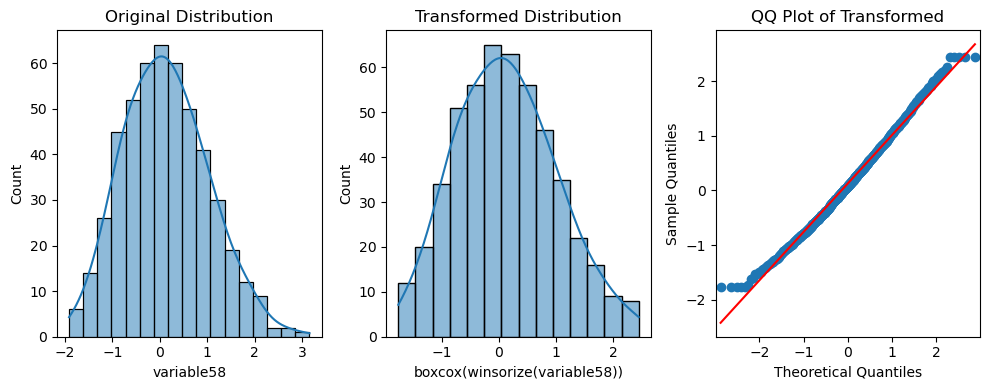

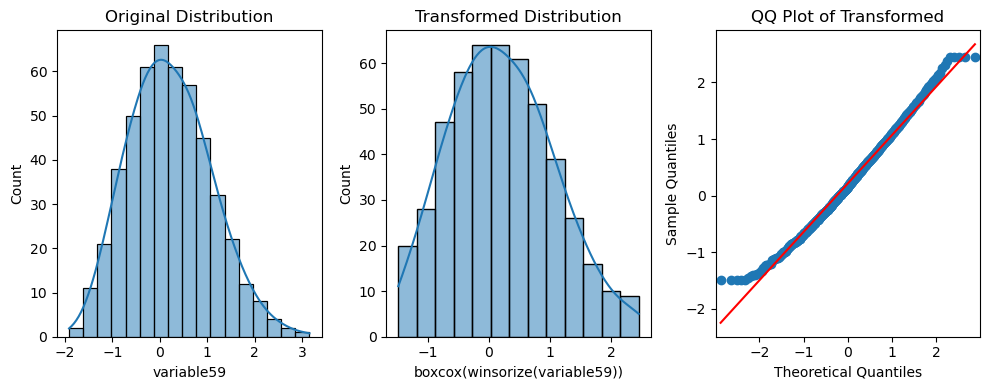

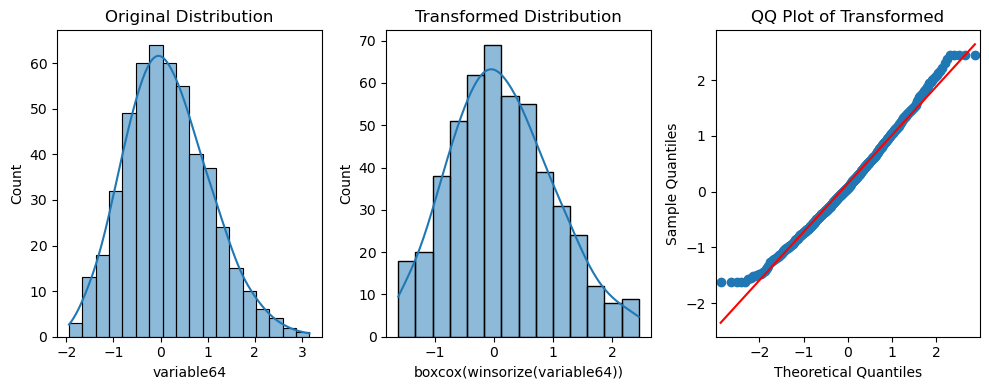

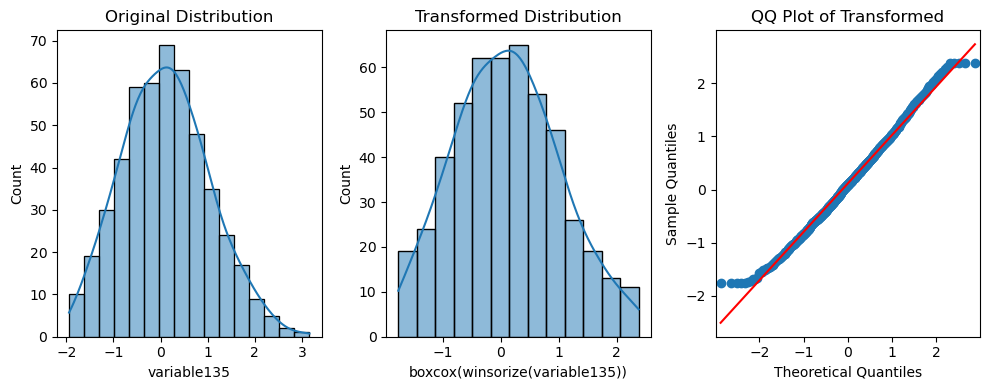

In [102]:
def normalize(data):
    d = winsorize(data, limits=[0.01, 0.01])
    minimum = min(d)
    arr = np.array(d) - minimum + 1
    return d


for i in [53, 58, 59, 64, 135]:
    col = f"variable{i}"
    fig, ax = plt.subplots(1, 3, figsize=(10, 4))
    data = df[col]
    normalized_data = normalize(data)
    sns.histplot(x=data, kde=True, ax=ax[0]);
    sns.histplot(x=normalized_data, kde=True, ax=ax[1]);
    qqplot(normalized_data, line='s', ax=ax[2]);
    
    ax[0].set_title("Original Distribution")
    ax[1].set_title("Transformed Distribution")
    ax[1].set_xlabel(f"boxcox(winsorize({col}))")
    ax[2].set_title("QQ Plot of Transformed")
    
    plt.tight_layout()
    plt.show()
    
    
    

The graphs indicate that the variables appear more normally distributed with the transformation. These varables appear more symmetric with reasonable tails.

#### Variable1 and Variable4

Because of the large number of columns in this dataset, it is difficult to analyze them all individually. However, the columns that deviated from the rest in terms of distribution were variables 1 and 4. 

Unlike the other variables that are not normally distributed without a transformation, variables 1 and 4 do not suffer from skewness and instead have distributions that vary greatly from a bell curve. 

====================== Normality Test for variable1 ================================
Shapiro-Wilks Normality Test p-value:  0.0003
boxcox transform p-value:  0.0001
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9631
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.0003
Point-biserial correlation p-value (outcome2):  0.0000


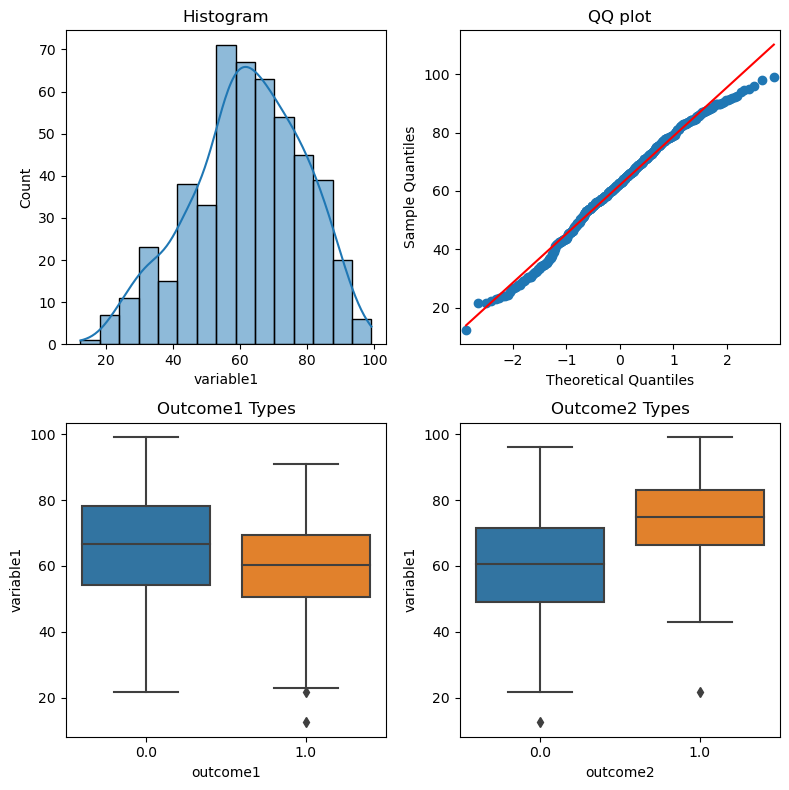

(0.00029112925403751433, 0.00032906160048600116, 2.2321094586418336e-11, False)

In [103]:
normality_test_continuous("variable1")

Variable1 has a distribution that skews left while most of the other non-normally distributed variables skew right. In addition, unlike the other variables that have means of around 0, variable1 has values much greater than that of the other continuous variables. There also appears to be a correlation between variable1 and the classes of the two outcomes (p < 0.05). 

====================== Normality Test for variable4 ================================
Shapiro-Wilks Normality Test p-value:  0.0000
boxcox transform p-value:  0.0000
-- Normal distribution assumption NOT met
Levene Equal Variance p-value:  0.9654
-- Equal variance asssumption met
Point-biserial correlation p-value (outcome1):  0.3206
Point-biserial correlation p-value (outcome2):  0.1614


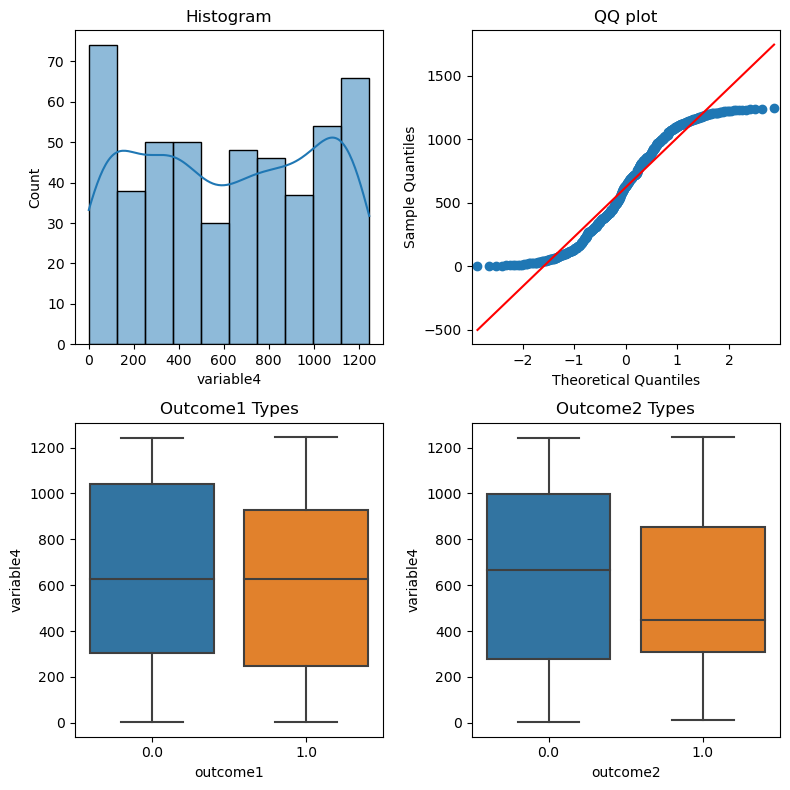

(3.9412958031774525e-14, 0.3206025122127541, 0.16144054710772343, False)

In [104]:
normality_test_continuous("variable4")

Variable4 has a distribution that almost looks uniform. Like the values of variable1, variable4 has values much greater than that of the other continuous variables. However, there also appears to be no correlation between variable1 and the classes of the two outcomes (p > 0.05). 

###  2.3 EDA and Correlations Between Variables and Outcomes <a name="2.3"></a>

We already calculated the Point Bi-serial correlation between the outcomes and the continous variables and the Chi-square Correlation between the outcomes and categorical variables. We now do some EDA to further analyze the association between the variables and outcomes.

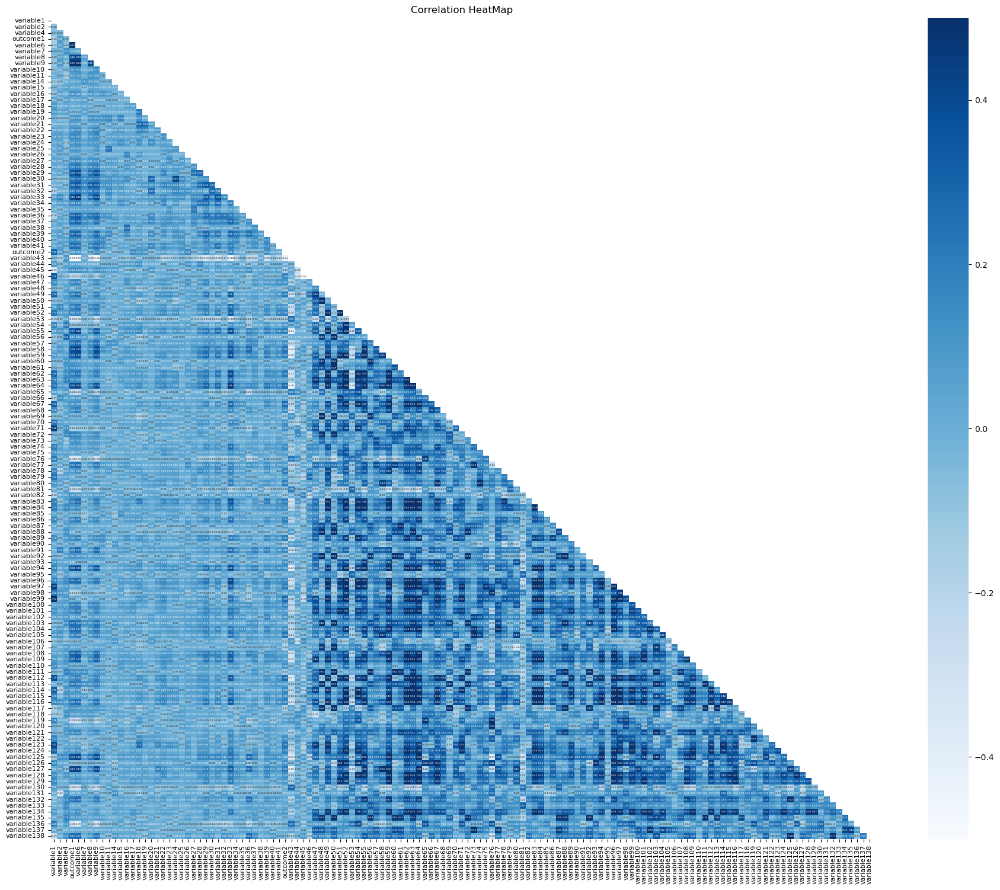

In [105]:
corr = df.corr()
arr_corr = corr.to_numpy()
arr_corr[np.triu_indices_from(arr_corr)] = np.nan

fig, ax = plt.subplots(figsize=(24, 18))

hm = sns.heatmap(arr_corr, cbar=True, vmin=-0.5, vmax=0.5,
                 fmt='.2f', annot_kws={'size': 3}, annot=True, 
                 square=True, cmap=plt.cm.Blues);

ticks = np.arange(corr.shape[0]) + 0.5
ax.set_xticks(ticks)
ax.set_xticklabels(corr.columns, rotation=90, fontsize=8);
ax.set_yticks(ticks)
ax.set_yticklabels(corr.index, rotation=360, fontsize=8);
ax.set_title("Correlation HeatMap");

As seen by the scale of the legend for the correlation coefficients, there is no strong association between the variables and/or the outcomes, where a strong association is defined by a coefficient less than -0.7 or greater than 0.7. This means no dimension reductionality is needed before running our machine learning model on the data.

# 3 - Training a Machine Learning Model <a name="3"></a>

Using this data, we will train several machine learning models to predict outcome1 and outcome2. The models we will use are:

- Random Forest
- Logistic Regression
- XGBoost
- Naive Bayes

Before we train our machine learning models, we must standardize the predictor variables. Examining the distribution of values for the numerical columns, we must apply standardization to variables 1 and 4. In addition, due to class imbalance of outcome2, we apply the Synthetic Minority Oversampling Technique (SMOTE), which oversamples the minority class (in this case is class 1). With consideration to the distribution of the variables, we may need to transform the non-normal columns into a more normal distribution using the Box-Cox transform, which we evaluated earlier. Most of the non-normal columns, with the exception of variable1 and variable4, appear mostly normal.

We perform a 80-20 train-test split for a total of 5 folds, meaning we test and train the model on 5 different subsets of the data and aggregate the results. With the training data, we further split this 80-20 into training and validation datasets. The validation dataset is used to check that the model is not overfitting on the training dataset. When running the models, we train the model on non-transformed data and transformed data and compare the results between the two approaches. 

### 3.1 Data Preparation <a name="3.1"></a>

In [106]:
# Standarization of variable1 and variable4
df_processed = df.copy()

data1 = df_processed["variable1"]
df_processed["variable1"] = (data1 - data1.mean()) / data1.std()

data4 = df_processed["variable4"]
df_processed["variable4"] = (data4 - data4.mean()) / data4.std()

df_processed.describe()[["variable1", "variable4"]]

,variable1,variable4
count,4.930000e+02,4.930000e+02
mean,-4.467916e-16,-9.548368e-17
std,1.000000e+00,1.000000e+00
min,-2.965732e+00,-1.584681e+00
25%,-6.288044e-01,-8.725765e-01
50%,3.830462e-02,2.840198e-02
75%,7.492873e-01,9.370375e-01
max,2.215617e+00,1.592991e+00


As we can see, we have transformed the means of the columns to be approximately 0 and the standard deviation to be 1. 

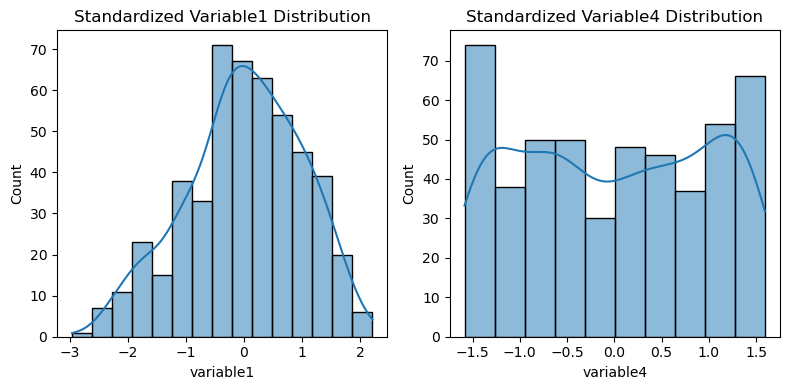

In [107]:
# Visualizing the effect of standardization
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
sns.histplot(x=df_processed["variable1"], kde=True, ax=ax[0]);
sns.histplot(x=df_processed["variable4"], kde=True, ax=ax[1]);

ax[0].set_title("Standardized Variable1 Distribution")
ax[1].set_title("Standardized Variable4 Distribution")

plt.tight_layout()
plt.show()

Standardization has no effect on the distribution of values.

In [108]:
# Splitting dataset into X and Y across each outcome for training
outcome1_processed = df_processed[~df_processed['outcome1'].isna()]
outcome2_processed = df_processed[~df_processed['outcome2'].isna()]

X_1 = outcome1_processed.drop(columns=["outcome1", "outcome2"], axis=1).to_numpy()
y_1 = np.array(outcome1_processed["outcome1"])

X_2 = outcome2_processed.drop(columns=["outcome1", "outcome2"], axis=1).to_numpy()
y_2 = np.array(outcome2_processed["outcome2"])

In [109]:
# Defining models
models = {
        "Random Forest Classifier": RandomForestClassifier(),
        "Logistic Regression": LogisticRegression(solver='lbfgs', max_iter=2000),
        "XGBoost": xgb.XGBClassifier(objective="binary:logistic", random_state=42),
        "Naive Bayes": GaussianNB()
    }

In [110]:
def run_models(X, y, models_dict, smote=True):

    # Saving scores for evaluation later
    train_acc_scores = {}
    val_acc_scores = {}

    test_acc_scores = {}
    test_roc_scores = {}
    test_precision_scores = {}
    test_recall_scores = {}

    sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    
    # SMOTE oversampling
    if smote:
        sm = SMOTE(random_state=42)
        X, y = sm.fit_resample(X, y)

    # Testing each model on each k fold (total of 5)
    for i, (train_index, test_index) in enumerate(sss.split(X, y)):

        X_train_full = X[train_index]
        y_train_full = y[train_index]

        X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=42)

        X_test = X[test_index]
        y_test = y[test_index]

        for key, model in models_dict.items():
            model.fit(X_train, y_train)
            y_score_train = model.predict(X_train)
            y_score_val = model.predict(X_val)
            y_score_test = model.predict(X_test)
            print("=" * 50)
            print(key, f" Fold {i} \n")
            print("Confusion Matrix (test): \n")
            cm = confusion_matrix(y_test, y_score_test, labels=model.classes_)

            disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                         display_labels=model.classes_)
            disp.plot();
            plt.show();
            
            train_accuracy = round(accuracy_score(y_train, y_score_train), 4)
            print("Train Accuracy score: ", train_accuracy)
            val_accuracy = round(accuracy_score(y_val, y_score_val), 4)
            print("Validation Accuracy score: ", val_accuracy)
            
            test_accuracy = round(accuracy_score(y_test, y_score_test), 4)
            roc_auc = round(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]), 4)
            precision = round(precision_score(y_test, y_score_test), 4)
            recall = round(recall_score(y_test, y_score_test), 4)
            print("Test Accuracy score: ", test_accuracy)
            print("Test ROC_AUC score: ", roc_auc)
            print("Test Recall: ", recall)
            print("Test Precision: ", precision)
            print("\n")

            a = test_acc_scores.get(key)
            if a is None:
                train_acc_scores[key] = [train_accuracy]
                val_acc_scores[key] = [val_accuracy]
                test_acc_scores[key] = [test_accuracy]
                test_roc_scores[key] = [roc_auc]
                test_precision_scores[key] = [precision]
                test_recall_scores[key] = [recall]
            else:
                train_acc_scores.get(key).append(train_accuracy)
                val_acc_scores.get(key).append(val_accuracy)
                test_acc_scores.get(key).append(test_accuracy)
                test_roc_scores.get(key).append(roc_auc)
                test_precision_scores.get(key).append(precision)
                test_recall_scores.get(key).append(recall)
             
    # Save results for displaying into table
    d = {
        "Model": [],
        "Accuracy (train)": [],
        "Accuracy (val)": [],
        "Accuracy (test)": [],
        "ROC Score (test)": [],
        "Recall (test)": [],
        "Precision (test)": [],
        "F1 Score (test)": []
    }
    
    for m in models_dict:
        recall = statistics.mean(test_recall_scores.get(m))
        precision = statistics.mean(test_precision_scores.get(m))
        train_acc = statistics.mean(train_acc_scores.get(m))
        val_acc = statistics.mean(val_acc_scores.get(m))
        test_acc = statistics.mean(test_acc_scores.get(m))
        roc = statistics.mean(test_roc_scores.get(m))
        f1 = 2 * (precision * recall) / (precision+recall)
        
        d.get("Model").append(m)
        d.get("Accuracy (train)").append(train_acc)
        d.get("Accuracy (val)").append(val_acc)
        d.get("Accuracy (test)").append(test_acc)
        d.get("ROC Score (test)").append(roc)
        d.get("Recall (test)").append(recall)
        d.get("Precision (test)").append(precision)
        d.get("F1 Score (test)").append(f1)
                
    return d

### 3.2 Results <a name="3.2"></a>

For each model run, we calculate the following metrics:
    
1) Accuracy - measures overall correctness of model predictions
2) ROC Score - measures model's ability to distinguish between positive and negative classes
3) Recall - measures model's ability to correctly identify positive cases
4) Precision - measures how accurate a model predicts a positive case
5) F1 Score - mean of recall and precision

We also utilize a confusion matrix for visually depicting the model predictions and the true outcome

Model outputs for predicting outcome1 with oversampling
Random Forest Classifier  Fold 0 

Confusion Matrix (test): 



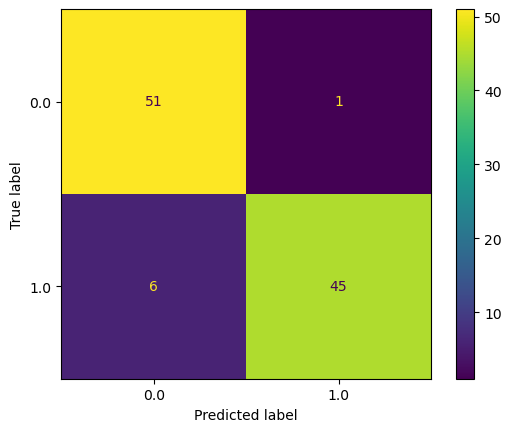

Train Accuracy score:  1.0
Validation Accuracy score:  0.9268
Test Accuracy score:  0.932
Test ROC_AUC score:  0.9602
Test Recall:  0.8824
Test Precision:  0.9783


Logistic Regression  Fold 0 

Confusion Matrix (test): 



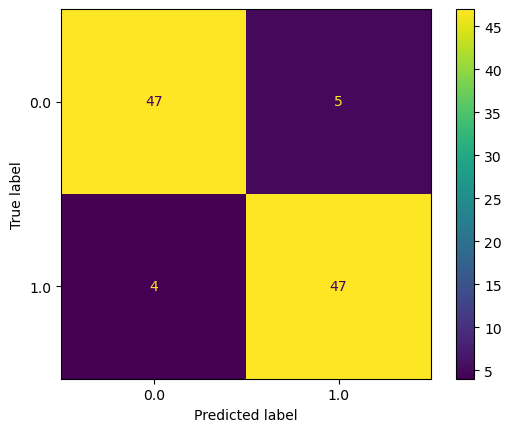

Train Accuracy score:  0.9786
Validation Accuracy score:  0.8659
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9487
Test Recall:  0.9216
Test Precision:  0.9038


XGBoost  Fold 0 

Confusion Matrix (test): 



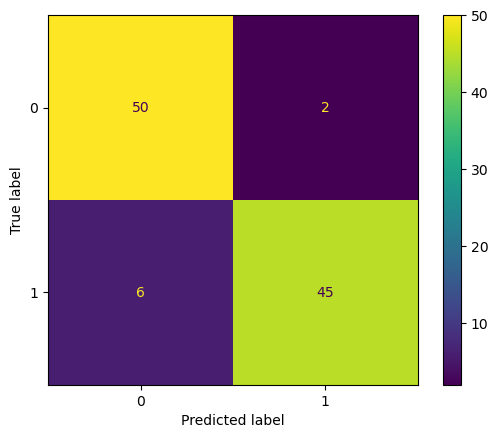

Train Accuracy score:  1.0
Validation Accuracy score:  0.9024
Test Accuracy score:  0.9223
Test ROC_AUC score:  0.9597
Test Recall:  0.8824
Test Precision:  0.9574


Naive Bayes  Fold 0 

Confusion Matrix (test): 



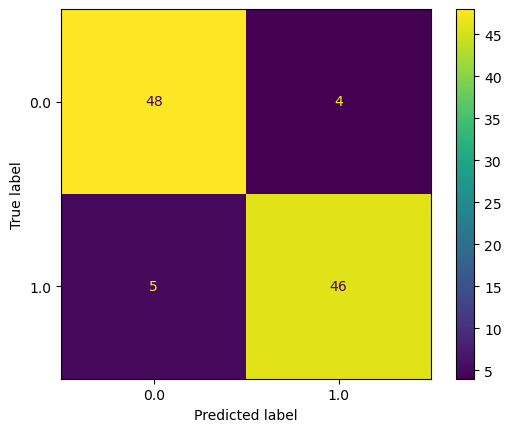

Train Accuracy score:  0.9327
Validation Accuracy score:  0.8659
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9389
Test Recall:  0.902
Test Precision:  0.92


Random Forest Classifier  Fold 1 

Confusion Matrix (test): 



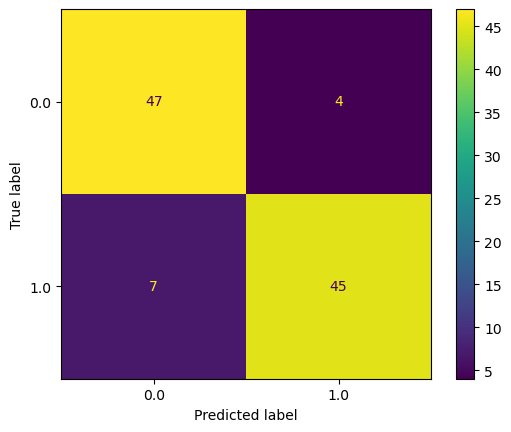

Train Accuracy score:  1.0
Validation Accuracy score:  0.9634
Test Accuracy score:  0.8932
Test ROC_AUC score:  0.9613
Test Recall:  0.8654
Test Precision:  0.9184


Logistic Regression  Fold 1 

Confusion Matrix (test): 



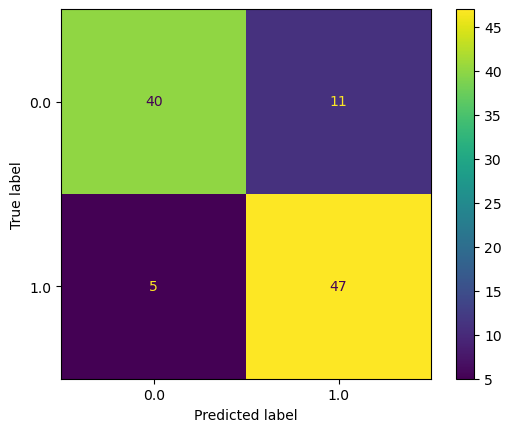

Train Accuracy score:  0.9817
Validation Accuracy score:  0.9146
Test Accuracy score:  0.8447
Test ROC_AUC score:  0.9423
Test Recall:  0.9038
Test Precision:  0.8103


XGBoost  Fold 1 

Confusion Matrix (test): 



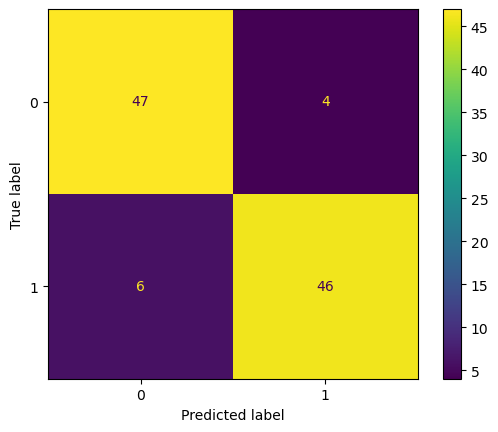

Train Accuracy score:  1.0
Validation Accuracy score:  0.9756
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9664
Test Recall:  0.8846
Test Precision:  0.92


Naive Bayes  Fold 1 

Confusion Matrix (test): 



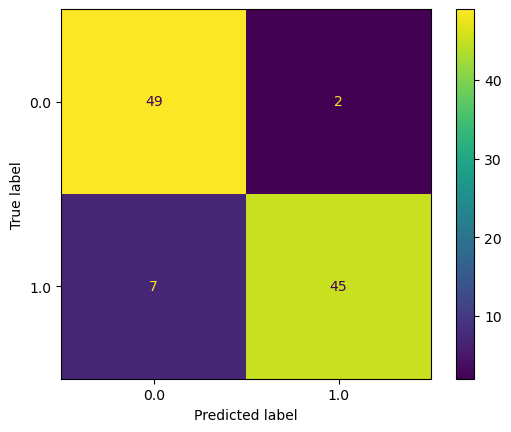

Train Accuracy score:  0.9205
Validation Accuracy score:  0.939
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9178
Test Recall:  0.8654
Test Precision:  0.9574


Random Forest Classifier  Fold 2 

Confusion Matrix (test): 



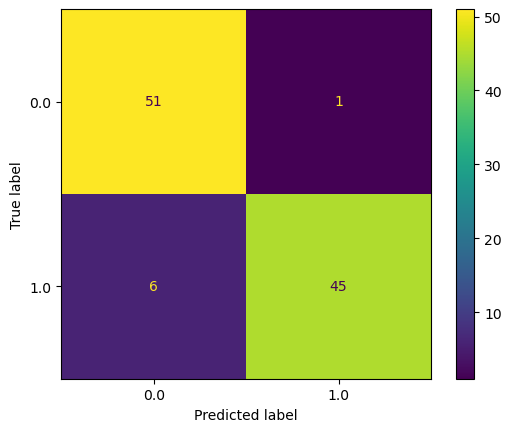

Train Accuracy score:  1.0
Validation Accuracy score:  0.9268
Test Accuracy score:  0.932
Test ROC_AUC score:  0.9717
Test Recall:  0.8824
Test Precision:  0.9783


Logistic Regression  Fold 2 

Confusion Matrix (test): 



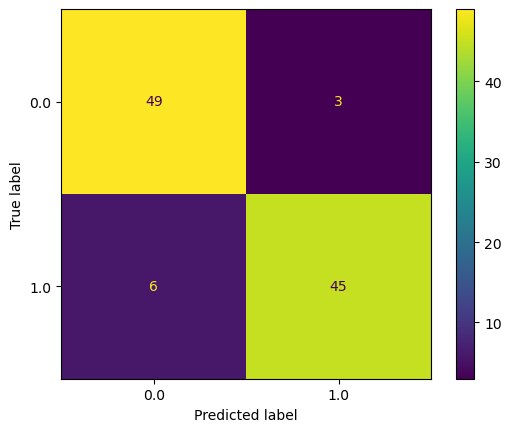

Train Accuracy score:  0.9817
Validation Accuracy score:  0.939
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9495
Test Recall:  0.8824
Test Precision:  0.9375


XGBoost  Fold 2 

Confusion Matrix (test): 



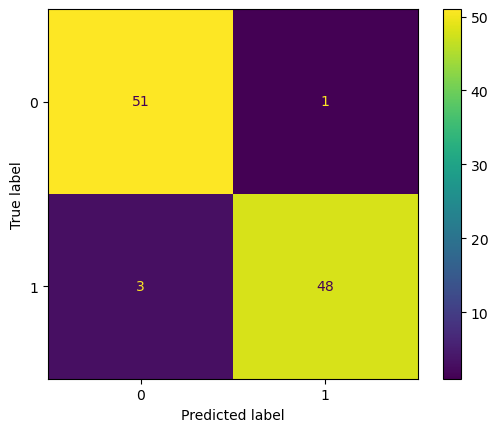

Train Accuracy score:  1.0
Validation Accuracy score:  0.9146
Test Accuracy score:  0.9612
Test ROC_AUC score:  0.9717
Test Recall:  0.9412
Test Precision:  0.9796


Naive Bayes  Fold 2 

Confusion Matrix (test): 



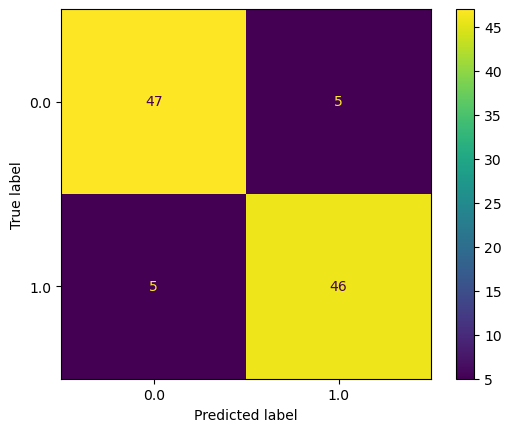

Train Accuracy score:  0.9266
Validation Accuracy score:  0.8902
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9348
Test Recall:  0.902
Test Precision:  0.902


Random Forest Classifier  Fold 3 

Confusion Matrix (test): 



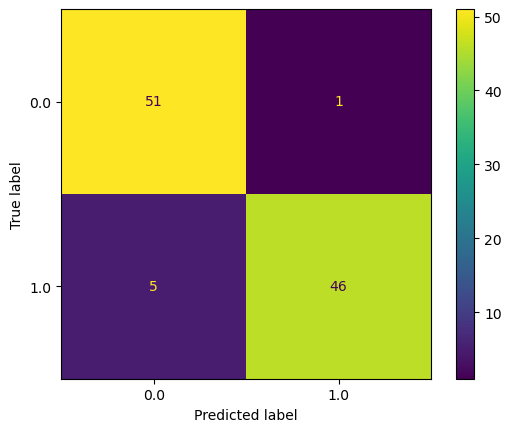

Train Accuracy score:  1.0
Validation Accuracy score:  0.9756
Test Accuracy score:  0.9417
Test ROC_AUC score:  0.9811
Test Recall:  0.902
Test Precision:  0.9787


Logistic Regression  Fold 3 

Confusion Matrix (test): 



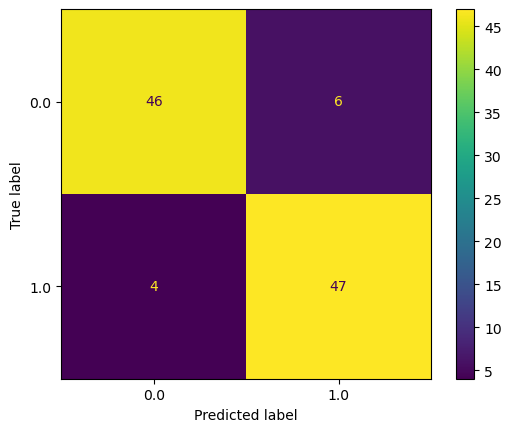

Train Accuracy score:  0.9847
Validation Accuracy score:  0.9756
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9638
Test Recall:  0.9216
Test Precision:  0.8868


XGBoost  Fold 3 

Confusion Matrix (test): 



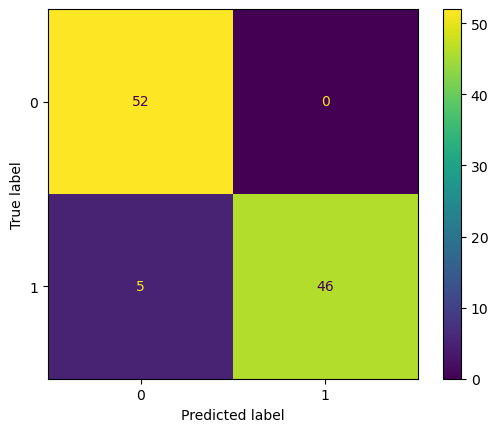

Train Accuracy score:  1.0
Validation Accuracy score:  0.9634
Test Accuracy score:  0.9515
Test ROC_AUC score:  0.9695
Test Recall:  0.902
Test Precision:  1.0


Naive Bayes  Fold 3 

Confusion Matrix (test): 



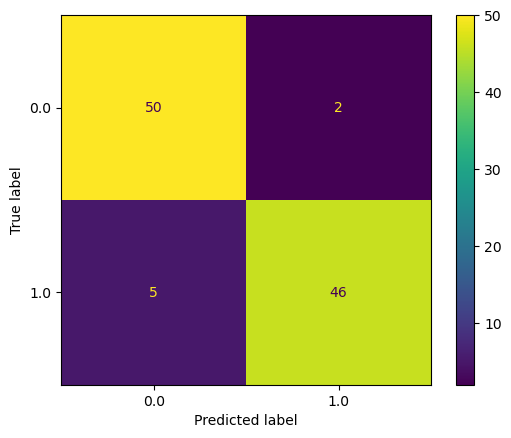

Train Accuracy score:  0.9113
Validation Accuracy score:  0.939
Test Accuracy score:  0.932
Test ROC_AUC score:  0.9695
Test Recall:  0.902
Test Precision:  0.9583


Random Forest Classifier  Fold 4 

Confusion Matrix (test): 



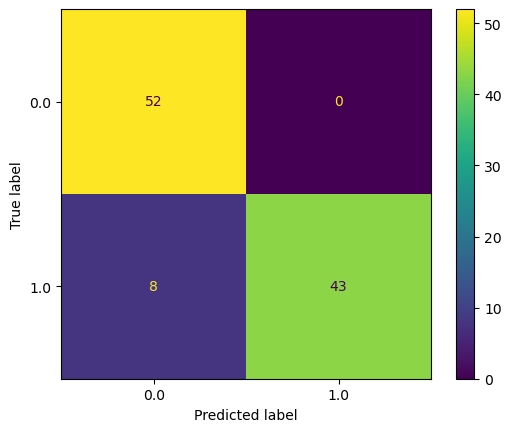

Train Accuracy score:  1.0
Validation Accuracy score:  0.939
Test Accuracy score:  0.9223
Test ROC_AUC score:  0.9515
Test Recall:  0.8431
Test Precision:  1.0


Logistic Regression  Fold 4 

Confusion Matrix (test): 



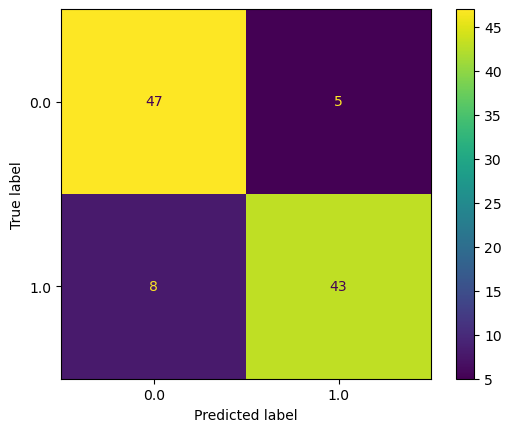

Train Accuracy score:  0.9878
Validation Accuracy score:  0.9146
Test Accuracy score:  0.8738
Test ROC_AUC score:  0.9238
Test Recall:  0.8431
Test Precision:  0.8958


XGBoost  Fold 4 

Confusion Matrix (test): 



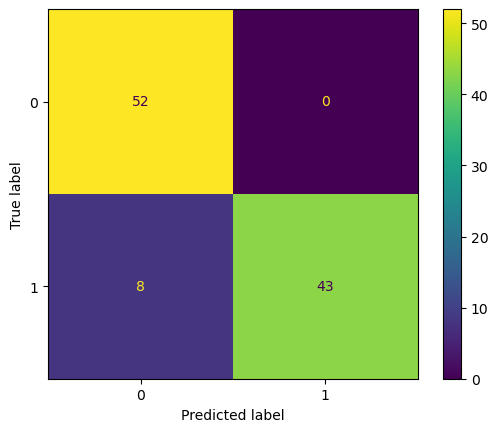

Train Accuracy score:  1.0
Validation Accuracy score:  0.939
Test Accuracy score:  0.9223
Test ROC_AUC score:  0.9461
Test Recall:  0.8431
Test Precision:  1.0


Naive Bayes  Fold 4 

Confusion Matrix (test): 



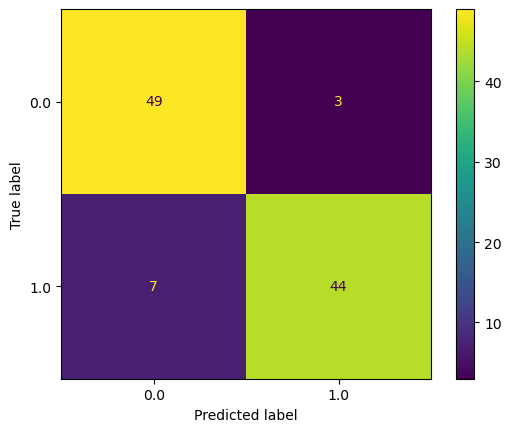

Train Accuracy score:  0.9235
Validation Accuracy score:  0.9146
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9351
Test Recall:  0.8627
Test Precision:  0.9362




In [111]:
# Model outputs for predicting outcome1 with oversampling
print("Model outputs for predicting outcome1 with oversampling")
outcome1_results = run_models(X_1, y_1, models, True)

Model outputs for predicting outcome2 with oversampling
Random Forest Classifier  Fold 0 

Confusion Matrix (test): 



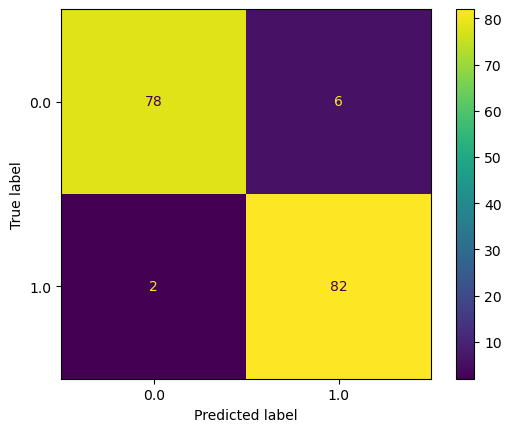

Train Accuracy score:  1.0
Validation Accuracy score:  0.9851
Test Accuracy score:  0.9524
Test ROC_AUC score:  0.9926
Test Recall:  0.9762
Test Precision:  0.9318


Logistic Regression  Fold 0 

Confusion Matrix (test): 



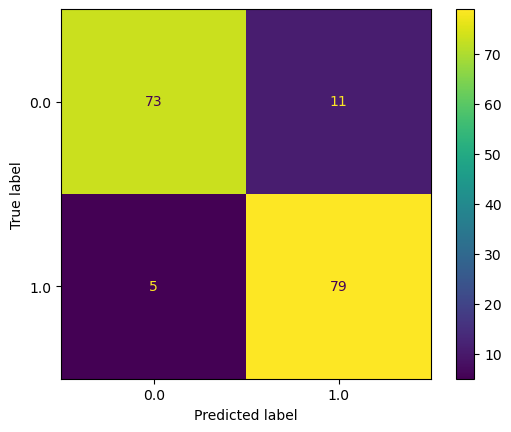

Train Accuracy score:  0.9813
Validation Accuracy score:  0.9179
Test Accuracy score:  0.9048
Test ROC_AUC score:  0.934
Test Recall:  0.9405
Test Precision:  0.8778


XGBoost  Fold 0 

Confusion Matrix (test): 



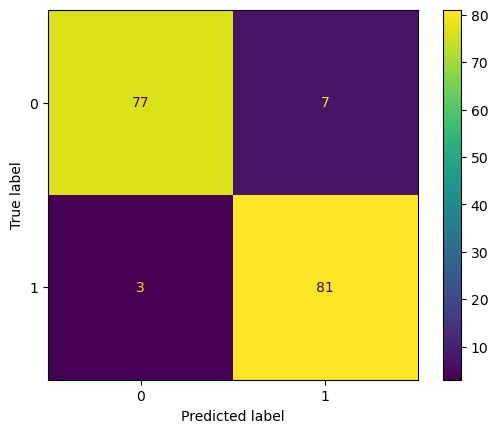

Train Accuracy score:  1.0
Validation Accuracy score:  0.9478
Test Accuracy score:  0.9405
Test ROC_AUC score:  0.9867
Test Recall:  0.9643
Test Precision:  0.9205


Naive Bayes  Fold 0 

Confusion Matrix (test): 



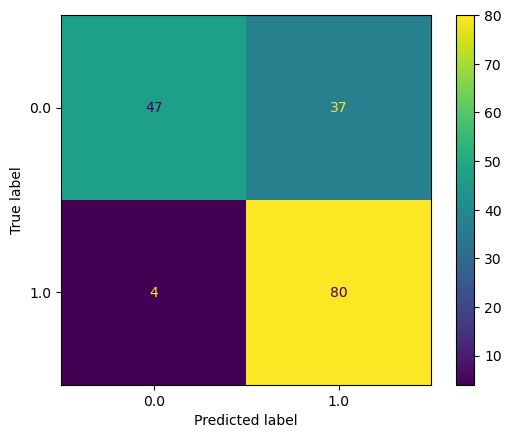

Train Accuracy score:  0.7828
Validation Accuracy score:  0.8433
Test Accuracy score:  0.756
Test ROC_AUC score:  0.9111
Test Recall:  0.9524
Test Precision:  0.6838


Random Forest Classifier  Fold 1 

Confusion Matrix (test): 



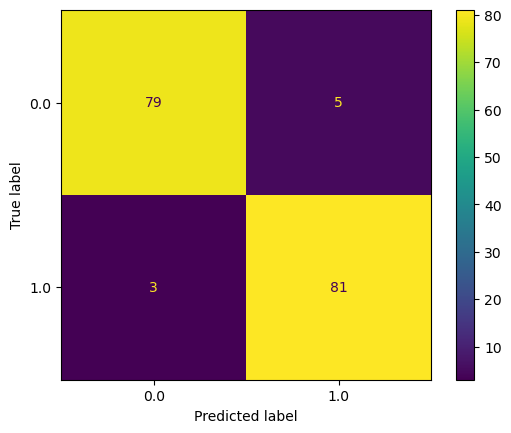

Train Accuracy score:  1.0
Validation Accuracy score:  0.9627
Test Accuracy score:  0.9524
Test ROC_AUC score:  0.9933
Test Recall:  0.9643
Test Precision:  0.9419


Logistic Regression  Fold 1 

Confusion Matrix (test): 



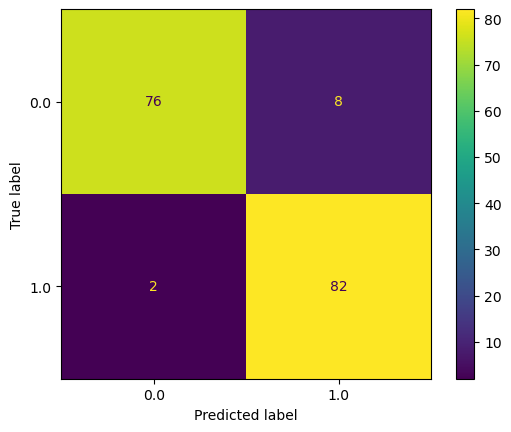

Train Accuracy score:  0.9813
Validation Accuracy score:  0.9403
Test Accuracy score:  0.9405
Test ROC_AUC score:  0.9707
Test Recall:  0.9762
Test Precision:  0.9111


XGBoost  Fold 1 

Confusion Matrix (test): 



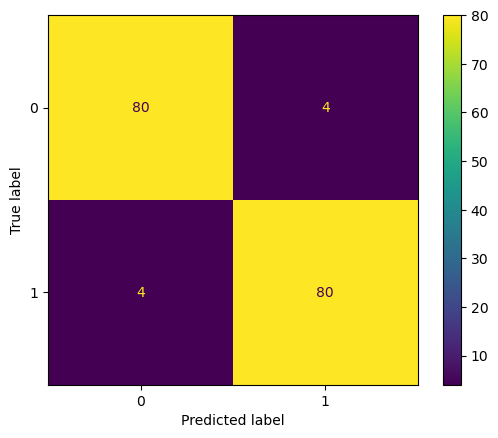

Train Accuracy score:  1.0
Validation Accuracy score:  0.9104
Test Accuracy score:  0.9524
Test ROC_AUC score:  0.9819
Test Recall:  0.9524
Test Precision:  0.9524


Naive Bayes  Fold 1 

Confusion Matrix (test): 



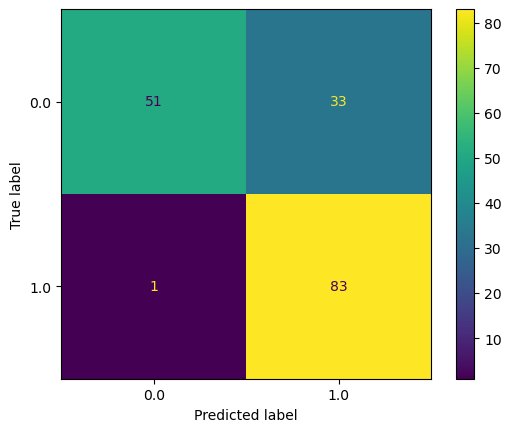

Train Accuracy score:  0.7528
Validation Accuracy score:  0.7388
Test Accuracy score:  0.7976
Test ROC_AUC score:  0.9163
Test Recall:  0.9881
Test Precision:  0.7155


Random Forest Classifier  Fold 2 

Confusion Matrix (test): 



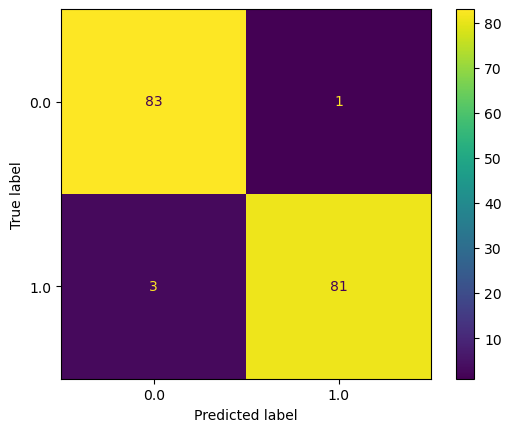

Train Accuracy score:  1.0
Validation Accuracy score:  0.9403
Test Accuracy score:  0.9762
Test ROC_AUC score:  0.9982
Test Recall:  0.9643
Test Precision:  0.9878


Logistic Regression  Fold 2 

Confusion Matrix (test): 



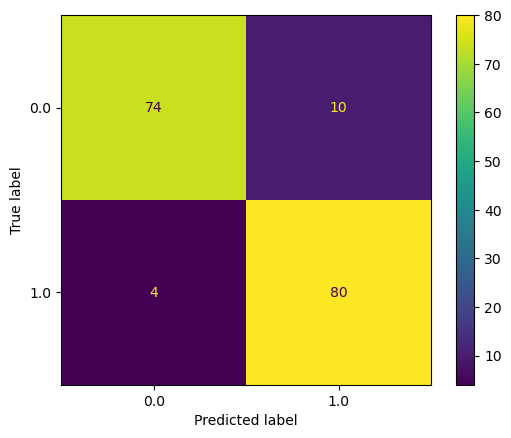

Train Accuracy score:  0.9869
Validation Accuracy score:  0.9328
Test Accuracy score:  0.9167
Test ROC_AUC score:  0.9592
Test Recall:  0.9524
Test Precision:  0.8889


XGBoost  Fold 2 

Confusion Matrix (test): 



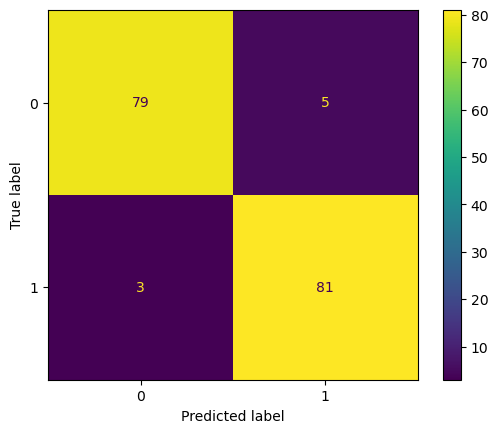

Train Accuracy score:  1.0
Validation Accuracy score:  0.9328
Test Accuracy score:  0.9524
Test ROC_AUC score:  0.9847
Test Recall:  0.9643
Test Precision:  0.9419


Naive Bayes  Fold 2 

Confusion Matrix (test): 



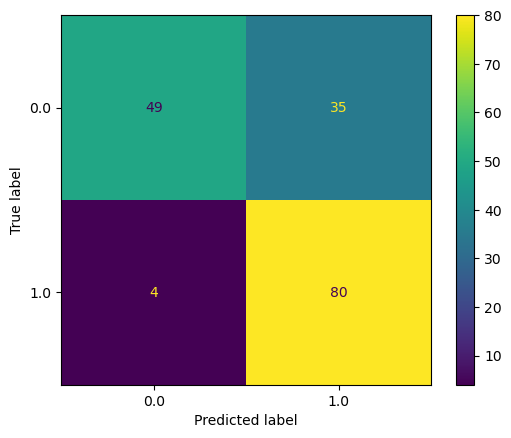

Train Accuracy score:  0.7434
Validation Accuracy score:  0.7015
Test Accuracy score:  0.7679
Test ROC_AUC score:  0.9078
Test Recall:  0.9524
Test Precision:  0.6957


Random Forest Classifier  Fold 3 

Confusion Matrix (test): 



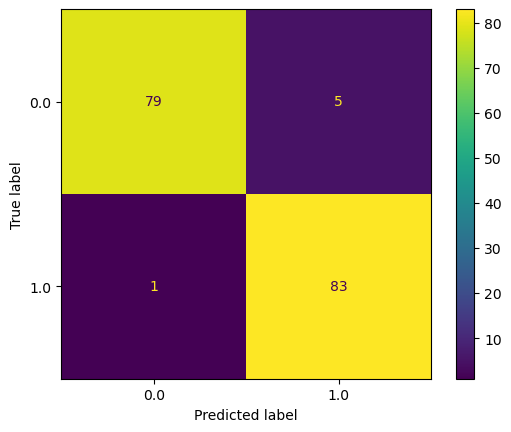

Train Accuracy score:  1.0
Validation Accuracy score:  0.9701
Test Accuracy score:  0.9643
Test ROC_AUC score:  0.9955
Test Recall:  0.9881
Test Precision:  0.9432


Logistic Regression  Fold 3 

Confusion Matrix (test): 



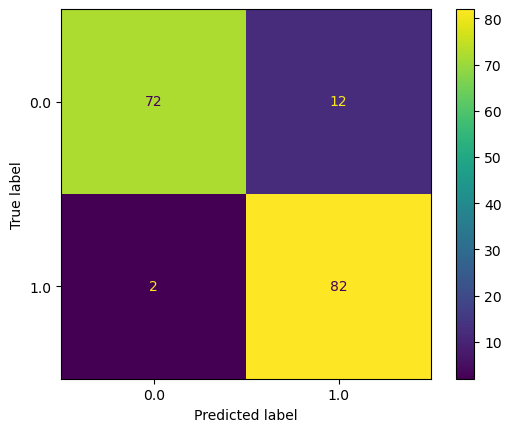

Train Accuracy score:  0.9813
Validation Accuracy score:  0.9478
Test Accuracy score:  0.9167
Test ROC_AUC score:  0.9512
Test Recall:  0.9762
Test Precision:  0.8723


XGBoost  Fold 3 

Confusion Matrix (test): 



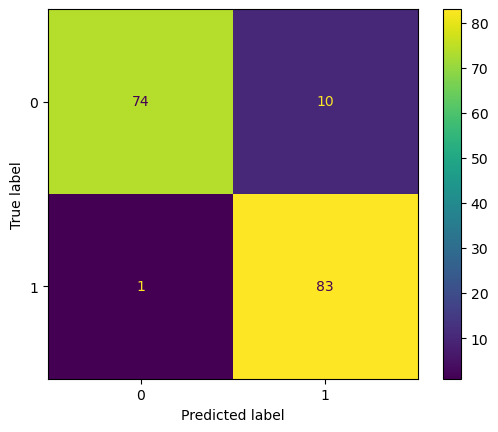

Train Accuracy score:  1.0
Validation Accuracy score:  0.9552
Test Accuracy score:  0.9345
Test ROC_AUC score:  0.9888
Test Recall:  0.9881
Test Precision:  0.8925


Naive Bayes  Fold 3 

Confusion Matrix (test): 



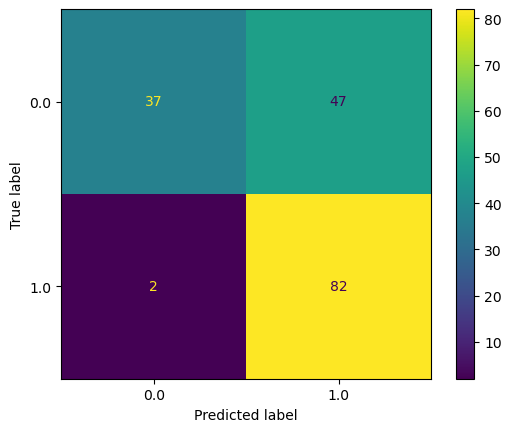

Train Accuracy score:  0.7135
Validation Accuracy score:  0.7015
Test Accuracy score:  0.7083
Test ROC_AUC score:  0.8745
Test Recall:  0.9762
Test Precision:  0.6357


Random Forest Classifier  Fold 4 

Confusion Matrix (test): 



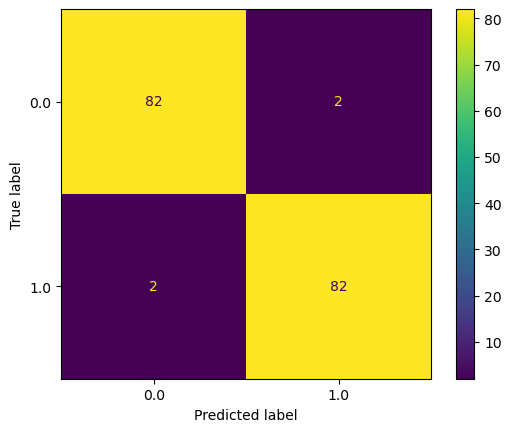

Train Accuracy score:  1.0
Validation Accuracy score:  0.9776
Test Accuracy score:  0.9762
Test ROC_AUC score:  0.9963
Test Recall:  0.9762
Test Precision:  0.9762


Logistic Regression  Fold 4 

Confusion Matrix (test): 



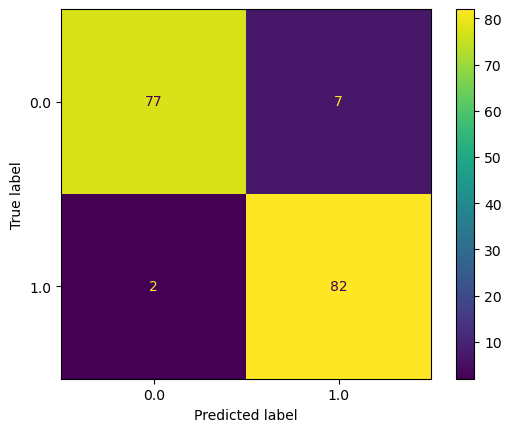

Train Accuracy score:  0.9869
Validation Accuracy score:  0.9254
Test Accuracy score:  0.9464
Test ROC_AUC score:  0.9785
Test Recall:  0.9762
Test Precision:  0.9213


XGBoost  Fold 4 

Confusion Matrix (test): 



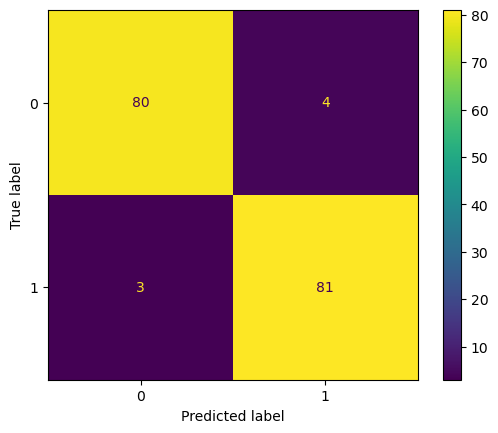

Train Accuracy score:  1.0
Validation Accuracy score:  0.9254
Test Accuracy score:  0.9583
Test ROC_AUC score:  0.9936
Test Recall:  0.9643
Test Precision:  0.9529


Naive Bayes  Fold 4 

Confusion Matrix (test): 



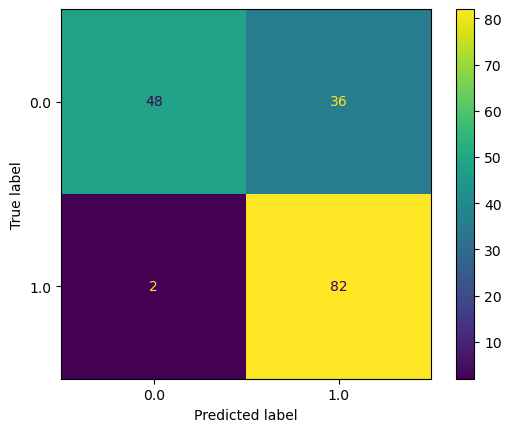

Train Accuracy score:  0.7528
Validation Accuracy score:  0.6791
Test Accuracy score:  0.7738
Test ROC_AUC score:  0.9184
Test Recall:  0.9762
Test Precision:  0.6949




In [112]:
# Model outputs for predicting outcome2 with oversampling
print("Model outputs for predicting outcome2 with oversampling")
outcome2_results = run_models(X_2, y_2, models, True)

In [113]:
#Results for outcome1 with SMOTE oversampling
print("Results for outcome1 with SMOTE oversampling")
outcome1_results_df = pd.DataFrame.from_dict(outcome1_results)
outcome1_results_df

Results for outcome1 with SMOTE oversampling


,Model,Accuracy (train),Accuracy (val),Accuracy (test),ROC Score (test),Recall (test),Precision (test),F1 Score (test)
0,Random Forest Classifier,1.00000,0.94632,0.92424,0.96516,0.87506,0.97074,0.920420
1,Logistic Regression,0.98290,0.92194,0.88932,0.94562,0.89450,0.88684,0.890654
2,XGBoost,1.00000,0.93900,0.93204,0.96268,0.89066,0.97140,0.929280
3,Naive Bayes,0.92292,0.90974,0.91260,0.93922,0.88682,0.93478,0.910169


In [114]:
#Results for outcome2 with SMOTE oversampling
print("Results for outcome2 with SMOTE oversampling")
outcome2_results_df = pd.DataFrame.from_dict(outcome2_results)
outcome2_results_df

Results for outcome2 with SMOTE oversampling


,Model,Accuracy (train),Accuracy (val),Accuracy (test),ROC Score (test),Recall (test),Precision (test),F1 Score (test)
0,Random Forest Classifier,1.00000,0.96716,0.96430,0.99518,0.97382,0.95618,0.964919
1,Logistic Regression,0.98354,0.93284,0.92502,0.95872,0.96430,0.89428,0.927971
2,XGBoost,1.00000,0.93432,0.94762,0.98714,0.96668,0.93204,0.949044
3,Naive Bayes,0.74906,0.73284,0.76072,0.90562,0.96906,0.68512,0.802721


Model outputs for predicting outcome1 without oversampling
Random Forest Classifier  Fold 0 

Confusion Matrix (test): 



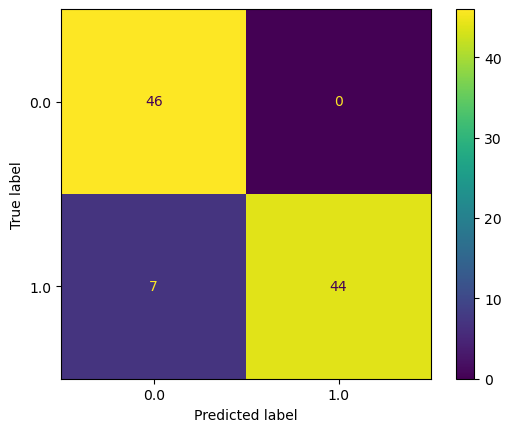

Train Accuracy score:  1.0
Validation Accuracy score:  0.9103
Test Accuracy score:  0.9278
Test ROC_AUC score:  0.9495
Test Recall:  0.8627
Test Precision:  1.0


Logistic Regression  Fold 0 

Confusion Matrix (test): 



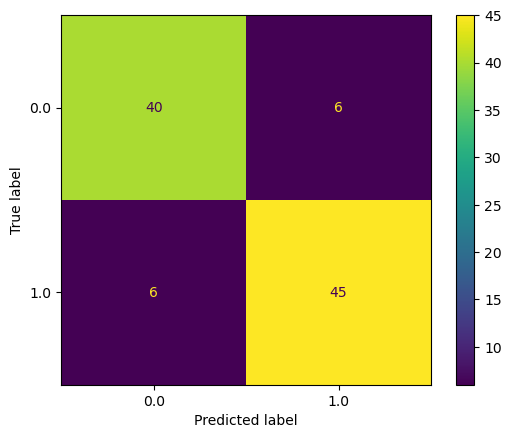

Train Accuracy score:  0.9968
Validation Accuracy score:  0.8718
Test Accuracy score:  0.8763
Test ROC_AUC score:  0.9301
Test Recall:  0.8824
Test Precision:  0.8824


XGBoost  Fold 0 

Confusion Matrix (test): 



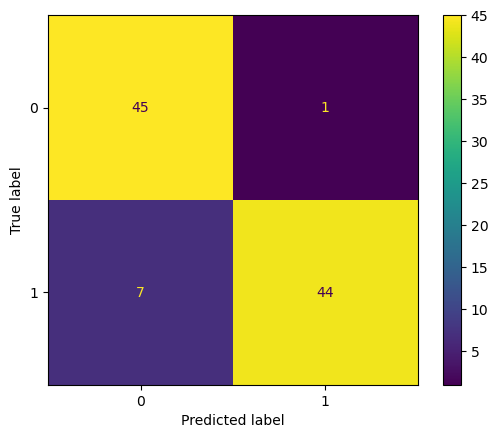

Train Accuracy score:  1.0
Validation Accuracy score:  0.9359
Test Accuracy score:  0.9175
Test ROC_AUC score:  0.9318
Test Recall:  0.8627
Test Precision:  0.9778


Naive Bayes  Fold 0 

Confusion Matrix (test): 



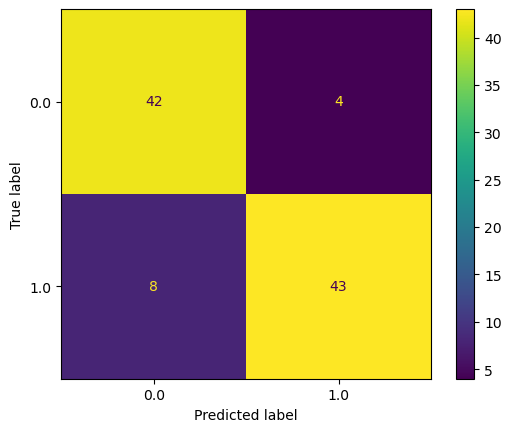

Train Accuracy score:  0.9288
Validation Accuracy score:  0.9231
Test Accuracy score:  0.8763
Test ROC_AUC score:  0.9299
Test Recall:  0.8431
Test Precision:  0.9149


Random Forest Classifier  Fold 1 

Confusion Matrix (test): 



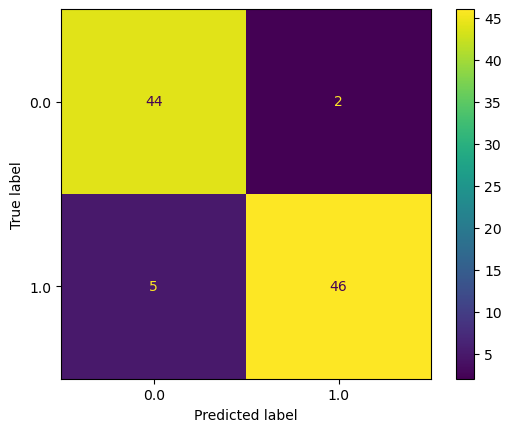

Train Accuracy score:  1.0
Validation Accuracy score:  0.8974
Test Accuracy score:  0.9278
Test ROC_AUC score:  0.9689
Test Recall:  0.902
Test Precision:  0.9583


Logistic Regression  Fold 1 

Confusion Matrix (test): 



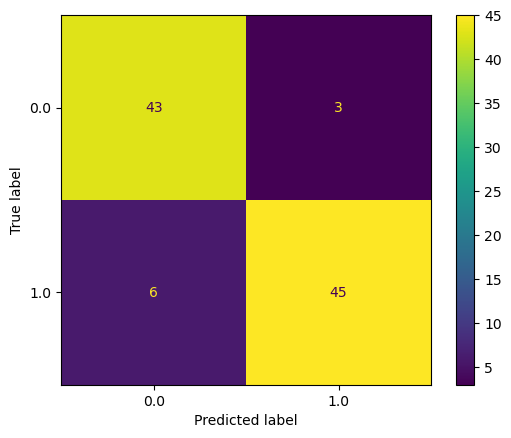

Train Accuracy score:  0.9935
Validation Accuracy score:  0.859
Test Accuracy score:  0.9072
Test ROC_AUC score:  0.9676
Test Recall:  0.8824
Test Precision:  0.9375


XGBoost  Fold 1 

Confusion Matrix (test): 



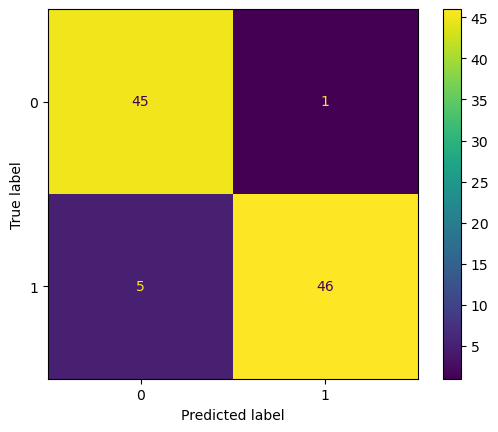

Train Accuracy score:  1.0
Validation Accuracy score:  0.9103
Test Accuracy score:  0.9381
Test ROC_AUC score:  0.9591
Test Recall:  0.902
Test Precision:  0.9787


Naive Bayes  Fold 1 

Confusion Matrix (test): 



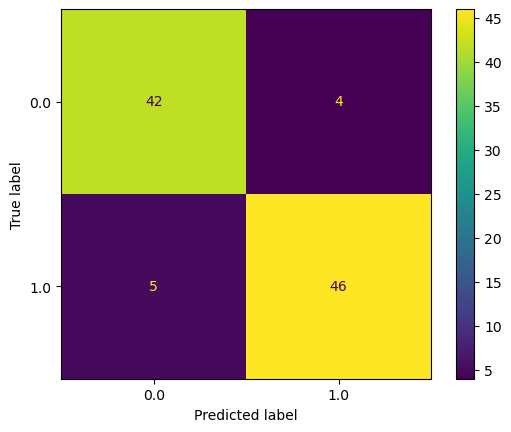

Train Accuracy score:  0.932
Validation Accuracy score:  0.8974
Test Accuracy score:  0.9072
Test ROC_AUC score:  0.9101
Test Recall:  0.902
Test Precision:  0.92


Random Forest Classifier  Fold 2 

Confusion Matrix (test): 



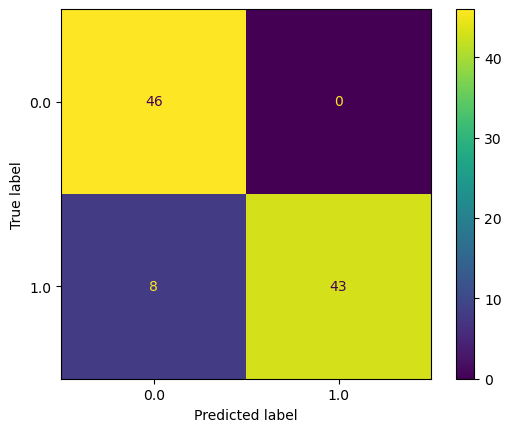

Train Accuracy score:  1.0
Validation Accuracy score:  0.9359
Test Accuracy score:  0.9175
Test ROC_AUC score:  0.9708
Test Recall:  0.8431
Test Precision:  1.0


Logistic Regression  Fold 2 

Confusion Matrix (test): 



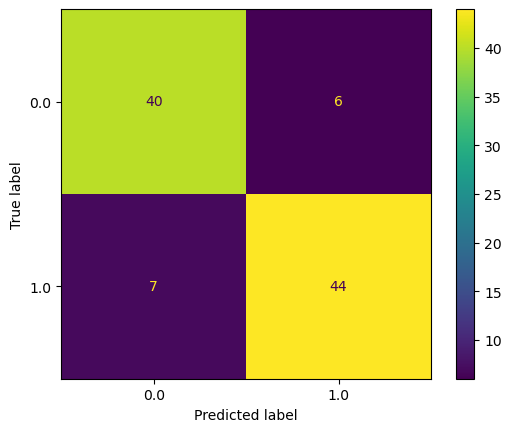

Train Accuracy score:  0.9871
Validation Accuracy score:  0.8718
Test Accuracy score:  0.866
Test ROC_AUC score:  0.9565
Test Recall:  0.8627
Test Precision:  0.88


XGBoost  Fold 2 

Confusion Matrix (test): 



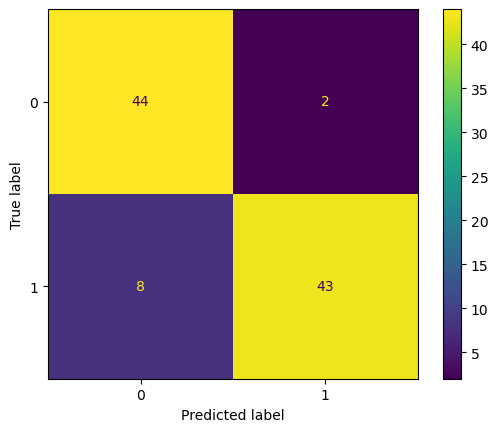

Train Accuracy score:  1.0
Validation Accuracy score:  0.9359
Test Accuracy score:  0.8969
Test ROC_AUC score:  0.9318
Test Recall:  0.8431
Test Precision:  0.9556


Naive Bayes  Fold 2 

Confusion Matrix (test): 



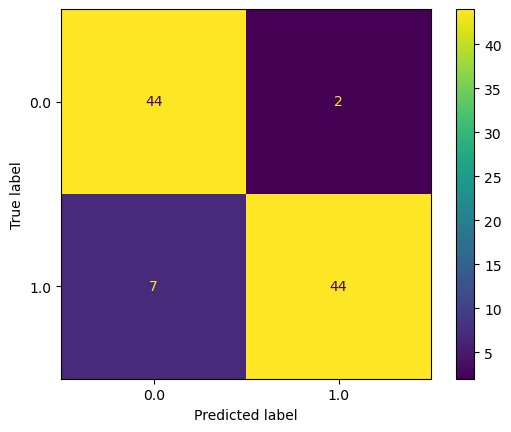

Train Accuracy score:  0.9256
Validation Accuracy score:  0.9359
Test Accuracy score:  0.9072
Test ROC_AUC score:  0.9593
Test Recall:  0.8627
Test Precision:  0.9565


Random Forest Classifier  Fold 3 

Confusion Matrix (test): 



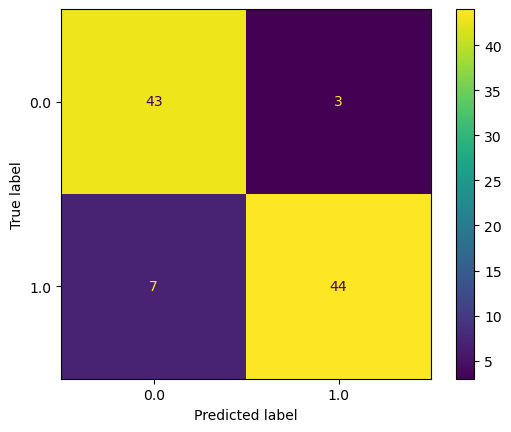

Train Accuracy score:  1.0
Validation Accuracy score:  0.9744
Test Accuracy score:  0.8969
Test ROC_AUC score:  0.9561
Test Recall:  0.8627
Test Precision:  0.9362


Logistic Regression  Fold 3 

Confusion Matrix (test): 



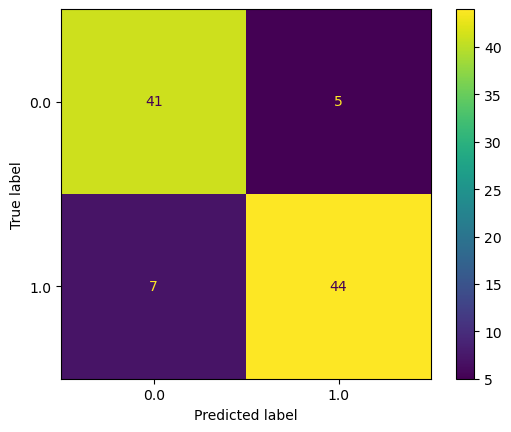

Train Accuracy score:  0.9838
Validation Accuracy score:  0.8974
Test Accuracy score:  0.8763
Test ROC_AUC score:  0.9386
Test Recall:  0.8627
Test Precision:  0.898


XGBoost  Fold 3 

Confusion Matrix (test): 



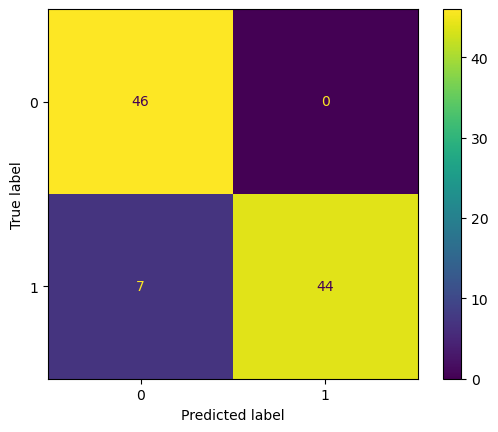

Train Accuracy score:  1.0
Validation Accuracy score:  0.9487
Test Accuracy score:  0.9278
Test ROC_AUC score:  0.9719
Test Recall:  0.8627
Test Precision:  1.0


Naive Bayes  Fold 3 

Confusion Matrix (test): 



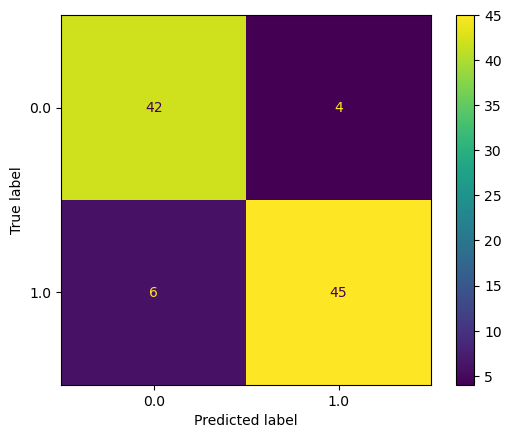

Train Accuracy score:  0.9159
Validation Accuracy score:  0.9615
Test Accuracy score:  0.8969
Test ROC_AUC score:  0.9049
Test Recall:  0.8824
Test Precision:  0.9184


Random Forest Classifier  Fold 4 

Confusion Matrix (test): 



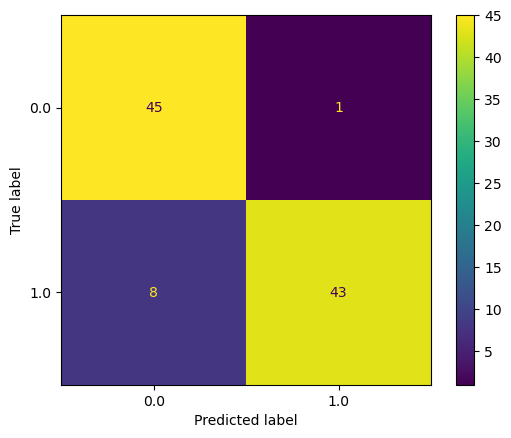

Train Accuracy score:  1.0
Validation Accuracy score:  0.9103
Test Accuracy score:  0.9072
Test ROC_AUC score:  0.9401
Test Recall:  0.8431
Test Precision:  0.9773


Logistic Regression  Fold 4 

Confusion Matrix (test): 



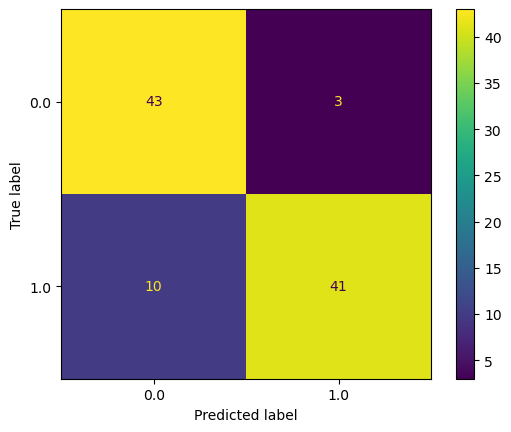

Train Accuracy score:  0.9838
Validation Accuracy score:  0.8846
Test Accuracy score:  0.866
Test ROC_AUC score:  0.9275
Test Recall:  0.8039
Test Precision:  0.9318


XGBoost  Fold 4 

Confusion Matrix (test): 



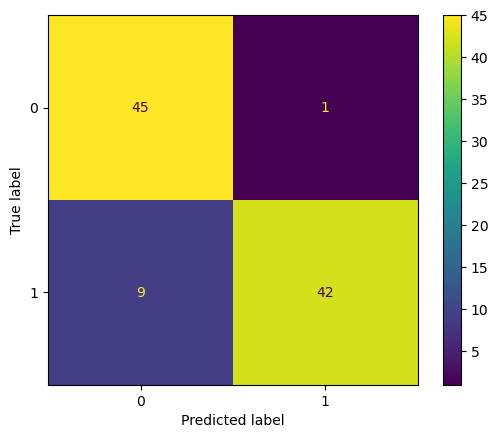

Train Accuracy score:  1.0
Validation Accuracy score:  0.9487
Test Accuracy score:  0.8969
Test ROC_AUC score:  0.9246
Test Recall:  0.8235
Test Precision:  0.9767


Naive Bayes  Fold 4 

Confusion Matrix (test): 



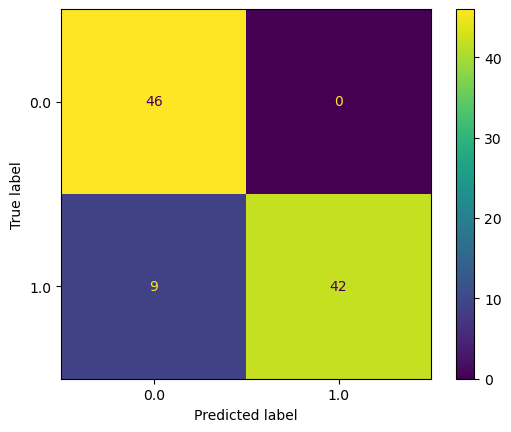

Train Accuracy score:  0.932
Validation Accuracy score:  0.9231
Test Accuracy score:  0.9072
Test ROC_AUC score:  0.945
Test Recall:  0.8235
Test Precision:  1.0




In [115]:
# Model outputs for predicting outcome1 without oversampling
print("Model outputs for predicting outcome1 without oversampling")
outcome1_results_no_smote = run_models(X_1, y_1, models, False)

Model outputs for predicting outcome2 without oversampling
Random Forest Classifier  Fold 0 

Confusion Matrix (test): 



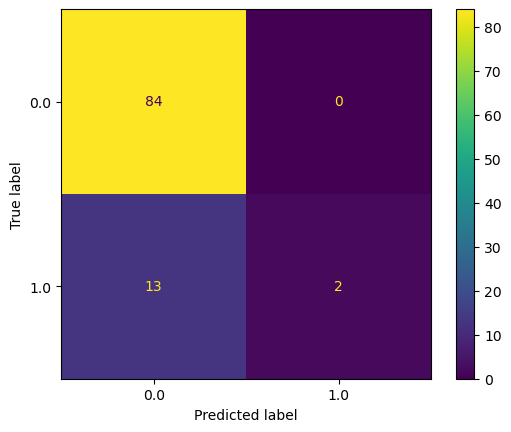

Train Accuracy score:  1.0
Validation Accuracy score:  0.8987
Test Accuracy score:  0.8687
Test ROC_AUC score:  0.8413
Test Recall:  0.1333
Test Precision:  1.0


Logistic Regression  Fold 0 

Confusion Matrix (test): 



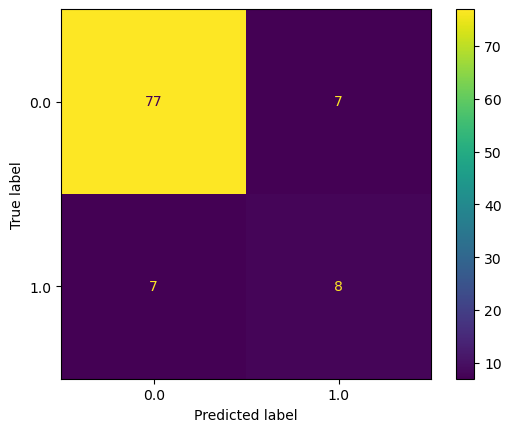

Train Accuracy score:  0.9904
Validation Accuracy score:  0.8734
Test Accuracy score:  0.8586
Test ROC_AUC score:  0.8222
Test Recall:  0.5333
Test Precision:  0.5333


XGBoost  Fold 0 

Confusion Matrix (test): 



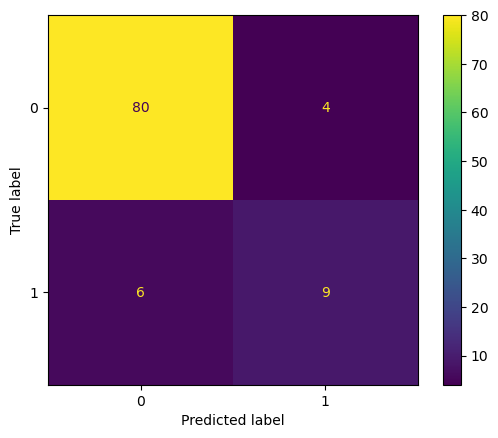

Train Accuracy score:  1.0
Validation Accuracy score:  0.8987
Test Accuracy score:  0.899
Test ROC_AUC score:  0.8921
Test Recall:  0.6
Test Precision:  0.6923


Naive Bayes  Fold 0 

Confusion Matrix (test): 



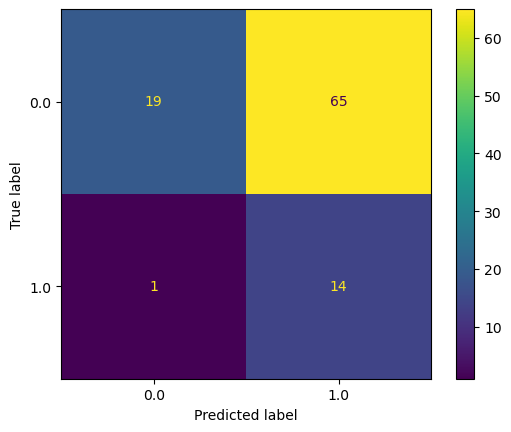

Train Accuracy score:  0.4395
Validation Accuracy score:  0.2532
Test Accuracy score:  0.3333
Test ROC_AUC score:  0.7706
Test Recall:  0.9333
Test Precision:  0.1772


Random Forest Classifier  Fold 1 

Confusion Matrix (test): 



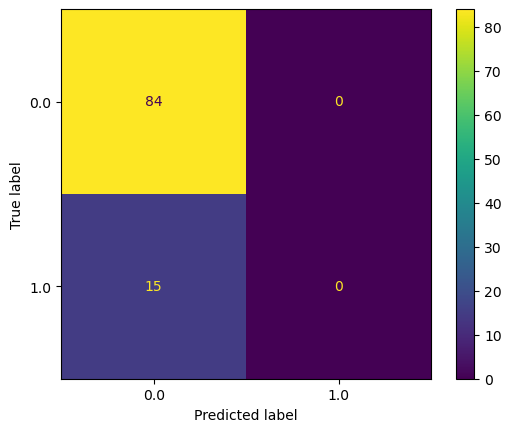

Train Accuracy score:  1.0
Validation Accuracy score:  0.9114
Test Accuracy score:  0.8485
Test ROC_AUC score:  0.829
Test Recall:  0.0
Test Precision:  0.0


Logistic Regression  Fold 1 

Confusion Matrix (test): 



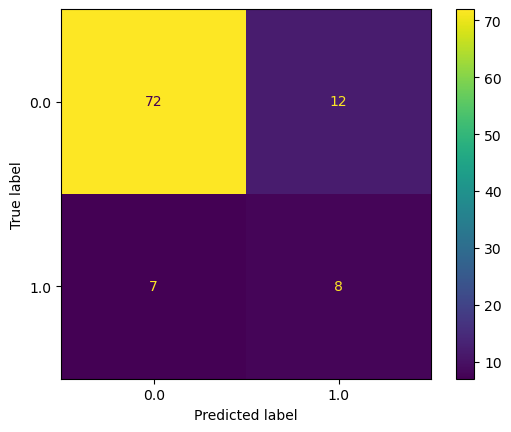

Train Accuracy score:  0.9968
Validation Accuracy score:  0.8987
Test Accuracy score:  0.8081
Test ROC_AUC score:  0.7571
Test Recall:  0.5333
Test Precision:  0.4


XGBoost  Fold 1 

Confusion Matrix (test): 



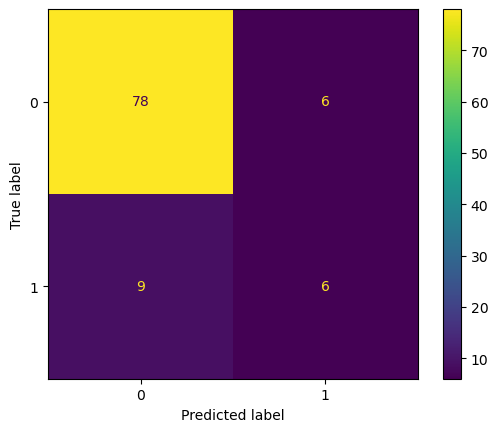

Train Accuracy score:  1.0
Validation Accuracy score:  0.8734
Test Accuracy score:  0.8485
Test ROC_AUC score:  0.8278
Test Recall:  0.4
Test Precision:  0.5


Naive Bayes  Fold 1 

Confusion Matrix (test): 



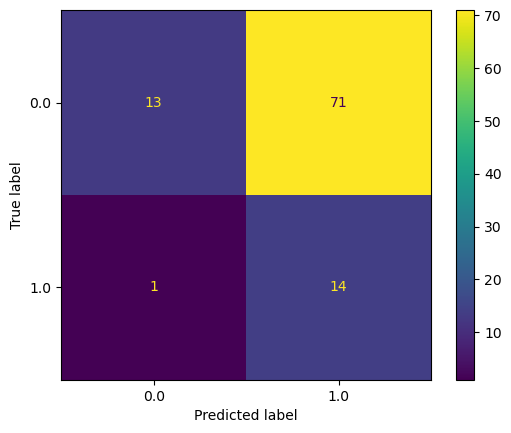

Train Accuracy score:  0.3535
Validation Accuracy score:  0.2911
Test Accuracy score:  0.2727
Test ROC_AUC score:  0.7488
Test Recall:  0.9333
Test Precision:  0.1647


Random Forest Classifier  Fold 2 

Confusion Matrix (test): 



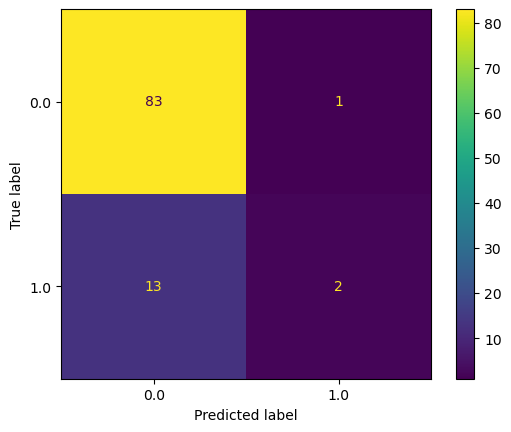

Train Accuracy score:  1.0
Validation Accuracy score:  0.8481
Test Accuracy score:  0.8586
Test ROC_AUC score:  0.8909
Test Recall:  0.1333
Test Precision:  0.6667


Logistic Regression  Fold 2 

Confusion Matrix (test): 



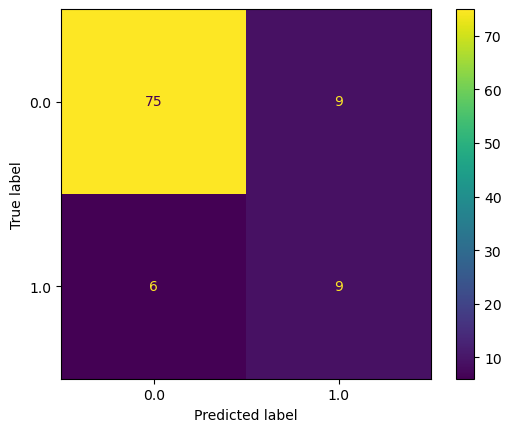

Train Accuracy score:  0.9873
Validation Accuracy score:  0.8608
Test Accuracy score:  0.8485
Test ROC_AUC score:  0.8587
Test Recall:  0.6
Test Precision:  0.5


XGBoost  Fold 2 

Confusion Matrix (test): 



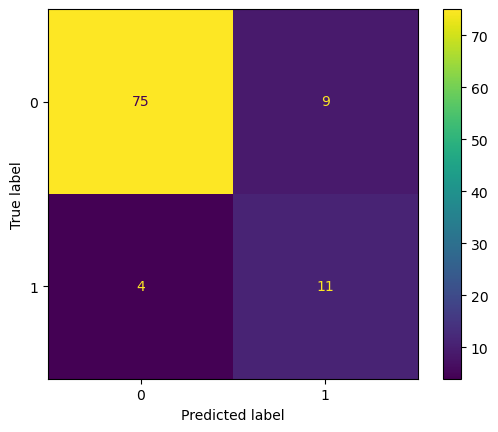

Train Accuracy score:  1.0
Validation Accuracy score:  0.8861
Test Accuracy score:  0.8687
Test ROC_AUC score:  0.9008
Test Recall:  0.7333
Test Precision:  0.55


Naive Bayes  Fold 2 

Confusion Matrix (test): 



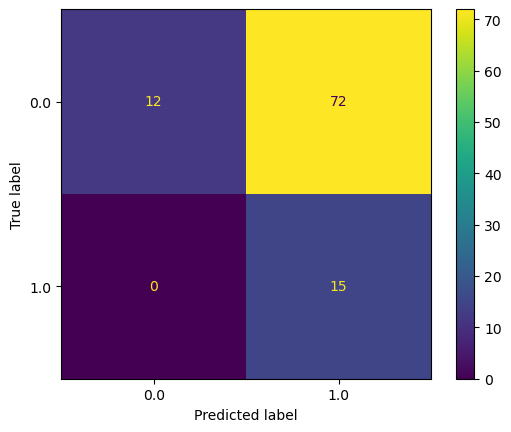

Train Accuracy score:  0.293
Validation Accuracy score:  0.2152
Test Accuracy score:  0.2727
Test ROC_AUC score:  0.7381
Test Recall:  1.0
Test Precision:  0.1724


Random Forest Classifier  Fold 3 

Confusion Matrix (test): 



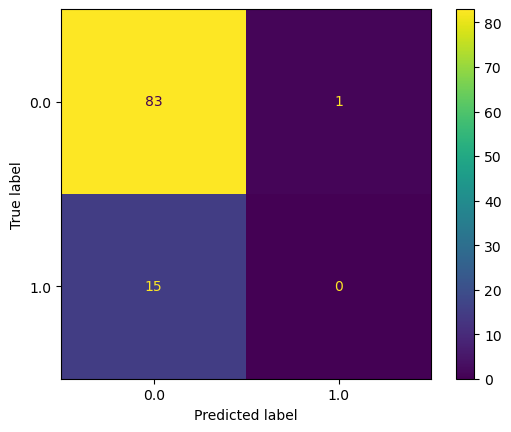

Train Accuracy score:  1.0
Validation Accuracy score:  0.8734
Test Accuracy score:  0.8384
Test ROC_AUC score:  0.7829
Test Recall:  0.0
Test Precision:  0.0


Logistic Regression  Fold 3 

Confusion Matrix (test): 



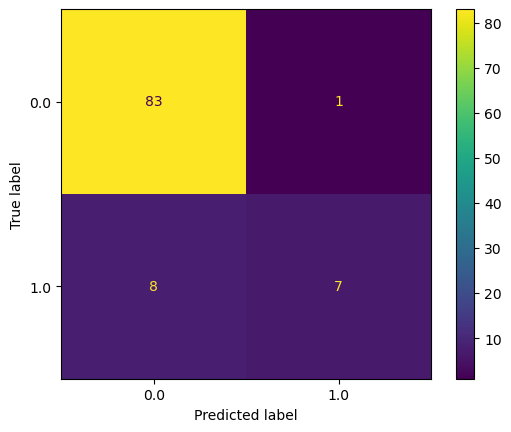

Train Accuracy score:  0.9936
Validation Accuracy score:  0.8608
Test Accuracy score:  0.9091
Test ROC_AUC score:  0.8476
Test Recall:  0.4667
Test Precision:  0.875


XGBoost  Fold 3 

Confusion Matrix (test): 



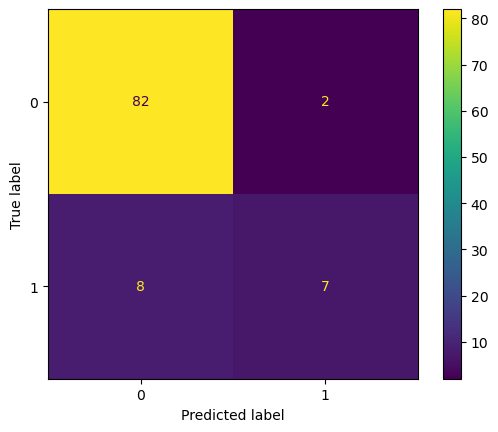

Train Accuracy score:  1.0
Validation Accuracy score:  0.9114
Test Accuracy score:  0.899
Test ROC_AUC score:  0.8468
Test Recall:  0.4667
Test Precision:  0.7778


Naive Bayes  Fold 3 

Confusion Matrix (test): 



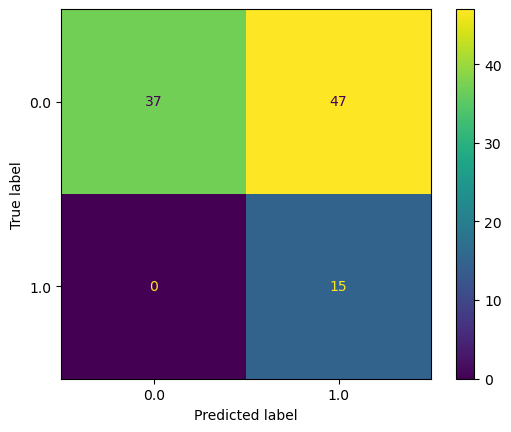

Train Accuracy score:  0.4809
Validation Accuracy score:  0.443
Test Accuracy score:  0.5253
Test ROC_AUC score:  0.8595
Test Recall:  1.0
Test Precision:  0.2419


Random Forest Classifier  Fold 4 

Confusion Matrix (test): 



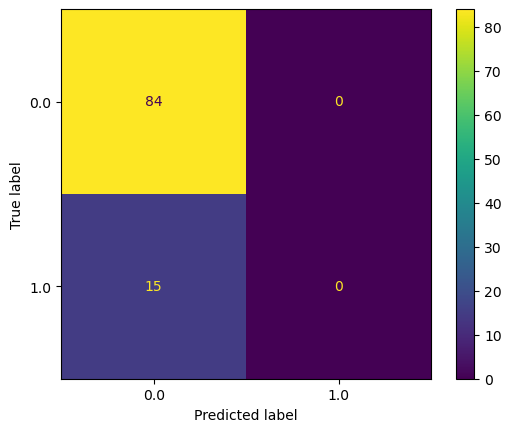

Train Accuracy score:  1.0
Validation Accuracy score:  0.8734
Test Accuracy score:  0.8485
Test ROC_AUC score:  0.8127
Test Recall:  0.0
Test Precision:  0.0


Logistic Regression  Fold 4 

Confusion Matrix (test): 



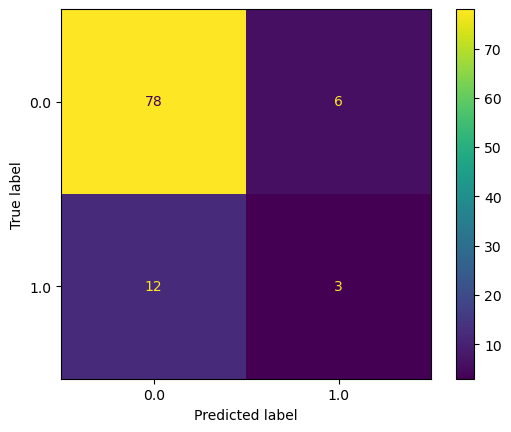

Train Accuracy score:  1.0
Validation Accuracy score:  0.8354
Test Accuracy score:  0.8182
Test ROC_AUC score:  0.7643
Test Recall:  0.2
Test Precision:  0.3333


XGBoost  Fold 4 

Confusion Matrix (test): 



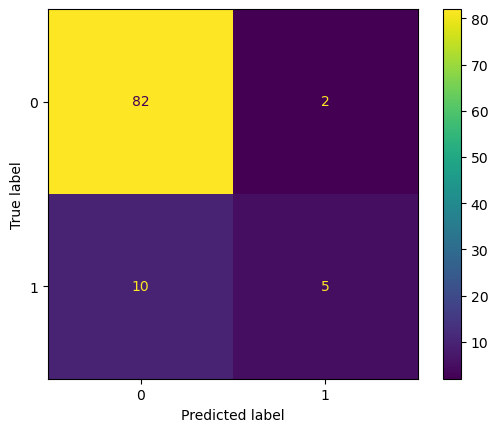

Train Accuracy score:  1.0
Validation Accuracy score:  0.8861
Test Accuracy score:  0.8788
Test ROC_AUC score:  0.8579
Test Recall:  0.3333
Test Precision:  0.7143


Naive Bayes  Fold 4 

Confusion Matrix (test): 



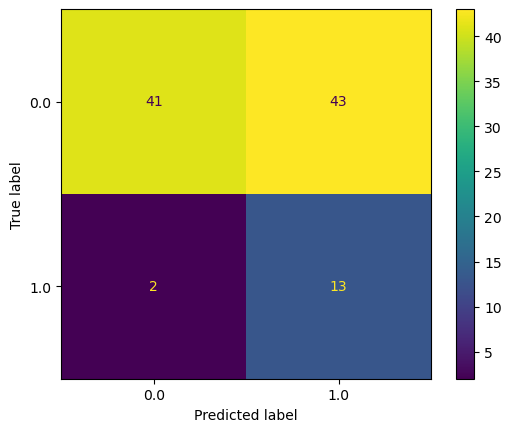

Train Accuracy score:  0.5096
Validation Accuracy score:  0.443
Test Accuracy score:  0.5455
Test ROC_AUC score:  0.8107
Test Recall:  0.8667
Test Precision:  0.2321




In [116]:
# Model outputs for predicting outcome2 without oversampling
print("Model outputs for predicting outcome2 without oversampling")
outcome2_results_no_smote = run_models(X_2, y_2, models, False)

In [117]:
print("Results for outcome1 without SMOTE oversampling")
outcome1_results_no_smote_df = pd.DataFrame.from_dict(outcome1_results_no_smote)
outcome1_results_no_smote_df

Results for outcome1 without SMOTE oversampling


,Model,Accuracy (train),Accuracy (val),Accuracy (test),ROC Score (test),Recall (test),Precision (test),F1 Score (test)
0,Random Forest Classifier,1.00000,0.92566,0.91544,0.95708,0.86272,0.97436,0.915148
1,Logistic Regression,0.98900,0.87692,0.87836,0.94406,0.85882,0.90594,0.881751
2,XGBoost,1.00000,0.93590,0.91544,0.94384,0.85880,0.97776,0.914427
3,Naive Bayes,0.92686,0.92820,0.89896,0.92984,0.86274,0.94196,0.900611


In [118]:
print("Results for outcome2 without SMOTE oversampling")
outcome2_results_no_smote_df = pd.DataFrame.from_dict(outcome2_results_no_smote)
outcome2_results_no_smote_df

Results for outcome2 without SMOTE oversampling


,Model,Accuracy (train),Accuracy (val),Accuracy (test),ROC Score (test),Recall (test),Precision (test),F1 Score (test)
0,Random Forest Classifier,1.00000,0.88100,0.85254,0.83136,0.05332,0.33334,0.091934
1,Logistic Regression,0.99362,0.86582,0.84850,0.80998,0.46666,0.52832,0.495579
2,XGBoost,1.00000,0.89114,0.87880,0.86508,0.50666,0.64688,0.568248
3,Naive Bayes,0.41530,0.32910,0.38990,0.78554,0.94666,0.19766,0.327036


Comparing the results between the effect of compensating for the class imbalance and not using SMOTE indicates that class imbalance led to much lower recall and precision scores for outcome 2 for the Random forest classifier, Logistic regression, and XGBoost models. However, we run into the issue of overfitting for all of the models. The training accuracy is higher than that of the validation and testing datasets, even reaching 100% accuracy for the random forest and XGBoost algorithms when evaluating the training dataset. 

Overall, the Random Forest and XGBoost classifiers performed the best for outcome1 and outcome2, with logistic regression coming in second, and Naive Bayes performing the worst in terms of the seven metrics. However, Naive bayes had the highest recall (0.94666) compared to the other models without SMOTE oversampling by a significant amount, meaning the model is capable of identifying 94.666% of the actual positive cases. This is useful because despite the small number of positive cases for outcome1, the Naive Bayes algorithm was able to detect most of them correctly. Yet the precision score indicates that the algorithm may be over-compensating for the lack of postive cases. The model is only correct about the postive case 19.766% of the time, which is much lower than the other models. Oversampling with SMOTE seems to fix the issues with predicting the postive case for outcome2, as shown by the higher recall and precision scores.

We recommend using tree based methods rather than distance based due to the non-normal distributions of some of the variables.

We now try normalizing all the variables not falling under a normal distribution using Winsorization and Box-Cox transform and seeing whether the results will improve. 

In [119]:
# Select non-normal variables
l = [1, 4, 53, 55, 56, 58, 59, 64, 72, 79, 127, 135]
nonnormal_variables = ["variable" + str(i) for i in l]

df_normalized = df_processed.copy()
for v in nonnormal_variables:
    df_normalized[v] = normalize(df_normalized[v])
    
outcome1_normalized = df_normalized[~df_normalized['outcome1'].isna()]
outcome2_normalized = df_normalized[~df_normalized['outcome2'].isna()]

X_1n = outcome1_normalized.drop(columns=["outcome1", "outcome2"], axis=1).to_numpy()
y_1n = np.array(outcome1_normalized["outcome1"])

X_2n = outcome2_normalized.drop(columns=["outcome1", "outcome2"], axis=1).to_numpy()
y_2n = np.array(outcome2_normalized["outcome2"])

Model outputs for predicting outcome1 with oversampling and normalization
Random Forest Classifier  Fold 0 

Confusion Matrix (test): 



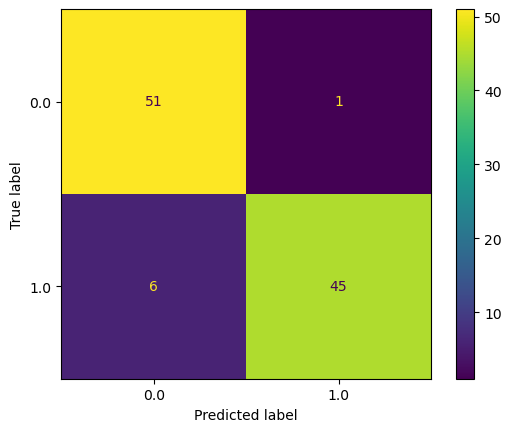

Train Accuracy score:  1.0
Validation Accuracy score:  0.9268
Test Accuracy score:  0.932
Test ROC_AUC score:  0.9764
Test Recall:  0.8824
Test Precision:  0.9783


Logistic Regression  Fold 0 

Confusion Matrix (test): 



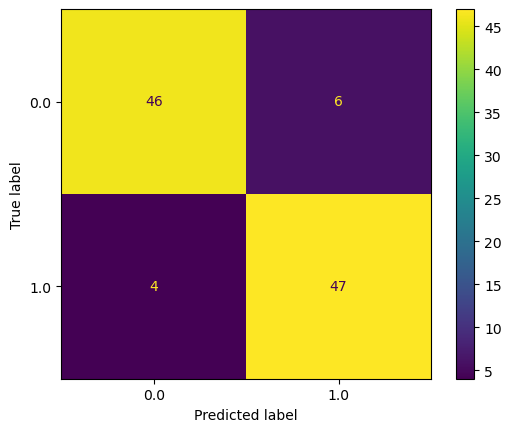

Train Accuracy score:  0.9786
Validation Accuracy score:  0.8659
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9495
Test Recall:  0.9216
Test Precision:  0.8868


XGBoost  Fold 0 

Confusion Matrix (test): 



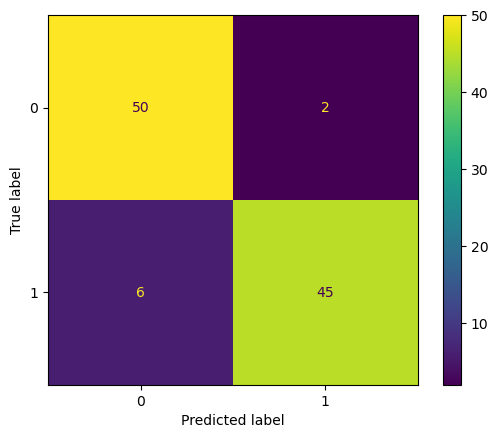

Train Accuracy score:  1.0
Validation Accuracy score:  0.9146
Test Accuracy score:  0.9223
Test ROC_AUC score:  0.9642
Test Recall:  0.8824
Test Precision:  0.9574


Naive Bayes  Fold 0 

Confusion Matrix (test): 



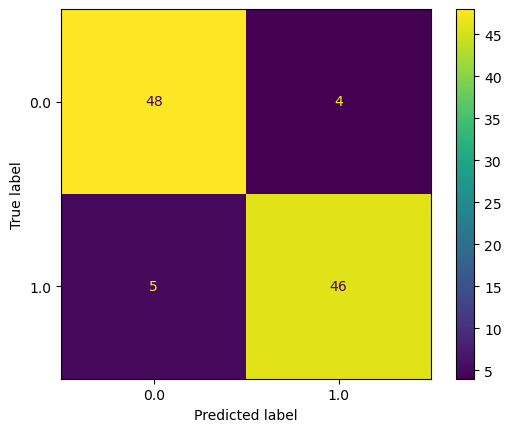

Train Accuracy score:  0.9327
Validation Accuracy score:  0.8659
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9389
Test Recall:  0.902
Test Precision:  0.92


Random Forest Classifier  Fold 1 

Confusion Matrix (test): 



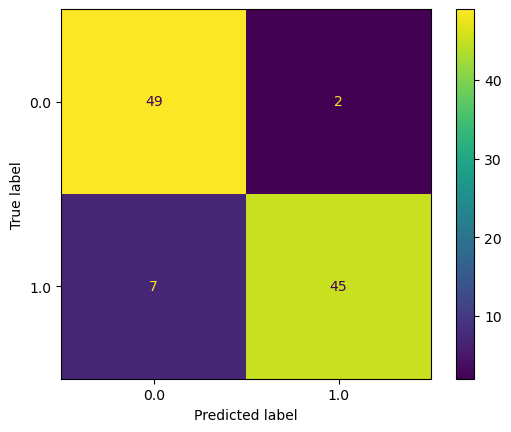

Train Accuracy score:  1.0
Validation Accuracy score:  0.9634
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9627
Test Recall:  0.8654
Test Precision:  0.9574


Logistic Regression  Fold 1 

Confusion Matrix (test): 



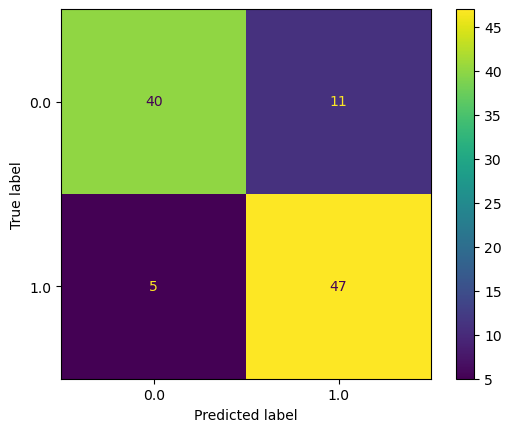

Train Accuracy score:  0.9817
Validation Accuracy score:  0.9024
Test Accuracy score:  0.8447
Test ROC_AUC score:  0.9416
Test Recall:  0.9038
Test Precision:  0.8103


XGBoost  Fold 1 

Confusion Matrix (test): 



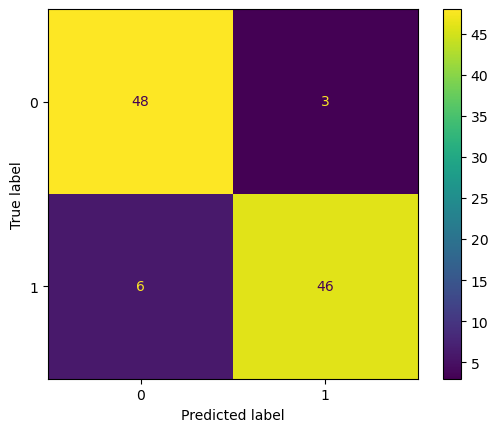

Train Accuracy score:  1.0
Validation Accuracy score:  0.9756
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9634
Test Recall:  0.8846
Test Precision:  0.9388


Naive Bayes  Fold 1 

Confusion Matrix (test): 



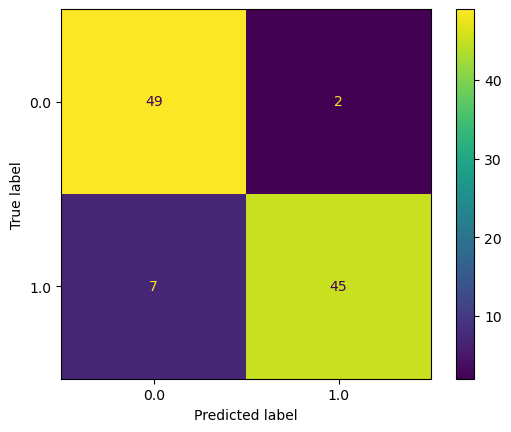

Train Accuracy score:  0.9205
Validation Accuracy score:  0.939
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9178
Test Recall:  0.8654
Test Precision:  0.9574


Random Forest Classifier  Fold 2 

Confusion Matrix (test): 



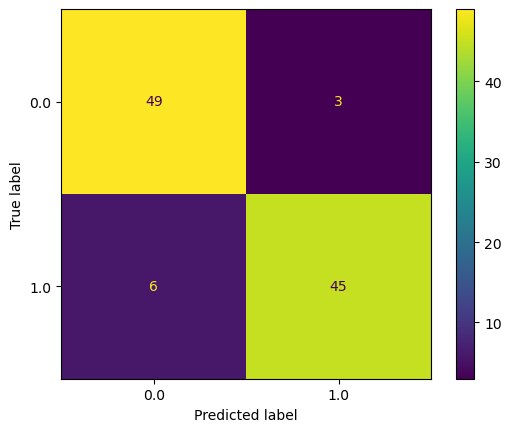

Train Accuracy score:  1.0
Validation Accuracy score:  0.939
Test Accuracy score:  0.9126
Test ROC_AUC score:  0.9712
Test Recall:  0.8824
Test Precision:  0.9375


Logistic Regression  Fold 2 

Confusion Matrix (test): 



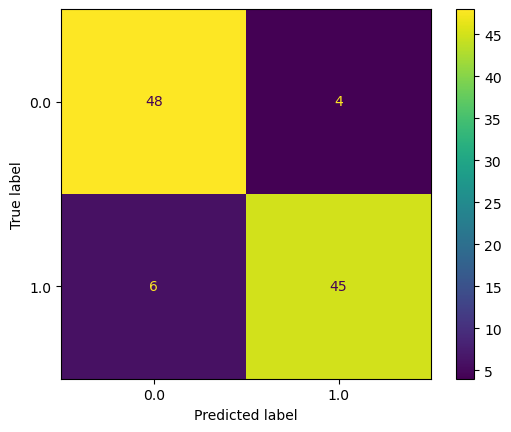

Train Accuracy score:  0.9817
Validation Accuracy score:  0.9268
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9502
Test Recall:  0.8824
Test Precision:  0.9184


XGBoost  Fold 2 

Confusion Matrix (test): 



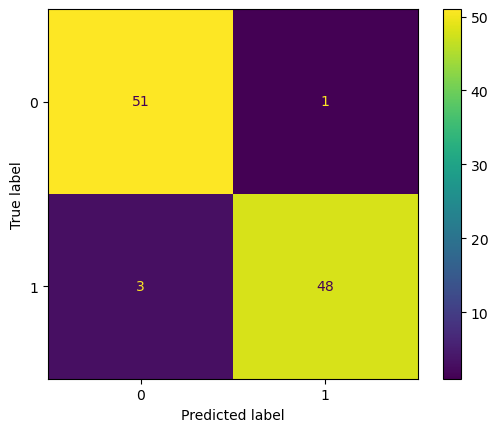

Train Accuracy score:  1.0
Validation Accuracy score:  0.9146
Test Accuracy score:  0.9612
Test ROC_AUC score:  0.9706
Test Recall:  0.9412
Test Precision:  0.9796


Naive Bayes  Fold 2 

Confusion Matrix (test): 



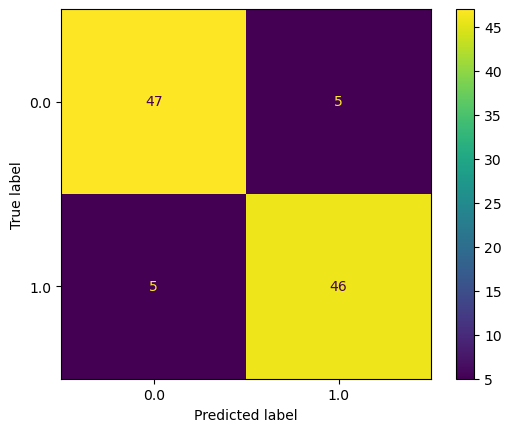

Train Accuracy score:  0.9266
Validation Accuracy score:  0.8902
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9348
Test Recall:  0.902
Test Precision:  0.902


Random Forest Classifier  Fold 3 

Confusion Matrix (test): 



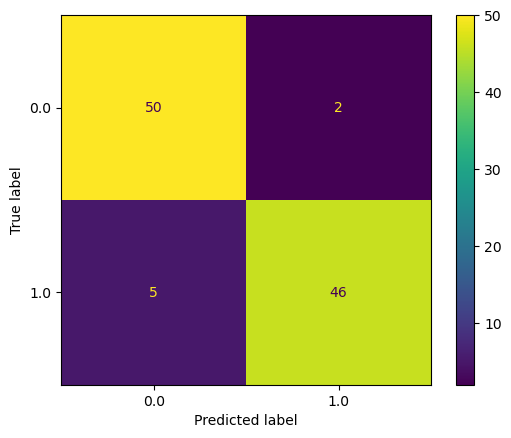

Train Accuracy score:  1.0
Validation Accuracy score:  0.9756
Test Accuracy score:  0.932
Test ROC_AUC score:  0.971
Test Recall:  0.902
Test Precision:  0.9583


Logistic Regression  Fold 3 

Confusion Matrix (test): 



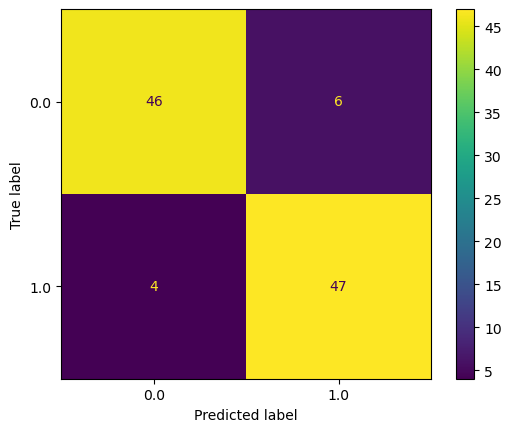

Train Accuracy score:  0.9847
Validation Accuracy score:  0.9756
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9642
Test Recall:  0.9216
Test Precision:  0.8868


XGBoost  Fold 3 

Confusion Matrix (test): 



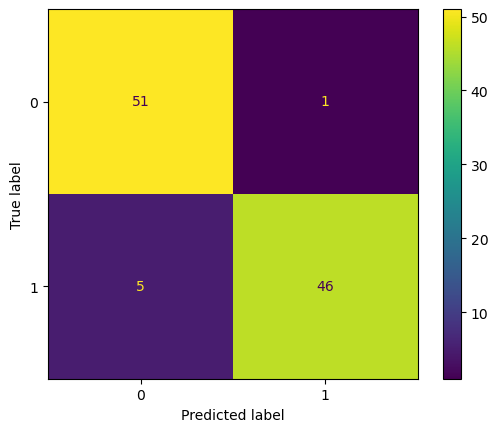

Train Accuracy score:  1.0
Validation Accuracy score:  0.9634
Test Accuracy score:  0.9417
Test ROC_AUC score:  0.9691
Test Recall:  0.902
Test Precision:  0.9787


Naive Bayes  Fold 3 

Confusion Matrix (test): 



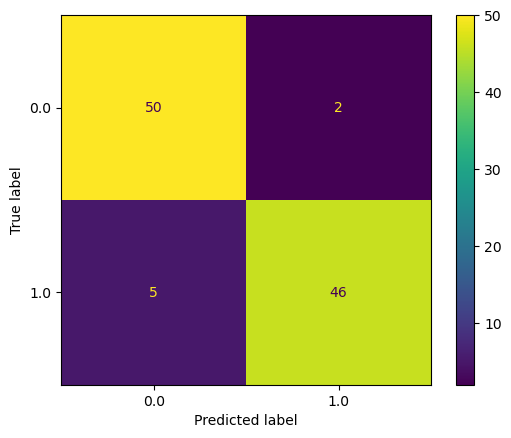

Train Accuracy score:  0.9113
Validation Accuracy score:  0.939
Test Accuracy score:  0.932
Test ROC_AUC score:  0.9702
Test Recall:  0.902
Test Precision:  0.9583


Random Forest Classifier  Fold 4 

Confusion Matrix (test): 



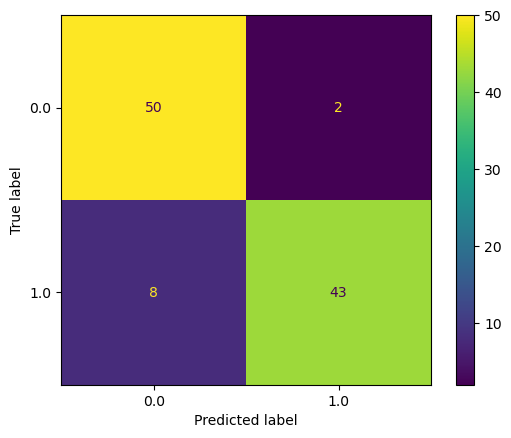

Train Accuracy score:  1.0
Validation Accuracy score:  0.9268
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9493
Test Recall:  0.8431
Test Precision:  0.9556


Logistic Regression  Fold 4 

Confusion Matrix (test): 



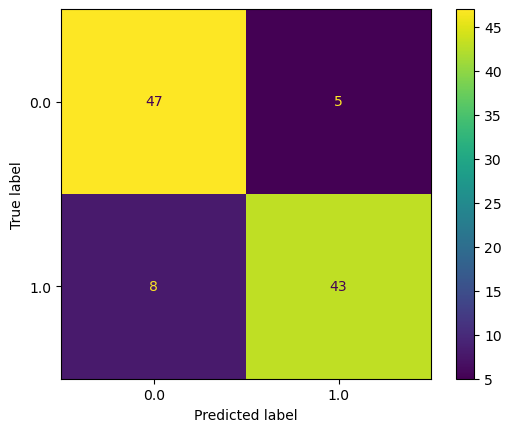

Train Accuracy score:  0.9878
Validation Accuracy score:  0.9146
Test Accuracy score:  0.8738
Test ROC_AUC score:  0.9231
Test Recall:  0.8431
Test Precision:  0.8958


XGBoost  Fold 4 

Confusion Matrix (test): 



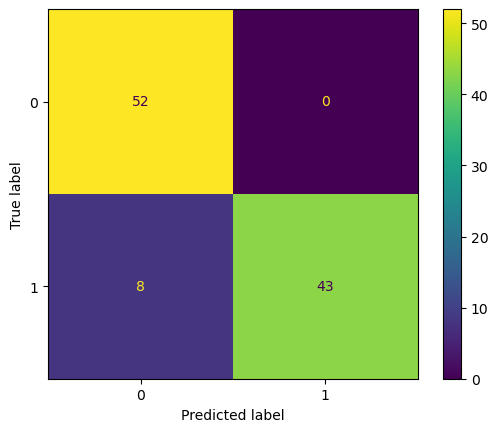

Train Accuracy score:  1.0
Validation Accuracy score:  0.9512
Test Accuracy score:  0.9223
Test ROC_AUC score:  0.9329
Test Recall:  0.8431
Test Precision:  1.0


Naive Bayes  Fold 4 

Confusion Matrix (test): 



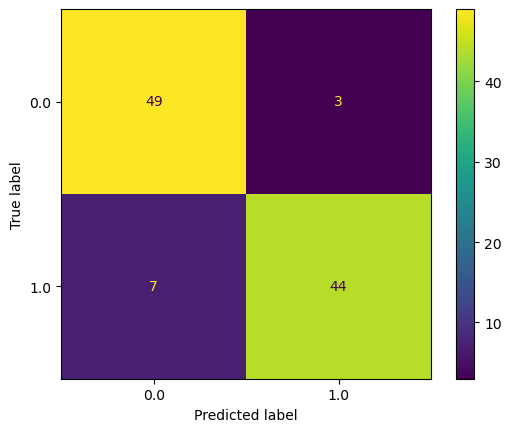

Train Accuracy score:  0.9235
Validation Accuracy score:  0.9146
Test Accuracy score:  0.9029
Test ROC_AUC score:  0.9351
Test Recall:  0.8627
Test Precision:  0.9362




In [120]:
# Model outputs for predicting outcome1 with oversampling and normalization
print("Model outputs for predicting outcome1 with oversampling and normalization")
outcome1_normalized_results = run_models(X_1n, y_1n, models, True)

In [121]:
print("Results for outcome1 after normalization and with SMOTE oversampling")
outcome1_results_normalized_df = pd.DataFrame.from_dict(outcome1_normalized_results)
outcome1_results_normalized_df

Results for outcome1 after normalization and with SMOTE oversampling


,Model,Accuracy (train),Accuracy (val),Accuracy (test),ROC Score (test),Recall (test),Precision (test),F1 Score (test)
0,Random Forest Classifier,1.00000,0.94632,0.91842,0.96612,0.87506,0.95742,0.914389
1,Logistic Regression,0.98290,0.91706,0.88544,0.94572,0.89450,0.87962,0.886998
2,XGBoost,1.00000,0.94388,0.93202,0.96004,0.89066,0.97090,0.929051
3,Naive Bayes,0.92292,0.90974,0.91260,0.93936,0.88682,0.93478,0.910169


The results between a dataset that is not normalized and one that is normalized are very similar, meaning the transformations did not have a significant impact on a model's predictive performance.

We now aim to answer whether any of the biomarkers (variables) have statistical power to detect the classes of outcome1 and outcome2. To do this, we use Welch's t-test to compute the mean of each variables' distribution for the two classes for each outcome. We use Welch's t-test since the sample sizes are different for both outcomes and even if there is equal variance, the results will be the same as if we did a student 2-sample t-test. The data for each variable is approximately normally distributed with no significant outliers (except for variable1 and variable4). 

# 4 - Variables to Detect Differences between Cases of Outcome1 and Outcome2 <a name="4"></a>

To determine which variables have enough statistical power, we utilize Welch's t-test for unequal variance to compare the means of the samples with negative cases for the outcome and the means of the samples with positive cases for the outcome. A p-value less than the significance level would indicate that the means of the two groups are different, meaning this variable can be used as an indicator for each outcome.

In [122]:
import scipy.stats as stats 

# Obtain samples for each group for each outcome
df_outcome1_1 = df_outcome1[df_outcome1['outcome1'] == 1]
df_outcome1_0 = df_outcome1[df_outcome1['outcome1'] == 0]

df_outcome2_1 = df_outcome1[df_outcome1['outcome2'] == 1]
df_outcome2_0 = df_outcome1[df_outcome1['outcome2'] == 0]

# Save results to dictionary for display later
d = {
    "Variable": [i for i in df.columns.tolist() if i not in ["outcome1", "outcome2"]],
    "Outcome1 T-Test p-value": [],
    "Outcome2 T-Test p-value": []
}

for col in d.get("Variable"):
    group1 = df_outcome1_1[col]
    group2 = df_outcome1_0[col]
    outcome1_pvalue = stats.ttest_ind(group1, group2, equal_var = False)[1]
    d.get("Outcome1 T-Test p-value").append(outcome1_pvalue)
    
    group1 = df_outcome2_1[col]
    group2 = df_outcome2_0[col]
    outcome2_pvalue = stats.ttest_ind(group1, group2, equal_var = False)[1]
    d.get("Outcome2 T-Test p-value").append(outcome2_pvalue)
    
df_ttest = pd.DataFrame.from_dict(d)

In [123]:
# Table containing p-values for T-test
df_ttest

,Variable,Outcome1 T-Test p-value,Outcome2 T-Test p-value
0,variable1,3.420326e-04,1.274703e-12
1,variable2,9.675611e-02,1.317560e-01
2,variable4,3.219381e-01,2.009893e-01
3,variable6,3.531676e-112,1.998779e-02
4,variable7,3.806708e-01,7.557858e-01
...,...,...,...
128,variable134,6.030701e-02,6.087453e-02
129,variable135,7.258453e-02,5.927751e-01
130,variable136,2.973781e-13,5.948905e-01
131,variable137,9.368765e-01,7.714188e-01


In [124]:
def significant_at(num):
    if num <= 0.001:
        return 0.001
    elif num <= 0.01:
        return 0.01
    elif num <= 0.05:
        return 0.05
    elif num <= 0.1:
        return 0.1
    else:
        return None
    
# Calculate which significance level each variable is significant at (0.001, 0.01, 0.05, 0.10)
df_ttest["Outcome1 Statistical Significance"] = df_ttest["Outcome1 T-Test p-value"].apply(lambda x: significant_at(x))
df_ttest["Outcome2 Statistical Significance"] = df_ttest["Outcome2 T-Test p-value"].apply(lambda x: significant_at(x))
print("Statistical Power of Variables at Different Levels of Significance")

IPython.display.HTML(df_ttest.to_html())


Statistical Power of Variables at Different Levels of Significance


,Variable,Outcome1 T-Test p-value,Outcome2 T-Test p-value,Outcome1 Statistical Significance,Outcome2 Statistical Significance
0,variable1,3.420326e-04,1.274703e-12,0.001,0.001
1,variable2,9.675611e-02,1.317560e-01,0.100,NaN
2,variable4,3.219381e-01,2.009893e-01,NaN,NaN
3,variable6,3.531676e-112,1.998779e-02,0.001,0.050
4,variable7,3.806708e-01,7.557858e-01,NaN,NaN
5,variable8,1.308646e-20,5.227602e-01,0.001,NaN
6,variable9,6.045666e-84,1.327276e-03,0.001,0.010
7,variable10,7.900271e-03,7.994447e-03,0.010,0.010
8,variable11,9.948055e-02,8.201259e-01,0.100,NaN
9,variable14,5.131080e-01,5.517354e-02,NaN,0.100


Let's see which variables are significiantly different between different classes of the outcomes when alpha = 0.05.

Variables with high statistical power for classes of outcome1 (a < 0.05)


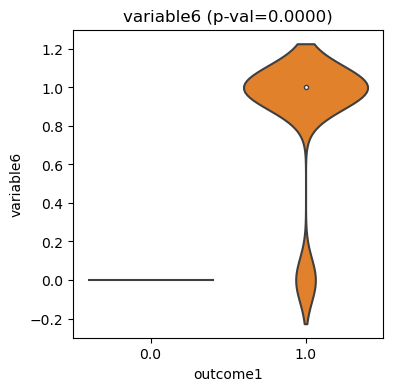

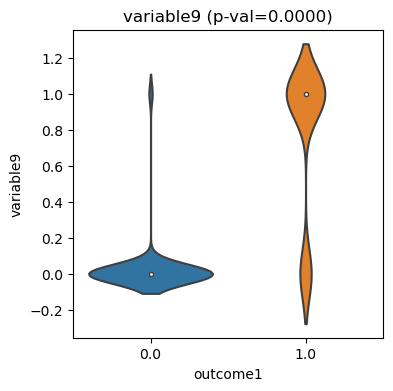

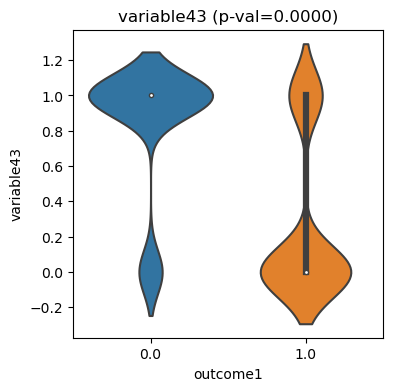

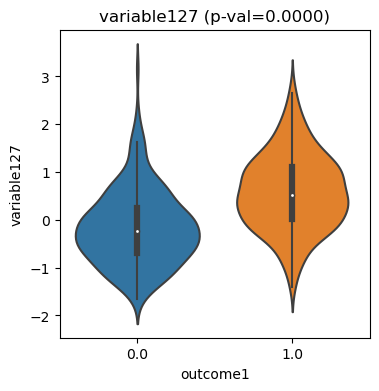

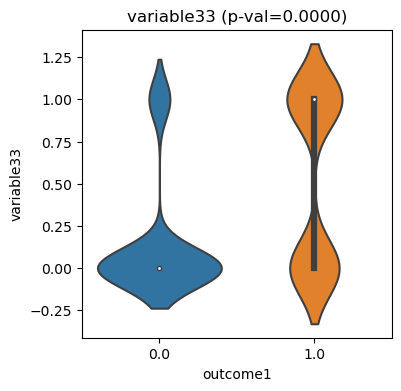

...

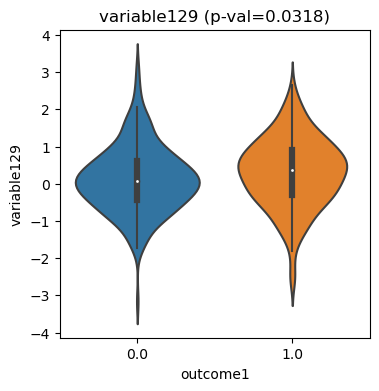

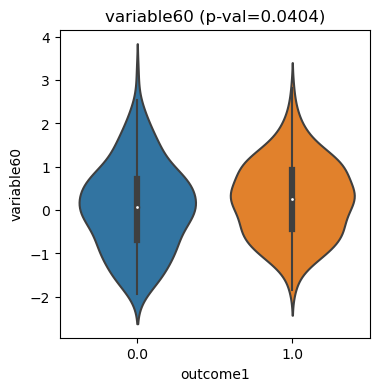

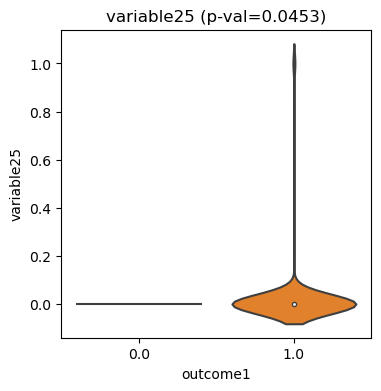

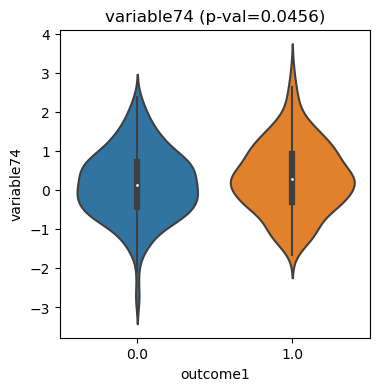

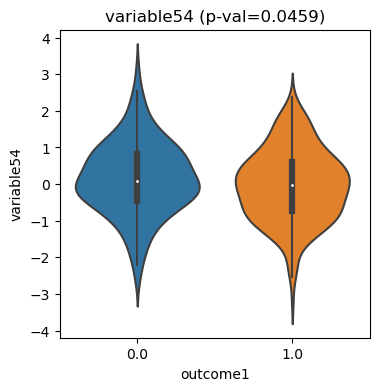

In [125]:
# Which variables are significant at a=0.05 for outcome1
df_significant_1 = df_ttest[df_ttest["Outcome1 Statistical Significance"] <= 0.05].sort_values(by=["Outcome1 T-Test p-value"])

print("Variables with high statistical power for classes of outcome1 (a < 0.05)")
for v in df_significant_1["Variable"]:
    fig, ax = plt.subplots(figsize=(4,4))
    sns.violinplot(data=df, x="outcome1", y=v, ax=ax)
    ax.set_title(f"{v} (p-val={'{:.4f}'.format(df_ttest[df_ttest['Variable'] == v].iloc[0]['Outcome1 T-Test p-value'])})")
    plt.show()

Variables with high statistical power for classes of outcome2 (a < 0.05)


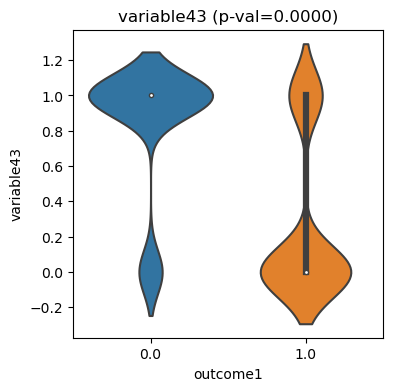

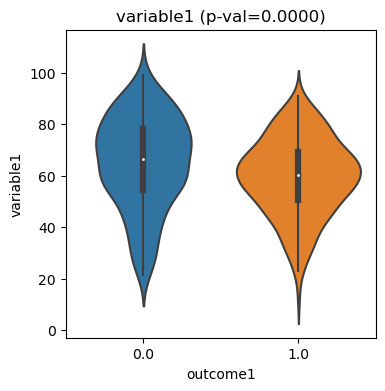

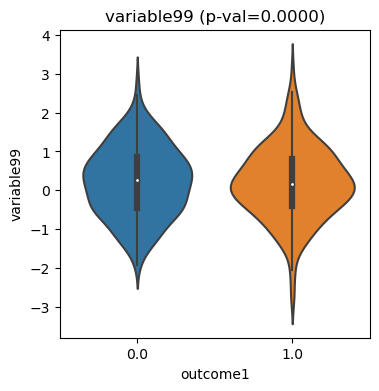

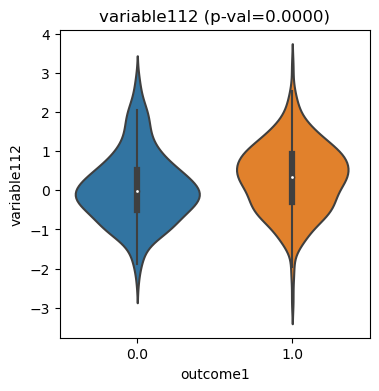

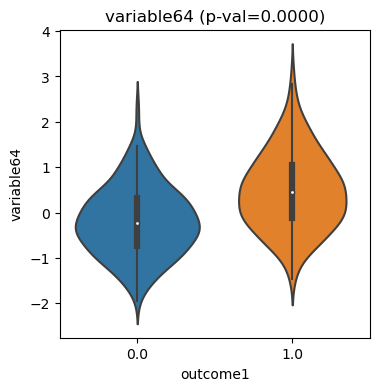

...

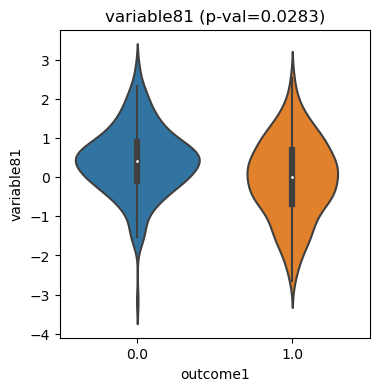

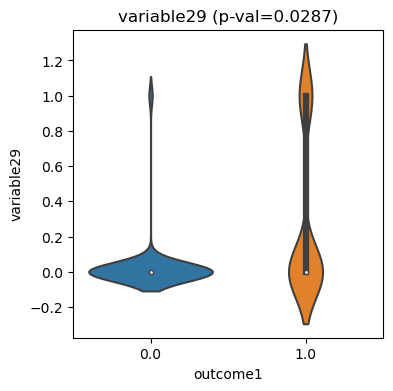

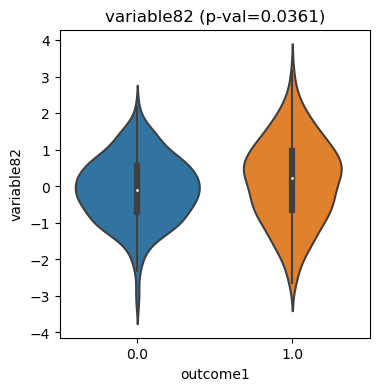

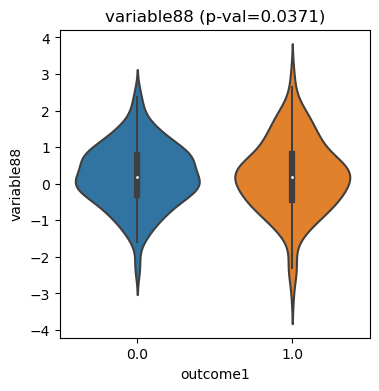

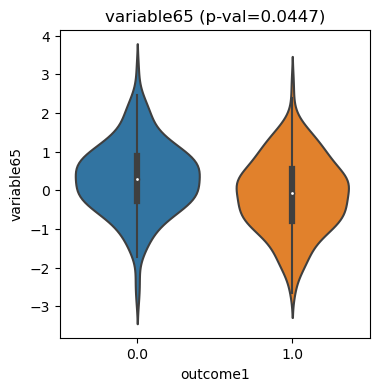

In [126]:
# Which variables are significant at a=0.05 for outcome2
df_significant_2 = df_ttest[df_ttest["Outcome2 Statistical Significance"] <= 0.05].sort_values(by=["Outcome2 T-Test p-value"])

print("Variables with high statistical power for classes of outcome2 (a < 0.05)")
for v in df_significant_2["Variable"]:
    fig, ax = plt.subplots(figsize=(4,4))
    sns.violinplot(data=df, x="outcome1", y=v, ax=ax)
    ax.set_title(f"{v} (p-val={'{:.4f}'.format(df_ttest[df_ttest['Variable'] == v].iloc[0]['Outcome2 T-Test p-value'])})")
    plt.show()

In [127]:
print(f"Num of variables with statistical power for detecting cases of outcome1 at 0.05: {len(df_significant_1['Variable'])}")
print('\n')
print(*df_significant_1["Variable"])
print('\n')
print(f"Num of variables with statistical power for detecting cases of outcome2 at 0.05: {len(df_significant_2['Variable'])}")
print('\n')
print(*df_significant_2["Variable"])

Num of variables with statistical power for detecting cases of outcome1 at 0.05: 85


variable6 variable9 variable43 variable127 variable33 variable8 variable125 variable58 variable64 variable55 variable29 variable94 variable76 variable59 variable136 variable31 variable108 variable36 variable53 variable130 variable39 variable109 variable103 variable119 variable41 variable96 variable138 variable37 variable30 variable132 variable81 variable104 variable77 variable57 variable116 variable113 variable46 variable32 variable65 variable28 variable49 variable72 variable83 variable100 variable62 variable98 variable91 variable51 variable40 variable105 variable23 variable1 variable86 variable71 variable101 variable34 variable111 variable121 variable63 variable27 variable45 variable112 variable68 variable47 variable52 variable89 variable61 variable117 variable16 variable10 variable82 variable22 variable73 variable92 variable67 variable56 variable84 variable20 variable24 variable122 variable129 varia

We see that there are 85 variables that have statistical power to detect differences between outcome1 cases at a=0.05. Similarly, there are 66 variables that have statistical power to detect differences between outcome2 cases at a=0.05. 

# 5 - Discussion <a name="5"></a>

In this data analysis question, we wanted to predict cases of outcome1 and outcome2 using 90 predictors. 

From this dataset, we were able to drop two columns due to the values being the same throughout the whole dataset and another column containing ID values. In addition, there were a total of 21 missing values in the dataset, 1 of which was from outcome2 and 9 were from outcome1. There appeared to be an association with the missing values of variable6 (total of 10) and outcome2 since all the outcome2 values for subjects with missing variable6 values were zero. We were able to impute the missing variable43 value with the median and the missing variable6 values with the mode of the distribution. Despite values missing from both outcomes, no subject had both outcomes missing. However, there is an unequal distribution of positive and negative cases for outcome2, where there are much fewer positive cases. The distribution of cases for otucome1 is approximately equal.

During our exploratory data analysis, we discovered that while most of the numerical variables are normally distributed or approximately normally distributed, variable1 and variable4 deviate the furthest from the rest of the variables. Using the Shapiro-Wilks test for normality, we found that the variables 1, 4, 53, 55, 56, 58, 59, 64, 72, 79, 127, and 135 are not normally distributed. After trying different transformations (log, inverse, Box-Cox, etc.), we found that variables 53, 58, 59, 64, and 135 became normally distributed after winsorizing the lower and upper one percentile and taking the Box-Cox transformation. 

Utilizing Point-Biserial Correlation for numerical variables and Chi-square tests for categorical variables, we found that there was a total of 82 variables that were associated with outcome1, 64 variables associated with outcome2, and 42 variables associated with both outcomes. A total of 128 variables were associated with neither outcome. 

Using this knowledge, we were able to construct and train 4 machine learning models (Random Forest, Logistic Regression, XGBoost, and Naïve Bayes). After standardizing variable1 and variable4 columns, we split the dataset into 80-20 train-test datasets and the train dataset into 80-20 train-validation datasets. We analyzed the effect of using SMOTE oversampling to counter the class imbalance of outcome2 values as well as Box-Cox transformations for the non-normally distributed variables. We found that the Random Forest and XGBoost classifiers performed the best for predicting both outcomes, with logistic regression coming second, and Naïve Bayes performing the worst. Using SMOTE oversampling improved the precision and recall scores for all the models considerably while normalization had little effect in any of the metrics.

We analyzed which variables had statistical power in detecting differences between the different cases of outcome1 and outcome2 for different levels of significance (0.001, 0.01, 0.05, 0.10). We used Welch’s T-test for Unequal Variances to compare the means of the samples with negative cases for the outcome and means of the samples with positive cases for the outcome, where a p-value less than the significance level indicates that the means of the two sample groups are different. A total of 85 variables and 66 variables were found to be significant at an alpha level a=0.05 for detecting the cases of outcome1 and outcome2, respectively.

# 6 - Future Direction <a name="6"></a>

After determining that Random Forest and XGBoost classifiers performed the best, conducting hyperparameter tuning of these models could have allowed us to generate even better results. However, because the metrics were already relatively high and the purpose of this analysis was not the machine learning aspect, we decided to use the basic model parameters. In addition, it would have been interesting to analyze whether one can predict both outcome1 and outcome2 at the same time using one model and whether the metrics would change. To do this, we could create a new outcome variable that represents outcome1 and outcome2 and run our models to predict this new variable, making this a multiclass classification task rather than a binary classification task. However, we found that the best models from our analysis performs the best out of the four models on predicting both outcomes, so this may not be necessary. It would be better if we could have more equal distributions of outcome2 cases so that we would not have to resort to oversampling, but positive cases of outcome2 could be a rare condition. 